In [1]:
#loading the MNIST dataset from keras.datasets module importthe mnist function
# which contains the mnist dataset already-vectorized, in Numpy format

from keras.datasets import fashion_mnist

# load_data() function will load the mnist data as a tuple into mnist_data variable
mnist_data = fashion_mnist.load_data()

4422102/4422102 [==============================] - 0s 0us/step


In [2]:
# split the  dataset into train and test
# initiazing 4 numpy array variables to hold
# the train and test independent(input) and dependent(output) data

(X_train, y_train),(X_test,y_test) = mnist_data

In [3]:
X_train[9]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          1,   1,   0,   0,   0,   0,   0,   0,   0, 164,  50,   0,   7,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   1,   0,   0,   1,   0,
          0,   1,   1,   0,   0,   5,   0,  45, 217, 255, 176,   0,   6,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   1,   1,   0,   3,
          3,   5,   9,   0,   2,   0,  62, 236, 231, 215,  27,   0,   1,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,  29, 244, 231, 234,  74,   0,   1,   0,
          0,   0],
       [  

In [4]:
print("Datatype of variable ",type(X_train[0]))
print("Single image dimension", X_train[0].shape)
print("training dataset dimension ",X_train.shape, y_train.shape)
print("testing ds dimension ", X_test.shape, y_test.shape)


Datatype of variable  <class 'numpy.ndarray'>
Single image dimension (28, 28)
training dataset dimension  (60000, 28, 28) (60000,)
testing ds dimension  (10000, 28, 28) (10000,)


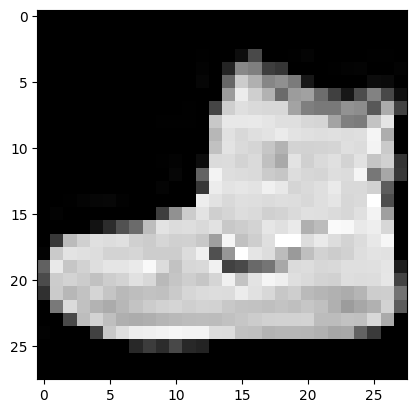

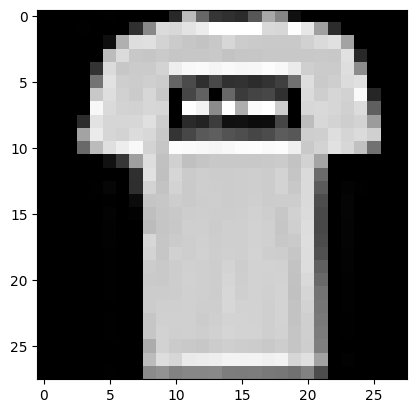

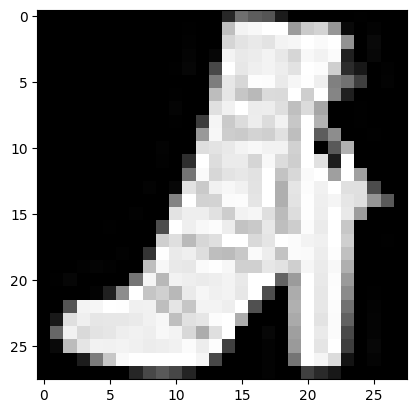

In [5]:
#display a asample image

import matplotlib.pyplot as plt
plt.imshow(X_train[0], cmap="gray"  )
plt.show()
plt.imshow(X_train[1], cmap="gray")
plt.show()

plt.imshow(X_train[11], cmap="gray")
plt.show()

In [6]:
# PRINt sample of corresponding text data
print(y_train[0])
print(y_train[1])
print(y_train[11])

9
0
9


In [7]:
from keras.models import Sequential, Model
from keras.layers import Input,Dense, Flatten, Reshape, LeakyReLU, BatchNormalization
from keras.optimizers import Adam
from keras.layers import Embedding, multiply,Dropout
# from keras.utils.vis_utils import plot_model
from tensorflow.keras.utils import plot_model
import numpy as np




# Defining model which will return model
# input=  noise and output = image generated

def mnist_cgan_generator(input_random_noise_shape, z_random_noise_vect_dim):

    #define sequetial model object
    mnist_cgan_generator_model = Sequential()

    #add fully connected input layer with 256neurons and random noise vector(latent space) as input
    mnist_cgan_generator_model.add(Dense(256, input_dim = z_random_noise_vect_dim ))
    #add hidden layer with leaky relu activation with learning rate as 0.2
    mnist_cgan_generator_model.add(LeakyReLU(alpha =0.2))
    #add batch normalization
    mnist_cgan_generator_model.add(BatchNormalization(momentum = 0.8))


     #add fully connected input layer with 512 neurons and random noise vector(latent space) as input
    mnist_cgan_generator_model.add(Dense(512 ))
    #add hidden layer with leaky relu activation with learning rate as 0.2
    mnist_cgan_generator_model.add(LeakyReLU(alpha =0.2))
    #add batch normalization
    mnist_cgan_generator_model.add(BatchNormalization(momentum = 0.8))

     #add fully connected input layer with 1024 neurons and random noise vector(latent space) as input
    mnist_cgan_generator_model.add(Dense(1024 ))
    #add hidden layer with leaky relu activation with learning rate as 0.2
    mnist_cgan_generator_model.add(LeakyReLU(alpha =0.2))
    #add batch normalization
    mnist_cgan_generator_model.add(BatchNormalization(momentum = 0.8))


    #add output layer with tanh activation function which outputs a 784 length tensor
    mnist_cgan_generator_model.add(Dense(28*28*1, activation = 'tanh'))

    #reshape the output to input_img_shape dimensions
    mnist_cgan_generator_model.add(Reshape(input_random_noise_shape))

    #retrn the model
    return mnist_cgan_generator_model


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 embedding (Embedding)          (None, 1, 100)       1000        ['input_2[0][0]']                
                                                                                                  
 input_1 (InputLayer)           [(None, 100)]        0           []                               
                                                                                                  
 flatten (Flatten)              (None, 100)          0           ['embedding[0][0]']              
                                                                                              

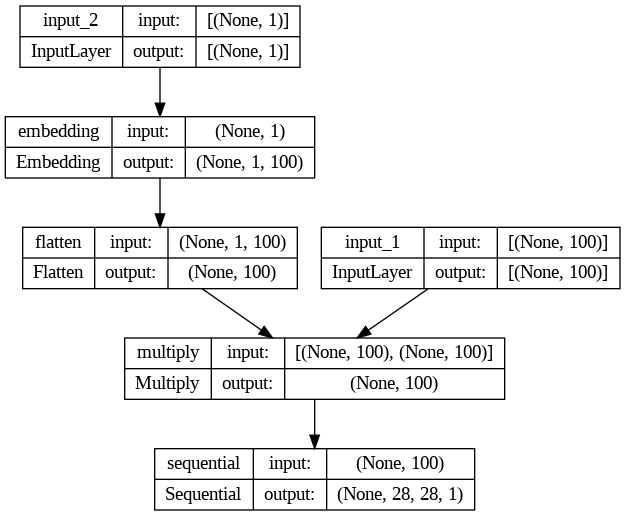

In [8]:
#just testing the generator model definition function
mnist_cgan_generator_model = mnist_cgan_generator((28,28,1),100)

# label embeding with CGAN
random_noise_vector = Input(shape= (100,)) #random noise with latent dimension 100
conditioning_label = Input(shape=(1,),dtype = 'int32') #conditioninng label(an int from 0 to 9)

# turn conditioning label into dense vectors of the latent dimension
# size using keras embedding layer
#10 no.  of classes and 100 latent dimensions of  random noise
#convert embedded 3D tensor into 2D tensor using Flatten()
conditioning_label_embeddding = Flatten()(Embedding(10,100)(conditioning_label))

# combine the label embeding with the noise vector into a joint
# representation by using the keras Multiply layer
# it multiplies two equal-length vectors and outputs a single vector
# which is the element -wise product of the random_noise_vector and label_embedding
joint_representation = multiply([random_noise_vector, conditioning_label_embeddding])

# joined representation used as input into the CGAN generator network
#which generates the image for the given label in joint representation
generated_img = mnist_cgan_generator_model(joint_representation)

# create a new cgan generator model with these parameters(functional model)
mnist_cgan_generator_model = Model([random_noise_vector, conditioning_label], generated_img)


# Summary of the model
print(mnist_cgan_generator_model.summary())
plot_model(mnist_cgan_generator_model, to_file = 'cgan_generator_plot.png', show_shapes =True, show_layer_names= True)

#how the summary has been calculated

# param# = 256*100(100 for random noise given as input) +256(for bias) = 25856 parameters (weights, bias)
# param# = 784 *128(128 as input from previous layer) +784(for bias) = 101136


In [9]:
#defining Discriminator function
# Defining model which will return model

# input = imgae with shape 28*28
# output = probab

def mnist_cgan_Discriminator(input_img_shape):

    #define sequetial model object
    mnist_cgan_Discriminator_model = Sequential()

    #flattening the image so that it can be fed to neural network as input
    mnist_cgan_Discriminator_model.add(Dense(512, input_dim =np.prod( input_img_shape)))
    mnist_cgan_Discriminator_model.add(LeakyReLU(alpha =0.2))

    #add fully connected input layer with 512 neurons
    mnist_cgan_Discriminator_model.add(Dense(512))
    mnist_cgan_Discriminator_model.add(LeakyReLU(alpha =0.2))
    mnist_cgan_Discriminator_model.add(Dropout(0.4))

    #add fully connected input layer with 512 neurons
    mnist_cgan_Discriminator_model.add(Dense(512))
    mnist_cgan_Discriminator_model.add(LeakyReLU(alpha =0.2))
    mnist_cgan_Discriminator_model.add(Dropout(0.4))


    #add output layer with sigmoid activation function which outputs probability
    mnist_cgan_Discriminator_model.add(Dense(1, activation = 'sigmoid'))



    #retrn the model
    return mnist_cgan_Discriminator_model



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 512)               401920    
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 512)               262656    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 512)               0         
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 512)               262656    
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 512)              

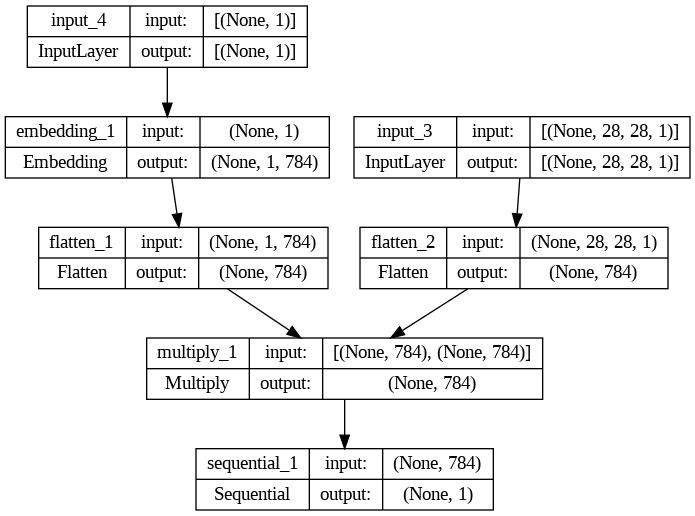

In [10]:
# testing discriminator model definition function
mnist_cgan_Discriminator_model = mnist_cgan_Discriminator((28,28,1))
mnist_cgan_Discriminator_model.summary()


#shape of input image
input_img = Input(shape= (28,28,1))
conditioning_label = Input(shape=(1,),dtype = 'int32') #conditioninng label(an int from 0 to 9)

# embed the conditioning label into a vector of the same size as that of
# image size
#10 no.  of classes and 100 latent dimensions of  random noise
#convert embedded 3D tensor into 2D tensor using Flatten()
conditioning_label_embeddding = Flatten()(Embedding(10,np.prod((28,28,1)))(conditioning_label))


# flattent the input image
flat_input_img = Flatten()(input_img)
# element -wise product of the flat_input_image and label_embedding
joint_representation = multiply([flat_input_img, conditioning_label_embeddding])

# generate the classification probability using the joint_representation
classification = mnist_cgan_Discriminator_model(joint_representation)

# create a new cgan generator model with these parameters(functional model)
mnist_cgan_Discriminator_model = Model([input_img, conditioning_label], classification)


# Summary of the model
print(mnist_cgan_Discriminator_model.summary())
plot_model(mnist_cgan_Discriminator_model, to_file = 'cgan_Discriminator_plot.png', show_shapes =True, show_layer_names= True)

#how the summary has been calculated




# Generating Combined model

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 embedding (Embedding)          (None, 1, 100)       1000        ['input_2[0][0]']                
                                                                                                  
 input_1 (InputLayer)           [(None, 100)]        0           []                               
                                                                                                  
 flatten (Flatten)              (None, 100)          0           ['embedding[0][0]']              
                                                                                              

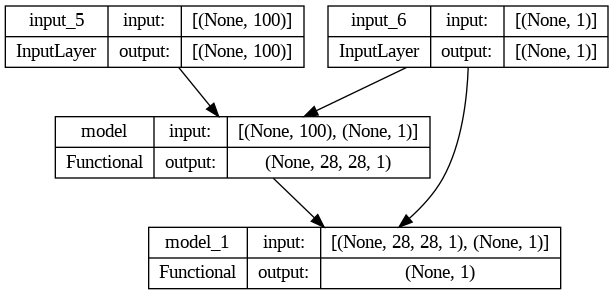

In [11]:
# compile the gan discrminator using binary cross entropy loss and adam optimizer
mnist_cgan_Discriminator_model.compile(loss = "binary_crossentropy", optimizer = Adam(0.0002, 0.5),metrics = ['accuracy'])

#keep the discriminator non trainable during training of generator
mnist_cgan_Discriminator_model.trainable = False
random_noise_vector = Input(shape = (100,)) #random noise with latent dimension 100
conditioning_label = Input(shape = (1,))

# create an input image
input_img = Input(shape =(28,28,1)) #the shape of inpu image

# random noise vector and conditioned label used as input to generateor which generates the image
generated_img = mnist_cgan_generator_model([random_noise_vector, conditioning_label])

# generates the classification (fake or real) for the given label and image
classification = mnist_cgan_Discriminator_model([generated_img, conditioning_label])

# builds and compiles CGAN model with fixed discriminator to train the genrator
mnist_cgan_combined_model = Model([random_noise_vector, conditioning_label], classification)
mnist_cgan_combined_model.compile(loss = "binary_crossentropy",optimizer = Adam(0.0002,0.5))

print(mnist_cgan_generator_model.summary())
plot_model(mnist_cgan_combined_model, to_file = 'cgan_combined_model.png',show_shapes =True, show_layer_names = True)

# Training the discriminator

In [15]:
# Overall code ffor trainig of GAN

#for understanding the code directly move to
# next to next block uncomment then go through each lines

import numpy as np


# define the global arrays for holding the metrics and number of iteration
loss_list =[]
accuracy_list =[]
iteration_list =[]

# define function to plot the graph
def plot_progress(accuracy_list, loss_list):
    plt.plot(accuracy_list)
    plt.plot(loss_list[0])
    plt.title("Accuracy and loss vs no. of iterations ")
    plt.ylabel("loss & accuracy")
    plt.xlabel("no. of epochs")
    plt.legend(["acccuracy","loss"],loc ="upper right" )
    plt.show()


# function to plot generated image as 2X5 matrix

def sample_images(mnist_gan_generator_model):
    #generate random noise vector with size 100 with 4 rows and 4 col
    #of image grid

    z_random_noise_vector = np.random.normal(0,1,(2*5,100))

    #creat ordered sample labels
    sample_labels = np.arange(0,10).reshape(-1,1)
    #pass the generated noise into trained generator to generate synthetic images
    generated_images = mnist_gan_generator_model.predict([z_random_noise_vector,sample_labels])

    #rescale the pixel values between 0 and 1 to be displayed by matplotlib
    generated_images = 0.5*generated_images +0.5

    figure, axes = plt.subplots(2,5)
    counter = 0

    #defining two for loops ine for row and one for column
    for i in range(2):
        for j in range(5):
            axes[i, j].imshow(generated_images[counter, :, :, 0],cmap = 'gray')
            axes[i, j].set_title("Label: %d" %sample_labels[counter])
            axes[i,j].axis('off')
            counter +=1

    plt.show()


In [16]:



# define the function for training
def train_cgan():
    #define hyperparameters
    no_of_iterations = 19000  #number of cycles for training
    batch_size = 128     #no. of images supplied at a time for training

    #power of 2 is used because of the way computr
    #memory works in CPU, GPU and in general

    sample_gap = 100    #sample interval for printing the log

    #load_data() fn will return the mnist daaset as a tuple
    mnist_data = fashion_mnist.load_data()
    #split the tuple with four numpy arrayss train/test input/output data
    (X_train, y_train),(X_test, y_test) = mnist_data


    # to match the tanh activation function of generator o/p,
    # we have to train the discriminator also with the same range, So rescaling
    X_train = X_train/127.5 - 1


    #create a 3d numpy array to hold the height, width and the multiple samples
    X_train = np.expand_dims(X_train, axis= 3)
    # 1 additional axis is for multiple images stacked over one another


    # create labels for real and fake image for discriminator
    real_img_labels = np.ones((batch_size,1))
    fake_img_labels = np.zeros((batch_size,1))    #(batch_size,1) this is a 2D array each row represents a batch item and there is a single column

    #define a for loop  to run till the number of iterations are defined
    for num in range(no_of_iterations):


        #get a batch of real images based on the batch size from the
        #preprocessed dataset shuffled randomly

        random_integers = np.random.randint(0,X_train.shape[0], batch_size)
        # generate random number in range 0 to 60000 and
        # number of time u have to generate is batch_size

        real_image = X_train[random_integers]
        real_label= y_train[random_integers]
        #train the discriminator with real images and get the loss and accuracy value
        discriminator_realimg_loss_acccuracy = mnist_cgan_Discriminator_model.train_on_batch([real_image,real_label],real_img_labels)

        z_random_noise_vector = np.random.normal(0,1,(batch_size, 100))
        #the nise generated will  be used by generator to generate fake images

        #getting a batch of fake images from random noise vector
        fake_generated_img = mnist_cgan_generator_model.predict([z_random_noise_vector,real_label])

        #train the discriminator with real images and get the loss and accuracy value
        discriminator_fakeimg_loss_acccuracy = mnist_cgan_Discriminator_model.train_on_batch([fake_generated_img,real_label],fake_img_labels)

        #finding the average loss and accuracy value by dividing the total real
        #and fake values with 2

        discriminator_loss, discriminator_accuracy = 0.5*(np.add(discriminator_realimg_loss_acccuracy,discriminator_fakeimg_loss_acccuracy))

        #creae a random noise, a 100 element vector 0f gaussian random numbers with
        #size of 128(batch_size) rows and 100 columns with 0 as means and 1 as SD

        z_random_noise_vector= np.random.normal(0,1,(batch_size,100))
#         create random ssample labels
        sample_labels = np.random.randint(0,10,batch_size).reshape(-1,1)

        generator_loss = mnist_cgan_combined_model.train_on_batch([z_random_noise_vector,sample_labels],real_img_labels)

        #just printing the data returned by btrain on batch for every iteration
        #print("Iteration : %d, Discriminator loss: %.2f,Discriminator Accuracy: %.2f,Generator loss: %.2f "%(num +1,discriminator_loss,discriminator_accuracy*100,generator_loss))

        print("Iteration : %d"%(num +1))

        #to save the log and to print and plot the saved log points at regular intervals
        if (num+1)%sample_gap == 0:
            #save the loss accuracy and number of iteration during that sample interval
            loss_list.append((discriminator_loss, generator_loss))
            accuracy_list.append( discriminator_accuracy *100)
            iteration_list.append(num+1)

            #print the progress
            print("Iteration : %d, Discriminator loss: %.2f,Discriminator Accuracy: %.2f,Generator loss: %.2f "%(num +1,discriminator_loss,discriminator_accuracy*100,generator_loss))


            #plot the graph after every batch
            plot_progress(accuracy_list, loss_list )

            #plot the sample images as 4x4 matrix after every batch
            sample_images(mnist_cgan_generator_model)

            #serialize the generator model structure on every sample gap
            model_json = mnist_cgan_generator_model.to_json()

            #save the serialized json to 'saved_models' folder
            with open("saved_models/cgan_fashion_model.json",'w') as json_file:
                json_file.write(model_json)

            #serialize the weights of the generator model as hdf5 file on every sample gap
            mnist_cgan_generator_model.save_weights("saved_models/cgan_fashion_model_weights.h5")
            print("The model structure and weights were saved. ")


4/4 [==============================] - 0s 4ms/step
Iteration : 1
4/4 [==============================] - 0s 4ms/step
Iteration : 2
4/4 [==============================] - 0s 3ms/step
Iteration : 3
4/4 [==============================] - 0s 3ms/step
Iteration : 4
4/4 [==============================] - 0s 3ms/step
Iteration : 5
4/4 [==============================] - 0s 3ms/step
Iteration : 6
4/4 [==============================] - 0s 3ms/step
Iteration : 7
4/4 [==============================] - 0s 3ms/step
Iteration : 8
4/4 [==============================] - 0s 3ms/step
Iteration : 9
4/4 [==============================] - 0s 3ms/step
Iteration : 10
4/4 [==============================] - 0s 2ms/step
Iteration : 11
4/4 [==============================] - 0s 6ms/step
Iteration : 12
4/4 [==============================] - 0s 3ms/step
Iteration : 13
4/4 [==============================] - 0s 3ms/step
Iteration : 14
4/4 [==============================] - 0s 3ms/step
Iteration : 15
4/4 [==============

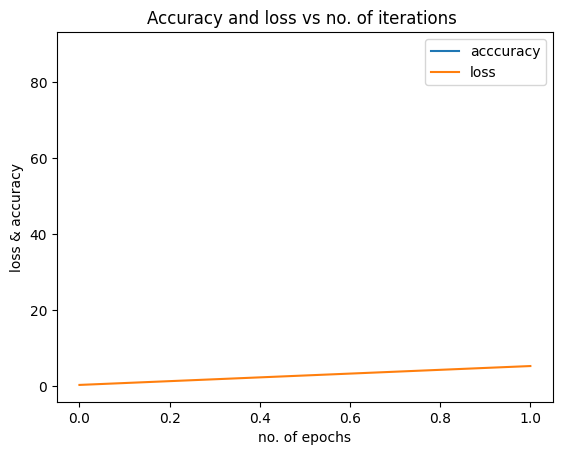

1/1 [==============================] - 0s 32ms/step


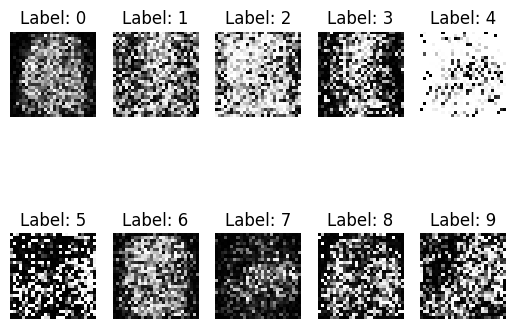

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 101
4/4 [==============================] - 0s 3ms/step
Iteration : 102
4/4 [==============================] - 0s 4ms/step
Iteration : 103
4/4 [==============================] - 0s 3ms/step
Iteration : 104
4/4 [==============================] - 0s 4ms/step
Iteration : 105
4/4 [==============================] - 0s 3ms/step
Iteration : 106
4/4 [==============================] - 0s 3ms/step
Iteration : 107
4/4 [==============================] - 0s 3ms/step
Iteration : 108
4/4 [==============================] - 0s 3ms/step
Iteration : 109
4/4 [==============================] - 0s 3ms/step
Iteration : 110
4/4 [==============================] - 0s 3ms/step
Iteration : 111
4/4 [==============================] - 0s 3ms/step
Iteration : 112
4/4 [==============================] - 0s 3ms/step
Iteration : 113
4/4 [==============================] - 0s 3ms/step
Iteration : 114
4/4 [============

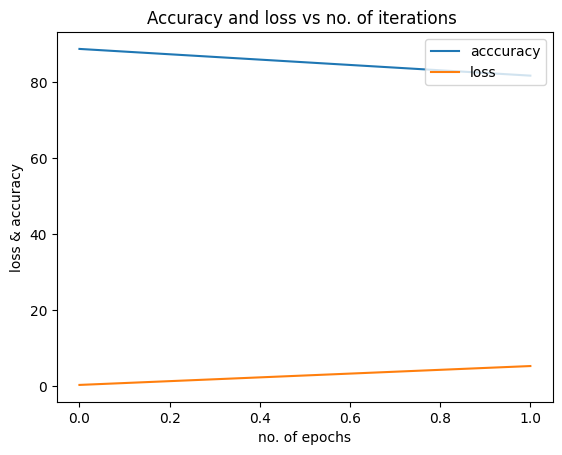

1/1 [==============================] - 0s 20ms/step


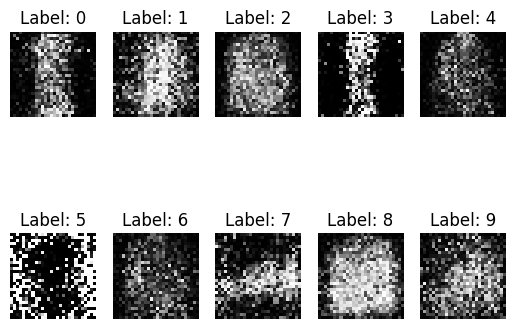

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 201
4/4 [==============================] - 0s 4ms/step
Iteration : 202
4/4 [==============================] - 0s 3ms/step
Iteration : 203
4/4 [==============================] - 0s 3ms/step
Iteration : 204
4/4 [==============================] - 0s 3ms/step
Iteration : 205
4/4 [==============================] - 0s 4ms/step
Iteration : 206
4/4 [==============================] - 0s 3ms/step
Iteration : 207
4/4 [==============================] - 0s 3ms/step
Iteration : 208
4/4 [==============================] - 0s 3ms/step
Iteration : 209
4/4 [==============================] - 0s 3ms/step
Iteration : 210
4/4 [==============================] - 0s 3ms/step
Iteration : 211
4/4 [==============================] - 0s 3ms/step
Iteration : 212
4/4 [==============================] - 0s 4ms/step
Iteration : 213
4/4 [==============================] - 0s 4ms/step
Iteration : 214
4/4 [============

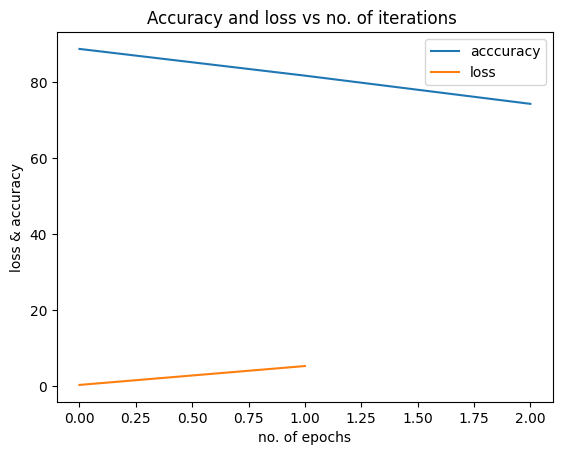

1/1 [==============================] - 0s 20ms/step


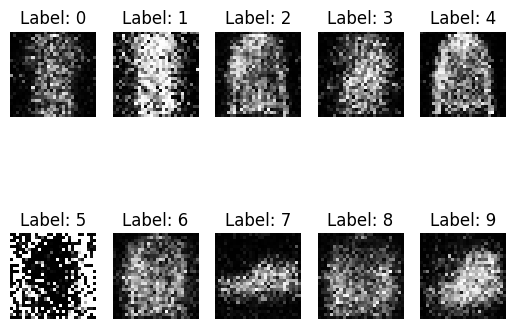

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 301
4/4 [==============================] - 0s 4ms/step
Iteration : 302
4/4 [==============================] - 0s 7ms/step
Iteration : 303
4/4 [==============================] - 0s 3ms/step
Iteration : 304
4/4 [==============================] - 0s 4ms/step
Iteration : 305
4/4 [==============================] - 0s 5ms/step
Iteration : 306
4/4 [==============================] - 0s 3ms/step
Iteration : 307
4/4 [==============================] - 0s 3ms/step
Iteration : 308
4/4 [==============================] - 0s 3ms/step
Iteration : 309
4/4 [==============================] - 0s 3ms/step
Iteration : 310
4/4 [==============================] - 0s 3ms/step
Iteration : 311
4/4 [==============================] - 0s 3ms/step
Iteration : 312
4/4 [==============================] - 0s 3ms/step
Iteration : 313
4/4 [==============================] - 0s 3ms/step
Iteration : 314
4/4 [============

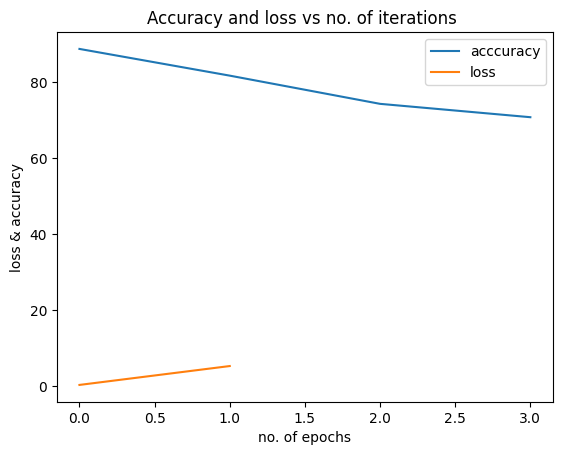

1/1 [==============================] - 0s 18ms/step


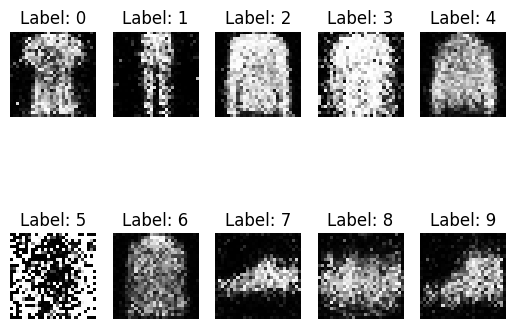

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 401
4/4 [==============================] - 0s 4ms/step
Iteration : 402
4/4 [==============================] - 0s 3ms/step
Iteration : 403
4/4 [==============================] - 0s 4ms/step
Iteration : 404
4/4 [==============================] - 0s 4ms/step
Iteration : 405
4/4 [==============================] - 0s 3ms/step
Iteration : 406
4/4 [==============================] - 0s 4ms/step
Iteration : 407
4/4 [==============================] - 0s 4ms/step
Iteration : 408
4/4 [==============================] - 0s 3ms/step
Iteration : 409
4/4 [==============================] - 0s 4ms/step
Iteration : 410
4/4 [==============================] - 0s 4ms/step
Iteration : 411
4/4 [==============================] - 0s 3ms/step
Iteration : 412
4/4 [==============================] - 0s 3ms/step
Iteration : 413
4/4 [==============================] - 0s 3ms/step
Iteration : 414
4/4 [============

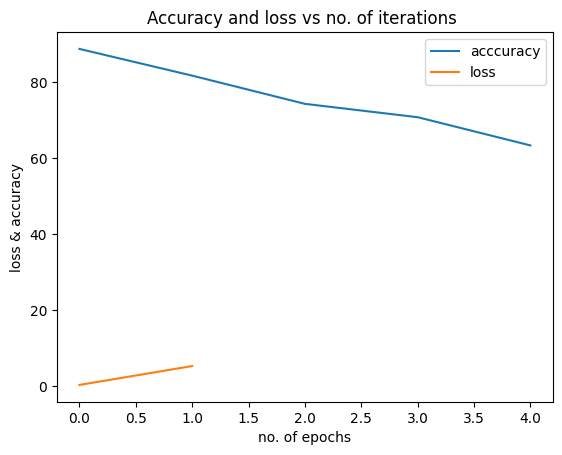

1/1 [==============================] - 0s 19ms/step


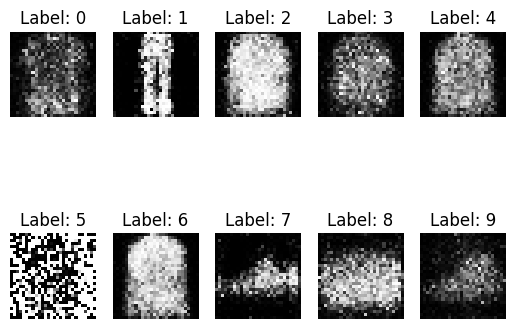

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 501
4/4 [==============================] - 0s 4ms/step
Iteration : 502
4/4 [==============================] - 0s 4ms/step
Iteration : 503
4/4 [==============================] - 0s 4ms/step
Iteration : 504
4/4 [==============================] - 0s 3ms/step
Iteration : 505
4/4 [==============================] - 0s 4ms/step
Iteration : 506
4/4 [==============================] - 0s 3ms/step
Iteration : 507
4/4 [==============================] - 0s 3ms/step
Iteration : 508
4/4 [==============================] - 0s 6ms/step
Iteration : 509
4/4 [==============================] - 0s 4ms/step
Iteration : 510
4/4 [==============================] - 0s 4ms/step
Iteration : 511
4/4 [==============================] - 0s 3ms/step
Iteration : 512
4/4 [==============================] - 0s 4ms/step
Iteration : 513
4/4 [==============================] - 0s 3ms/step
Iteration : 514
4/4 [============

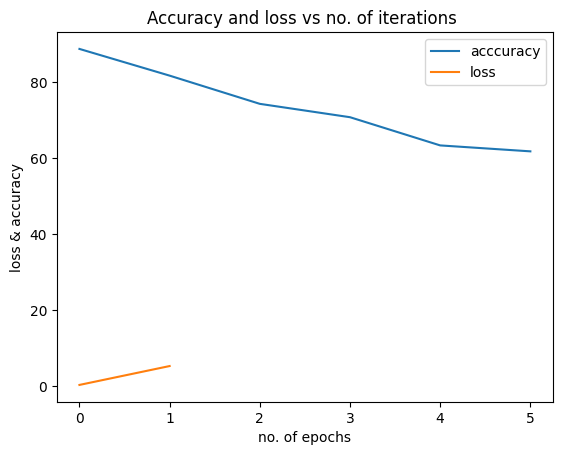

1/1 [==============================] - 0s 19ms/step


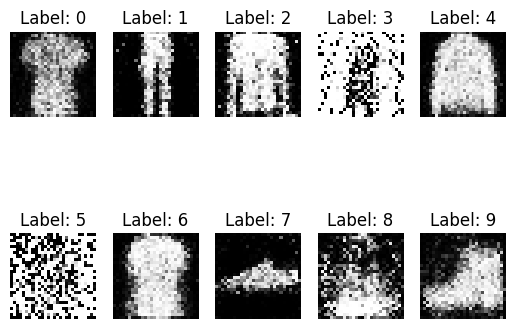

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 601
4/4 [==============================] - 0s 4ms/step
Iteration : 602
4/4 [==============================] - 0s 4ms/step
Iteration : 603
4/4 [==============================] - 0s 5ms/step
Iteration : 604
4/4 [==============================] - 0s 5ms/step
Iteration : 605
4/4 [==============================] - 0s 3ms/step
Iteration : 606
4/4 [==============================] - 0s 4ms/step
Iteration : 607
4/4 [==============================] - 0s 5ms/step
Iteration : 608
4/4 [==============================] - 0s 3ms/step
Iteration : 609
4/4 [==============================] - 0s 5ms/step
Iteration : 610
4/4 [==============================] - 0s 5ms/step
Iteration : 611
4/4 [==============================] - 0s 4ms/step
Iteration : 612
4/4 [==============================] - 0s 3ms/step
Iteration : 613
4/4 [==============================] - 0s 3ms/step
Iteration : 614
4/4 [============

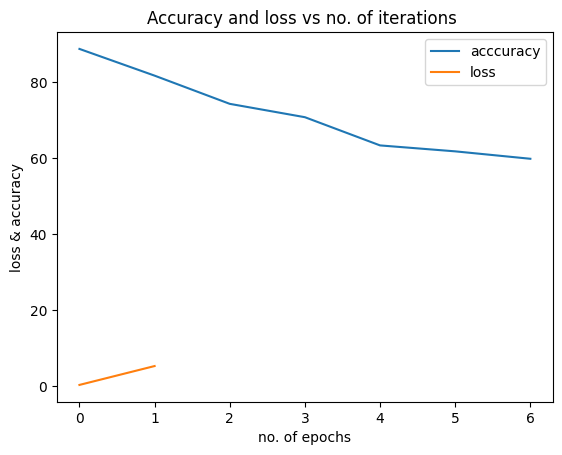

1/1 [==============================] - 0s 20ms/step


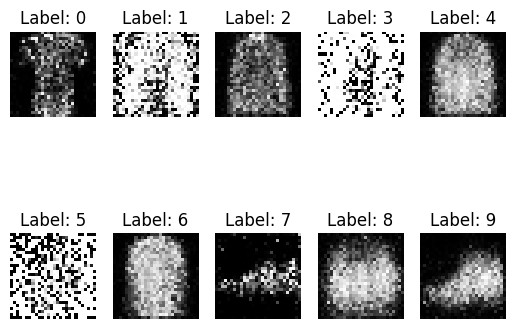

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 701
4/4 [==============================] - 0s 4ms/step
Iteration : 702
4/4 [==============================] - 0s 3ms/step
Iteration : 703
4/4 [==============================] - 0s 5ms/step
Iteration : 704
4/4 [==============================] - 0s 5ms/step
Iteration : 705
4/4 [==============================] - 0s 5ms/step
Iteration : 706
4/4 [==============================] - 0s 3ms/step
Iteration : 707
4/4 [==============================] - 0s 4ms/step
Iteration : 708
4/4 [==============================] - 0s 4ms/step
Iteration : 709
4/4 [==============================] - 0s 4ms/step
Iteration : 710
4/4 [==============================] - 0s 5ms/step
Iteration : 711
4/4 [==============================] - 0s 6ms/step
Iteration : 712
4/4 [==============================] - 0s 5ms/step
Iteration : 713
4/4 [==============================] - 0s 5ms/step
Iteration : 714
4/4 [============

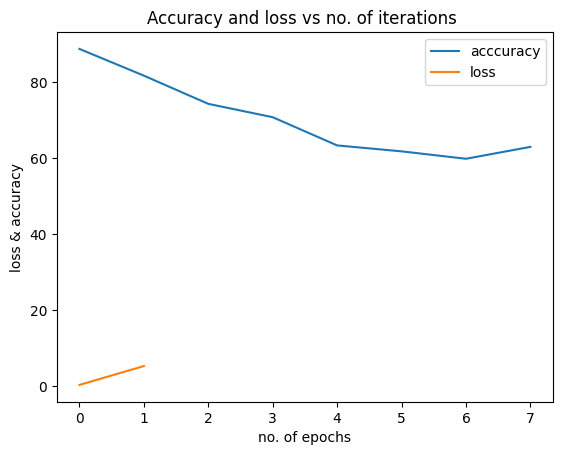

1/1 [==============================] - 0s 31ms/step


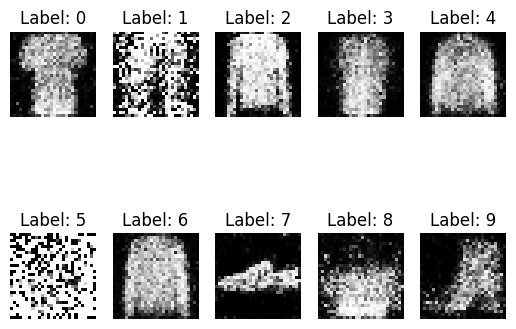

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 801
4/4 [==============================] - 0s 4ms/step
Iteration : 802
4/4 [==============================] - 0s 2ms/step
Iteration : 803
4/4 [==============================] - 0s 3ms/step
Iteration : 804
4/4 [==============================] - 0s 3ms/step
Iteration : 805
4/4 [==============================] - 0s 5ms/step
Iteration : 806
4/4 [==============================] - 0s 5ms/step
Iteration : 807
4/4 [==============================] - 0s 4ms/step
Iteration : 808
4/4 [==============================] - 0s 3ms/step
Iteration : 809
4/4 [==============================] - 0s 4ms/step
Iteration : 810
4/4 [==============================] - 0s 6ms/step
Iteration : 811
4/4 [==============================] - 0s 4ms/step
Iteration : 812
4/4 [==============================] - 0s 5ms/step
Iteration : 813
4/4 [==============================] - 0s 4ms/step
Iteration : 814
4/4 [============

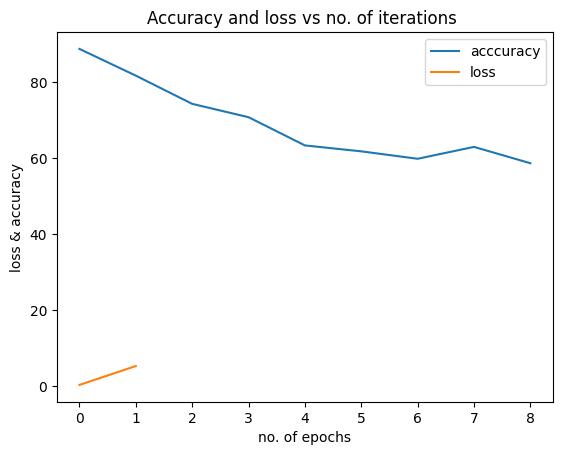

1/1 [==============================] - 0s 22ms/step


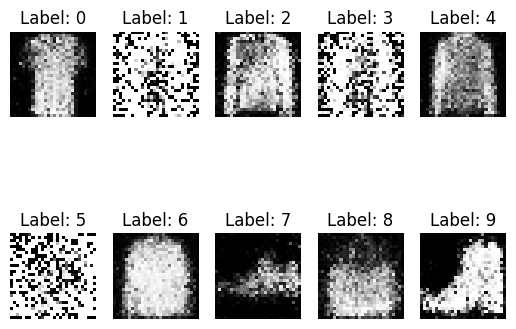

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 901
4/4 [==============================] - 0s 3ms/step
Iteration : 902
4/4 [==============================] - 0s 5ms/step
Iteration : 903
4/4 [==============================] - 0s 4ms/step
Iteration : 904
4/4 [==============================] - 0s 4ms/step
Iteration : 905
4/4 [==============================] - 0s 3ms/step
Iteration : 906
4/4 [==============================] - 0s 4ms/step
Iteration : 907
4/4 [==============================] - 0s 5ms/step
Iteration : 908
4/4 [==============================] - 0s 4ms/step
Iteration : 909
4/4 [==============================] - 0s 4ms/step
Iteration : 910
4/4 [==============================] - 0s 5ms/step
Iteration : 911
4/4 [==============================] - 0s 4ms/step
Iteration : 912
4/4 [==============================] - 0s 4ms/step
Iteration : 913
4/4 [==============================] - 0s 6ms/step
Iteration : 914
4/4 [============

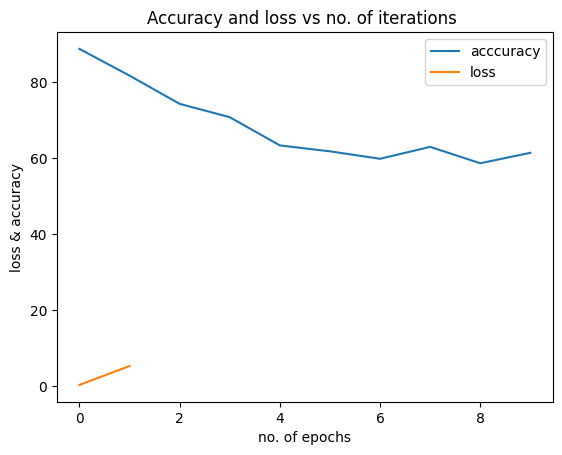

1/1 [==============================] - 0s 20ms/step


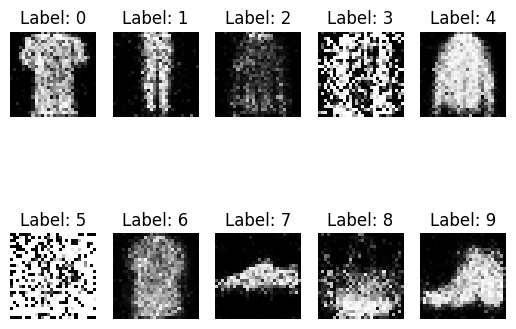

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 1001
4/4 [==============================] - 0s 3ms/step
Iteration : 1002
4/4 [==============================] - 0s 4ms/step
Iteration : 1003
4/4 [==============================] - 0s 4ms/step
Iteration : 1004
4/4 [==============================] - 0s 4ms/step
Iteration : 1005
4/4 [==============================] - 0s 5ms/step
Iteration : 1006
4/4 [==============================] - 0s 5ms/step
Iteration : 1007
4/4 [==============================] - 0s 3ms/step
Iteration : 1008
4/4 [==============================] - 0s 4ms/step
Iteration : 1009
4/4 [==============================] - 0s 3ms/step
Iteration : 1010
4/4 [==============================] - 0s 4ms/step
Iteration : 1011
4/4 [==============================] - 0s 3ms/step
Iteration : 1012
4/4 [==============================] - 0s 3ms/step
Iteration : 1013
4/4 [==============================] - 0s 6ms/step
Iteration : 1014
4/4

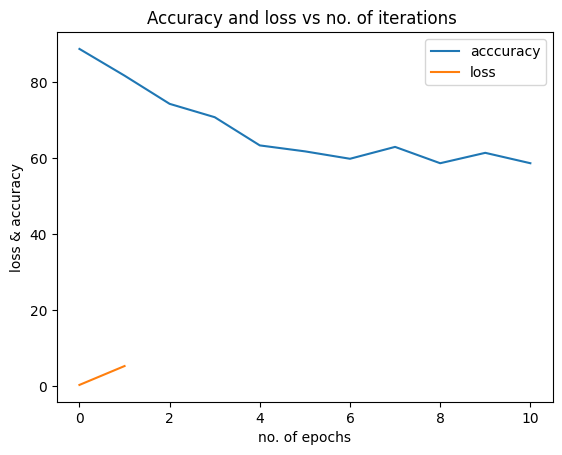

1/1 [==============================] - 0s 22ms/step


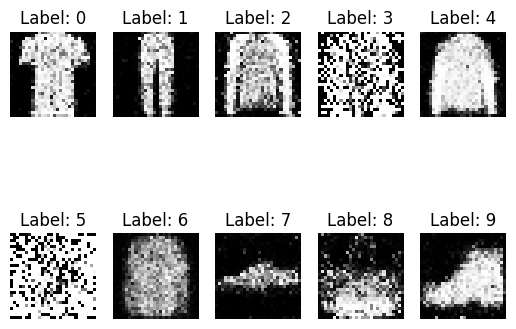

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 1101
4/4 [==============================] - 0s 4ms/step
Iteration : 1102
4/4 [==============================] - 0s 5ms/step
Iteration : 1103
4/4 [==============================] - 0s 4ms/step
Iteration : 1104
4/4 [==============================] - 0s 5ms/step
Iteration : 1105
4/4 [==============================] - 0s 3ms/step
Iteration : 1106
4/4 [==============================] - 0s 3ms/step
Iteration : 1107
4/4 [==============================] - 0s 5ms/step
Iteration : 1108
4/4 [==============================] - 0s 5ms/step
Iteration : 1109
4/4 [==============================] - 0s 3ms/step
Iteration : 1110
4/4 [==============================] - 0s 5ms/step
Iteration : 1111
4/4 [==============================] - 0s 5ms/step
Iteration : 1112
4/4 [==============================] - 0s 3ms/step
Iteration : 1113
4/4 [==============================] - 0s 5ms/step
Iteration : 1114
4/4

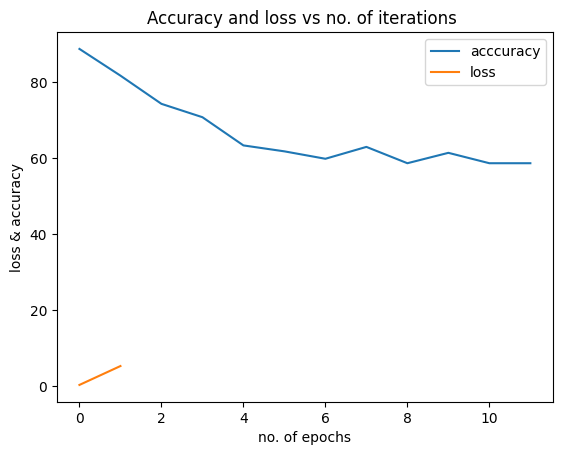

1/1 [==============================] - 0s 21ms/step


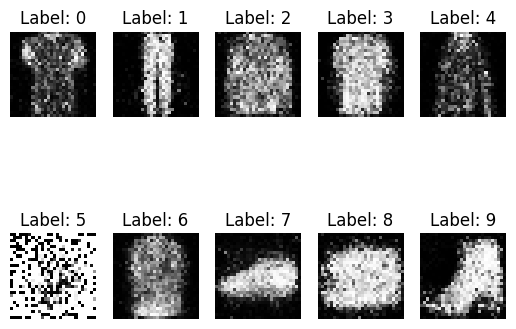

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 1201
4/4 [==============================] - 0s 4ms/step
Iteration : 1202
4/4 [==============================] - 0s 6ms/step
Iteration : 1203
4/4 [==============================] - 0s 3ms/step
Iteration : 1204
4/4 [==============================] - 0s 4ms/step
Iteration : 1205
4/4 [==============================] - 0s 5ms/step
Iteration : 1206
4/4 [==============================] - 0s 6ms/step
Iteration : 1207
4/4 [==============================] - 0s 4ms/step
Iteration : 1208
4/4 [==============================] - 0s 7ms/step
Iteration : 1209
4/4 [==============================] - 0s 8ms/step
Iteration : 1210
4/4 [==============================] - 0s 4ms/step
Iteration : 1211
4/4 [==============================] - 0s 6ms/step
Iteration : 1212
4/4 [==============================] - 0s 5ms/step
Iteration : 1213
4/4 [==============================] - 0s 5ms/step
Iteration : 1214
4/4

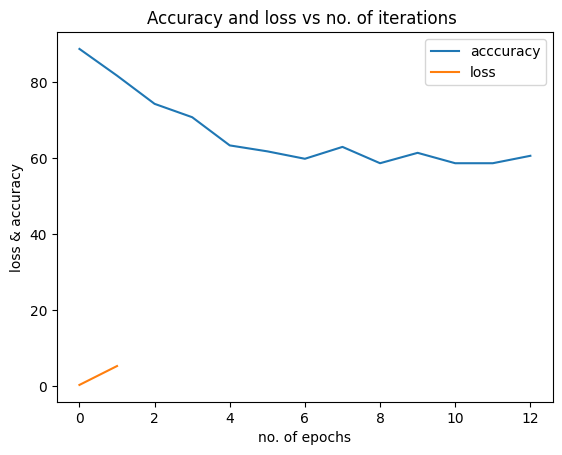

1/1 [==============================] - 0s 36ms/step


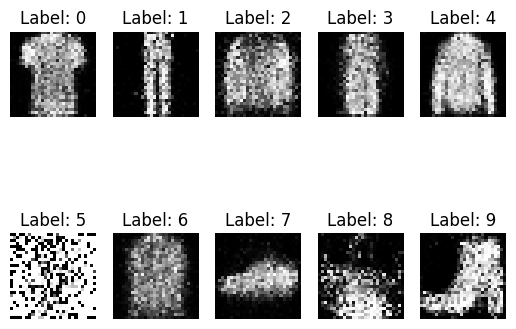

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 1301
4/4 [==============================] - 0s 4ms/step
Iteration : 1302
4/4 [==============================] - 0s 4ms/step
Iteration : 1303
4/4 [==============================] - 0s 3ms/step
Iteration : 1304
4/4 [==============================] - 0s 3ms/step
Iteration : 1305
4/4 [==============================] - 0s 4ms/step
Iteration : 1306
4/4 [==============================] - 0s 6ms/step
Iteration : 1307
4/4 [==============================] - 0s 3ms/step
Iteration : 1308
4/4 [==============================] - 0s 5ms/step
Iteration : 1309
4/4 [==============================] - 0s 4ms/step
Iteration : 1310
4/4 [==============================] - 0s 4ms/step
Iteration : 1311
4/4 [==============================] - 0s 3ms/step
Iteration : 1312
4/4 [==============================] - 0s 5ms/step
Iteration : 1313
4/4 [==============================] - 0s 5ms/step
Iteration : 1314
4/4

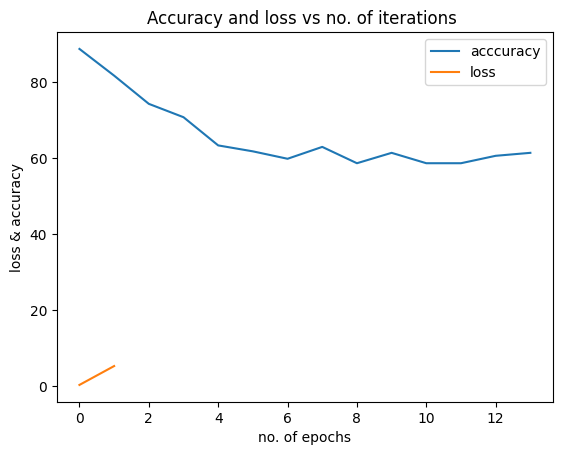

1/1 [==============================] - 0s 19ms/step


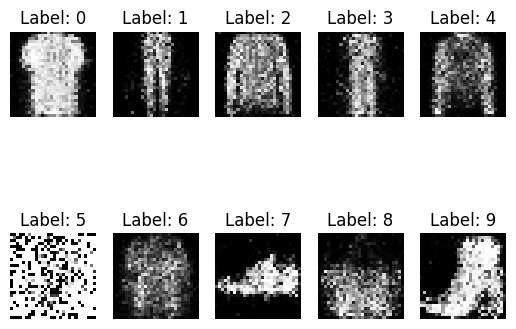

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 1401
4/4 [==============================] - 0s 4ms/step
Iteration : 1402
4/4 [==============================] - 0s 3ms/step
Iteration : 1403
4/4 [==============================] - 0s 4ms/step
Iteration : 1404
4/4 [==============================] - 0s 3ms/step
Iteration : 1405
4/4 [==============================] - 0s 4ms/step
Iteration : 1406
4/4 [==============================] - 0s 4ms/step
Iteration : 1407
4/4 [==============================] - 0s 4ms/step
Iteration : 1408
4/4 [==============================] - 0s 3ms/step
Iteration : 1409
4/4 [==============================] - 0s 3ms/step
Iteration : 1410
4/4 [==============================] - 0s 3ms/step
Iteration : 1411
4/4 [==============================] - 0s 3ms/step
Iteration : 1412
4/4 [==============================] - 0s 3ms/step
Iteration : 1413
4/4 [==============================] - 0s 3ms/step
Iteration : 1414
4/4

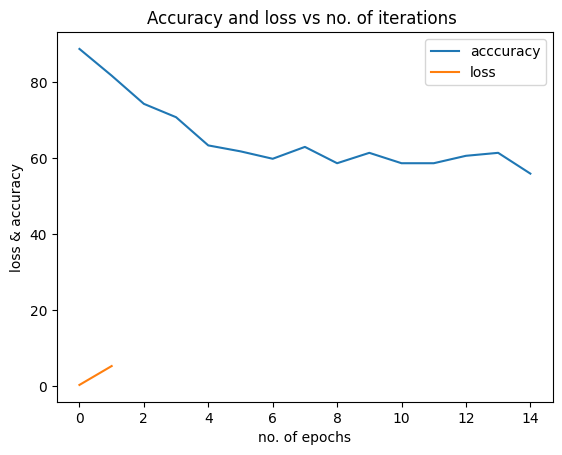

1/1 [==============================] - 0s 20ms/step


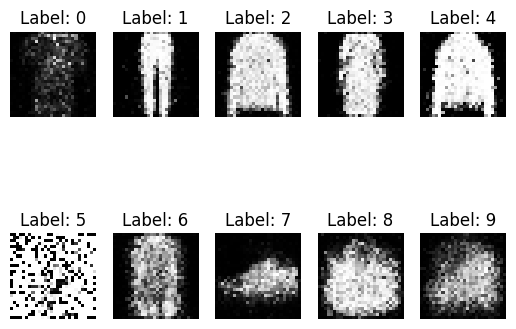

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 1501
4/4 [==============================] - 0s 3ms/step
Iteration : 1502
4/4 [==============================] - 0s 3ms/step
Iteration : 1503
4/4 [==============================] - 0s 4ms/step
Iteration : 1504
4/4 [==============================] - 0s 3ms/step
Iteration : 1505
4/4 [==============================] - 0s 5ms/step
Iteration : 1506
4/4 [==============================] - 0s 3ms/step
Iteration : 1507
4/4 [==============================] - 0s 3ms/step
Iteration : 1508
4/4 [==============================] - 0s 3ms/step
Iteration : 1509
4/4 [==============================] - 0s 4ms/step
Iteration : 1510
4/4 [==============================] - 0s 5ms/step
Iteration : 1511
4/4 [==============================] - 0s 3ms/step
Iteration : 1512
4/4 [==============================] - 0s 6ms/step
Iteration : 1513
4/4 [==============================] - 0s 4ms/step
Iteration : 1514
4/4

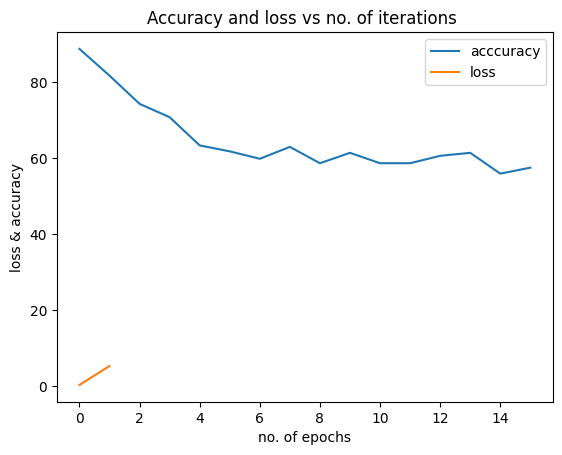

1/1 [==============================] - 0s 20ms/step


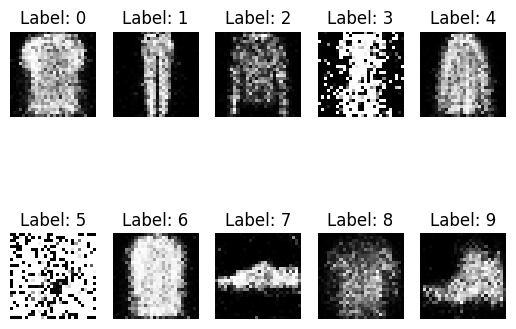

The model structure and weights were saved. 
4/4 [==============================] - 0s 6ms/step
Iteration : 1601
4/4 [==============================] - 0s 3ms/step
Iteration : 1602
4/4 [==============================] - 0s 6ms/step
Iteration : 1603
4/4 [==============================] - 0s 5ms/step
Iteration : 1604
4/4 [==============================] - 0s 5ms/step
Iteration : 1605
4/4 [==============================] - 0s 5ms/step
Iteration : 1606
4/4 [==============================] - 0s 3ms/step
Iteration : 1607
4/4 [==============================] - 0s 5ms/step
Iteration : 1608
4/4 [==============================] - 0s 4ms/step
Iteration : 1609
4/4 [==============================] - 0s 7ms/step
Iteration : 1610
4/4 [==============================] - 0s 6ms/step
Iteration : 1611
4/4 [==============================] - 0s 5ms/step
Iteration : 1612
4/4 [==============================] - 0s 3ms/step
Iteration : 1613
4/4 [==============================] - 0s 4ms/step
Iteration : 1614
4/4

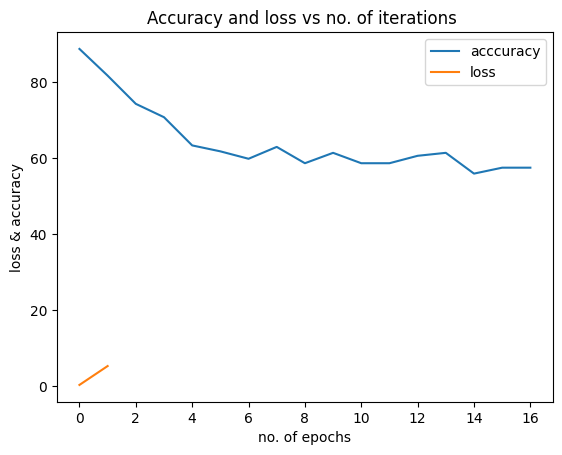

1/1 [==============================] - 0s 20ms/step


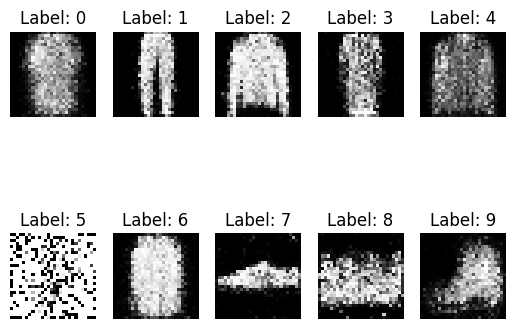

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 1701
4/4 [==============================] - 0s 3ms/step
Iteration : 1702
4/4 [==============================] - 0s 3ms/step
Iteration : 1703
4/4 [==============================] - 0s 3ms/step
Iteration : 1704
4/4 [==============================] - 0s 4ms/step
Iteration : 1705
4/4 [==============================] - 0s 3ms/step
Iteration : 1706
4/4 [==============================] - 0s 4ms/step
Iteration : 1707
4/4 [==============================] - 0s 3ms/step
Iteration : 1708
4/4 [==============================] - 0s 4ms/step
Iteration : 1709
4/4 [==============================] - 0s 3ms/step
Iteration : 1710
4/4 [==============================] - 0s 4ms/step
Iteration : 1711
4/4 [==============================] - 0s 3ms/step
Iteration : 1712
4/4 [==============================] - 0s 4ms/step
Iteration : 1713
4/4 [==============================] - 0s 3ms/step
Iteration : 1714
4/4

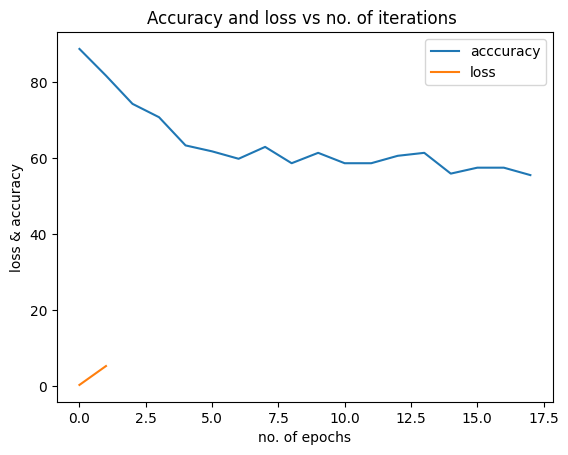

1/1 [==============================] - 0s 20ms/step


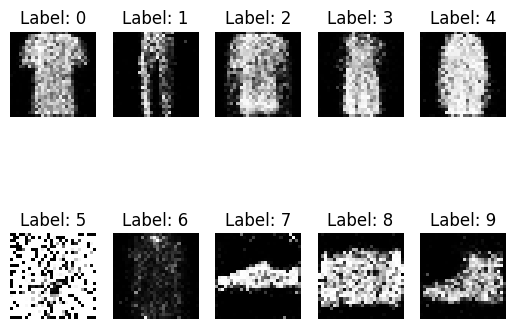

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 1801
4/4 [==============================] - 0s 3ms/step
Iteration : 1802
4/4 [==============================] - 0s 4ms/step
Iteration : 1803
4/4 [==============================] - 0s 4ms/step
Iteration : 1804
4/4 [==============================] - 0s 4ms/step
Iteration : 1805
4/4 [==============================] - 0s 3ms/step
Iteration : 1806
4/4 [==============================] - 0s 4ms/step
Iteration : 1807
4/4 [==============================] - 0s 4ms/step
Iteration : 1808
4/4 [==============================] - 0s 3ms/step
Iteration : 1809
4/4 [==============================] - 0s 6ms/step
Iteration : 1810
4/4 [==============================] - 0s 4ms/step
Iteration : 1811
4/4 [==============================] - 0s 5ms/step
Iteration : 1812
4/4 [==============================] - 0s 4ms/step
Iteration : 1813
4/4 [==============================] - 0s 4ms/step
Iteration : 1814
4/4

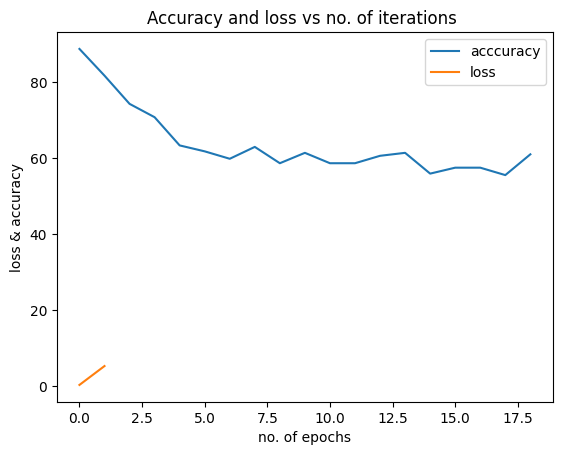

1/1 [==============================] - 0s 18ms/step


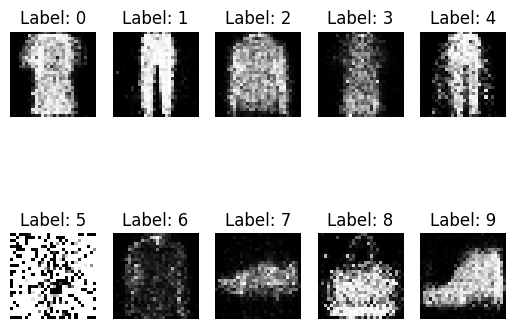

The model structure and weights were saved. 
4/4 [==============================] - 0s 6ms/step
Iteration : 1901
4/4 [==============================] - 0s 3ms/step
Iteration : 1902
4/4 [==============================] - 0s 7ms/step
Iteration : 1903
4/4 [==============================] - 0s 5ms/step
Iteration : 1904
4/4 [==============================] - 0s 4ms/step
Iteration : 1905
4/4 [==============================] - 0s 5ms/step
Iteration : 1906
4/4 [==============================] - 0s 3ms/step
Iteration : 1907
4/4 [==============================] - 0s 4ms/step
Iteration : 1908
4/4 [==============================] - 0s 3ms/step
Iteration : 1909
4/4 [==============================] - 0s 5ms/step
Iteration : 1910
4/4 [==============================] - 0s 6ms/step
Iteration : 1911
4/4 [==============================] - 0s 4ms/step
Iteration : 1912
4/4 [==============================] - 0s 5ms/step
Iteration : 1913
4/4 [==============================] - 0s 4ms/step
Iteration : 1914
4/4

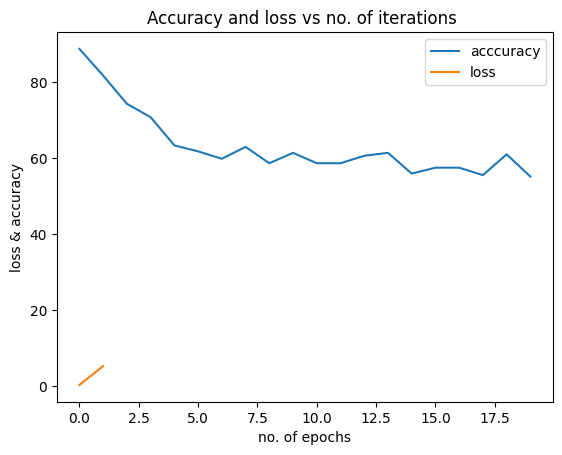

1/1 [==============================] - 0s 22ms/step


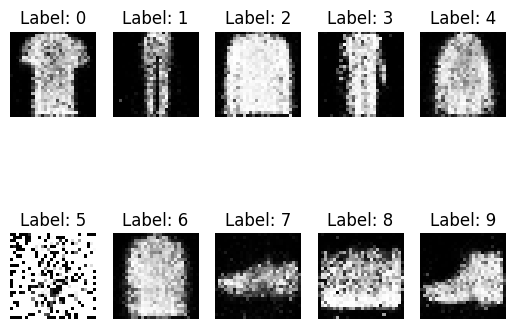

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 2001
4/4 [==============================] - 0s 4ms/step
Iteration : 2002
4/4 [==============================] - 0s 3ms/step
Iteration : 2003
4/4 [==============================] - 0s 8ms/step
Iteration : 2004
4/4 [==============================] - 0s 4ms/step
Iteration : 2005
4/4 [==============================] - 0s 6ms/step
Iteration : 2006
4/4 [==============================] - 0s 4ms/step
Iteration : 2007
4/4 [==============================] - 0s 5ms/step
Iteration : 2008
4/4 [==============================] - 0s 5ms/step
Iteration : 2009
4/4 [==============================] - 0s 3ms/step
Iteration : 2010
4/4 [==============================] - 0s 3ms/step
Iteration : 2011
4/4 [==============================] - 0s 3ms/step
Iteration : 2012
4/4 [==============================] - 0s 3ms/step
Iteration : 2013
4/4 [==============================] - 0s 3ms/step
Iteration : 2014
4/4

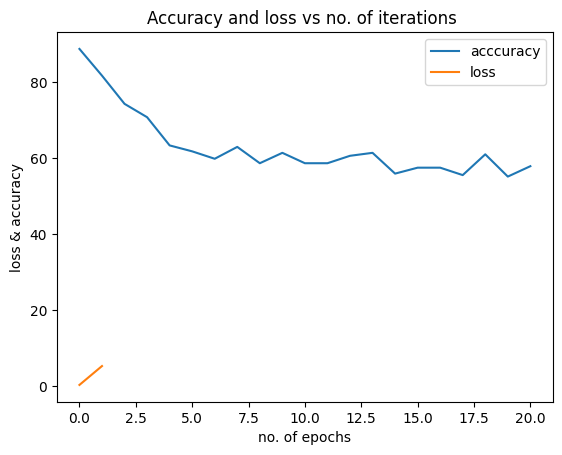

1/1 [==============================] - 0s 27ms/step


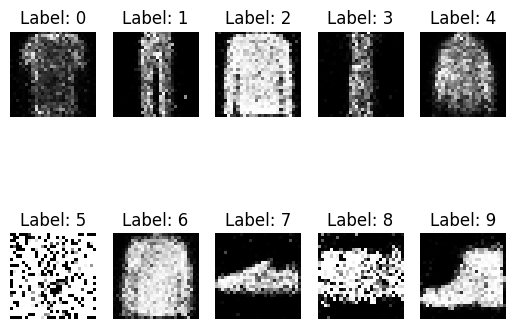

The model structure and weights were saved. 
4/4 [==============================] - 0s 6ms/step
Iteration : 2101
4/4 [==============================] - 0s 5ms/step
Iteration : 2102
4/4 [==============================] - 0s 3ms/step
Iteration : 2103
4/4 [==============================] - 0s 3ms/step
Iteration : 2104
4/4 [==============================] - 0s 5ms/step
Iteration : 2105
4/4 [==============================] - 0s 3ms/step
Iteration : 2106
4/4 [==============================] - 0s 6ms/step
Iteration : 2107
4/4 [==============================] - 0s 3ms/step
Iteration : 2108
4/4 [==============================] - 0s 3ms/step
Iteration : 2109
4/4 [==============================] - 0s 4ms/step
Iteration : 2110
4/4 [==============================] - 0s 6ms/step
Iteration : 2111
4/4 [==============================] - 0s 3ms/step
Iteration : 2112
4/4 [==============================] - 0s 5ms/step
Iteration : 2113
4/4 [==============================] - 0s 5ms/step
Iteration : 2114
4/4

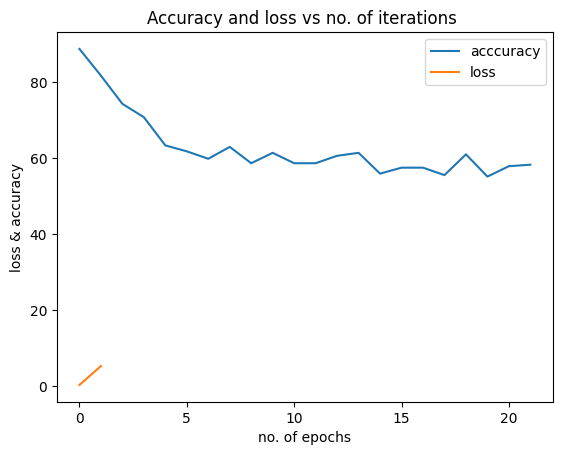

1/1 [==============================] - 0s 23ms/step


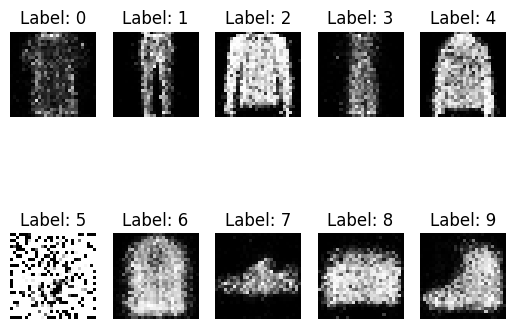

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 2201
4/4 [==============================] - 0s 6ms/step
Iteration : 2202
4/4 [==============================] - 0s 3ms/step
Iteration : 2203
4/4 [==============================] - 0s 4ms/step
Iteration : 2204
4/4 [==============================] - 0s 4ms/step
Iteration : 2205
4/4 [==============================] - 0s 3ms/step
Iteration : 2206
4/4 [==============================] - 0s 5ms/step
Iteration : 2207
4/4 [==============================] - 0s 4ms/step
Iteration : 2208
4/4 [==============================] - 0s 7ms/step
Iteration : 2209
4/4 [==============================] - 0s 4ms/step
Iteration : 2210
4/4 [==============================] - 0s 5ms/step
Iteration : 2211
4/4 [==============================] - 0s 6ms/step
Iteration : 2212
4/4 [==============================] - 0s 5ms/step
Iteration : 2213
4/4 [==============================] - 0s 4ms/step
Iteration : 2214
4/4

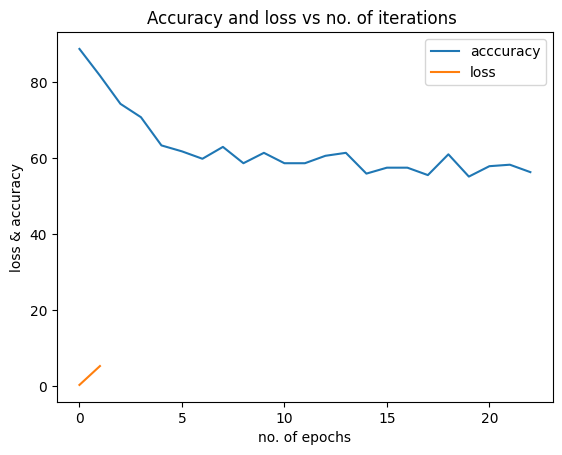

1/1 [==============================] - 0s 20ms/step


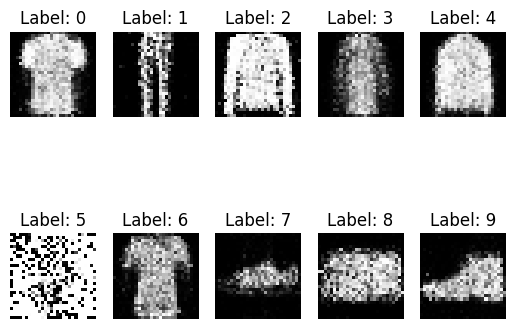

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 2301
4/4 [==============================] - 0s 3ms/step
Iteration : 2302
4/4 [==============================] - 0s 3ms/step
Iteration : 2303
4/4 [==============================] - 0s 4ms/step
Iteration : 2304
4/4 [==============================] - 0s 3ms/step
Iteration : 2305
4/4 [==============================] - 0s 3ms/step
Iteration : 2306
4/4 [==============================] - 0s 4ms/step
Iteration : 2307
4/4 [==============================] - 0s 3ms/step
Iteration : 2308
4/4 [==============================] - 0s 3ms/step
Iteration : 2309
4/4 [==============================] - 0s 3ms/step
Iteration : 2310
4/4 [==============================] - 0s 5ms/step
Iteration : 2311
4/4 [==============================] - 0s 3ms/step
Iteration : 2312
4/4 [==============================] - 0s 4ms/step
Iteration : 2313
4/4 [==============================] - 0s 4ms/step
Iteration : 2314
4/4

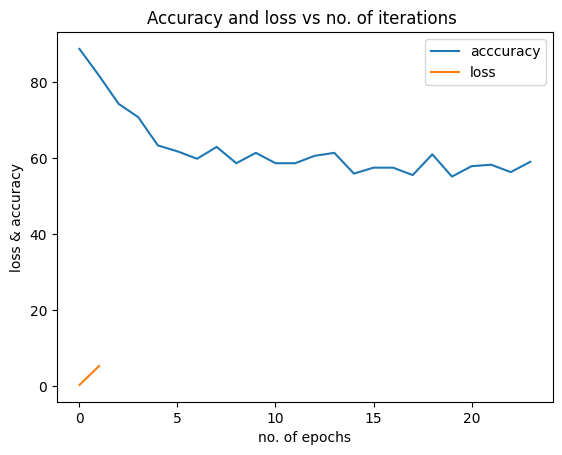

1/1 [==============================] - 0s 19ms/step


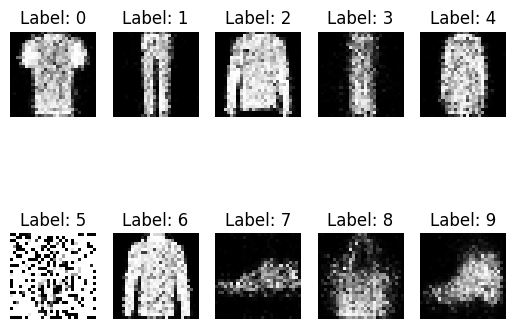

The model structure and weights were saved. 
4/4 [==============================] - 0s 6ms/step
Iteration : 2401
4/4 [==============================] - 0s 8ms/step
Iteration : 2402
4/4 [==============================] - 0s 5ms/step
Iteration : 2403
4/4 [==============================] - 0s 3ms/step
Iteration : 2404
4/4 [==============================] - 0s 5ms/step
Iteration : 2405
4/4 [==============================] - 0s 3ms/step
Iteration : 2406
4/4 [==============================] - 0s 5ms/step
Iteration : 2407
4/4 [==============================] - 0s 3ms/step
Iteration : 2408
4/4 [==============================] - 0s 3ms/step
Iteration : 2409
4/4 [==============================] - 0s 3ms/step
Iteration : 2410
4/4 [==============================] - 0s 3ms/step
Iteration : 2411
4/4 [==============================] - 0s 3ms/step
Iteration : 2412
4/4 [==============================] - 0s 7ms/step
Iteration : 2413
4/4 [==============================] - 0s 3ms/step
Iteration : 2414
4/4

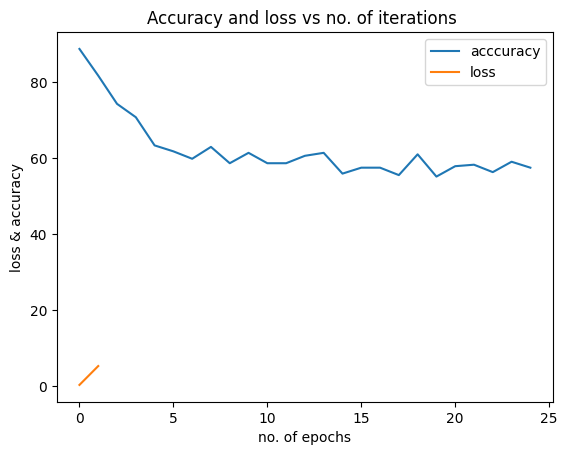

1/1 [==============================] - 0s 20ms/step


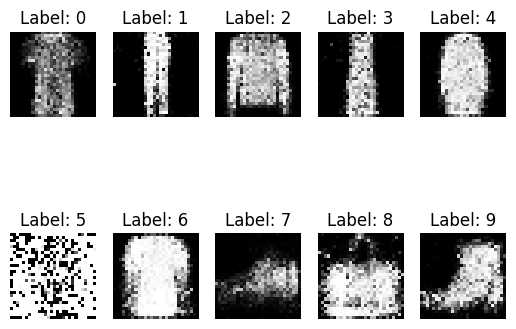

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 2501
4/4 [==============================] - 0s 6ms/step
Iteration : 2502
4/4 [==============================] - 0s 3ms/step
Iteration : 2503
4/4 [==============================] - 0s 5ms/step
Iteration : 2504
4/4 [==============================] - 0s 3ms/step
Iteration : 2505
4/4 [==============================] - 0s 6ms/step
Iteration : 2506
4/4 [==============================] - 0s 3ms/step
Iteration : 2507
4/4 [==============================] - 0s 5ms/step
Iteration : 2508
4/4 [==============================] - 0s 3ms/step
Iteration : 2509
4/4 [==============================] - 0s 5ms/step
Iteration : 2510
4/4 [==============================] - 0s 3ms/step
Iteration : 2511
4/4 [==============================] - 0s 3ms/step
Iteration : 2512
4/4 [==============================] - 0s 5ms/step
Iteration : 2513
4/4 [==============================] - 0s 5ms/step
Iteration : 2514
4/4

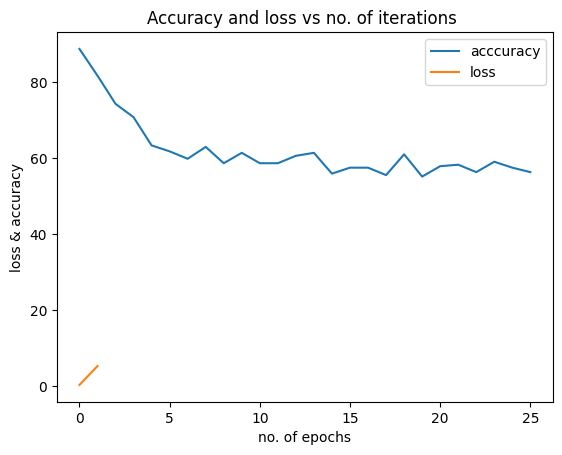

1/1 [==============================] - 0s 23ms/step


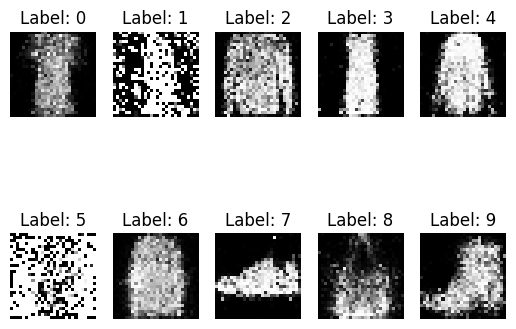

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 2601
4/4 [==============================] - 0s 6ms/step
Iteration : 2602
4/4 [==============================] - 0s 4ms/step
Iteration : 2603
4/4 [==============================] - 0s 7ms/step
Iteration : 2604
4/4 [==============================] - 0s 3ms/step
Iteration : 2605
4/4 [==============================] - 0s 3ms/step
Iteration : 2606
4/4 [==============================] - 0s 4ms/step
Iteration : 2607
4/4 [==============================] - 0s 4ms/step
Iteration : 2608
4/4 [==============================] - 0s 4ms/step
Iteration : 2609
4/4 [==============================] - 0s 6ms/step
Iteration : 2610
4/4 [==============================] - 0s 4ms/step
Iteration : 2611
4/4 [==============================] - 0s 4ms/step
Iteration : 2612
4/4 [==============================] - 0s 6ms/step
Iteration : 2613
4/4 [==============================] - 0s 5ms/step
Iteration : 2614
4/4

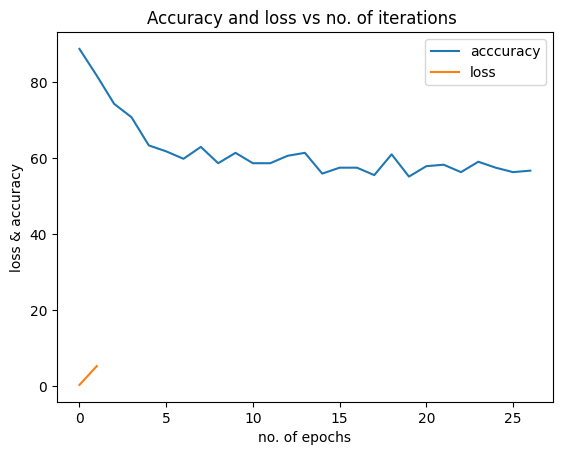

1/1 [==============================] - 0s 48ms/step


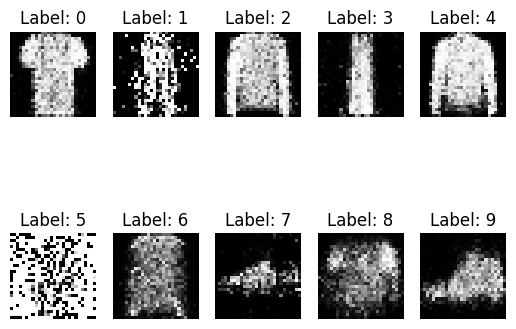

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 2701
4/4 [==============================] - 0s 5ms/step
Iteration : 2702
4/4 [==============================] - 0s 6ms/step
Iteration : 2703
4/4 [==============================] - 0s 3ms/step
Iteration : 2704
4/4 [==============================] - 0s 4ms/step
Iteration : 2705
4/4 [==============================] - 0s 5ms/step
Iteration : 2706
4/4 [==============================] - 0s 3ms/step
Iteration : 2707
4/4 [==============================] - 0s 4ms/step
Iteration : 2708
4/4 [==============================] - 0s 3ms/step
Iteration : 2709
4/4 [==============================] - 0s 4ms/step
Iteration : 2710
4/4 [==============================] - 0s 5ms/step
Iteration : 2711
4/4 [==============================] - 0s 6ms/step
Iteration : 2712
4/4 [==============================] - 0s 6ms/step
Iteration : 2713
4/4 [==============================] - 0s 4ms/step
Iteration : 2714
4/4

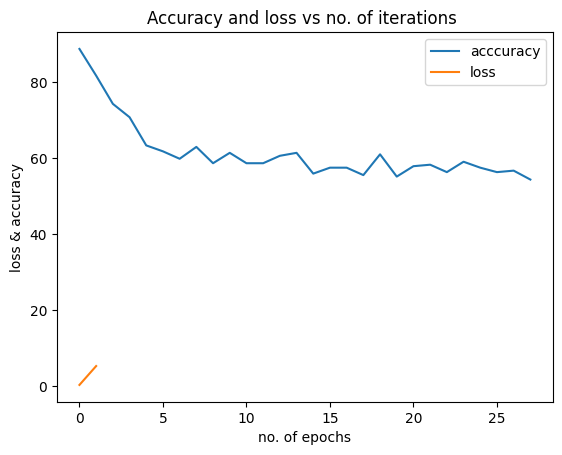

1/1 [==============================] - 0s 19ms/step


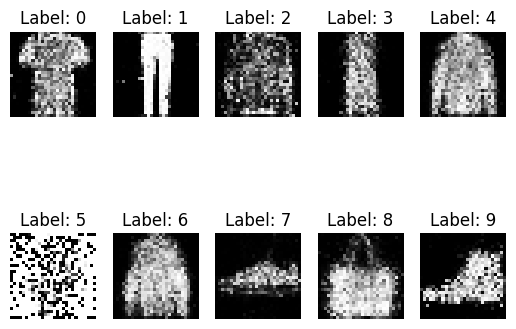

The model structure and weights were saved. 
4/4 [==============================] - 0s 7ms/step
Iteration : 2801
4/4 [==============================] - 0s 4ms/step
Iteration : 2802
4/4 [==============================] - 0s 5ms/step
Iteration : 2803
4/4 [==============================] - 0s 4ms/step
Iteration : 2804
4/4 [==============================] - 0s 6ms/step
Iteration : 2805
4/4 [==============================] - 0s 9ms/step
Iteration : 2806
4/4 [==============================] - 0s 8ms/step
Iteration : 2807
4/4 [==============================] - 0s 3ms/step
Iteration : 2808
4/4 [==============================] - 0s 4ms/step
Iteration : 2809
4/4 [==============================] - 0s 6ms/step
Iteration : 2810
4/4 [==============================] - 0s 3ms/step
Iteration : 2811
4/4 [==============================] - 0s 8ms/step
Iteration : 2812
4/4 [==============================] - 0s 3ms/step
Iteration : 2813
4/4 [==============================] - 0s 4ms/step
Iteration : 2814
4/4

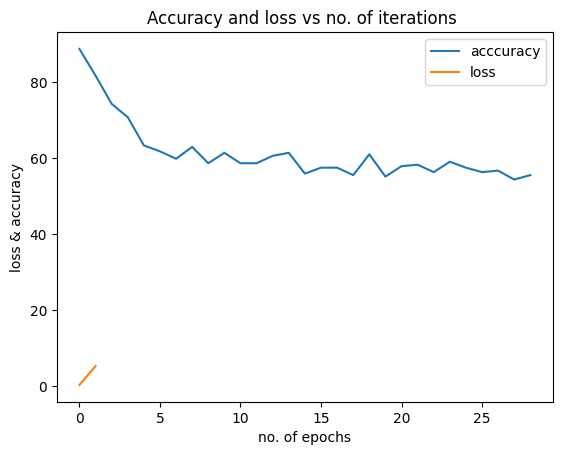

1/1 [==============================] - 0s 24ms/step


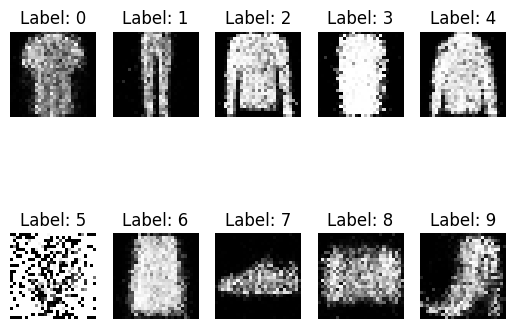

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 2901
4/4 [==============================] - 0s 4ms/step
Iteration : 2902
4/4 [==============================] - 0s 3ms/step
Iteration : 2903
4/4 [==============================] - 0s 5ms/step
Iteration : 2904
4/4 [==============================] - 0s 7ms/step
Iteration : 2905
4/4 [==============================] - 0s 3ms/step
Iteration : 2906
4/4 [==============================] - 0s 3ms/step
Iteration : 2907
4/4 [==============================] - 0s 3ms/step
Iteration : 2908
4/4 [==============================] - 0s 5ms/step
Iteration : 2909
4/4 [==============================] - 0s 5ms/step
Iteration : 2910
4/4 [==============================] - 0s 3ms/step
Iteration : 2911
4/4 [==============================] - 0s 3ms/step
Iteration : 2912
4/4 [==============================] - 0s 3ms/step
Iteration : 2913
4/4 [==============================] - 0s 3ms/step
Iteration : 2914
4/4

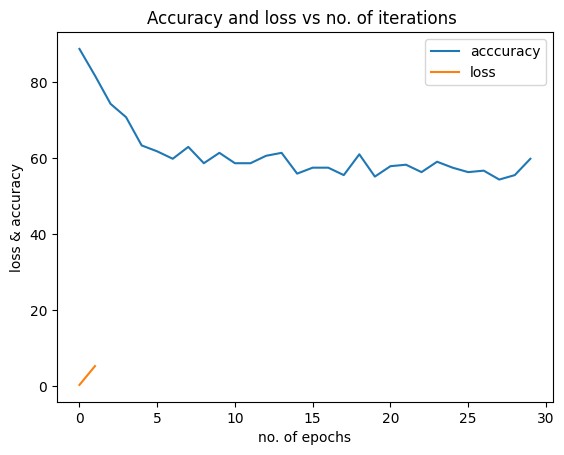

1/1 [==============================] - 0s 19ms/step


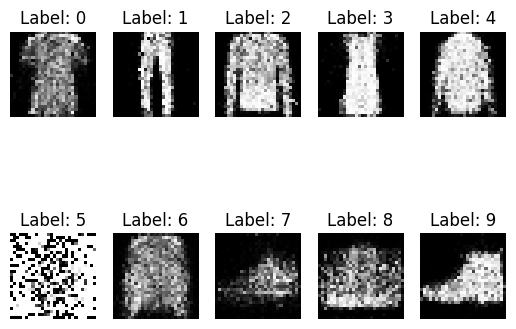

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 3001
4/4 [==============================] - 0s 3ms/step
Iteration : 3002
4/4 [==============================] - 0s 9ms/step
Iteration : 3003
4/4 [==============================] - 0s 3ms/step
Iteration : 3004
4/4 [==============================] - 0s 4ms/step
Iteration : 3005
4/4 [==============================] - 0s 8ms/step
Iteration : 3006
4/4 [==============================] - 0s 3ms/step
Iteration : 3007
4/4 [==============================] - 0s 6ms/step
Iteration : 3008
4/4 [==============================] - 0s 4ms/step
Iteration : 3009
4/4 [==============================] - 0s 5ms/step
Iteration : 3010
4/4 [==============================] - 0s 3ms/step
Iteration : 3011
4/4 [==============================] - 0s 5ms/step
Iteration : 3012
4/4 [==============================] - 0s 6ms/step
Iteration : 3013
4/4 [==============================] - 0s 3ms/step
Iteration : 3014
4/4

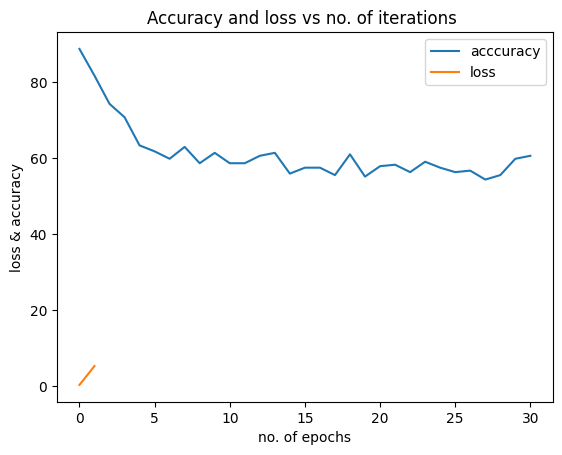

1/1 [==============================] - 0s 21ms/step


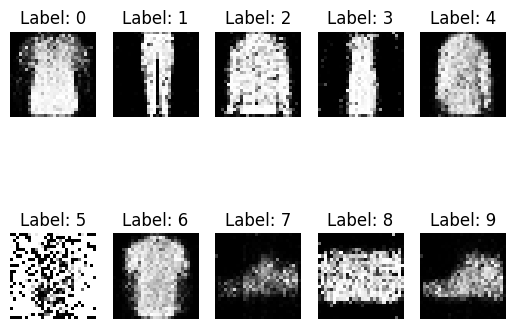

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 3101
4/4 [==============================] - 0s 4ms/step
Iteration : 3102
4/4 [==============================] - 0s 4ms/step
Iteration : 3103
4/4 [==============================] - 0s 6ms/step
Iteration : 3104
4/4 [==============================] - 0s 5ms/step
Iteration : 3105
4/4 [==============================] - 0s 3ms/step
Iteration : 3106
4/4 [==============================] - 0s 4ms/step
Iteration : 3107
4/4 [==============================] - 0s 5ms/step
Iteration : 3108
4/4 [==============================] - 0s 3ms/step
Iteration : 3109
4/4 [==============================] - 0s 3ms/step
Iteration : 3110
4/4 [==============================] - 0s 5ms/step
Iteration : 3111
4/4 [==============================] - 0s 4ms/step
Iteration : 3112
4/4 [==============================] - 0s 3ms/step
Iteration : 3113
4/4 [==============================] - 0s 5ms/step
Iteration : 3114
4/4

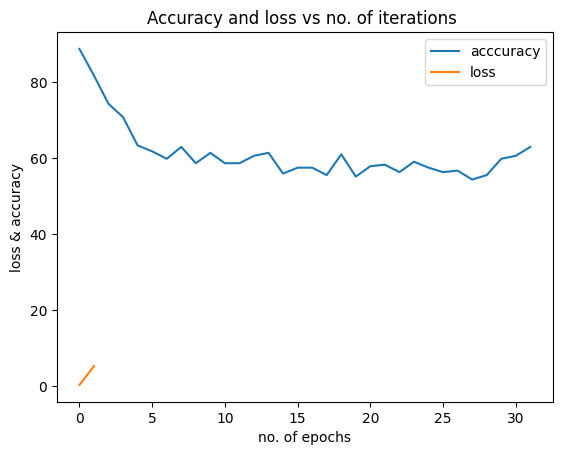

1/1 [==============================] - 0s 20ms/step


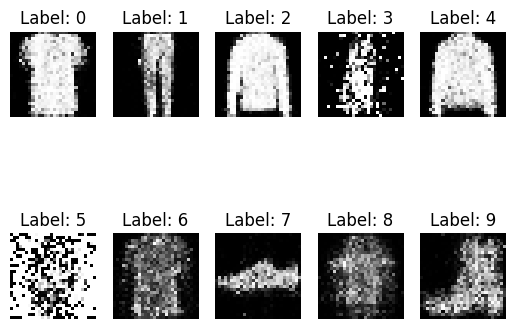

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 3201
4/4 [==============================] - 0s 3ms/step
Iteration : 3202
4/4 [==============================] - 0s 5ms/step
Iteration : 3203
4/4 [==============================] - 0s 4ms/step
Iteration : 3204
4/4 [==============================] - 0s 3ms/step
Iteration : 3205
4/4 [==============================] - 0s 4ms/step
Iteration : 3206
4/4 [==============================] - 0s 3ms/step
Iteration : 3207
4/4 [==============================] - 0s 3ms/step
Iteration : 3208
4/4 [==============================] - 0s 3ms/step
Iteration : 3209
4/4 [==============================] - 0s 4ms/step
Iteration : 3210
4/4 [==============================] - 0s 3ms/step
Iteration : 3211
4/4 [==============================] - 0s 3ms/step
Iteration : 3212
4/4 [==============================] - 0s 5ms/step
Iteration : 3213
4/4 [==============================] - 0s 5ms/step
Iteration : 3214
4/4

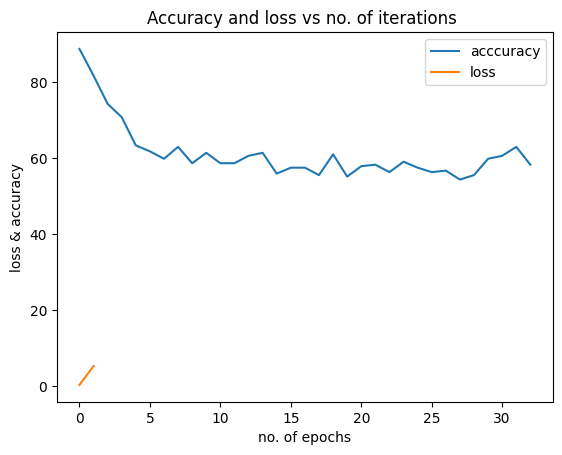

1/1 [==============================] - 0s 21ms/step


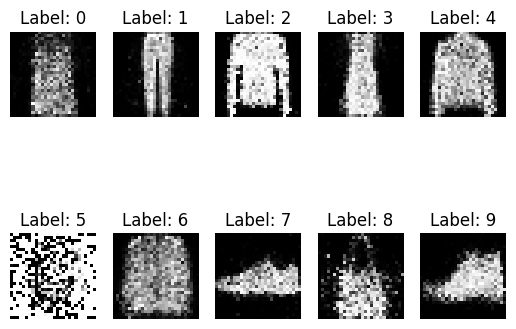

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 3301
4/4 [==============================] - 0s 8ms/step
Iteration : 3302
4/4 [==============================] - 0s 3ms/step
Iteration : 3303
4/4 [==============================] - 0s 4ms/step
Iteration : 3304
4/4 [==============================] - 0s 3ms/step
Iteration : 3305
4/4 [==============================] - 0s 3ms/step
Iteration : 3306
4/4 [==============================] - 0s 4ms/step
Iteration : 3307
4/4 [==============================] - 0s 3ms/step
Iteration : 3308
4/4 [==============================] - 0s 4ms/step
Iteration : 3309
4/4 [==============================] - 0s 4ms/step
Iteration : 3310
4/4 [==============================] - 0s 7ms/step
Iteration : 3311
4/4 [==============================] - 0s 5ms/step
Iteration : 3312
4/4 [==============================] - 0s 6ms/step
Iteration : 3313
4/4 [==============================] - 0s 7ms/step
Iteration : 3314
4/4

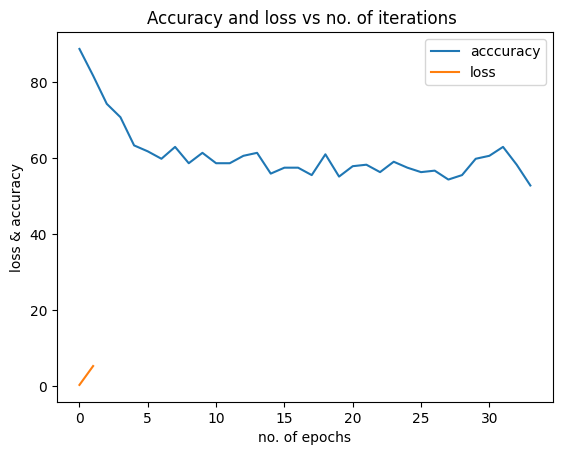

1/1 [==============================] - 0s 31ms/step


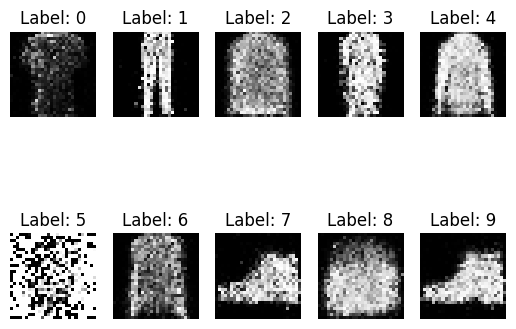

The model structure and weights were saved. 
4/4 [==============================] - 0s 6ms/step
Iteration : 3401
4/4 [==============================] - 0s 3ms/step
Iteration : 3402
4/4 [==============================] - 0s 3ms/step
Iteration : 3403
4/4 [==============================] - 0s 4ms/step
Iteration : 3404
4/4 [==============================] - 0s 4ms/step
Iteration : 3405
4/4 [==============================] - 0s 7ms/step
Iteration : 3406
4/4 [==============================] - 0s 3ms/step
Iteration : 3407
4/4 [==============================] - 0s 4ms/step
Iteration : 3408
4/4 [==============================] - 0s 3ms/step
Iteration : 3409
4/4 [==============================] - 0s 3ms/step
Iteration : 3410
4/4 [==============================] - 0s 3ms/step
Iteration : 3411
4/4 [==============================] - 0s 3ms/step
Iteration : 3412
4/4 [==============================] - 0s 5ms/step
Iteration : 3413
4/4 [==============================] - 0s 6ms/step
Iteration : 3414
4/4

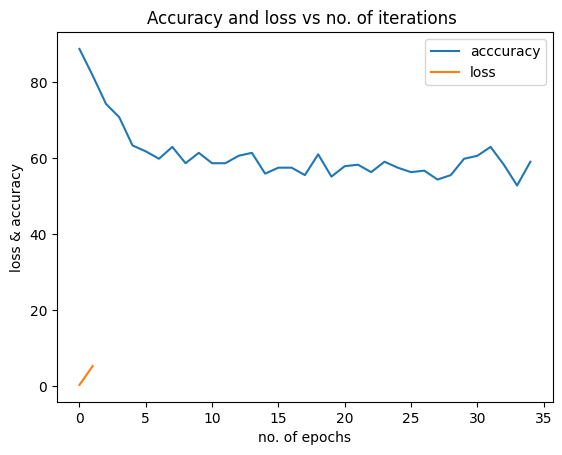

1/1 [==============================] - 0s 20ms/step


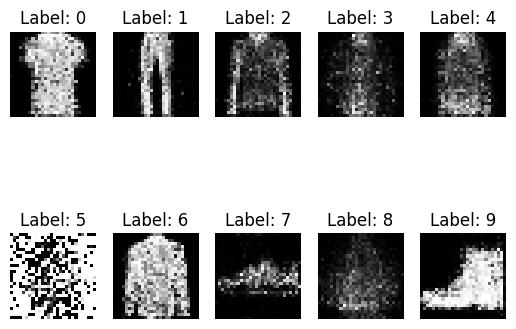

The model structure and weights were saved. 
4/4 [==============================] - 0s 6ms/step
Iteration : 3501
4/4 [==============================] - 0s 5ms/step
Iteration : 3502
4/4 [==============================] - 0s 3ms/step
Iteration : 3503
4/4 [==============================] - 0s 5ms/step
Iteration : 3504
4/4 [==============================] - 0s 4ms/step
Iteration : 3505
4/4 [==============================] - 0s 5ms/step
Iteration : 3506
4/4 [==============================] - 0s 3ms/step
Iteration : 3507
4/4 [==============================] - 0s 5ms/step
Iteration : 3508
4/4 [==============================] - 0s 5ms/step
Iteration : 3509
4/4 [==============================] - 0s 3ms/step
Iteration : 3510
4/4 [==============================] - 0s 4ms/step
Iteration : 3511
4/4 [==============================] - 0s 4ms/step
Iteration : 3512
4/4 [==============================] - 0s 3ms/step
Iteration : 3513
4/4 [==============================] - 0s 3ms/step
Iteration : 3514
4/4

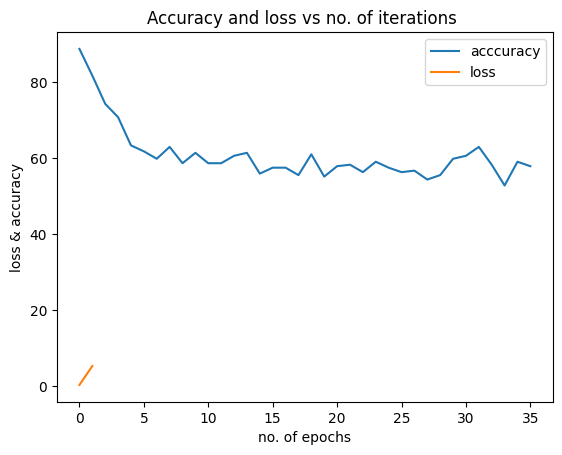

1/1 [==============================] - 0s 21ms/step


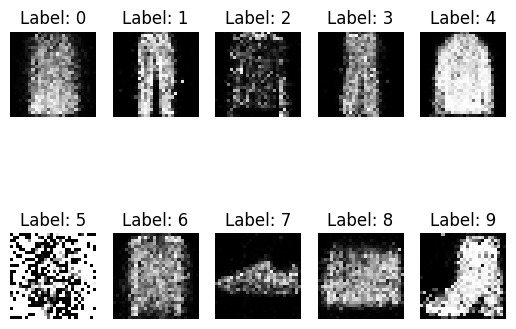

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 3601
4/4 [==============================] - 0s 4ms/step
Iteration : 3602
4/4 [==============================] - 0s 4ms/step
Iteration : 3603
4/4 [==============================] - 0s 3ms/step
Iteration : 3604
4/4 [==============================] - 0s 3ms/step
Iteration : 3605
4/4 [==============================] - 0s 4ms/step
Iteration : 3606
4/4 [==============================] - 0s 5ms/step
Iteration : 3607
4/4 [==============================] - 0s 3ms/step
Iteration : 3608
4/4 [==============================] - 0s 4ms/step
Iteration : 3609
4/4 [==============================] - 0s 3ms/step
Iteration : 3610
4/4 [==============================] - 0s 4ms/step
Iteration : 3611
4/4 [==============================] - 0s 3ms/step
Iteration : 3612
4/4 [==============================] - 0s 5ms/step
Iteration : 3613
4/4 [==============================] - 0s 3ms/step
Iteration : 3614
4/4

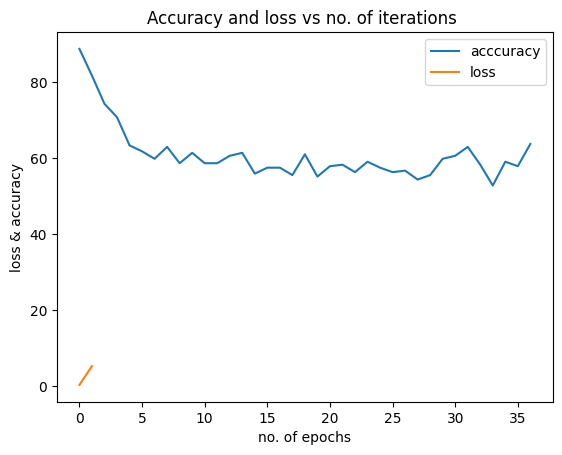

1/1 [==============================] - 0s 19ms/step


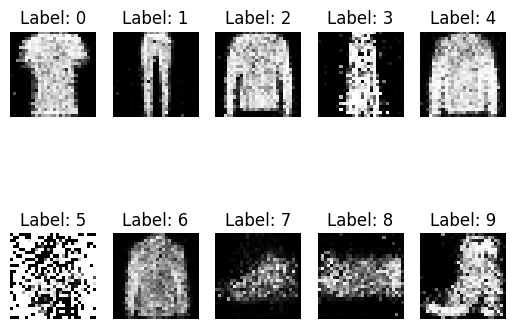

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 3701
4/4 [==============================] - 0s 4ms/step
Iteration : 3702
4/4 [==============================] - 0s 3ms/step
Iteration : 3703
4/4 [==============================] - 0s 3ms/step
Iteration : 3704
4/4 [==============================] - 0s 3ms/step
Iteration : 3705
4/4 [==============================] - 0s 4ms/step
Iteration : 3706
4/4 [==============================] - 0s 4ms/step
Iteration : 3707
4/4 [==============================] - 0s 3ms/step
Iteration : 3708
4/4 [==============================] - 0s 3ms/step
Iteration : 3709
4/4 [==============================] - 0s 3ms/step
Iteration : 3710
4/4 [==============================] - 0s 3ms/step
Iteration : 3711
4/4 [==============================] - 0s 3ms/step
Iteration : 3712
4/4 [==============================] - 0s 3ms/step
Iteration : 3713
4/4 [==============================] - 0s 3ms/step
Iteration : 3714
4/4

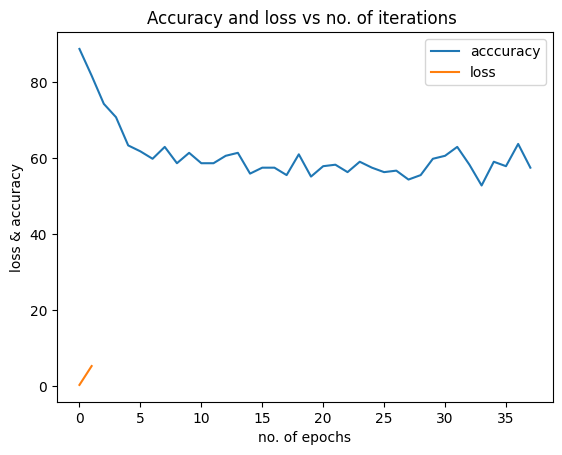

1/1 [==============================] - 0s 25ms/step


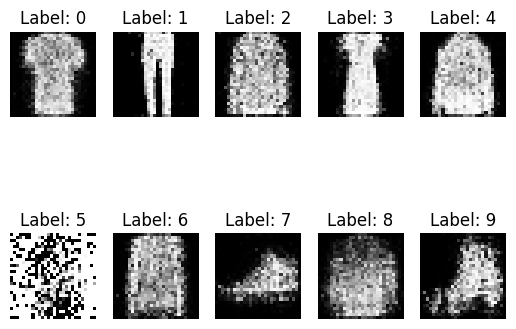

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 3801
4/4 [==============================] - 0s 4ms/step
Iteration : 3802
4/4 [==============================] - 0s 5ms/step
Iteration : 3803
4/4 [==============================] - 0s 5ms/step
Iteration : 3804
4/4 [==============================] - 0s 6ms/step
Iteration : 3805
4/4 [==============================] - 0s 4ms/step
Iteration : 3806
4/4 [==============================] - 0s 5ms/step
Iteration : 3807
4/4 [==============================] - 0s 5ms/step
Iteration : 3808
4/4 [==============================] - 0s 6ms/step
Iteration : 3809
4/4 [==============================] - 0s 5ms/step
Iteration : 3810
4/4 [==============================] - 0s 8ms/step
Iteration : 3811
4/4 [==============================] - 0s 3ms/step
Iteration : 3812
4/4 [==============================] - 0s 3ms/step
Iteration : 3813
4/4 [==============================] - 0s 5ms/step
Iteration : 3814
4/4

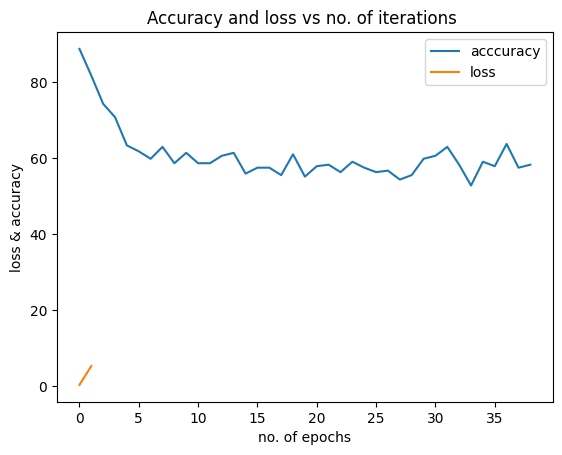

1/1 [==============================] - 0s 23ms/step


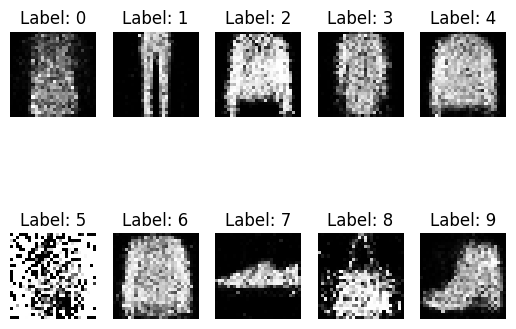

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 3901
4/4 [==============================] - 0s 6ms/step
Iteration : 3902
4/4 [==============================] - 0s 5ms/step
Iteration : 3903
4/4 [==============================] - 0s 2ms/step
Iteration : 3904
4/4 [==============================] - 0s 3ms/step
Iteration : 3905
4/4 [==============================] - 0s 3ms/step
Iteration : 3906
4/4 [==============================] - 0s 3ms/step
Iteration : 3907
4/4 [==============================] - 0s 3ms/step
Iteration : 3908
4/4 [==============================] - 0s 4ms/step
Iteration : 3909
4/4 [==============================] - 0s 3ms/step
Iteration : 3910
4/4 [==============================] - 0s 4ms/step
Iteration : 3911
4/4 [==============================] - 0s 3ms/step
Iteration : 3912
4/4 [==============================] - 0s 3ms/step
Iteration : 3913
4/4 [==============================] - 0s 6ms/step
Iteration : 3914
4/4

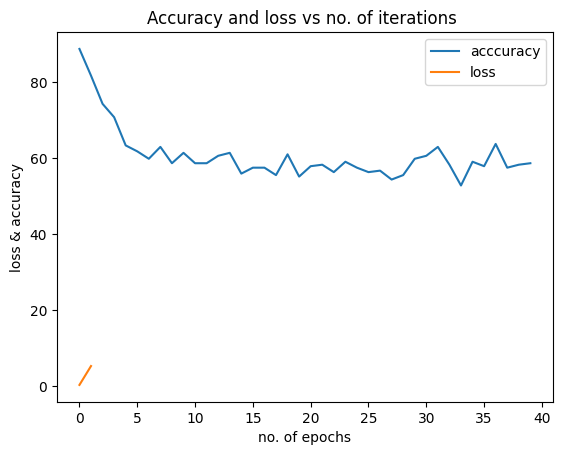

1/1 [==============================] - 0s 21ms/step


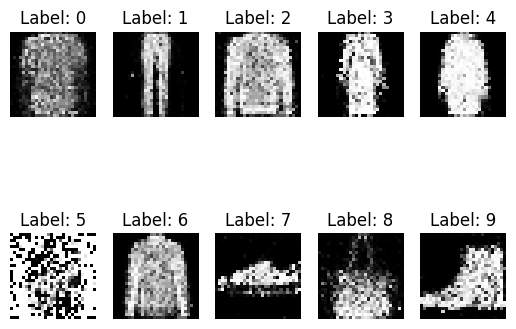

The model structure and weights were saved. 
4/4 [==============================] - 0s 6ms/step
Iteration : 4001
4/4 [==============================] - 0s 5ms/step
Iteration : 4002
4/4 [==============================] - 0s 3ms/step
Iteration : 4003
4/4 [==============================] - 0s 3ms/step
Iteration : 4004
4/4 [==============================] - 0s 3ms/step
Iteration : 4005
4/4 [==============================] - 0s 4ms/step
Iteration : 4006
4/4 [==============================] - 0s 3ms/step
Iteration : 4007
4/4 [==============================] - 0s 3ms/step
Iteration : 4008
4/4 [==============================] - 0s 3ms/step
Iteration : 4009
4/4 [==============================] - 0s 4ms/step
Iteration : 4010
4/4 [==============================] - 0s 4ms/step
Iteration : 4011
4/4 [==============================] - 0s 3ms/step
Iteration : 4012
4/4 [==============================] - 0s 3ms/step
Iteration : 4013
4/4 [==============================] - 0s 3ms/step
Iteration : 4014
4/4

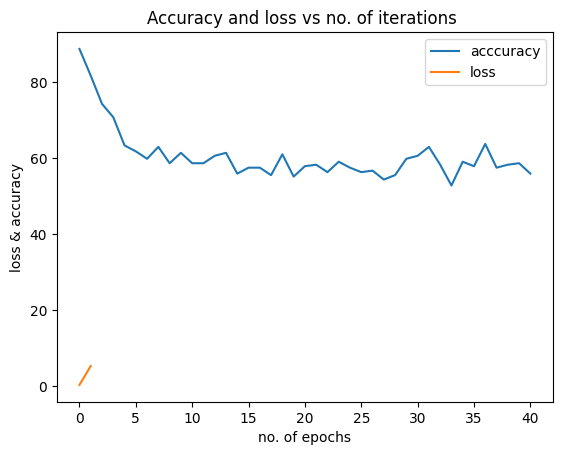

1/1 [==============================] - 0s 40ms/step


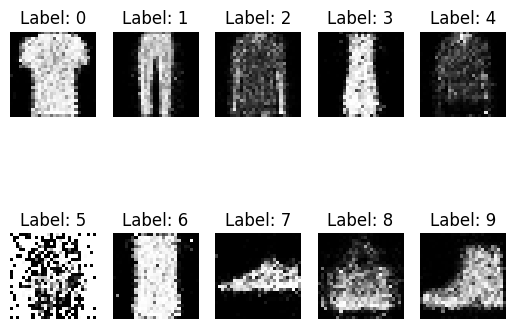

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 4101
4/4 [==============================] - 0s 4ms/step
Iteration : 4102
4/4 [==============================] - 0s 4ms/step
Iteration : 4103
4/4 [==============================] - 0s 4ms/step
Iteration : 4104
4/4 [==============================] - 0s 4ms/step
Iteration : 4105
4/4 [==============================] - 0s 3ms/step
Iteration : 4106
4/4 [==============================] - 0s 3ms/step
Iteration : 4107
4/4 [==============================] - 0s 4ms/step
Iteration : 4108
4/4 [==============================] - 0s 4ms/step
Iteration : 4109
4/4 [==============================] - 0s 4ms/step
Iteration : 4110
4/4 [==============================] - 0s 3ms/step
Iteration : 4111
4/4 [==============================] - 0s 4ms/step
Iteration : 4112
4/4 [==============================] - 0s 3ms/step
Iteration : 4113
4/4 [==============================] - 0s 4ms/step
Iteration : 4114
4/4

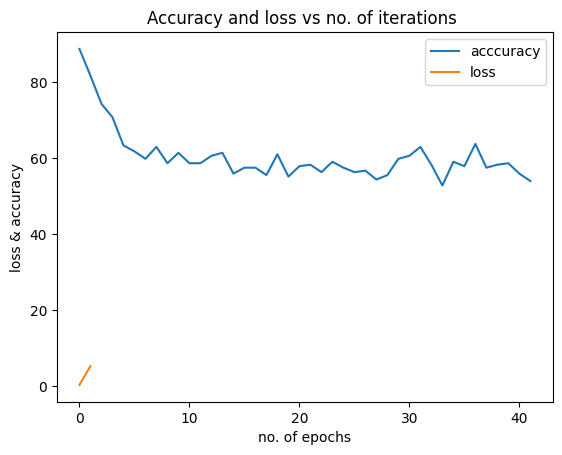

1/1 [==============================] - 0s 22ms/step


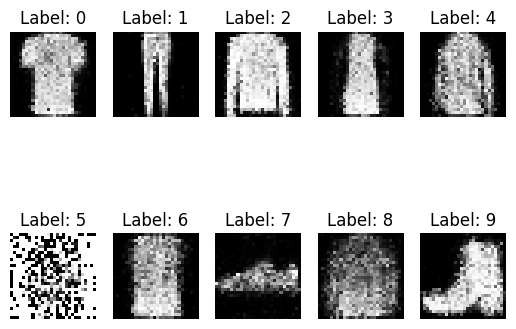

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 4201
4/4 [==============================] - 0s 4ms/step
Iteration : 4202
4/4 [==============================] - 0s 7ms/step
Iteration : 4203
4/4 [==============================] - 0s 3ms/step
Iteration : 4204
4/4 [==============================] - 0s 3ms/step
Iteration : 4205
4/4 [==============================] - 0s 3ms/step
Iteration : 4206
4/4 [==============================] - 0s 5ms/step
Iteration : 4207
4/4 [==============================] - 0s 4ms/step
Iteration : 4208
4/4 [==============================] - 0s 3ms/step
Iteration : 4209
4/4 [==============================] - 0s 5ms/step
Iteration : 4210
4/4 [==============================] - 0s 3ms/step
Iteration : 4211
4/4 [==============================] - 0s 3ms/step
Iteration : 4212
4/4 [==============================] - 0s 3ms/step
Iteration : 4213
4/4 [==============================] - 0s 4ms/step
Iteration : 4214
4/4

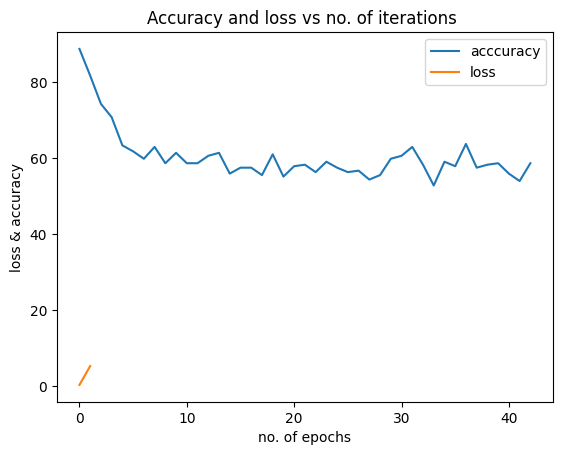

1/1 [==============================] - 0s 18ms/step


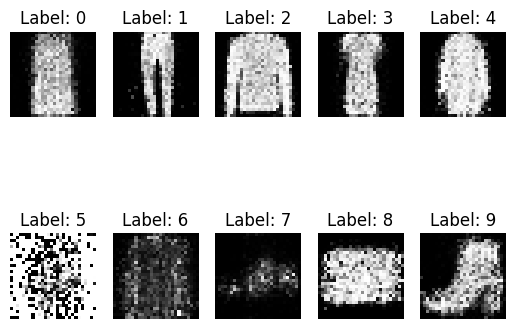

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 4301
4/4 [==============================] - 0s 5ms/step
Iteration : 4302
4/4 [==============================] - 0s 3ms/step
Iteration : 4303
4/4 [==============================] - 0s 3ms/step
Iteration : 4304
4/4 [==============================] - 0s 4ms/step
Iteration : 4305
4/4 [==============================] - 0s 4ms/step
Iteration : 4306
4/4 [==============================] - 0s 3ms/step
Iteration : 4307
4/4 [==============================] - 0s 6ms/step
Iteration : 4308
4/4 [==============================] - 0s 4ms/step
Iteration : 4309
4/4 [==============================] - 0s 3ms/step
Iteration : 4310
4/4 [==============================] - 0s 3ms/step
Iteration : 4311
4/4 [==============================] - 0s 4ms/step
Iteration : 4312
4/4 [==============================] - 0s 6ms/step
Iteration : 4313
4/4 [==============================] - 0s 5ms/step
Iteration : 4314
4/4

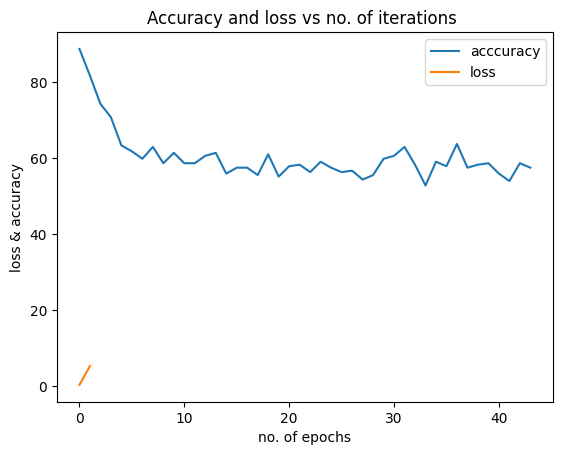

1/1 [==============================] - 0s 20ms/step


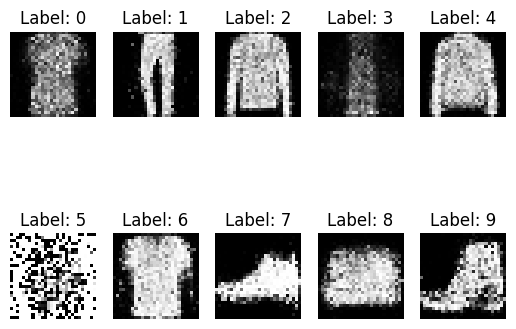

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 4401
4/4 [==============================] - 0s 3ms/step
Iteration : 4402
4/4 [==============================] - 0s 4ms/step
Iteration : 4403
4/4 [==============================] - 0s 4ms/step
Iteration : 4404
4/4 [==============================] - 0s 5ms/step
Iteration : 4405
4/4 [==============================] - 0s 6ms/step
Iteration : 4406
4/4 [==============================] - 0s 3ms/step
Iteration : 4407
4/4 [==============================] - 0s 4ms/step
Iteration : 4408
4/4 [==============================] - 0s 5ms/step
Iteration : 4409
4/4 [==============================] - 0s 4ms/step
Iteration : 4410
4/4 [==============================] - 0s 3ms/step
Iteration : 4411
4/4 [==============================] - 0s 4ms/step
Iteration : 4412
4/4 [==============================] - 0s 4ms/step
Iteration : 4413
4/4 [==============================] - 0s 4ms/step
Iteration : 4414
4/4

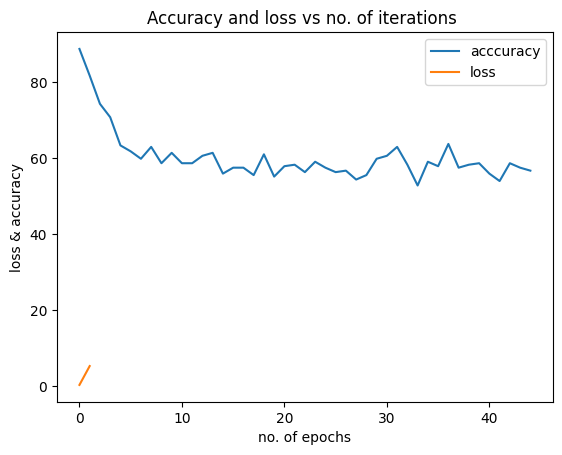

1/1 [==============================] - 0s 19ms/step


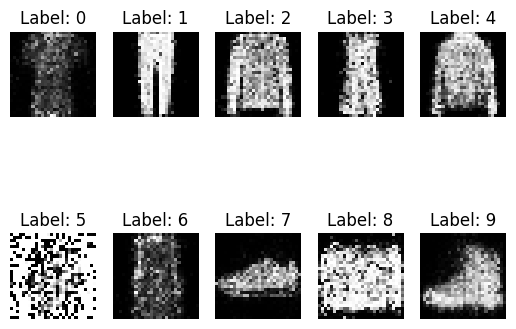

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 4501
4/4 [==============================] - 0s 6ms/step
Iteration : 4502
4/4 [==============================] - 0s 6ms/step
Iteration : 4503
4/4 [==============================] - 0s 5ms/step
Iteration : 4504
4/4 [==============================] - 0s 7ms/step
Iteration : 4505
4/4 [==============================] - 0s 4ms/step
Iteration : 4506
4/4 [==============================] - 0s 5ms/step
Iteration : 4507
4/4 [==============================] - 0s 5ms/step
Iteration : 4508
4/4 [==============================] - 0s 5ms/step
Iteration : 4509
4/4 [==============================] - 0s 4ms/step
Iteration : 4510
4/4 [==============================] - 0s 5ms/step
Iteration : 4511
4/4 [==============================] - 0s 4ms/step
Iteration : 4512
4/4 [==============================] - 0s 5ms/step
Iteration : 4513
4/4 [==============================] - 0s 3ms/step
Iteration : 4514
4/4

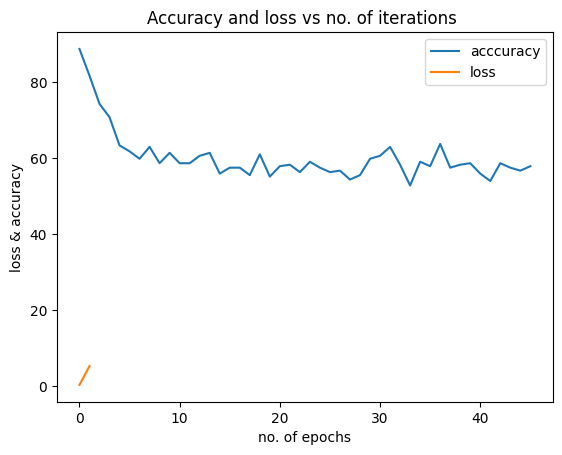

1/1 [==============================] - 0s 20ms/step


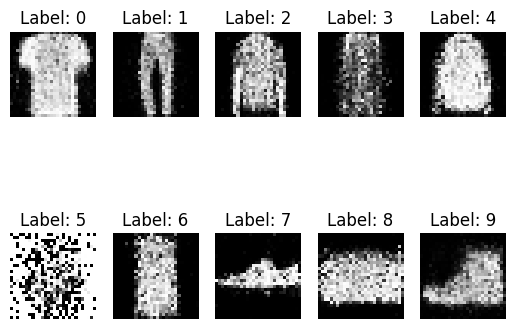

The model structure and weights were saved. 
4/4 [==============================] - 0s 7ms/step
Iteration : 4601
4/4 [==============================] - 0s 3ms/step
Iteration : 4602
4/4 [==============================] - 0s 5ms/step
Iteration : 4603
4/4 [==============================] - 0s 4ms/step
Iteration : 4604
4/4 [==============================] - 0s 4ms/step
Iteration : 4605
4/4 [==============================] - 0s 5ms/step
Iteration : 4606
4/4 [==============================] - 0s 3ms/step
Iteration : 4607
4/4 [==============================] - 0s 4ms/step
Iteration : 4608
4/4 [==============================] - 0s 3ms/step
Iteration : 4609
4/4 [==============================] - 0s 3ms/step
Iteration : 4610
4/4 [==============================] - 0s 3ms/step
Iteration : 4611
4/4 [==============================] - 0s 3ms/step
Iteration : 4612
4/4 [==============================] - 0s 3ms/step
Iteration : 4613
4/4 [==============================] - 0s 4ms/step
Iteration : 4614
4/4

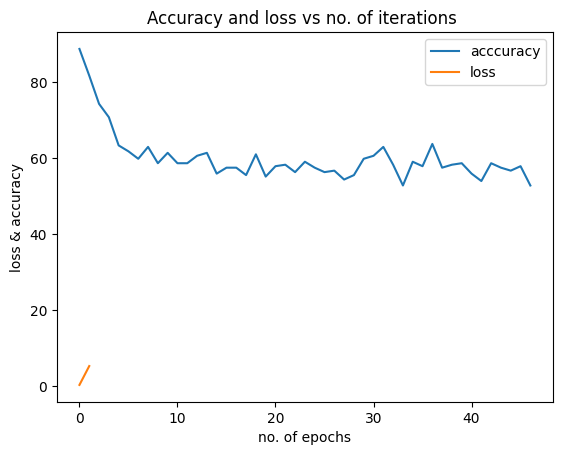

1/1 [==============================] - 0s 22ms/step


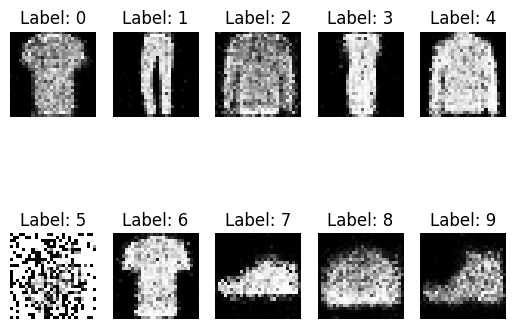

The model structure and weights were saved. 
4/4 [==============================] - 0s 6ms/step
Iteration : 4701
4/4 [==============================] - 0s 4ms/step
Iteration : 4702
4/4 [==============================] - 0s 3ms/step
Iteration : 4703
4/4 [==============================] - 0s 3ms/step
Iteration : 4704
4/4 [==============================] - 0s 3ms/step
Iteration : 4705
4/4 [==============================] - 0s 3ms/step
Iteration : 4706
4/4 [==============================] - 0s 4ms/step
Iteration : 4707
4/4 [==============================] - 0s 5ms/step
Iteration : 4708
4/4 [==============================] - 0s 4ms/step
Iteration : 4709
4/4 [==============================] - 0s 3ms/step
Iteration : 4710
4/4 [==============================] - 0s 6ms/step
Iteration : 4711
4/4 [==============================] - 0s 4ms/step
Iteration : 4712
4/4 [==============================] - 0s 5ms/step
Iteration : 4713
4/4 [==============================] - 0s 4ms/step
Iteration : 4714
4/4

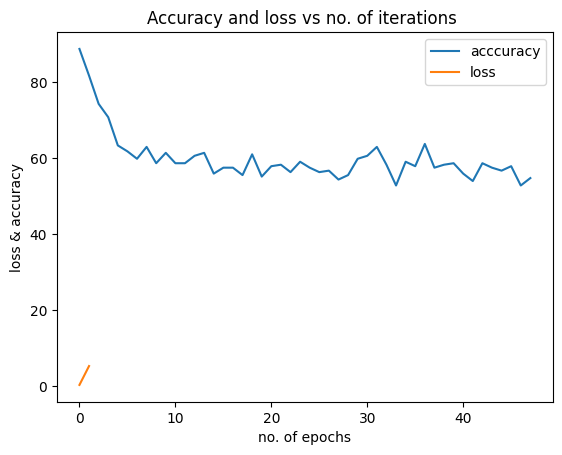

1/1 [==============================] - 0s 40ms/step


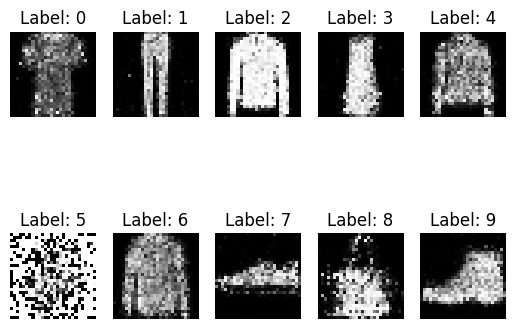

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 4801
4/4 [==============================] - 0s 4ms/step
Iteration : 4802
4/4 [==============================] - 0s 4ms/step
Iteration : 4803
4/4 [==============================] - 0s 4ms/step
Iteration : 4804
4/4 [==============================] - 0s 3ms/step
Iteration : 4805
4/4 [==============================] - 0s 3ms/step
Iteration : 4806
4/4 [==============================] - 0s 3ms/step
Iteration : 4807
4/4 [==============================] - 0s 3ms/step
Iteration : 4808
4/4 [==============================] - 0s 2ms/step
Iteration : 4809
4/4 [==============================] - 0s 3ms/step
Iteration : 4810
4/4 [==============================] - 0s 3ms/step
Iteration : 4811
4/4 [==============================] - 0s 3ms/step
Iteration : 4812
4/4 [==============================] - 0s 3ms/step
Iteration : 4813
4/4 [==============================] - 0s 3ms/step
Iteration : 4814
4/4

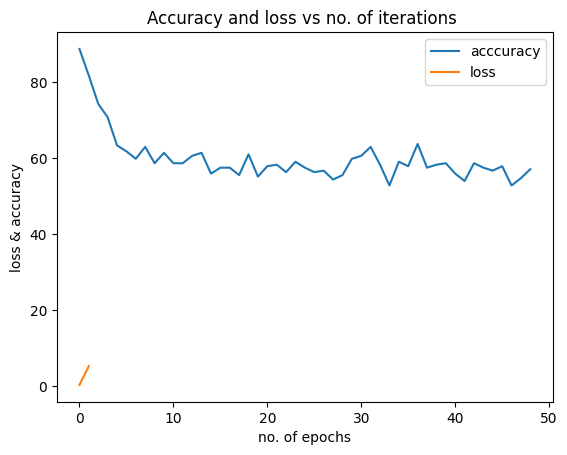

1/1 [==============================] - 0s 25ms/step


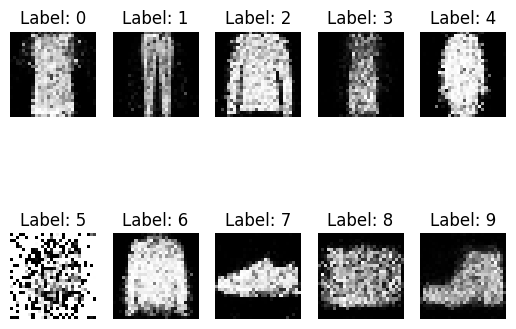

The model structure and weights were saved. 
4/4 [==============================] - 0s 7ms/step
Iteration : 4901
4/4 [==============================] - 0s 6ms/step
Iteration : 4902
4/4 [==============================] - 0s 3ms/step
Iteration : 4903
4/4 [==============================] - 0s 3ms/step
Iteration : 4904
4/4 [==============================] - 0s 3ms/step
Iteration : 4905
4/4 [==============================] - 0s 3ms/step
Iteration : 4906
4/4 [==============================] - 0s 3ms/step
Iteration : 4907
4/4 [==============================] - 0s 4ms/step
Iteration : 4908
4/4 [==============================] - 0s 3ms/step
Iteration : 4909
4/4 [==============================] - 0s 5ms/step
Iteration : 4910
4/4 [==============================] - 0s 4ms/step
Iteration : 4911
4/4 [==============================] - 0s 4ms/step
Iteration : 4912
4/4 [==============================] - 0s 3ms/step
Iteration : 4913
4/4 [==============================] - 0s 3ms/step
Iteration : 4914
4/4

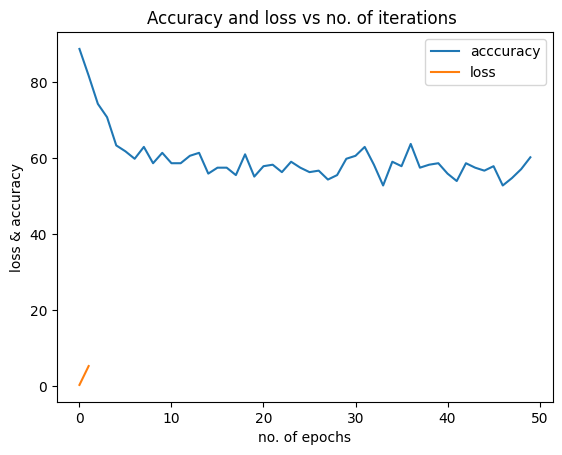

1/1 [==============================] - 0s 20ms/step


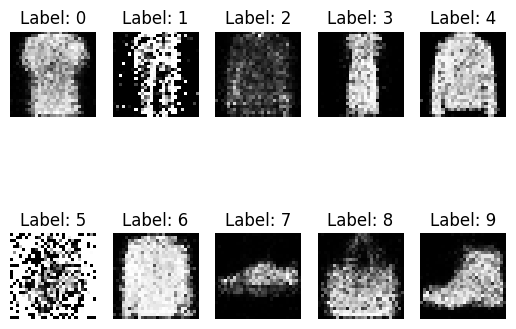

The model structure and weights were saved. 
4/4 [==============================] - 0s 6ms/step
Iteration : 5001
4/4 [==============================] - 0s 7ms/step
Iteration : 5002
4/4 [==============================] - 0s 3ms/step
Iteration : 5003
4/4 [==============================] - 0s 4ms/step
Iteration : 5004
4/4 [==============================] - 0s 4ms/step
Iteration : 5005
4/4 [==============================] - 0s 3ms/step
Iteration : 5006
4/4 [==============================] - 0s 4ms/step
Iteration : 5007
4/4 [==============================] - 0s 7ms/step
Iteration : 5008
4/4 [==============================] - 0s 3ms/step
Iteration : 5009
4/4 [==============================] - 0s 4ms/step
Iteration : 5010
4/4 [==============================] - 0s 4ms/step
Iteration : 5011
4/4 [==============================] - 0s 3ms/step
Iteration : 5012
4/4 [==============================] - 0s 4ms/step
Iteration : 5013
4/4 [==============================] - 0s 5ms/step
Iteration : 5014
4/4

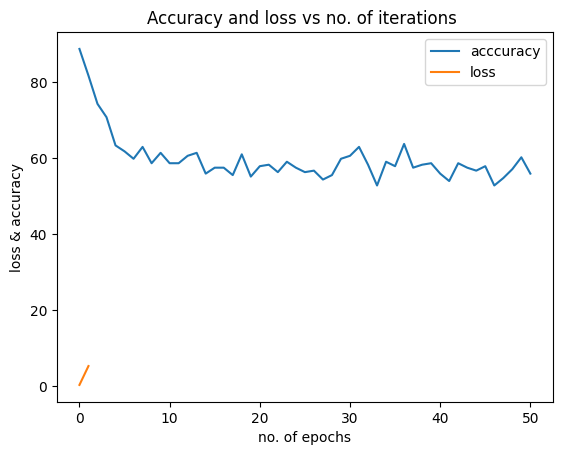

1/1 [==============================] - 0s 35ms/step


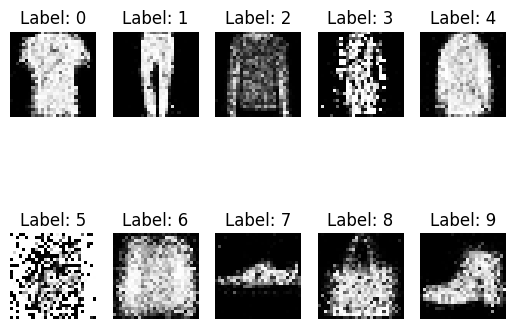

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 5101
4/4 [==============================] - 0s 4ms/step
Iteration : 5102
4/4 [==============================] - 0s 3ms/step
Iteration : 5103
4/4 [==============================] - 0s 4ms/step
Iteration : 5104
4/4 [==============================] - 0s 5ms/step
Iteration : 5105
4/4 [==============================] - 0s 5ms/step
Iteration : 5106
4/4 [==============================] - 0s 3ms/step
Iteration : 5107
4/4 [==============================] - 0s 5ms/step
Iteration : 5108
4/4 [==============================] - 0s 4ms/step
Iteration : 5109
4/4 [==============================] - 0s 3ms/step
Iteration : 5110
4/4 [==============================] - 0s 3ms/step
Iteration : 5111
4/4 [==============================] - 0s 4ms/step
Iteration : 5112
4/4 [==============================] - 0s 5ms/step
Iteration : 5113
4/4 [==============================] - 0s 4ms/step
Iteration : 5114
4/4

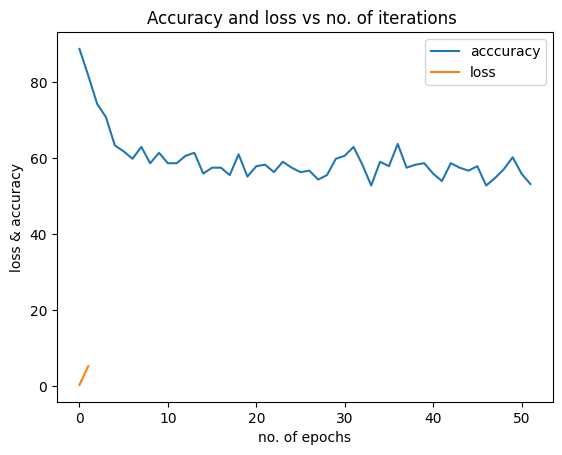

1/1 [==============================] - 0s 21ms/step


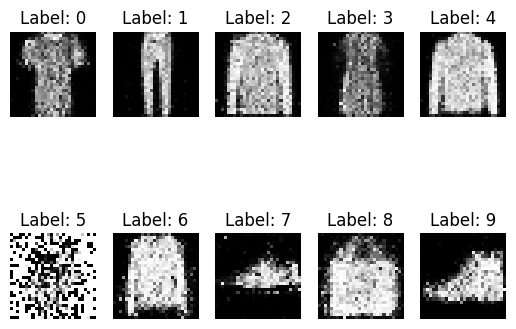

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 5201
4/4 [==============================] - 0s 4ms/step
Iteration : 5202
4/4 [==============================] - 0s 5ms/step
Iteration : 5203
4/4 [==============================] - 0s 4ms/step
Iteration : 5204
4/4 [==============================] - 0s 6ms/step
Iteration : 5205
4/4 [==============================] - 0s 3ms/step
Iteration : 5206
4/4 [==============================] - 0s 3ms/step
Iteration : 5207
4/4 [==============================] - 0s 3ms/step
Iteration : 5208
4/4 [==============================] - 0s 3ms/step
Iteration : 5209
4/4 [==============================] - 0s 3ms/step
Iteration : 5210
4/4 [==============================] - 0s 8ms/step
Iteration : 5211
4/4 [==============================] - 0s 3ms/step
Iteration : 5212
4/4 [==============================] - 0s 5ms/step
Iteration : 5213
4/4 [==============================] - 0s 3ms/step
Iteration : 5214
4/4

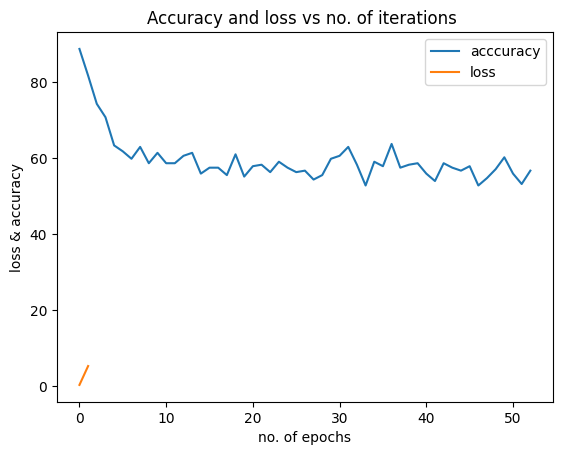

1/1 [==============================] - 0s 29ms/step


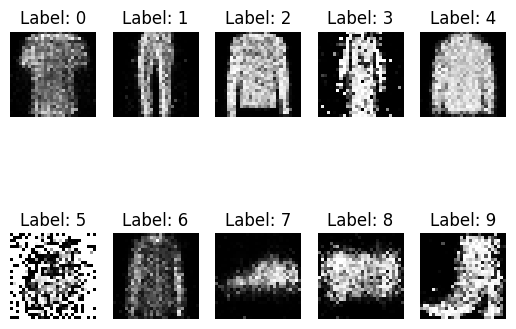

The model structure and weights were saved. 
4/4 [==============================] - 0s 7ms/step
Iteration : 5301
4/4 [==============================] - 0s 3ms/step
Iteration : 5302
4/4 [==============================] - 0s 3ms/step
Iteration : 5303
4/4 [==============================] - 0s 3ms/step
Iteration : 5304
4/4 [==============================] - 0s 4ms/step
Iteration : 5305
4/4 [==============================] - 0s 3ms/step
Iteration : 5306
4/4 [==============================] - 0s 3ms/step
Iteration : 5307
4/4 [==============================] - 0s 3ms/step
Iteration : 5308
4/4 [==============================] - 0s 4ms/step
Iteration : 5309
4/4 [==============================] - 0s 5ms/step
Iteration : 5310
4/4 [==============================] - 0s 3ms/step
Iteration : 5311
4/4 [==============================] - 0s 3ms/step
Iteration : 5312
4/4 [==============================] - 0s 3ms/step
Iteration : 5313
4/4 [==============================] - 0s 4ms/step
Iteration : 5314
4/4

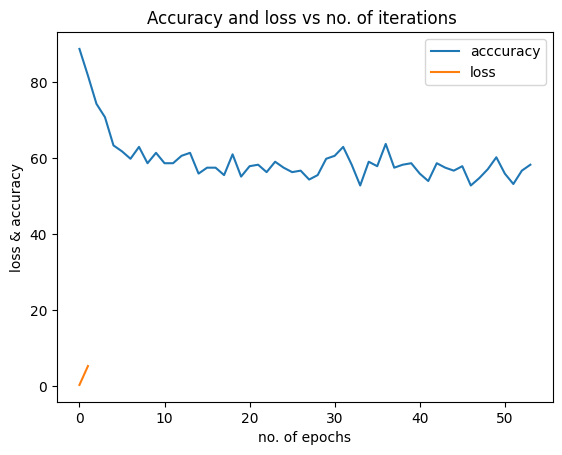

1/1 [==============================] - 0s 27ms/step


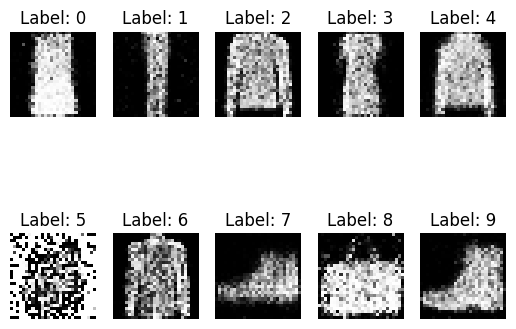

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 5401
4/4 [==============================] - 0s 4ms/step
Iteration : 5402
4/4 [==============================] - 0s 5ms/step
Iteration : 5403
4/4 [==============================] - 0s 5ms/step
Iteration : 5404
4/4 [==============================] - 0s 3ms/step
Iteration : 5405
4/4 [==============================] - 0s 3ms/step
Iteration : 5406
4/4 [==============================] - 0s 3ms/step
Iteration : 5407
4/4 [==============================] - 0s 4ms/step
Iteration : 5408
4/4 [==============================] - 0s 3ms/step
Iteration : 5409
4/4 [==============================] - 0s 3ms/step
Iteration : 5410
4/4 [==============================] - 0s 3ms/step
Iteration : 5411
4/4 [==============================] - 0s 5ms/step
Iteration : 5412
4/4 [==============================] - 0s 4ms/step
Iteration : 5413
4/4 [==============================] - 0s 4ms/step
Iteration : 5414
4/4

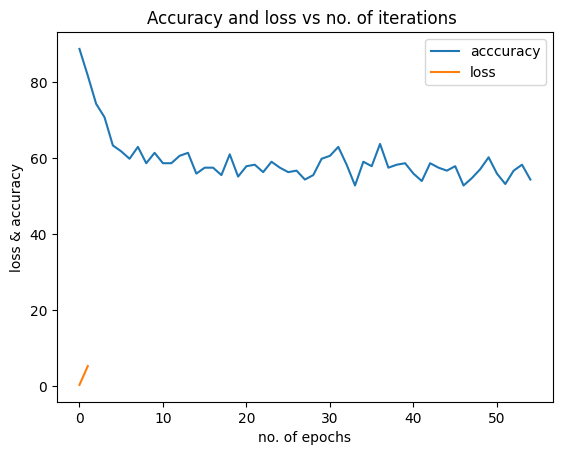

1/1 [==============================] - 0s 27ms/step


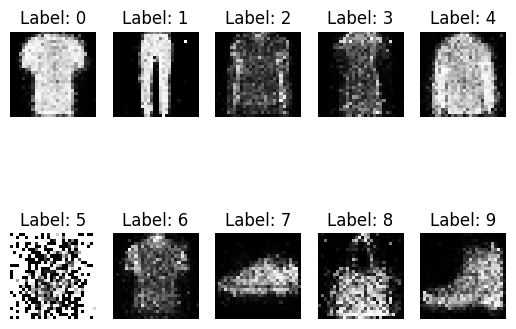

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 5501
4/4 [==============================] - 0s 3ms/step
Iteration : 5502
4/4 [==============================] - 0s 4ms/step
Iteration : 5503
4/4 [==============================] - 0s 4ms/step
Iteration : 5504
4/4 [==============================] - 0s 3ms/step
Iteration : 5505
4/4 [==============================] - 0s 3ms/step
Iteration : 5506
4/4 [==============================] - 0s 3ms/step
Iteration : 5507
4/4 [==============================] - 0s 4ms/step
Iteration : 5508
4/4 [==============================] - 0s 3ms/step
Iteration : 5509
4/4 [==============================] - 0s 3ms/step
Iteration : 5510
4/4 [==============================] - 0s 3ms/step
Iteration : 5511
4/4 [==============================] - 0s 3ms/step
Iteration : 5512
4/4 [==============================] - 0s 3ms/step
Iteration : 5513
4/4 [==============================] - 0s 3ms/step
Iteration : 5514
4/4

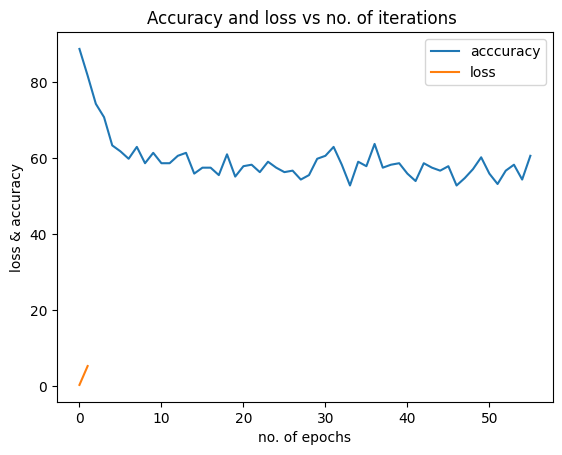

1/1 [==============================] - 0s 27ms/step


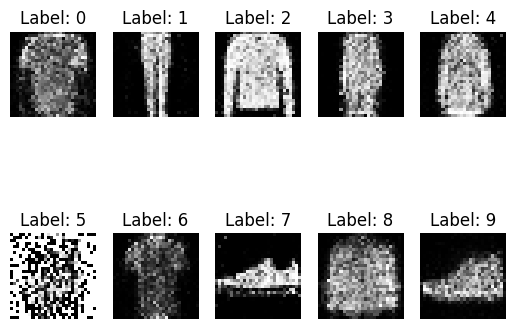

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 5601
4/4 [==============================] - 0s 3ms/step
Iteration : 5602
4/4 [==============================] - 0s 3ms/step
Iteration : 5603
4/4 [==============================] - 0s 3ms/step
Iteration : 5604
4/4 [==============================] - 0s 4ms/step
Iteration : 5605
4/4 [==============================] - 0s 4ms/step
Iteration : 5606
4/4 [==============================] - 0s 4ms/step
Iteration : 5607
4/4 [==============================] - 0s 4ms/step
Iteration : 5608
4/4 [==============================] - 0s 3ms/step
Iteration : 5609
4/4 [==============================] - 0s 3ms/step
Iteration : 5610
4/4 [==============================] - 0s 3ms/step
Iteration : 5611
4/4 [==============================] - 0s 3ms/step
Iteration : 5612
4/4 [==============================] - 0s 3ms/step
Iteration : 5613
4/4 [==============================] - 0s 3ms/step
Iteration : 5614
4/4

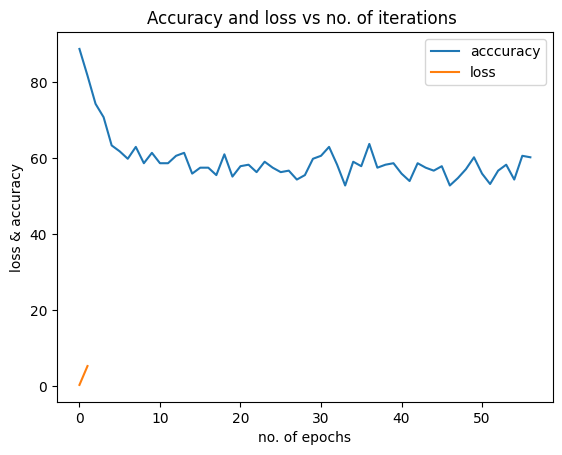

1/1 [==============================] - 0s 30ms/step


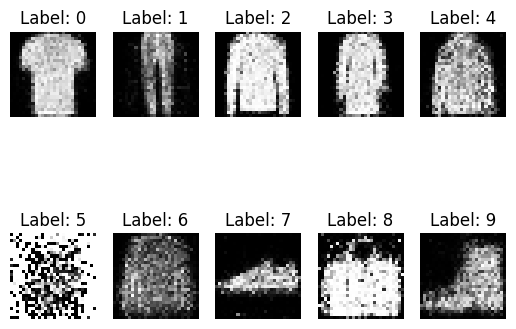

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 5701
4/4 [==============================] - 0s 4ms/step
Iteration : 5702
4/4 [==============================] - 0s 4ms/step
Iteration : 5703
4/4 [==============================] - 0s 6ms/step
Iteration : 5704
4/4 [==============================] - 0s 4ms/step
Iteration : 5705
4/4 [==============================] - 0s 4ms/step
Iteration : 5706
4/4 [==============================] - 0s 3ms/step
Iteration : 5707
4/4 [==============================] - 0s 4ms/step
Iteration : 5708
4/4 [==============================] - 0s 4ms/step
Iteration : 5709
4/4 [==============================] - 0s 4ms/step
Iteration : 5710
4/4 [==============================] - 0s 4ms/step
Iteration : 5711
4/4 [==============================] - 0s 3ms/step
Iteration : 5712
4/4 [==============================] - 0s 3ms/step
Iteration : 5713
4/4 [==============================] - 0s 3ms/step
Iteration : 5714
4/4

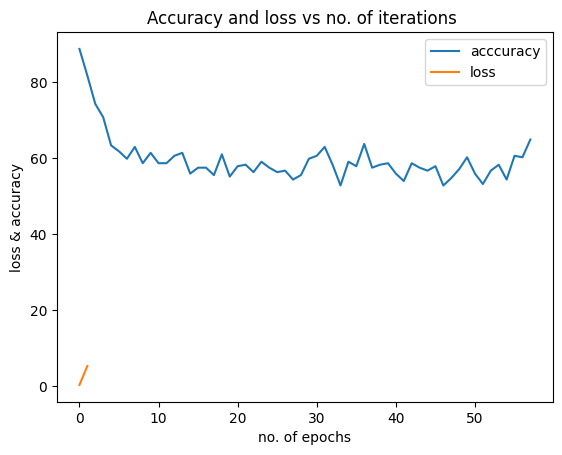

1/1 [==============================] - 0s 39ms/step


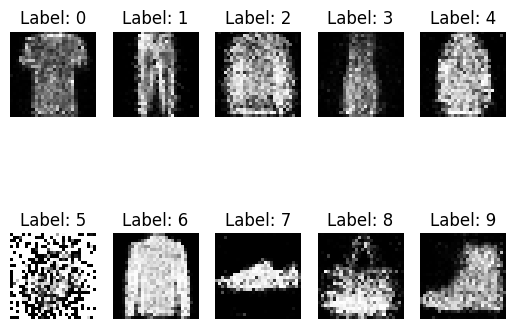

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 5801
4/4 [==============================] - 0s 3ms/step
Iteration : 5802
4/4 [==============================] - 0s 3ms/step
Iteration : 5803
4/4 [==============================] - 0s 3ms/step
Iteration : 5804
4/4 [==============================] - 0s 3ms/step
Iteration : 5805
4/4 [==============================] - 0s 3ms/step
Iteration : 5806
4/4 [==============================] - 0s 3ms/step
Iteration : 5807
4/4 [==============================] - 0s 3ms/step
Iteration : 5808
4/4 [==============================] - 0s 3ms/step
Iteration : 5809
4/4 [==============================] - 0s 4ms/step
Iteration : 5810
4/4 [==============================] - 0s 4ms/step
Iteration : 5811
4/4 [==============================] - 0s 4ms/step
Iteration : 5812
4/4 [==============================] - 0s 4ms/step
Iteration : 5813
4/4 [==============================] - 0s 3ms/step
Iteration : 5814
4/4

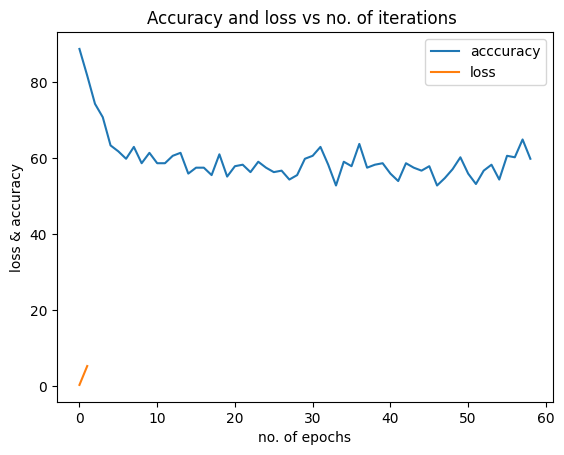

1/1 [==============================] - 0s 26ms/step


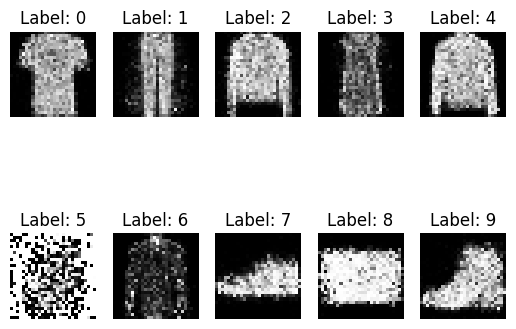

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 5901
4/4 [==============================] - 0s 3ms/step
Iteration : 5902
4/4 [==============================] - 0s 3ms/step
Iteration : 5903
4/4 [==============================] - 0s 3ms/step
Iteration : 5904
4/4 [==============================] - 0s 4ms/step
Iteration : 5905
4/4 [==============================] - 0s 5ms/step
Iteration : 5906
4/4 [==============================] - 0s 4ms/step
Iteration : 5907
4/4 [==============================] - 0s 3ms/step
Iteration : 5908
4/4 [==============================] - 0s 3ms/step
Iteration : 5909
4/4 [==============================] - 0s 4ms/step
Iteration : 5910
4/4 [==============================] - 0s 4ms/step
Iteration : 5911
4/4 [==============================] - 0s 4ms/step
Iteration : 5912
4/4 [==============================] - 0s 4ms/step
Iteration : 5913
4/4 [==============================] - 0s 4ms/step
Iteration : 5914
4/4

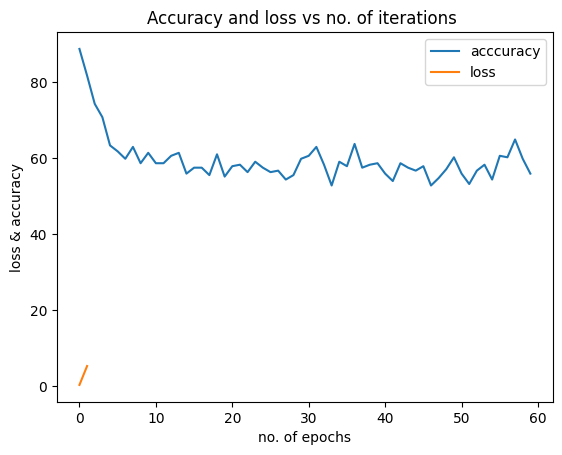

1/1 [==============================] - 0s 29ms/step


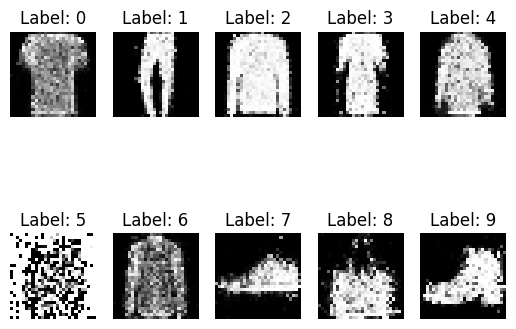

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 6001
4/4 [==============================] - 0s 4ms/step
Iteration : 6002
4/4 [==============================] - 0s 4ms/step
Iteration : 6003
4/4 [==============================] - 0s 4ms/step
Iteration : 6004
4/4 [==============================] - 0s 5ms/step
Iteration : 6005
4/4 [==============================] - 0s 7ms/step
Iteration : 6006
4/4 [==============================] - 0s 4ms/step
Iteration : 6007
4/4 [==============================] - 0s 5ms/step
Iteration : 6008
4/4 [==============================] - 0s 4ms/step
Iteration : 6009
4/4 [==============================] - 0s 4ms/step
Iteration : 6010
4/4 [==============================] - 0s 5ms/step
Iteration : 6011
4/4 [==============================] - 0s 3ms/step
Iteration : 6012
4/4 [==============================] - 0s 3ms/step
Iteration : 6013
4/4 [==============================] - 0s 4ms/step
Iteration : 6014
4/4

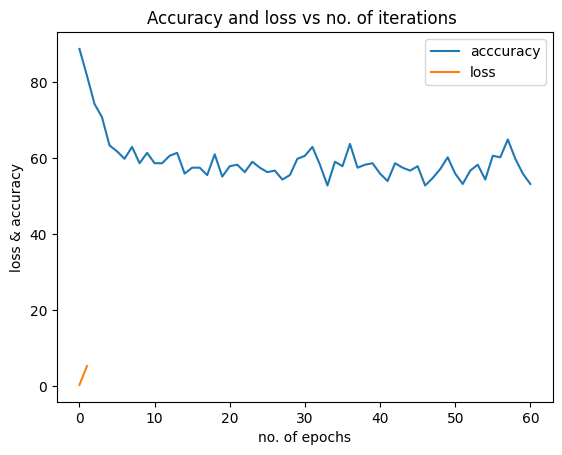

1/1 [==============================] - 0s 29ms/step


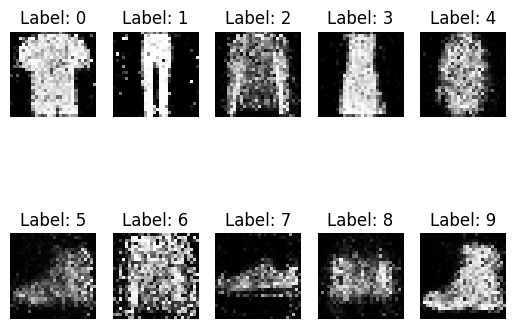

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 6101
4/4 [==============================] - 0s 3ms/step
Iteration : 6102
4/4 [==============================] - 0s 4ms/step
Iteration : 6103
4/4 [==============================] - 0s 4ms/step
Iteration : 6104
4/4 [==============================] - 0s 4ms/step
Iteration : 6105
4/4 [==============================] - 0s 4ms/step
Iteration : 6106
4/4 [==============================] - 0s 3ms/step
Iteration : 6107
4/4 [==============================] - 0s 3ms/step
Iteration : 6108
4/4 [==============================] - 0s 4ms/step
Iteration : 6109
4/4 [==============================] - 0s 4ms/step
Iteration : 6110
4/4 [==============================] - 0s 3ms/step
Iteration : 6111
4/4 [==============================] - 0s 3ms/step
Iteration : 6112
4/4 [==============================] - 0s 3ms/step
Iteration : 6113
4/4 [==============================] - 0s 3ms/step
Iteration : 6114
4/4

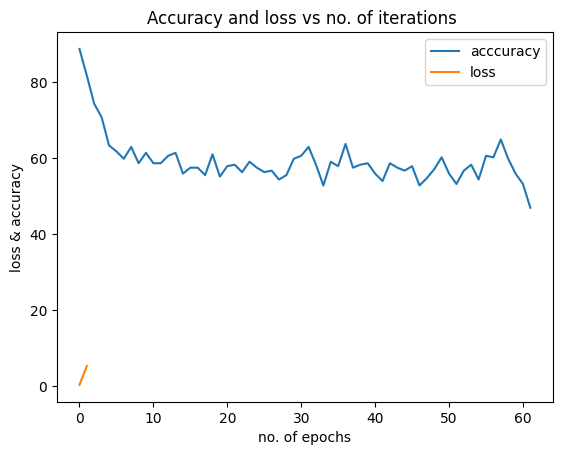

1/1 [==============================] - 0s 27ms/step


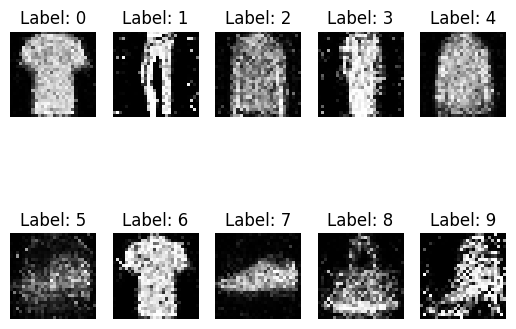

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 6201
4/4 [==============================] - 0s 4ms/step
Iteration : 6202
4/4 [==============================] - 0s 4ms/step
Iteration : 6203
4/4 [==============================] - 0s 3ms/step
Iteration : 6204
4/4 [==============================] - 0s 3ms/step
Iteration : 6205
4/4 [==============================] - 0s 3ms/step
Iteration : 6206
4/4 [==============================] - 0s 4ms/step
Iteration : 6207
4/4 [==============================] - 0s 3ms/step
Iteration : 6208
4/4 [==============================] - 0s 4ms/step
Iteration : 6209
4/4 [==============================] - 0s 4ms/step
Iteration : 6210
4/4 [==============================] - 0s 3ms/step
Iteration : 6211
4/4 [==============================] - 0s 3ms/step
Iteration : 6212
4/4 [==============================] - 0s 4ms/step
Iteration : 6213
4/4 [==============================] - 0s 3ms/step
Iteration : 6214
4/4

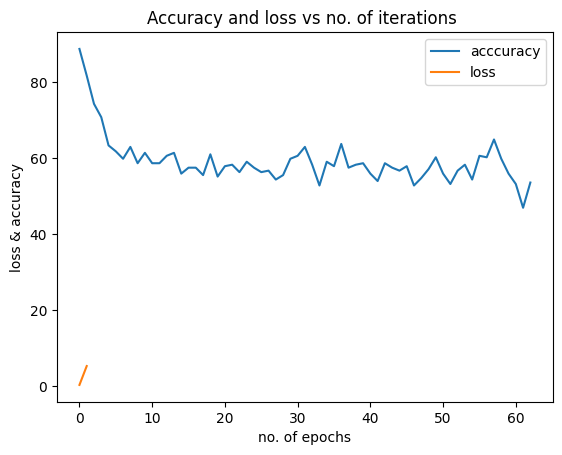

1/1 [==============================] - 0s 29ms/step


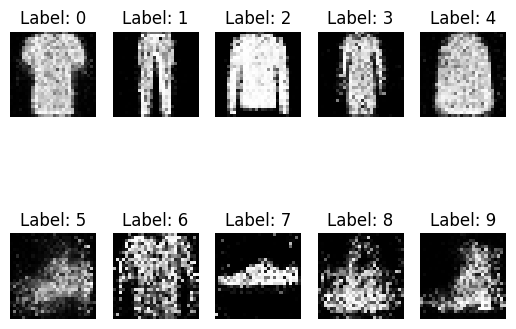

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 6301
4/4 [==============================] - 0s 5ms/step
Iteration : 6302
4/4 [==============================] - 0s 4ms/step
Iteration : 6303
4/4 [==============================] - 0s 4ms/step
Iteration : 6304
4/4 [==============================] - 0s 4ms/step
Iteration : 6305
4/4 [==============================] - 0s 4ms/step
Iteration : 6306
4/4 [==============================] - 0s 4ms/step
Iteration : 6307
4/4 [==============================] - 0s 4ms/step
Iteration : 6308
4/4 [==============================] - 0s 5ms/step
Iteration : 6309
4/4 [==============================] - 0s 3ms/step
Iteration : 6310
4/4 [==============================] - 0s 3ms/step
Iteration : 6311
4/4 [==============================] - 0s 7ms/step
Iteration : 6312
4/4 [==============================] - 0s 5ms/step
Iteration : 6313
4/4 [==============================] - 0s 4ms/step
Iteration : 6314
4/4

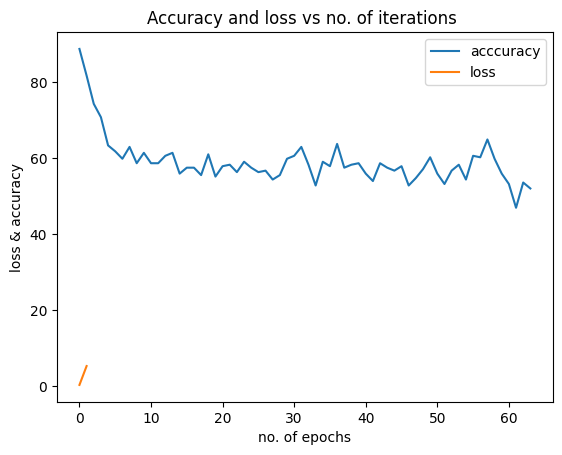

1/1 [==============================] - 0s 27ms/step


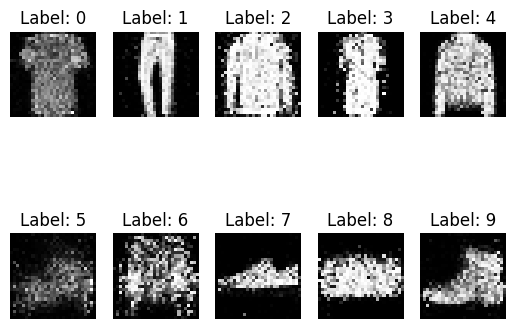

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 6401
4/4 [==============================] - 0s 3ms/step
Iteration : 6402
4/4 [==============================] - 0s 4ms/step
Iteration : 6403
4/4 [==============================] - 0s 3ms/step
Iteration : 6404
4/4 [==============================] - 0s 3ms/step
Iteration : 6405
4/4 [==============================] - 0s 3ms/step
Iteration : 6406
4/4 [==============================] - 0s 4ms/step
Iteration : 6407
4/4 [==============================] - 0s 3ms/step
Iteration : 6408
4/4 [==============================] - 0s 4ms/step
Iteration : 6409
4/4 [==============================] - 0s 4ms/step
Iteration : 6410
4/4 [==============================] - 0s 4ms/step
Iteration : 6411
4/4 [==============================] - 0s 3ms/step
Iteration : 6412
4/4 [==============================] - 0s 4ms/step
Iteration : 6413
4/4 [==============================] - 0s 3ms/step
Iteration : 6414
4/4

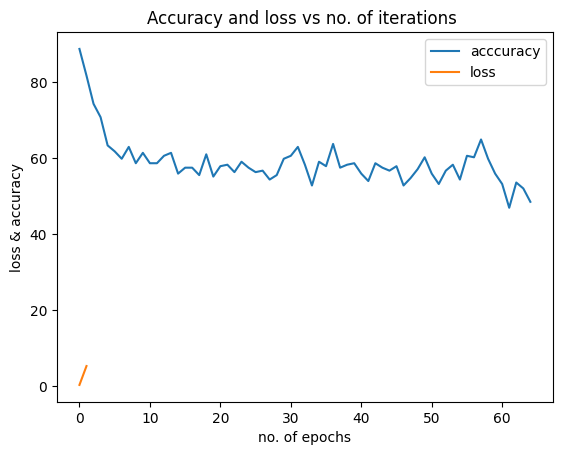

1/1 [==============================] - 0s 33ms/step


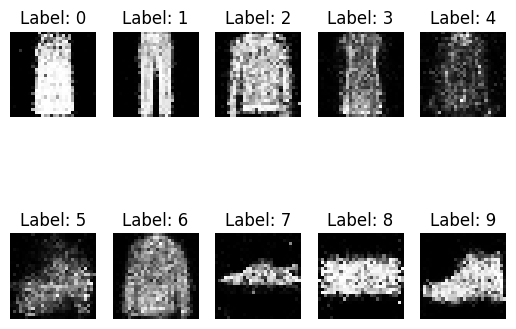

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 6501
4/4 [==============================] - 0s 3ms/step
Iteration : 6502
4/4 [==============================] - 0s 4ms/step
Iteration : 6503
4/4 [==============================] - 0s 3ms/step
Iteration : 6504
4/4 [==============================] - 0s 3ms/step
Iteration : 6505
4/4 [==============================] - 0s 3ms/step
Iteration : 6506
4/4 [==============================] - 0s 3ms/step
Iteration : 6507
4/4 [==============================] - 0s 3ms/step
Iteration : 6508
4/4 [==============================] - 0s 3ms/step
Iteration : 6509
4/4 [==============================] - 0s 3ms/step
Iteration : 6510
4/4 [==============================] - 0s 4ms/step
Iteration : 6511
4/4 [==============================] - 0s 3ms/step
Iteration : 6512
4/4 [==============================] - 0s 4ms/step
Iteration : 6513
4/4 [==============================] - 0s 3ms/step
Iteration : 6514
4/4

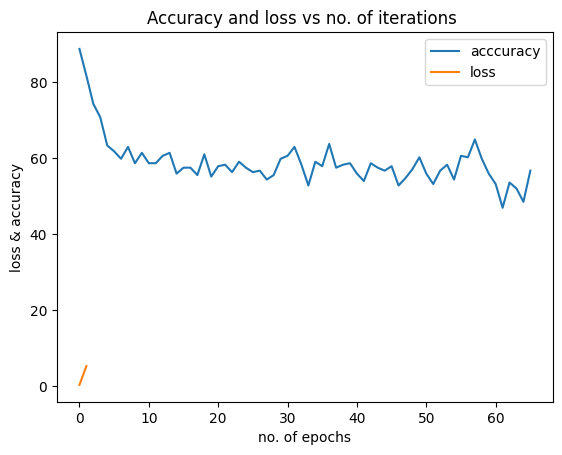

1/1 [==============================] - 0s 37ms/step


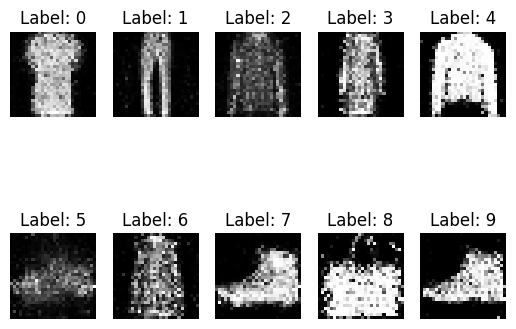

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 6601
4/4 [==============================] - 0s 4ms/step
Iteration : 6602
4/4 [==============================] - 0s 3ms/step
Iteration : 6603
4/4 [==============================] - 0s 4ms/step
Iteration : 6604
4/4 [==============================] - 0s 3ms/step
Iteration : 6605
4/4 [==============================] - 0s 3ms/step
Iteration : 6606
4/4 [==============================] - 0s 3ms/step
Iteration : 6607
4/4 [==============================] - 0s 5ms/step
Iteration : 6608
4/4 [==============================] - 0s 3ms/step
Iteration : 6609
4/4 [==============================] - 0s 3ms/step
Iteration : 6610
4/4 [==============================] - 0s 7ms/step
Iteration : 6611
4/4 [==============================] - 0s 6ms/step
Iteration : 6612
4/4 [==============================] - 0s 3ms/step
Iteration : 6613
4/4 [==============================] - 0s 3ms/step
Iteration : 6614
4/4

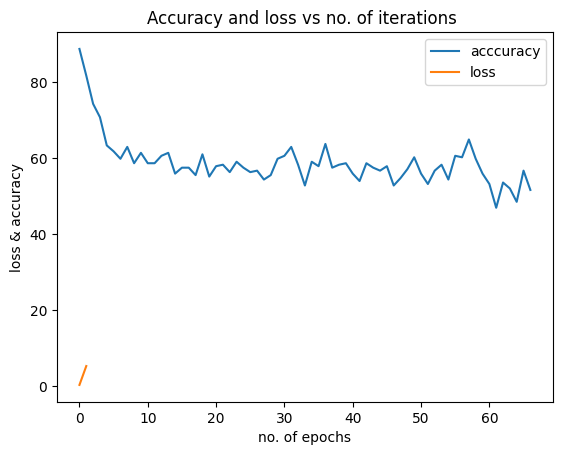

1/1 [==============================] - 0s 27ms/step


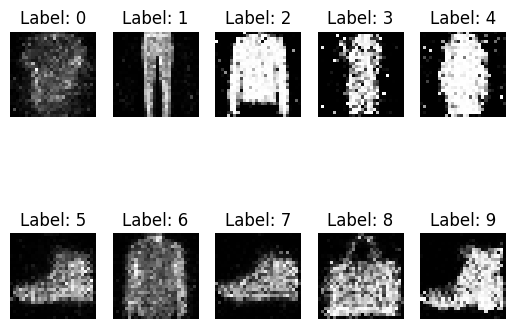

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 6701
4/4 [==============================] - 0s 3ms/step
Iteration : 6702
4/4 [==============================] - 0s 5ms/step
Iteration : 6703
4/4 [==============================] - 0s 3ms/step
Iteration : 6704
4/4 [==============================] - 0s 3ms/step
Iteration : 6705
4/4 [==============================] - 0s 3ms/step
Iteration : 6706
4/4 [==============================] - 0s 4ms/step
Iteration : 6707
4/4 [==============================] - 0s 3ms/step
Iteration : 6708
4/4 [==============================] - 0s 4ms/step
Iteration : 6709
4/4 [==============================] - 0s 3ms/step
Iteration : 6710
4/4 [==============================] - 0s 3ms/step
Iteration : 6711
4/4 [==============================] - 0s 4ms/step
Iteration : 6712
4/4 [==============================] - 0s 4ms/step
Iteration : 6713
4/4 [==============================] - 0s 4ms/step
Iteration : 6714
4/4

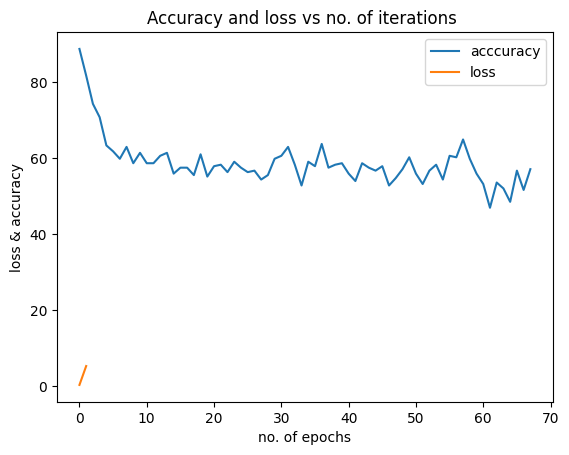

1/1 [==============================] - 0s 32ms/step


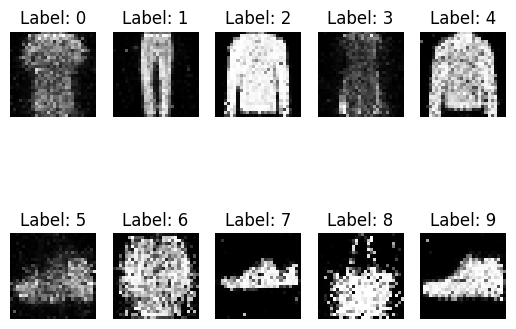

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 6801
4/4 [==============================] - 0s 4ms/step
Iteration : 6802
4/4 [==============================] - 0s 3ms/step
Iteration : 6803
4/4 [==============================] - 0s 3ms/step
Iteration : 6804
4/4 [==============================] - 0s 4ms/step
Iteration : 6805
4/4 [==============================] - 0s 4ms/step
Iteration : 6806
4/4 [==============================] - 0s 3ms/step
Iteration : 6807
4/4 [==============================] - 0s 4ms/step
Iteration : 6808
4/4 [==============================] - 0s 4ms/step
Iteration : 6809
4/4 [==============================] - 0s 4ms/step
Iteration : 6810
4/4 [==============================] - 0s 3ms/step
Iteration : 6811
4/4 [==============================] - 0s 3ms/step
Iteration : 6812
4/4 [==============================] - 0s 3ms/step
Iteration : 6813
4/4 [==============================] - 0s 3ms/step
Iteration : 6814
4/4

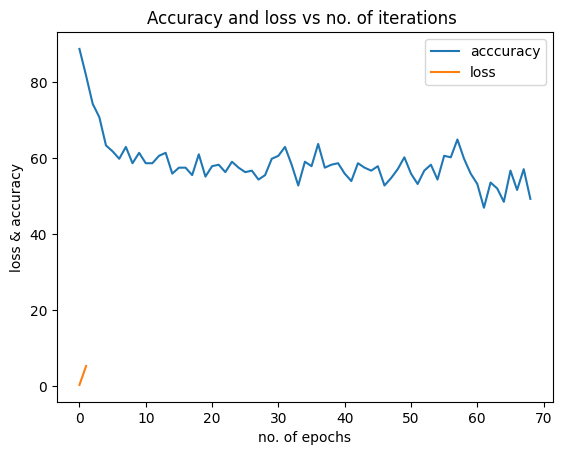

1/1 [==============================] - 0s 29ms/step


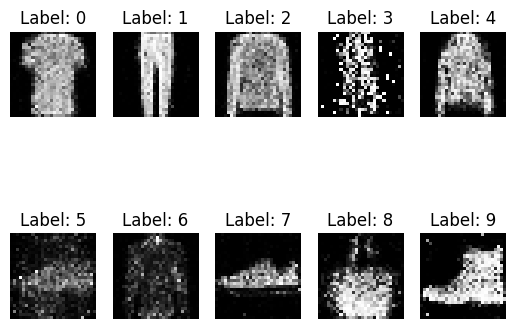

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 6901
4/4 [==============================] - 0s 3ms/step
Iteration : 6902
4/4 [==============================] - 0s 4ms/step
Iteration : 6903
4/4 [==============================] - 0s 5ms/step
Iteration : 6904
4/4 [==============================] - 0s 3ms/step
Iteration : 6905
4/4 [==============================] - 0s 5ms/step
Iteration : 6906
4/4 [==============================] - 0s 4ms/step
Iteration : 6907
4/4 [==============================] - 0s 4ms/step
Iteration : 6908
4/4 [==============================] - 0s 4ms/step
Iteration : 6909
4/4 [==============================] - 0s 3ms/step
Iteration : 6910
4/4 [==============================] - 0s 3ms/step
Iteration : 6911
4/4 [==============================] - 0s 5ms/step
Iteration : 6912
4/4 [==============================] - 0s 5ms/step
Iteration : 6913
4/4 [==============================] - 0s 3ms/step
Iteration : 6914
4/4

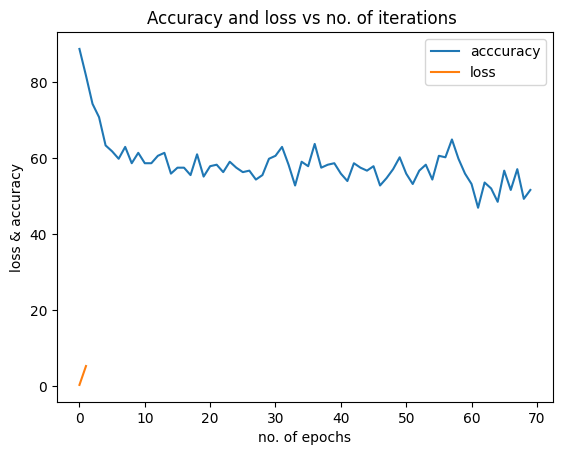

1/1 [==============================] - 0s 30ms/step


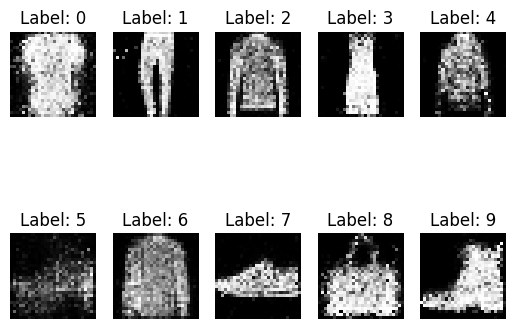

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 7001
4/4 [==============================] - 0s 3ms/step
Iteration : 7002
4/4 [==============================] - 0s 3ms/step
Iteration : 7003
4/4 [==============================] - 0s 3ms/step
Iteration : 7004
4/4 [==============================] - 0s 3ms/step
Iteration : 7005
4/4 [==============================] - 0s 3ms/step
Iteration : 7006
4/4 [==============================] - 0s 3ms/step
Iteration : 7007
4/4 [==============================] - 0s 3ms/step
Iteration : 7008
4/4 [==============================] - 0s 3ms/step
Iteration : 7009
4/4 [==============================] - 0s 3ms/step
Iteration : 7010
4/4 [==============================] - 0s 4ms/step
Iteration : 7011
4/4 [==============================] - 0s 4ms/step
Iteration : 7012
4/4 [==============================] - 0s 3ms/step
Iteration : 7013
4/4 [==============================] - 0s 5ms/step
Iteration : 7014
4/4

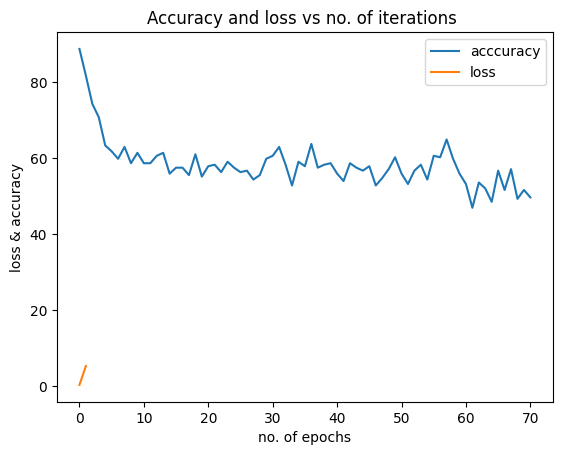

1/1 [==============================] - 0s 27ms/step


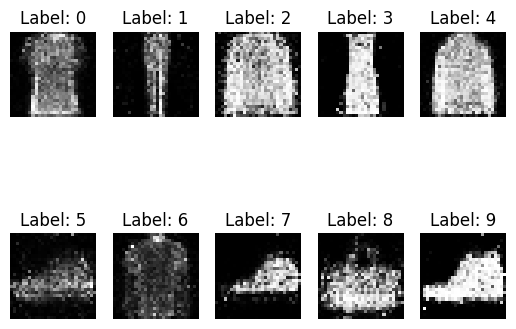

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 7101
4/4 [==============================] - 0s 4ms/step
Iteration : 7102
4/4 [==============================] - 0s 3ms/step
Iteration : 7103
4/4 [==============================] - 0s 3ms/step
Iteration : 7104
4/4 [==============================] - 0s 4ms/step
Iteration : 7105
4/4 [==============================] - 0s 4ms/step
Iteration : 7106
4/4 [==============================] - 0s 3ms/step
Iteration : 7107
4/4 [==============================] - 0s 3ms/step
Iteration : 7108
4/4 [==============================] - 0s 3ms/step
Iteration : 7109
4/4 [==============================] - 0s 4ms/step
Iteration : 7110
4/4 [==============================] - 0s 4ms/step
Iteration : 7111
4/4 [==============================] - 0s 4ms/step
Iteration : 7112
4/4 [==============================] - 0s 3ms/step
Iteration : 7113
4/4 [==============================] - 0s 3ms/step
Iteration : 7114
4/4

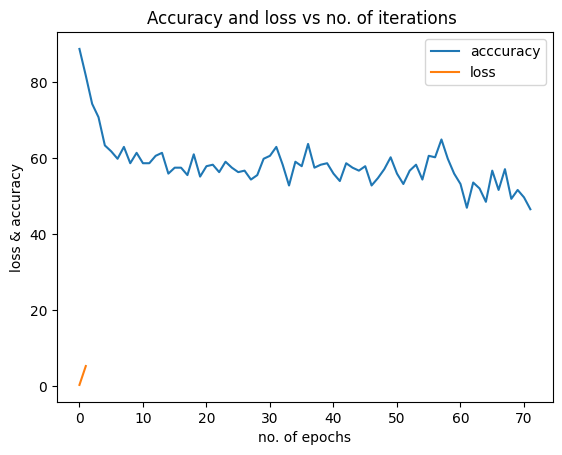

1/1 [==============================] - 0s 33ms/step


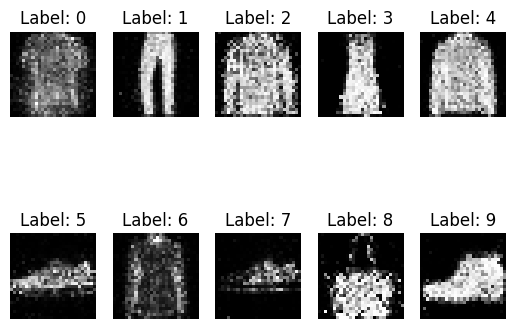

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 7201
4/4 [==============================] - 0s 4ms/step
Iteration : 7202
4/4 [==============================] - 0s 5ms/step
Iteration : 7203
4/4 [==============================] - 0s 5ms/step
Iteration : 7204
4/4 [==============================] - 0s 4ms/step
Iteration : 7205
4/4 [==============================] - 0s 5ms/step
Iteration : 7206
4/4 [==============================] - 0s 6ms/step
Iteration : 7207
4/4 [==============================] - 0s 3ms/step
Iteration : 7208
4/4 [==============================] - 0s 3ms/step
Iteration : 7209
4/4 [==============================] - 0s 3ms/step
Iteration : 7210
4/4 [==============================] - 0s 4ms/step
Iteration : 7211
4/4 [==============================] - 0s 4ms/step
Iteration : 7212
4/4 [==============================] - 0s 4ms/step
Iteration : 7213
4/4 [==============================] - 0s 4ms/step
Iteration : 7214
4/4

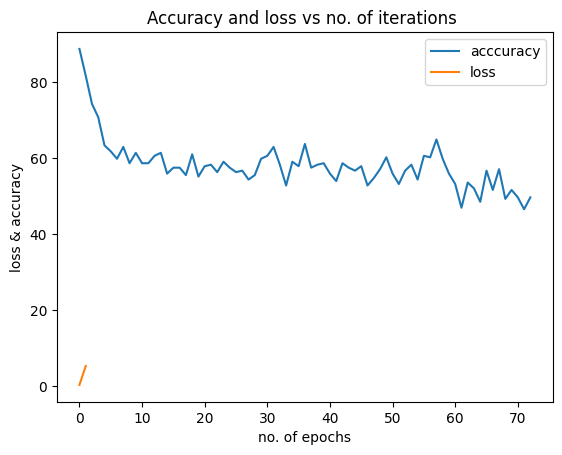

1/1 [==============================] - 0s 34ms/step


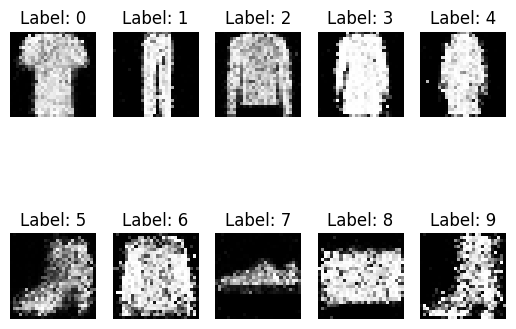

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 7301
4/4 [==============================] - 0s 4ms/step
Iteration : 7302
4/4 [==============================] - 0s 3ms/step
Iteration : 7303
4/4 [==============================] - 0s 3ms/step
Iteration : 7304
4/4 [==============================] - 0s 4ms/step
Iteration : 7305
4/4 [==============================] - 0s 3ms/step
Iteration : 7306
4/4 [==============================] - 0s 3ms/step
Iteration : 7307
4/4 [==============================] - 0s 3ms/step
Iteration : 7308
4/4 [==============================] - 0s 3ms/step
Iteration : 7309
4/4 [==============================] - 0s 3ms/step
Iteration : 7310
4/4 [==============================] - 0s 3ms/step
Iteration : 7311
4/4 [==============================] - 0s 3ms/step
Iteration : 7312
4/4 [==============================] - 0s 4ms/step
Iteration : 7313
4/4 [==============================] - 0s 3ms/step
Iteration : 7314
4/4

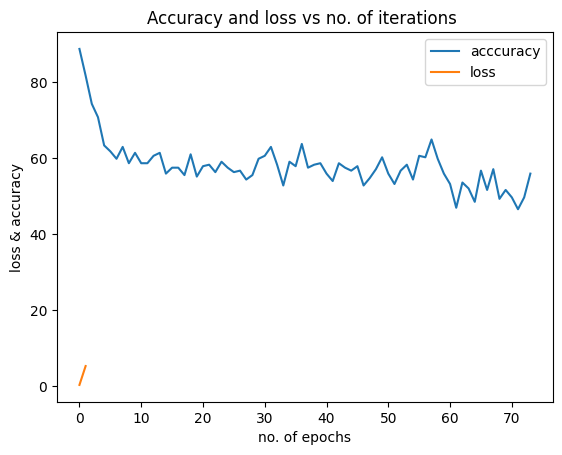

1/1 [==============================] - 0s 27ms/step


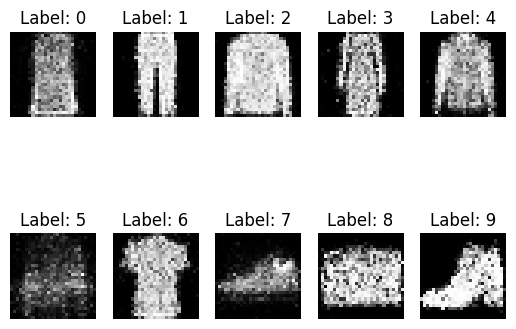

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 7401
4/4 [==============================] - 0s 4ms/step
Iteration : 7402
4/4 [==============================] - 0s 4ms/step
Iteration : 7403
4/4 [==============================] - 0s 3ms/step
Iteration : 7404
4/4 [==============================] - 0s 4ms/step
Iteration : 7405
4/4 [==============================] - 0s 3ms/step
Iteration : 7406
4/4 [==============================] - 0s 3ms/step
Iteration : 7407
4/4 [==============================] - 0s 4ms/step
Iteration : 7408
4/4 [==============================] - 0s 3ms/step
Iteration : 7409
4/4 [==============================] - 0s 3ms/step
Iteration : 7410
4/4 [==============================] - 0s 3ms/step
Iteration : 7411
4/4 [==============================] - 0s 4ms/step
Iteration : 7412
4/4 [==============================] - 0s 3ms/step
Iteration : 7413
4/4 [==============================] - 0s 3ms/step
Iteration : 7414
4/4

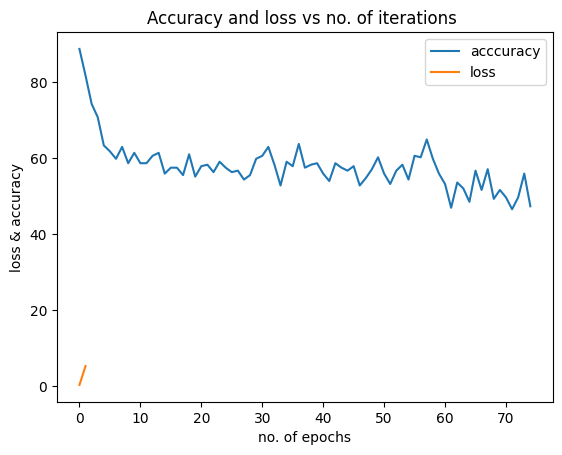

1/1 [==============================] - 0s 28ms/step


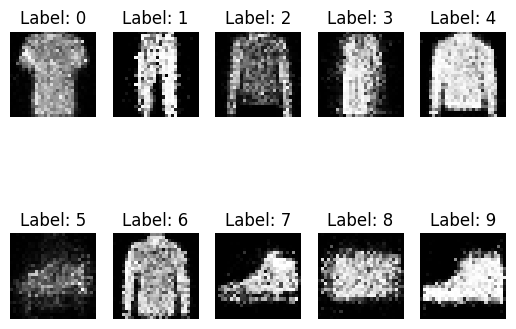

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 7501
4/4 [==============================] - 0s 4ms/step
Iteration : 7502
4/4 [==============================] - 0s 3ms/step
Iteration : 7503
4/4 [==============================] - 0s 6ms/step
Iteration : 7504
4/4 [==============================] - 0s 5ms/step
Iteration : 7505
4/4 [==============================] - 0s 6ms/step
Iteration : 7506
4/4 [==============================] - 0s 3ms/step
Iteration : 7507
4/4 [==============================] - 0s 3ms/step
Iteration : 7508
4/4 [==============================] - 0s 3ms/step
Iteration : 7509
4/4 [==============================] - 0s 3ms/step
Iteration : 7510
4/4 [==============================] - 0s 3ms/step
Iteration : 7511
4/4 [==============================] - 0s 5ms/step
Iteration : 7512
4/4 [==============================] - 0s 4ms/step
Iteration : 7513
4/4 [==============================] - 0s 4ms/step
Iteration : 7514
4/4

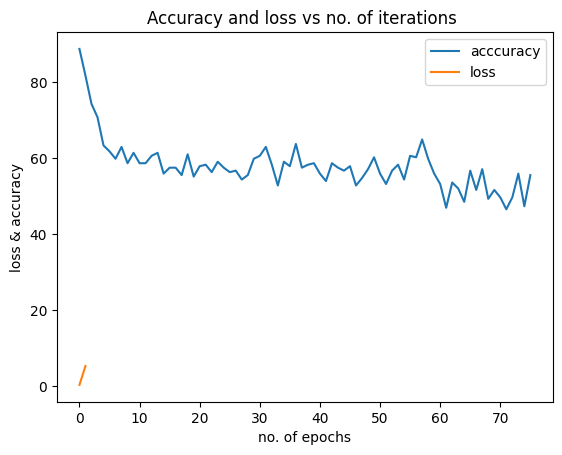

1/1 [==============================] - 0s 32ms/step


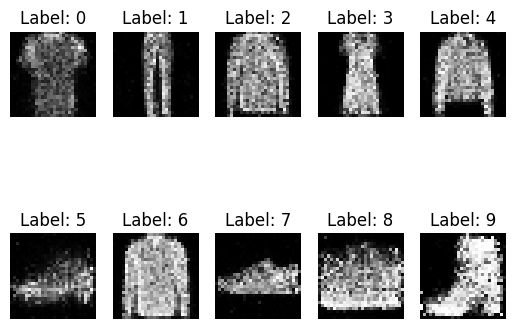

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 7601
4/4 [==============================] - 0s 3ms/step
Iteration : 7602
4/4 [==============================] - 0s 4ms/step
Iteration : 7603
4/4 [==============================] - 0s 3ms/step
Iteration : 7604
4/4 [==============================] - 0s 3ms/step
Iteration : 7605
4/4 [==============================] - 0s 5ms/step
Iteration : 7606
4/4 [==============================] - 0s 3ms/step
Iteration : 7607
4/4 [==============================] - 0s 3ms/step
Iteration : 7608
4/4 [==============================] - 0s 4ms/step
Iteration : 7609
4/4 [==============================] - 0s 3ms/step
Iteration : 7610
4/4 [==============================] - 0s 3ms/step
Iteration : 7611
4/4 [==============================] - 0s 3ms/step
Iteration : 7612
4/4 [==============================] - 0s 3ms/step
Iteration : 7613
4/4 [==============================] - 0s 3ms/step
Iteration : 7614
4/4

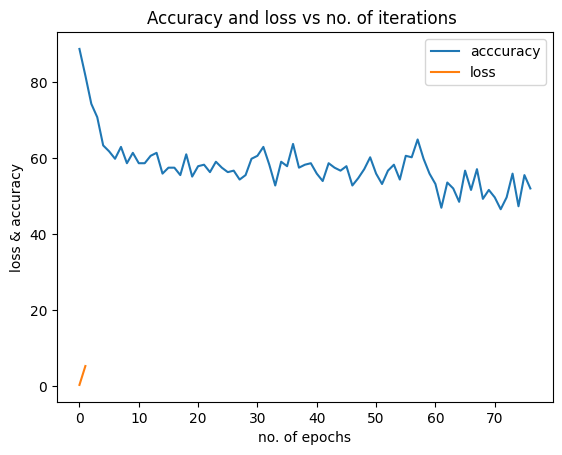

1/1 [==============================] - 0s 26ms/step


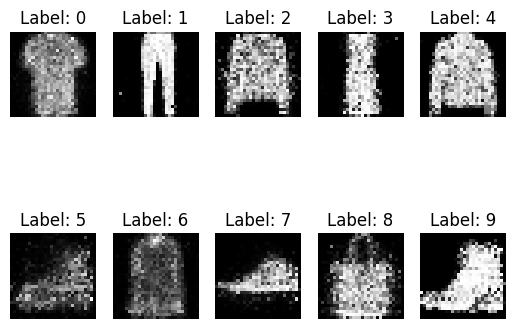

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 7701
4/4 [==============================] - 0s 4ms/step
Iteration : 7702
4/4 [==============================] - 0s 4ms/step
Iteration : 7703
4/4 [==============================] - 0s 3ms/step
Iteration : 7704
4/4 [==============================] - 0s 3ms/step
Iteration : 7705
4/4 [==============================] - 0s 3ms/step
Iteration : 7706
4/4 [==============================] - 0s 4ms/step
Iteration : 7707
4/4 [==============================] - 0s 4ms/step
Iteration : 7708
4/4 [==============================] - 0s 4ms/step
Iteration : 7709
4/4 [==============================] - 0s 3ms/step
Iteration : 7710
4/4 [==============================] - 0s 3ms/step
Iteration : 7711
4/4 [==============================] - 0s 4ms/step
Iteration : 7712
4/4 [==============================] - 0s 3ms/step
Iteration : 7713
4/4 [==============================] - 0s 3ms/step
Iteration : 7714
4/4

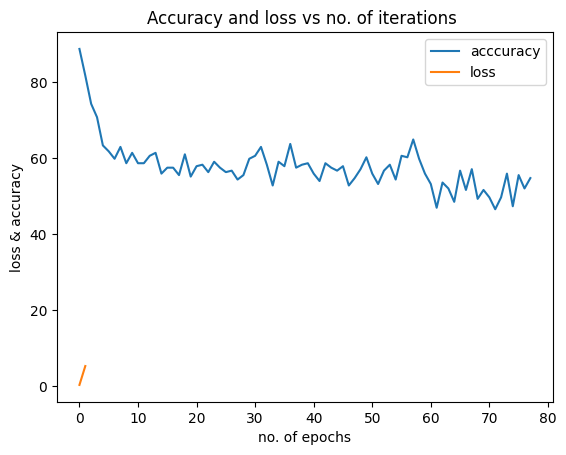

1/1 [==============================] - 0s 26ms/step


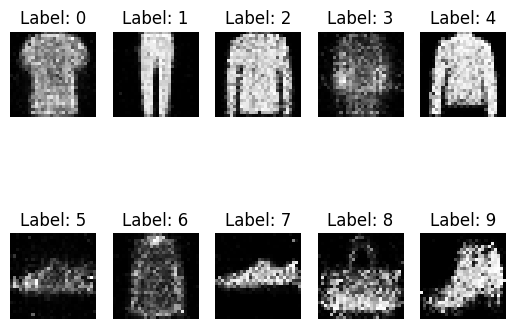

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 7801
4/4 [==============================] - 0s 4ms/step
Iteration : 7802
4/4 [==============================] - 0s 4ms/step
Iteration : 7803
4/4 [==============================] - 0s 3ms/step
Iteration : 7804
4/4 [==============================] - 0s 5ms/step
Iteration : 7805
4/4 [==============================] - 0s 4ms/step
Iteration : 7806
4/4 [==============================] - 0s 3ms/step
Iteration : 7807
4/4 [==============================] - 0s 4ms/step
Iteration : 7808
4/4 [==============================] - 0s 4ms/step
Iteration : 7809
4/4 [==============================] - 0s 6ms/step
Iteration : 7810
4/4 [==============================] - 0s 5ms/step
Iteration : 7811
4/4 [==============================] - 0s 4ms/step
Iteration : 7812
4/4 [==============================] - 0s 3ms/step
Iteration : 7813
4/4 [==============================] - 0s 5ms/step
Iteration : 7814
4/4

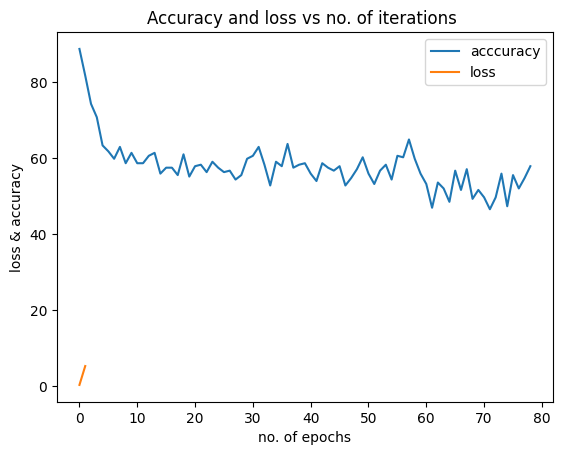

1/1 [==============================] - 0s 28ms/step


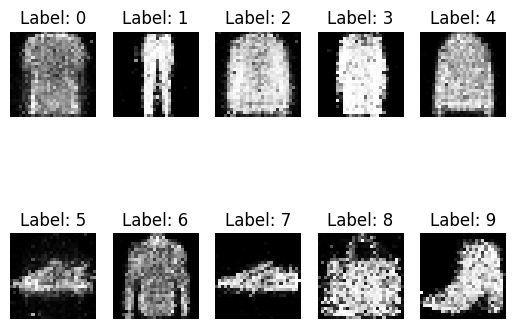

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 7901
4/4 [==============================] - 0s 3ms/step
Iteration : 7902
4/4 [==============================] - 0s 4ms/step
Iteration : 7903
4/4 [==============================] - 0s 4ms/step
Iteration : 7904
4/4 [==============================] - 0s 4ms/step
Iteration : 7905
4/4 [==============================] - 0s 4ms/step
Iteration : 7906
4/4 [==============================] - 0s 3ms/step
Iteration : 7907
4/4 [==============================] - 0s 4ms/step
Iteration : 7908
4/4 [==============================] - 0s 5ms/step
Iteration : 7909
4/4 [==============================] - 0s 3ms/step
Iteration : 7910
4/4 [==============================] - 0s 4ms/step
Iteration : 7911
4/4 [==============================] - 0s 4ms/step
Iteration : 7912
4/4 [==============================] - 0s 3ms/step
Iteration : 7913
4/4 [==============================] - 0s 3ms/step
Iteration : 7914
4/4

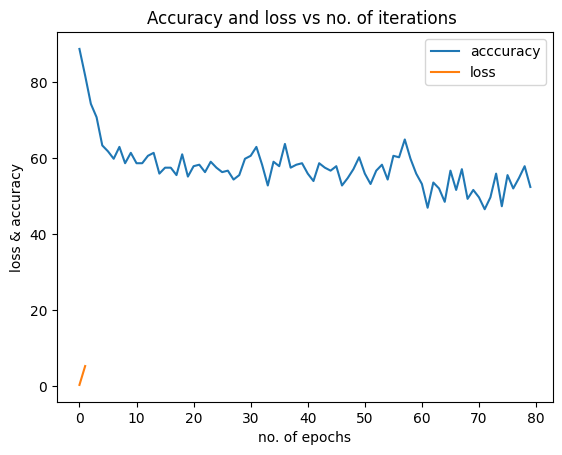

1/1 [==============================] - 0s 28ms/step


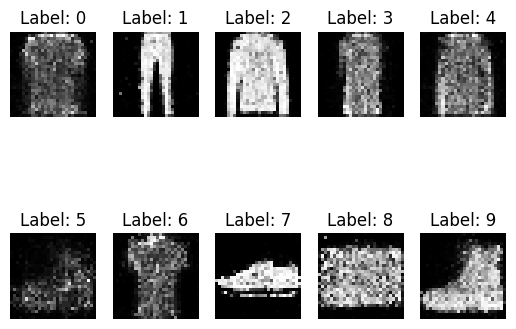

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 8001
4/4 [==============================] - 0s 4ms/step
Iteration : 8002
4/4 [==============================] - 0s 4ms/step
Iteration : 8003
4/4 [==============================] - 0s 3ms/step
Iteration : 8004
4/4 [==============================] - 0s 3ms/step
Iteration : 8005
4/4 [==============================] - 0s 3ms/step
Iteration : 8006
4/4 [==============================] - 0s 3ms/step
Iteration : 8007
4/4 [==============================] - 0s 3ms/step
Iteration : 8008
4/4 [==============================] - 0s 3ms/step
Iteration : 8009
4/4 [==============================] - 0s 3ms/step
Iteration : 8010
4/4 [==============================] - 0s 4ms/step
Iteration : 8011
4/4 [==============================] - 0s 3ms/step
Iteration : 8012
4/4 [==============================] - 0s 3ms/step
Iteration : 8013
4/4 [==============================] - 0s 3ms/step
Iteration : 8014
4/4

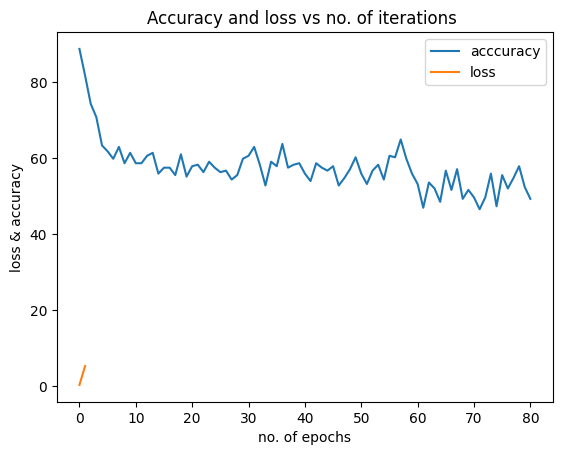

1/1 [==============================] - 0s 25ms/step


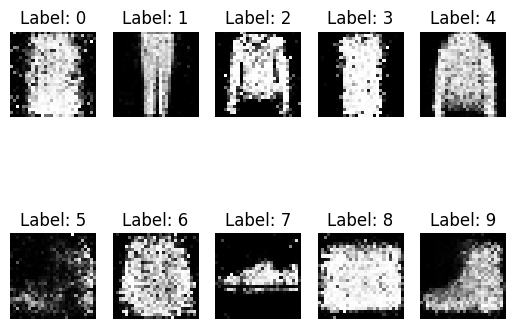

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 8101
4/4 [==============================] - 0s 3ms/step
Iteration : 8102
4/4 [==============================] - 0s 7ms/step
Iteration : 8103
4/4 [==============================] - 0s 3ms/step
Iteration : 8104
4/4 [==============================] - 0s 5ms/step
Iteration : 8105
4/4 [==============================] - 0s 5ms/step
Iteration : 8106
4/4 [==============================] - 0s 3ms/step
Iteration : 8107
4/4 [==============================] - 0s 4ms/step
Iteration : 8108
4/4 [==============================] - 0s 5ms/step
Iteration : 8109
4/4 [==============================] - 0s 3ms/step
Iteration : 8110
4/4 [==============================] - 0s 3ms/step
Iteration : 8111
4/4 [==============================] - 0s 5ms/step
Iteration : 8112
4/4 [==============================] - 0s 4ms/step
Iteration : 8113
4/4 [==============================] - 0s 4ms/step
Iteration : 8114
4/4

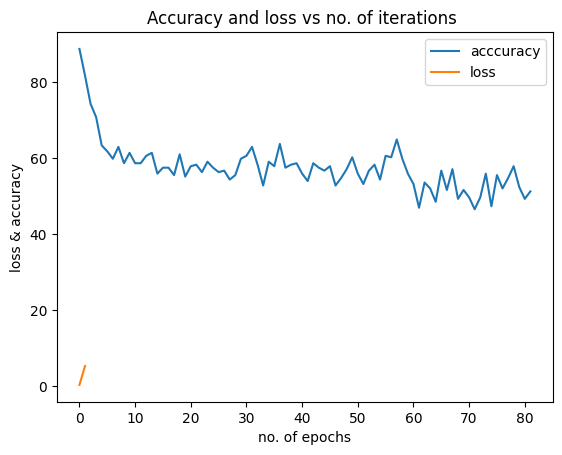

1/1 [==============================] - 0s 32ms/step


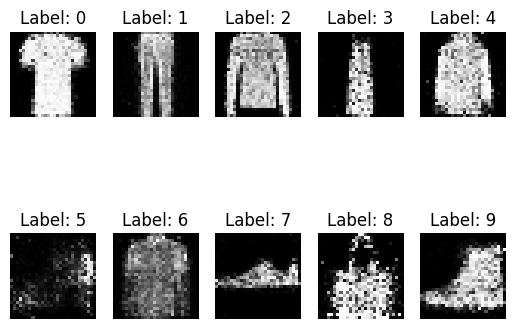

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 8201
4/4 [==============================] - 0s 3ms/step
Iteration : 8202
4/4 [==============================] - 0s 5ms/step
Iteration : 8203
4/4 [==============================] - 0s 3ms/step
Iteration : 8204
4/4 [==============================] - 0s 3ms/step
Iteration : 8205
4/4 [==============================] - 0s 3ms/step
Iteration : 8206
4/4 [==============================] - 0s 3ms/step
Iteration : 8207
4/4 [==============================] - 0s 4ms/step
Iteration : 8208
4/4 [==============================] - 0s 4ms/step
Iteration : 8209
4/4 [==============================] - 0s 3ms/step
Iteration : 8210
4/4 [==============================] - 0s 5ms/step
Iteration : 8211
4/4 [==============================] - 0s 3ms/step
Iteration : 8212
4/4 [==============================] - 0s 3ms/step
Iteration : 8213
4/4 [==============================] - 0s 3ms/step
Iteration : 8214
4/4

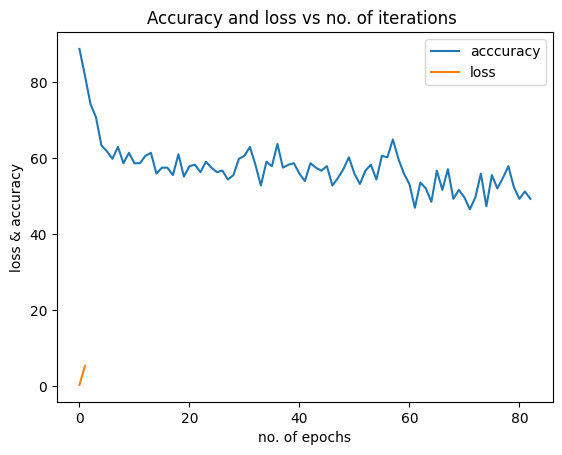

1/1 [==============================] - 0s 34ms/step


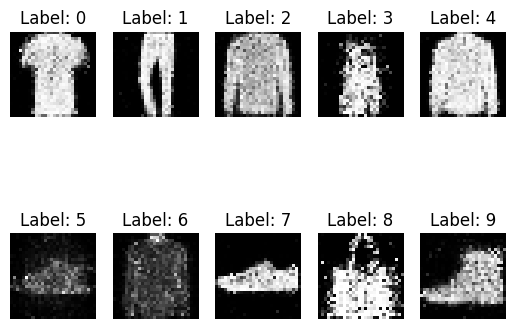

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 8301
4/4 [==============================] - 0s 3ms/step
Iteration : 8302
4/4 [==============================] - 0s 3ms/step
Iteration : 8303
4/4 [==============================] - 0s 3ms/step
Iteration : 8304
4/4 [==============================] - 0s 4ms/step
Iteration : 8305
4/4 [==============================] - 0s 4ms/step
Iteration : 8306
4/4 [==============================] - 0s 4ms/step
Iteration : 8307
4/4 [==============================] - 0s 3ms/step
Iteration : 8308
4/4 [==============================] - 0s 3ms/step
Iteration : 8309
4/4 [==============================] - 0s 3ms/step
Iteration : 8310
4/4 [==============================] - 0s 3ms/step
Iteration : 8311
4/4 [==============================] - 0s 4ms/step
Iteration : 8312
4/4 [==============================] - 0s 3ms/step
Iteration : 8313
4/4 [==============================] - 0s 3ms/step
Iteration : 8314
4/4

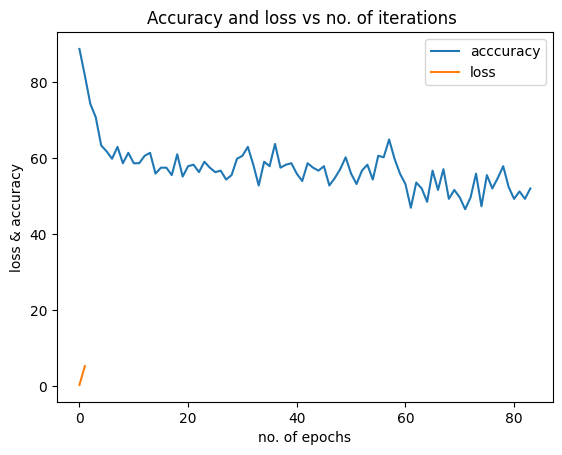

1/1 [==============================] - 0s 32ms/step


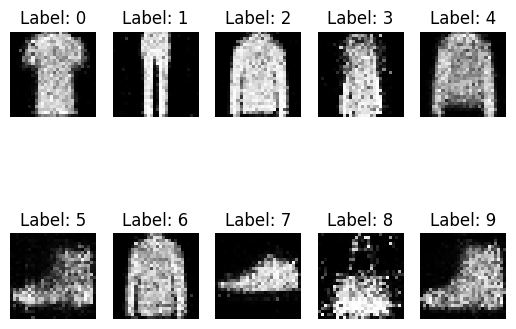

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 8401
4/4 [==============================] - 0s 5ms/step
Iteration : 8402
4/4 [==============================] - 0s 3ms/step
Iteration : 8403
4/4 [==============================] - 0s 3ms/step
Iteration : 8404
4/4 [==============================] - 0s 4ms/step
Iteration : 8405
4/4 [==============================] - 0s 3ms/step
Iteration : 8406
4/4 [==============================] - 0s 4ms/step
Iteration : 8407
4/4 [==============================] - 0s 5ms/step
Iteration : 8408
4/4 [==============================] - 0s 3ms/step
Iteration : 8409
4/4 [==============================] - 0s 3ms/step
Iteration : 8410
4/4 [==============================] - 0s 3ms/step
Iteration : 8411
4/4 [==============================] - 0s 3ms/step
Iteration : 8412
4/4 [==============================] - 0s 5ms/step
Iteration : 8413
4/4 [==============================] - 0s 4ms/step
Iteration : 8414
4/4

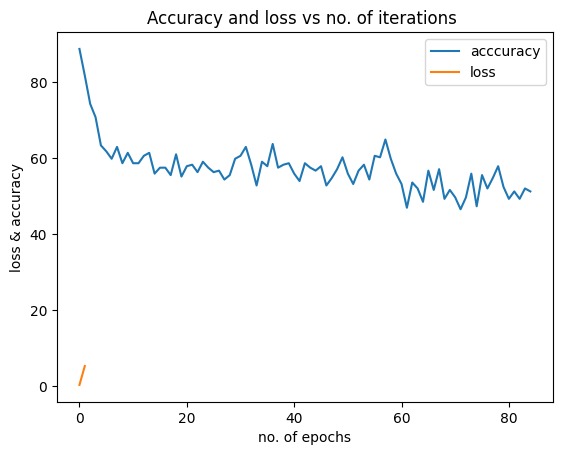

1/1 [==============================] - 0s 27ms/step


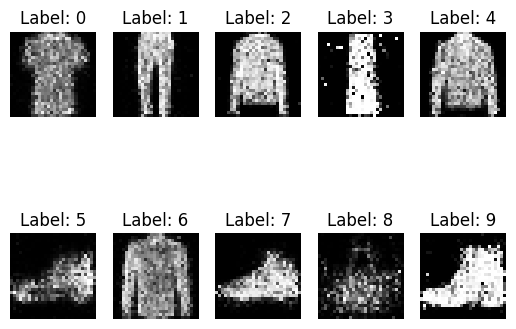

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 8501
4/4 [==============================] - 0s 3ms/step
Iteration : 8502
4/4 [==============================] - 0s 3ms/step
Iteration : 8503
4/4 [==============================] - 0s 3ms/step
Iteration : 8504
4/4 [==============================] - 0s 4ms/step
Iteration : 8505
4/4 [==============================] - 0s 3ms/step
Iteration : 8506
4/4 [==============================] - 0s 3ms/step
Iteration : 8507
4/4 [==============================] - 0s 4ms/step
Iteration : 8508
4/4 [==============================] - 0s 3ms/step
Iteration : 8509
4/4 [==============================] - 0s 3ms/step
Iteration : 8510
4/4 [==============================] - 0s 3ms/step
Iteration : 8511
4/4 [==============================] - 0s 3ms/step
Iteration : 8512
4/4 [==============================] - 0s 3ms/step
Iteration : 8513
4/4 [==============================] - 0s 3ms/step
Iteration : 8514
4/4

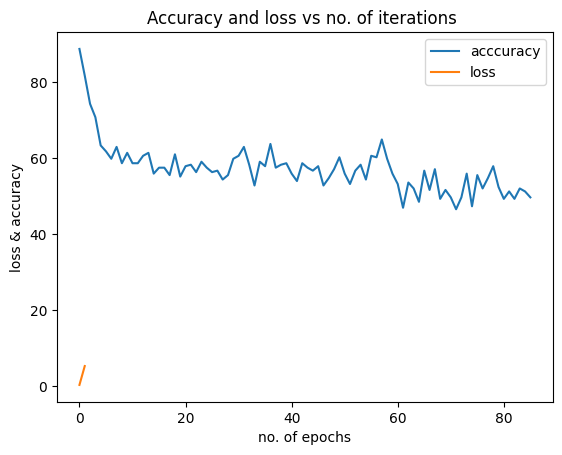

1/1 [==============================] - 0s 42ms/step


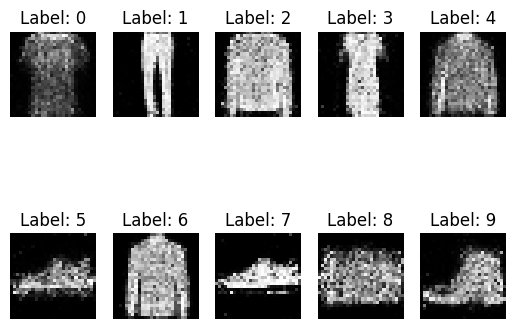

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 8601
4/4 [==============================] - 0s 4ms/step
Iteration : 8602
4/4 [==============================] - 0s 3ms/step
Iteration : 8603
4/4 [==============================] - 0s 3ms/step
Iteration : 8604
4/4 [==============================] - 0s 3ms/step
Iteration : 8605
4/4 [==============================] - 0s 4ms/step
Iteration : 8606
4/4 [==============================] - 0s 3ms/step
Iteration : 8607
4/4 [==============================] - 0s 4ms/step
Iteration : 8608
4/4 [==============================] - 0s 4ms/step
Iteration : 8609
4/4 [==============================] - 0s 4ms/step
Iteration : 8610
4/4 [==============================] - 0s 3ms/step
Iteration : 8611
4/4 [==============================] - 0s 3ms/step
Iteration : 8612
4/4 [==============================] - 0s 3ms/step
Iteration : 8613
4/4 [==============================] - 0s 4ms/step
Iteration : 8614
4/4

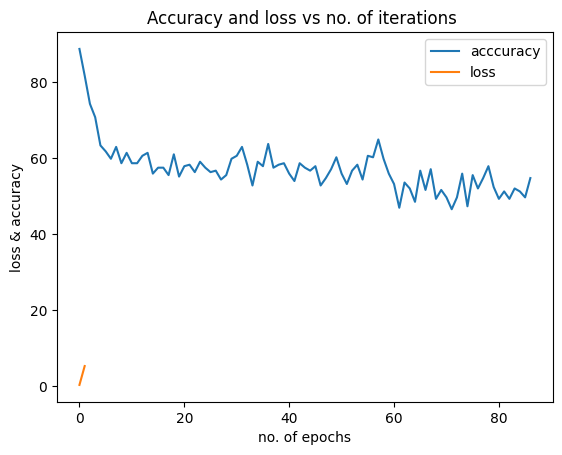

1/1 [==============================] - 0s 29ms/step


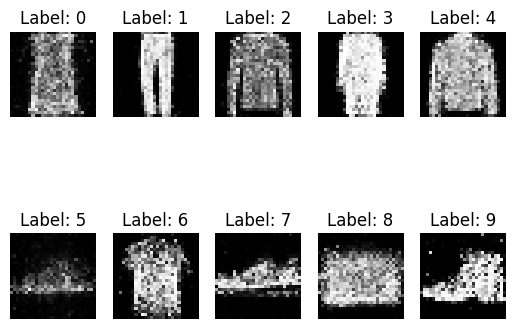

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 8701
4/4 [==============================] - 0s 3ms/step
Iteration : 8702
4/4 [==============================] - 0s 4ms/step
Iteration : 8703
4/4 [==============================] - 0s 3ms/step
Iteration : 8704
4/4 [==============================] - 0s 4ms/step
Iteration : 8705
4/4 [==============================] - 0s 4ms/step
Iteration : 8706
4/4 [==============================] - 0s 4ms/step
Iteration : 8707
4/4 [==============================] - 0s 4ms/step
Iteration : 8708
4/4 [==============================] - 0s 5ms/step
Iteration : 8709
4/4 [==============================] - 0s 4ms/step
Iteration : 8710
4/4 [==============================] - 0s 3ms/step
Iteration : 8711
4/4 [==============================] - 0s 5ms/step
Iteration : 8712
4/4 [==============================] - 0s 4ms/step
Iteration : 8713
4/4 [==============================] - 0s 2ms/step
Iteration : 8714
4/4

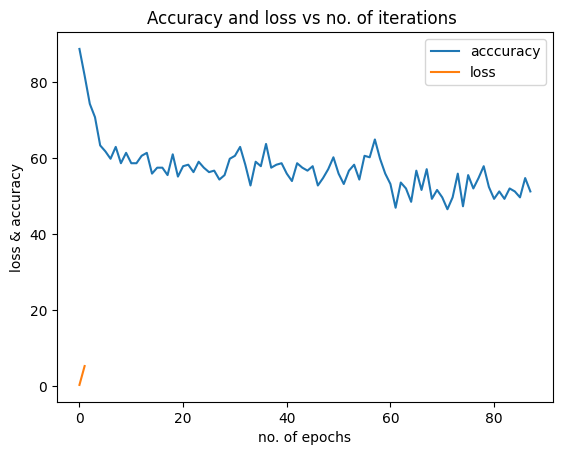

1/1 [==============================] - 0s 29ms/step


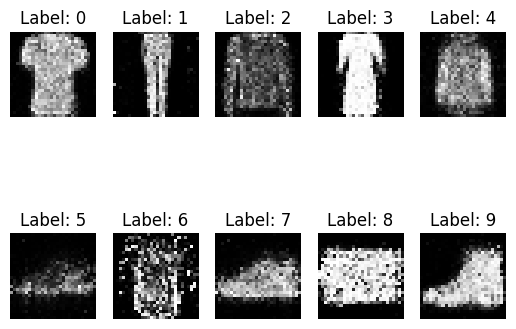

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 8801
4/4 [==============================] - 0s 5ms/step
Iteration : 8802
4/4 [==============================] - 0s 3ms/step
Iteration : 8803
4/4 [==============================] - 0s 3ms/step
Iteration : 8804
4/4 [==============================] - 0s 3ms/step
Iteration : 8805
4/4 [==============================] - 0s 4ms/step
Iteration : 8806
4/4 [==============================] - 0s 3ms/step
Iteration : 8807
4/4 [==============================] - 0s 3ms/step
Iteration : 8808
4/4 [==============================] - 0s 3ms/step
Iteration : 8809
4/4 [==============================] - 0s 3ms/step
Iteration : 8810
4/4 [==============================] - 0s 3ms/step
Iteration : 8811
4/4 [==============================] - 0s 5ms/step
Iteration : 8812
4/4 [==============================] - 0s 5ms/step
Iteration : 8813
4/4 [==============================] - 0s 4ms/step
Iteration : 8814
4/4

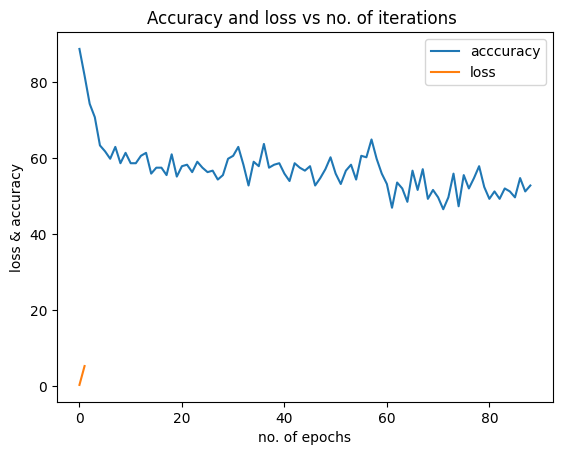

1/1 [==============================] - 0s 33ms/step


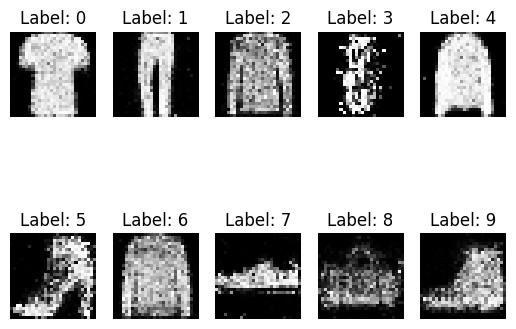

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 8901
4/4 [==============================] - 0s 4ms/step
Iteration : 8902
4/4 [==============================] - 0s 3ms/step
Iteration : 8903
4/4 [==============================] - 0s 3ms/step
Iteration : 8904
4/4 [==============================] - 0s 3ms/step
Iteration : 8905
4/4 [==============================] - 0s 3ms/step
Iteration : 8906
4/4 [==============================] - 0s 3ms/step
Iteration : 8907
4/4 [==============================] - 0s 3ms/step
Iteration : 8908
4/4 [==============================] - 0s 3ms/step
Iteration : 8909
4/4 [==============================] - 0s 3ms/step
Iteration : 8910
4/4 [==============================] - 0s 3ms/step
Iteration : 8911
4/4 [==============================] - 0s 4ms/step
Iteration : 8912
4/4 [==============================] - 0s 3ms/step
Iteration : 8913
4/4 [==============================] - 0s 3ms/step
Iteration : 8914
4/4

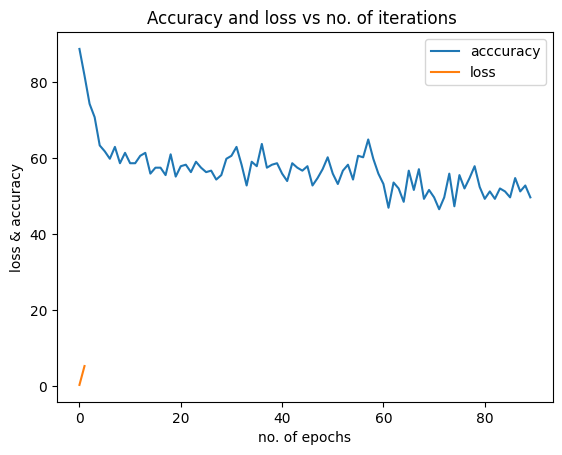

1/1 [==============================] - 0s 25ms/step


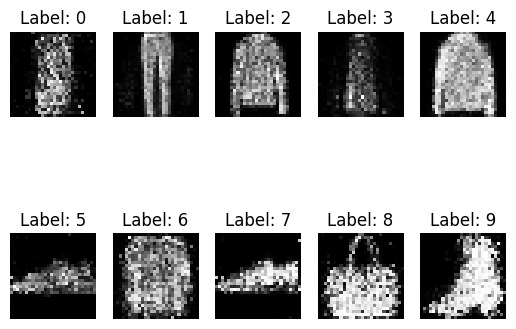

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 9001
4/4 [==============================] - 0s 3ms/step
Iteration : 9002
4/4 [==============================] - 0s 3ms/step
Iteration : 9003
4/4 [==============================] - 0s 3ms/step
Iteration : 9004
4/4 [==============================] - 0s 4ms/step
Iteration : 9005
4/4 [==============================] - 0s 3ms/step
Iteration : 9006
4/4 [==============================] - 0s 4ms/step
Iteration : 9007
4/4 [==============================] - 0s 3ms/step
Iteration : 9008
4/4 [==============================] - 0s 4ms/step
Iteration : 9009
4/4 [==============================] - 0s 3ms/step
Iteration : 9010
4/4 [==============================] - 0s 5ms/step
Iteration : 9011
4/4 [==============================] - 0s 3ms/step
Iteration : 9012
4/4 [==============================] - 0s 4ms/step
Iteration : 9013
4/4 [==============================] - 0s 4ms/step
Iteration : 9014
4/4

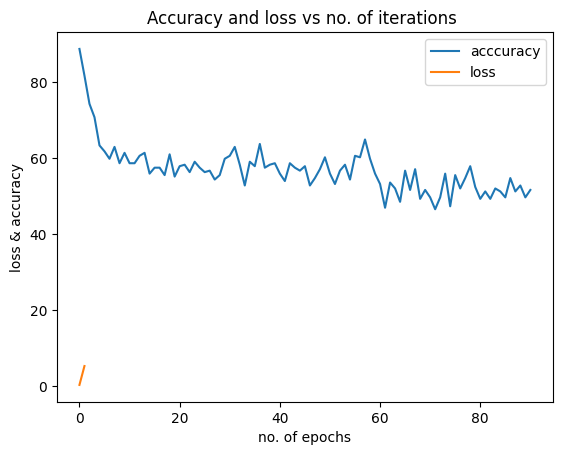

1/1 [==============================] - 0s 60ms/step


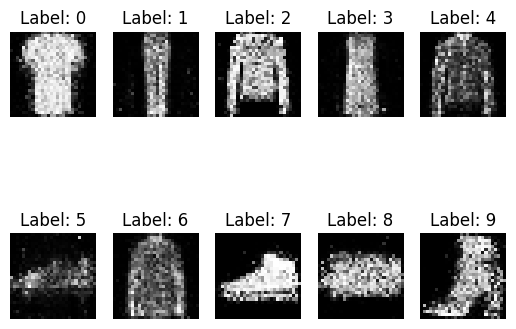

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 9101
4/4 [==============================] - 0s 6ms/step
Iteration : 9102
4/4 [==============================] - 0s 4ms/step
Iteration : 9103
4/4 [==============================] - 0s 5ms/step
Iteration : 9104
4/4 [==============================] - 0s 4ms/step
Iteration : 9105
4/4 [==============================] - 0s 6ms/step
Iteration : 9106
4/4 [==============================] - 0s 4ms/step
Iteration : 9107
4/4 [==============================] - 0s 3ms/step
Iteration : 9108
4/4 [==============================] - 0s 5ms/step
Iteration : 9109
4/4 [==============================] - 0s 3ms/step
Iteration : 9110
4/4 [==============================] - 0s 3ms/step
Iteration : 9111
4/4 [==============================] - 0s 3ms/step
Iteration : 9112
4/4 [==============================] - 0s 3ms/step
Iteration : 9113
4/4 [==============================] - 0s 3ms/step
Iteration : 9114
4/4

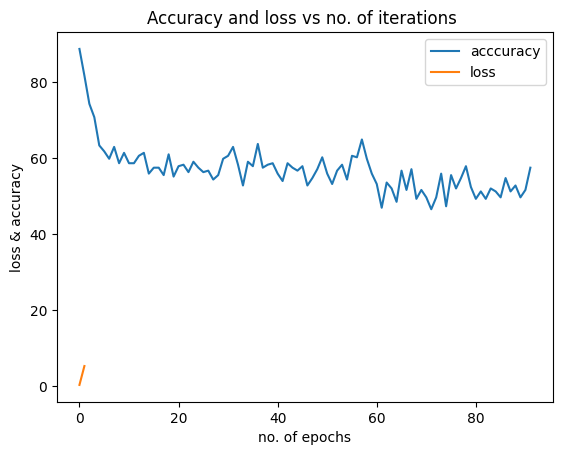

1/1 [==============================] - 0s 26ms/step


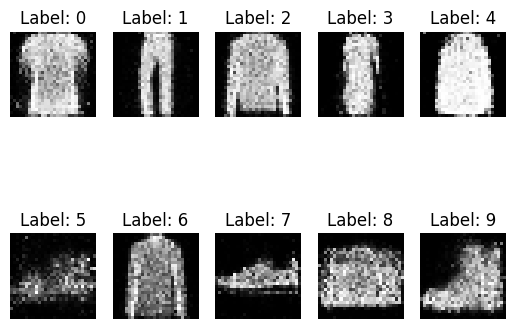

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 9201
4/4 [==============================] - 0s 3ms/step
Iteration : 9202
4/4 [==============================] - 0s 3ms/step
Iteration : 9203
4/4 [==============================] - 0s 3ms/step
Iteration : 9204
4/4 [==============================] - 0s 3ms/step
Iteration : 9205
4/4 [==============================] - 0s 3ms/step
Iteration : 9206
4/4 [==============================] - 0s 4ms/step
Iteration : 9207
4/4 [==============================] - 0s 3ms/step
Iteration : 9208
4/4 [==============================] - 0s 3ms/step
Iteration : 9209
4/4 [==============================] - 0s 3ms/step
Iteration : 9210
4/4 [==============================] - 0s 3ms/step
Iteration : 9211
4/4 [==============================] - 0s 3ms/step
Iteration : 9212
4/4 [==============================] - 0s 3ms/step
Iteration : 9213
4/4 [==============================] - 0s 3ms/step
Iteration : 9214
4/4

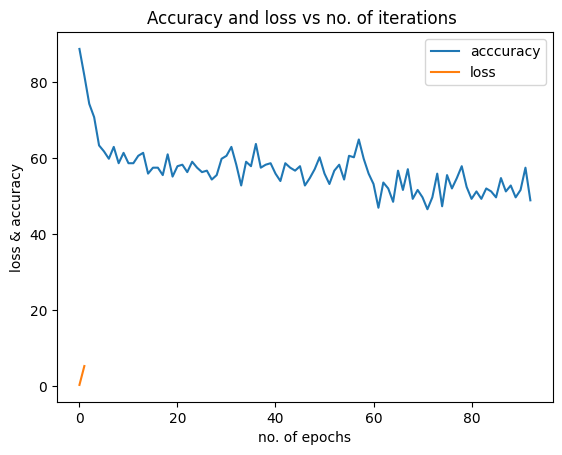

1/1 [==============================] - 0s 55ms/step


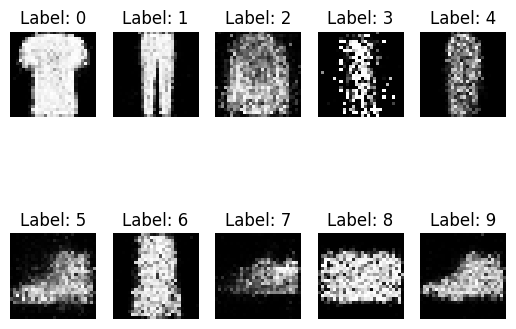

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 9301
4/4 [==============================] - 0s 3ms/step
Iteration : 9302
4/4 [==============================] - 0s 5ms/step
Iteration : 9303
4/4 [==============================] - 0s 3ms/step
Iteration : 9304
4/4 [==============================] - 0s 3ms/step
Iteration : 9305
4/4 [==============================] - 0s 4ms/step
Iteration : 9306
4/4 [==============================] - 0s 4ms/step
Iteration : 9307
4/4 [==============================] - 0s 4ms/step
Iteration : 9308
4/4 [==============================] - 0s 4ms/step
Iteration : 9309
4/4 [==============================] - 0s 3ms/step
Iteration : 9310
4/4 [==============================] - 0s 3ms/step
Iteration : 9311
4/4 [==============================] - 0s 3ms/step
Iteration : 9312
4/4 [==============================] - 0s 3ms/step
Iteration : 9313
4/4 [==============================] - 0s 4ms/step
Iteration : 9314
4/4

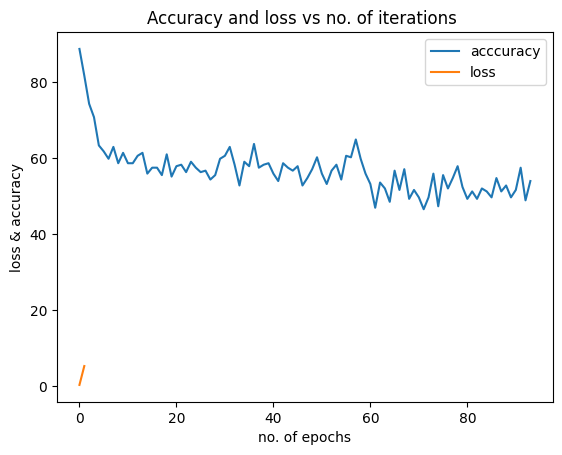

1/1 [==============================] - 0s 26ms/step


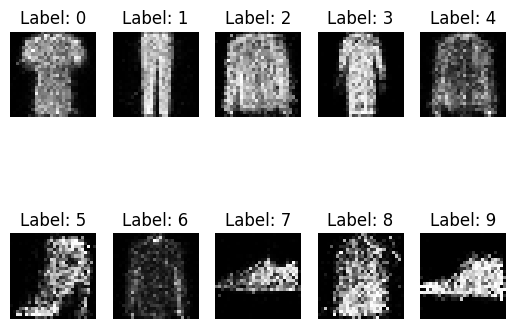

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 9401
4/4 [==============================] - 0s 3ms/step
Iteration : 9402
4/4 [==============================] - 0s 4ms/step
Iteration : 9403
4/4 [==============================] - 0s 3ms/step
Iteration : 9404
4/4 [==============================] - 0s 4ms/step
Iteration : 9405
4/4 [==============================] - 0s 4ms/step
Iteration : 9406
4/4 [==============================] - 0s 4ms/step
Iteration : 9407
4/4 [==============================] - 0s 4ms/step
Iteration : 9408
4/4 [==============================] - 0s 6ms/step
Iteration : 9409
4/4 [==============================] - 0s 4ms/step
Iteration : 9410
4/4 [==============================] - 0s 3ms/step
Iteration : 9411
4/4 [==============================] - 0s 3ms/step
Iteration : 9412
4/4 [==============================] - 0s 5ms/step
Iteration : 9413
4/4 [==============================] - 0s 3ms/step
Iteration : 9414
4/4

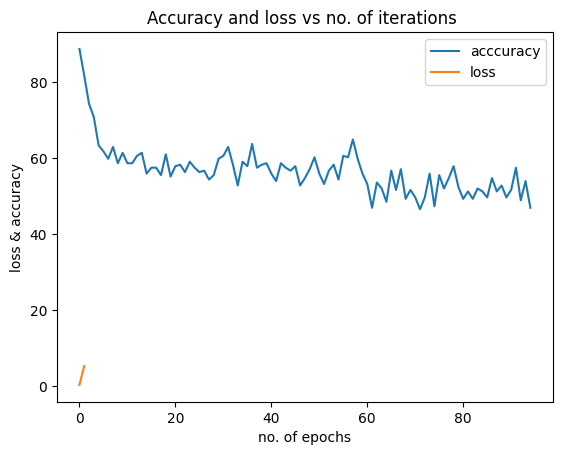

1/1 [==============================] - 0s 28ms/step


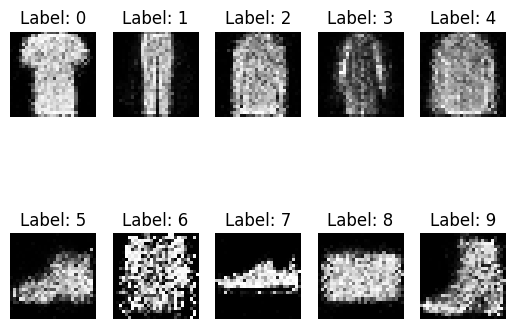

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 9501
4/4 [==============================] - 0s 3ms/step
Iteration : 9502
4/4 [==============================] - 0s 3ms/step
Iteration : 9503
4/4 [==============================] - 0s 4ms/step
Iteration : 9504
4/4 [==============================] - 0s 3ms/step
Iteration : 9505
4/4 [==============================] - 0s 3ms/step
Iteration : 9506
4/4 [==============================] - 0s 3ms/step
Iteration : 9507
4/4 [==============================] - 0s 4ms/step
Iteration : 9508
4/4 [==============================] - 0s 4ms/step
Iteration : 9509
4/4 [==============================] - 0s 4ms/step
Iteration : 9510
4/4 [==============================] - 0s 3ms/step
Iteration : 9511
4/4 [==============================] - 0s 3ms/step
Iteration : 9512
4/4 [==============================] - 0s 3ms/step
Iteration : 9513
4/4 [==============================] - 0s 3ms/step
Iteration : 9514
4/4

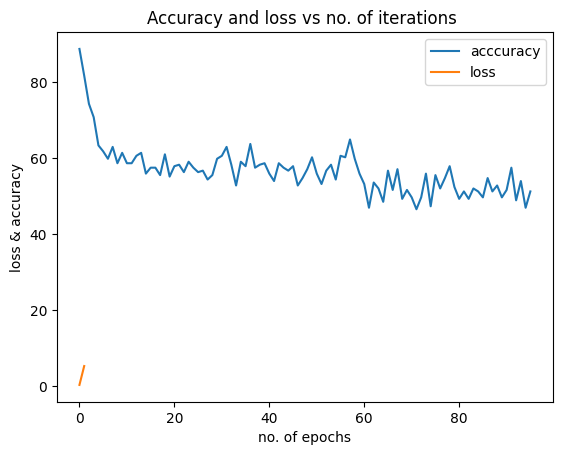

1/1 [==============================] - 0s 31ms/step


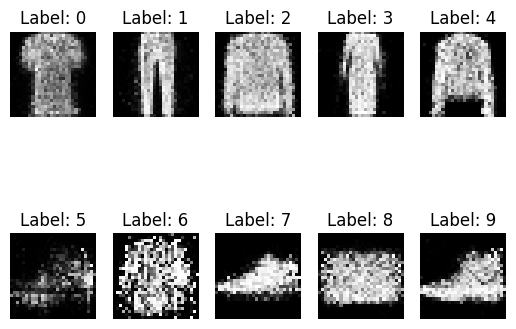

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 9601
4/4 [==============================] - 0s 3ms/step
Iteration : 9602
4/4 [==============================] - 0s 3ms/step
Iteration : 9603
4/4 [==============================] - 0s 3ms/step
Iteration : 9604
4/4 [==============================] - 0s 3ms/step
Iteration : 9605
4/4 [==============================] - 0s 3ms/step
Iteration : 9606
4/4 [==============================] - 0s 3ms/step
Iteration : 9607
4/4 [==============================] - 0s 3ms/step
Iteration : 9608
4/4 [==============================] - 0s 3ms/step
Iteration : 9609
4/4 [==============================] - 0s 3ms/step
Iteration : 9610
4/4 [==============================] - 0s 3ms/step
Iteration : 9611
4/4 [==============================] - 0s 3ms/step
Iteration : 9612
4/4 [==============================] - 0s 3ms/step
Iteration : 9613
4/4 [==============================] - 0s 3ms/step
Iteration : 9614
4/4

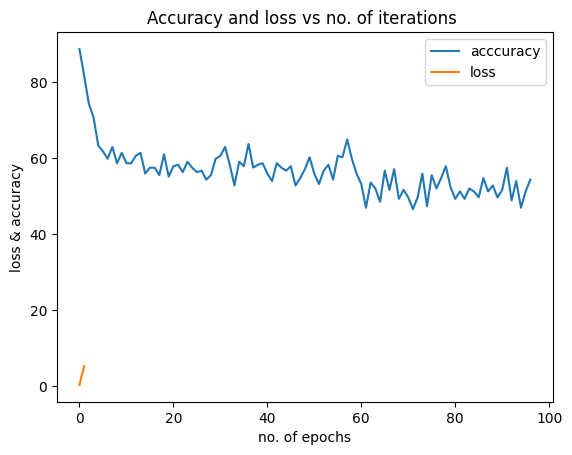

1/1 [==============================] - 0s 30ms/step


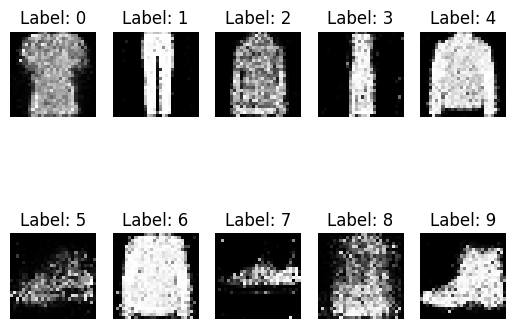

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 9701
4/4 [==============================] - 0s 4ms/step
Iteration : 9702
4/4 [==============================] - 0s 4ms/step
Iteration : 9703
4/4 [==============================] - 0s 3ms/step
Iteration : 9704
4/4 [==============================] - 0s 3ms/step
Iteration : 9705
4/4 [==============================] - 0s 3ms/step
Iteration : 9706
4/4 [==============================] - 0s 4ms/step
Iteration : 9707
4/4 [==============================] - 0s 4ms/step
Iteration : 9708
4/4 [==============================] - 0s 6ms/step
Iteration : 9709
4/4 [==============================] - 0s 4ms/step
Iteration : 9710
4/4 [==============================] - 0s 6ms/step
Iteration : 9711
4/4 [==============================] - 0s 3ms/step
Iteration : 9712
4/4 [==============================] - 0s 4ms/step
Iteration : 9713
4/4 [==============================] - 0s 4ms/step
Iteration : 9714
4/4

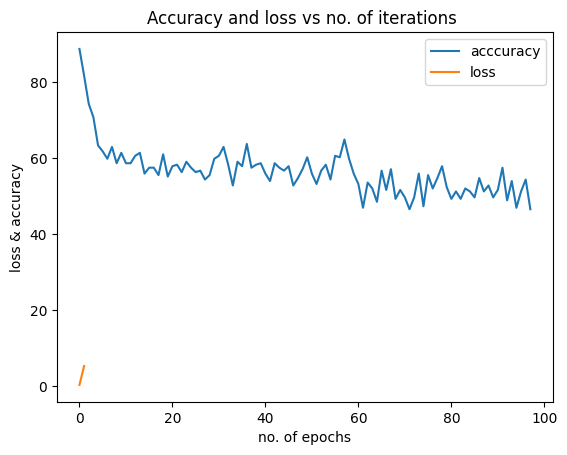

1/1 [==============================] - 0s 31ms/step


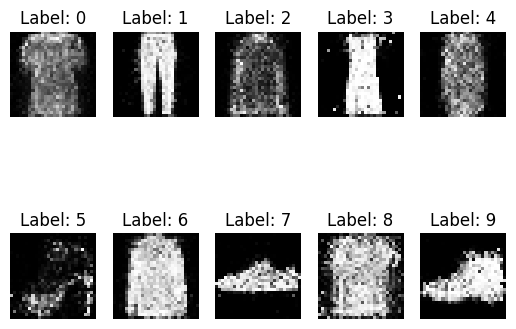

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 9801
4/4 [==============================] - 0s 5ms/step
Iteration : 9802
4/4 [==============================] - 0s 3ms/step
Iteration : 9803
4/4 [==============================] - 0s 2ms/step
Iteration : 9804
4/4 [==============================] - 0s 3ms/step
Iteration : 9805
4/4 [==============================] - 0s 3ms/step
Iteration : 9806
4/4 [==============================] - 0s 3ms/step
Iteration : 9807
4/4 [==============================] - 0s 3ms/step
Iteration : 9808
4/4 [==============================] - 0s 3ms/step
Iteration : 9809
4/4 [==============================] - 0s 3ms/step
Iteration : 9810
4/4 [==============================] - 0s 4ms/step
Iteration : 9811
4/4 [==============================] - 0s 4ms/step
Iteration : 9812
4/4 [==============================] - 0s 3ms/step
Iteration : 9813
4/4 [==============================] - 0s 3ms/step
Iteration : 9814
4/4

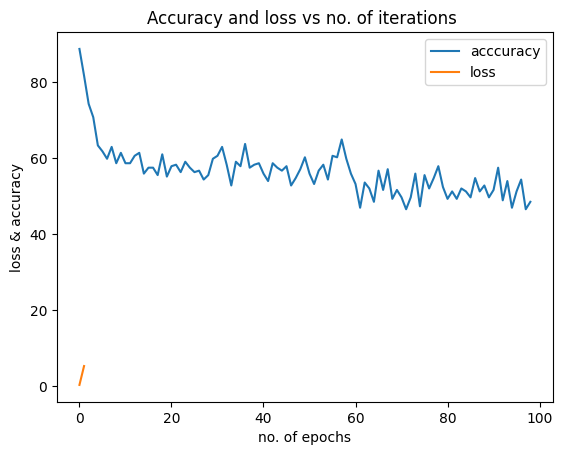

1/1 [==============================] - 0s 26ms/step


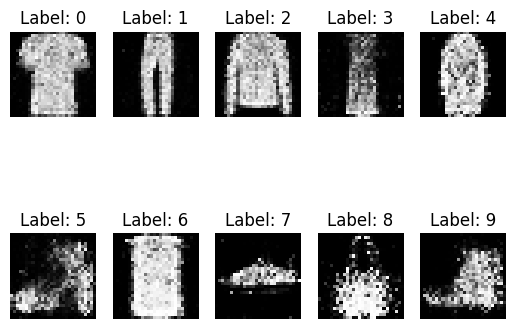

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 9901
4/4 [==============================] - 0s 4ms/step
Iteration : 9902
4/4 [==============================] - 0s 3ms/step
Iteration : 9903
4/4 [==============================] - 0s 3ms/step
Iteration : 9904
4/4 [==============================] - 0s 4ms/step
Iteration : 9905
4/4 [==============================] - 0s 3ms/step
Iteration : 9906
4/4 [==============================] - 0s 3ms/step
Iteration : 9907
4/4 [==============================] - 0s 3ms/step
Iteration : 9908
4/4 [==============================] - 0s 3ms/step
Iteration : 9909
4/4 [==============================] - 0s 3ms/step
Iteration : 9910
4/4 [==============================] - 0s 4ms/step
Iteration : 9911
4/4 [==============================] - 0s 4ms/step
Iteration : 9912
4/4 [==============================] - 0s 3ms/step
Iteration : 9913
4/4 [==============================] - 0s 3ms/step
Iteration : 9914
4/4

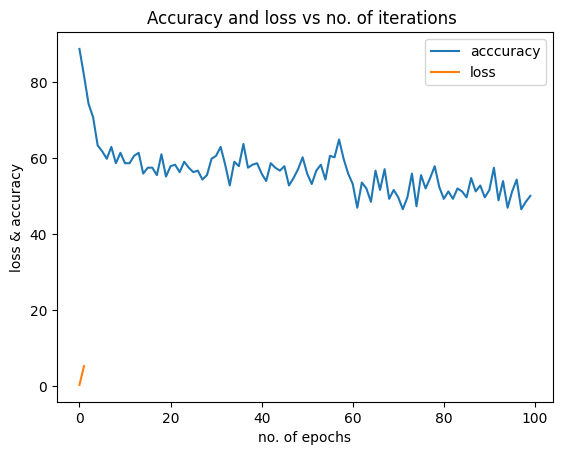

1/1 [==============================] - 0s 25ms/step


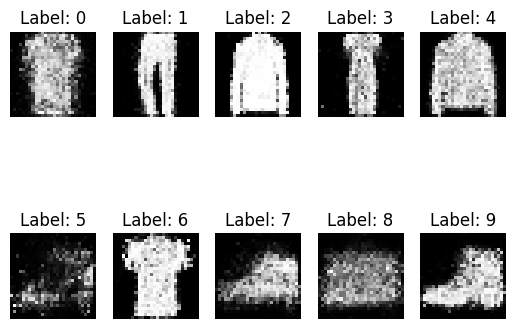

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 10001
4/4 [==============================] - 0s 3ms/step
Iteration : 10002
4/4 [==============================] - 0s 3ms/step
Iteration : 10003
4/4 [==============================] - 0s 5ms/step
Iteration : 10004
4/4 [==============================] - 0s 4ms/step
Iteration : 10005
4/4 [==============================] - 0s 4ms/step
Iteration : 10006
4/4 [==============================] - 0s 6ms/step
Iteration : 10007
4/4 [==============================] - 0s 3ms/step
Iteration : 10008
4/4 [==============================] - 0s 3ms/step
Iteration : 10009
4/4 [==============================] - 0s 4ms/step
Iteration : 10010
4/4 [==============================] - 0s 5ms/step
Iteration : 10011
4/4 [==============================] - 0s 3ms/step
Iteration : 10012
4/4 [==============================] - 0s 4ms/step
Iteration : 10013
4/4 [==============================] - 0s 6ms/step
Iterati

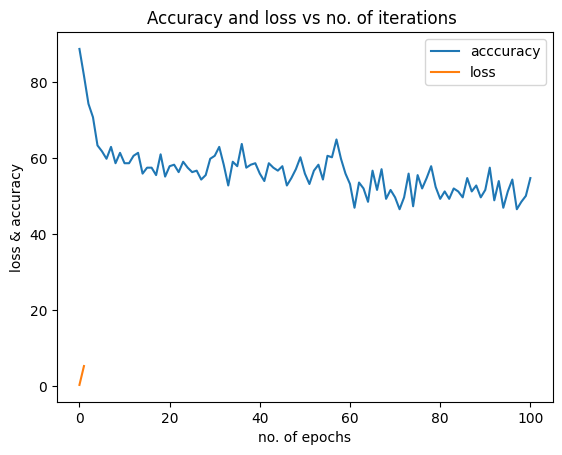

1/1 [==============================] - 0s 48ms/step


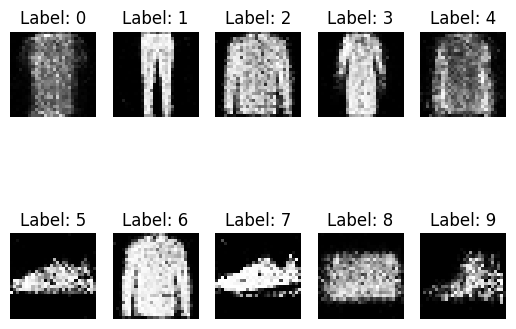

The model structure and weights were saved. 
4/4 [==============================] - 0s 6ms/step
Iteration : 10101
4/4 [==============================] - 0s 3ms/step
Iteration : 10102
4/4 [==============================] - 0s 5ms/step
Iteration : 10103
4/4 [==============================] - 0s 3ms/step
Iteration : 10104
4/4 [==============================] - 0s 3ms/step
Iteration : 10105
4/4 [==============================] - 0s 3ms/step
Iteration : 10106
4/4 [==============================] - 0s 3ms/step
Iteration : 10107
4/4 [==============================] - 0s 3ms/step
Iteration : 10108
4/4 [==============================] - 0s 3ms/step
Iteration : 10109
4/4 [==============================] - 0s 3ms/step
Iteration : 10110
4/4 [==============================] - 0s 3ms/step
Iteration : 10111
4/4 [==============================] - 0s 3ms/step
Iteration : 10112
4/4 [==============================] - 0s 3ms/step
Iteration : 10113
4/4 [==============================] - 0s 4ms/step
Iterati

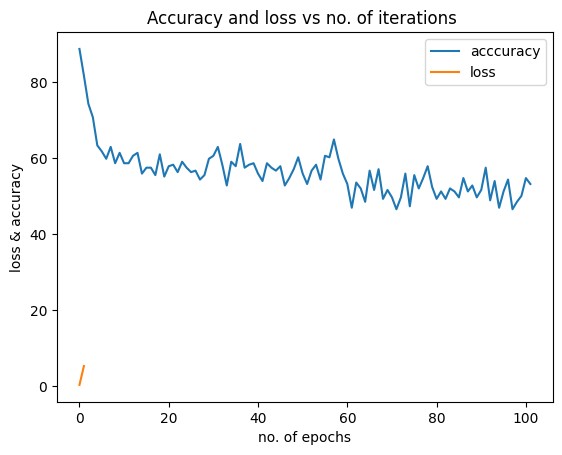

1/1 [==============================] - 0s 26ms/step


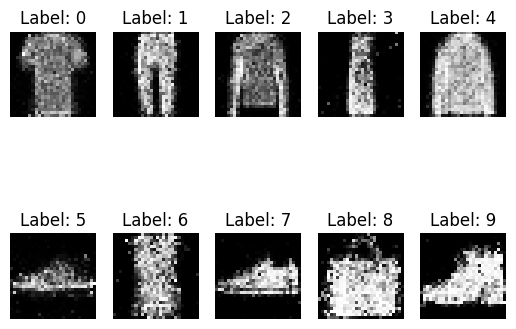

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 10201
4/4 [==============================] - 0s 3ms/step
Iteration : 10202
4/4 [==============================] - 0s 4ms/step
Iteration : 10203
4/4 [==============================] - 0s 3ms/step
Iteration : 10204
4/4 [==============================] - 0s 5ms/step
Iteration : 10205
4/4 [==============================] - 0s 4ms/step
Iteration : 10206
4/4 [==============================] - 0s 3ms/step
Iteration : 10207
4/4 [==============================] - 0s 5ms/step
Iteration : 10208
4/4 [==============================] - 0s 3ms/step
Iteration : 10209
4/4 [==============================] - 0s 3ms/step
Iteration : 10210
4/4 [==============================] - 0s 4ms/step
Iteration : 10211
4/4 [==============================] - 0s 3ms/step
Iteration : 10212
4/4 [==============================] - 0s 3ms/step
Iteration : 10213
4/4 [==============================] - 0s 3ms/step
Iterati

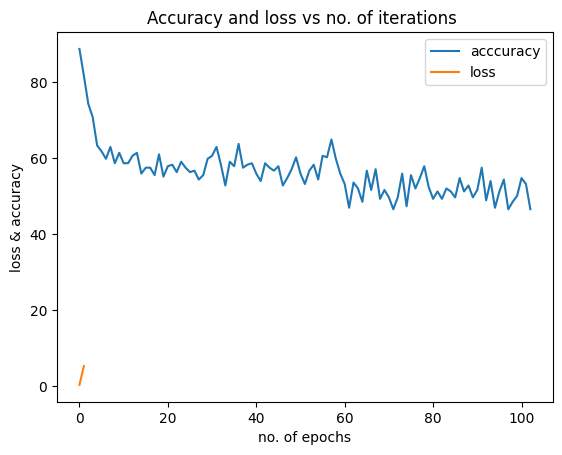

1/1 [==============================] - 0s 29ms/step


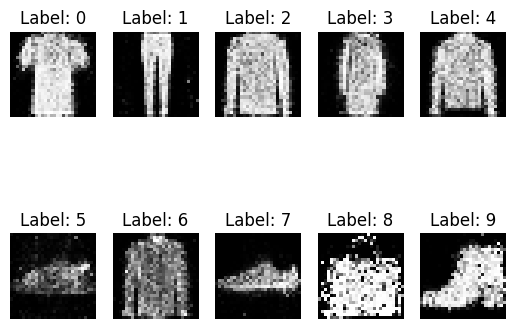

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 10301
4/4 [==============================] - 0s 3ms/step
Iteration : 10302
4/4 [==============================] - 0s 3ms/step
Iteration : 10303
4/4 [==============================] - 0s 4ms/step
Iteration : 10304
4/4 [==============================] - 0s 3ms/step
Iteration : 10305
4/4 [==============================] - 0s 3ms/step
Iteration : 10306
4/4 [==============================] - 0s 4ms/step
Iteration : 10307
4/4 [==============================] - 0s 4ms/step
Iteration : 10308
4/4 [==============================] - 0s 3ms/step
Iteration : 10309
4/4 [==============================] - 0s 5ms/step
Iteration : 10310
4/4 [==============================] - 0s 3ms/step
Iteration : 10311
4/4 [==============================] - 0s 3ms/step
Iteration : 10312
4/4 [==============================] - 0s 4ms/step
Iteration : 10313
4/4 [==============================] - 0s 5ms/step
Iterati

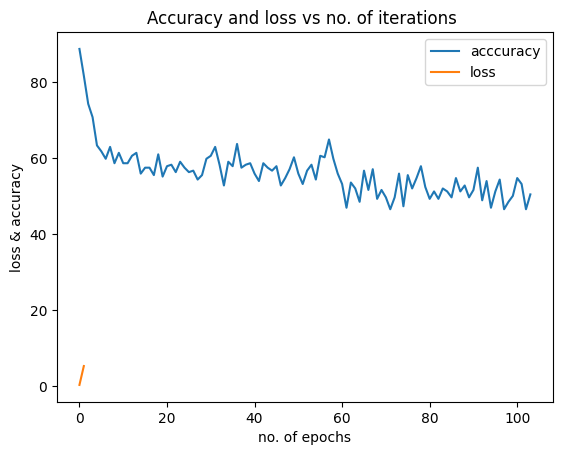

1/1 [==============================] - 0s 57ms/step


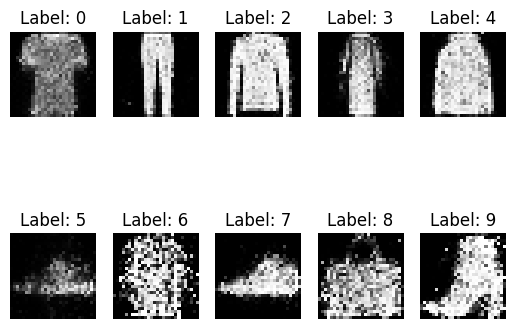

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 10401
4/4 [==============================] - 0s 4ms/step
Iteration : 10402
4/4 [==============================] - 0s 4ms/step
Iteration : 10403
4/4 [==============================] - 0s 5ms/step
Iteration : 10404
4/4 [==============================] - 0s 5ms/step
Iteration : 10405
4/4 [==============================] - 0s 4ms/step
Iteration : 10406
4/4 [==============================] - 0s 4ms/step
Iteration : 10407
4/4 [==============================] - 0s 5ms/step
Iteration : 10408
4/4 [==============================] - 0s 5ms/step
Iteration : 10409
4/4 [==============================] - 0s 4ms/step
Iteration : 10410
4/4 [==============================] - 0s 4ms/step
Iteration : 10411
4/4 [==============================] - 0s 3ms/step
Iteration : 10412
4/4 [==============================] - 0s 3ms/step
Iteration : 10413
4/4 [==============================] - 0s 4ms/step
Iterati

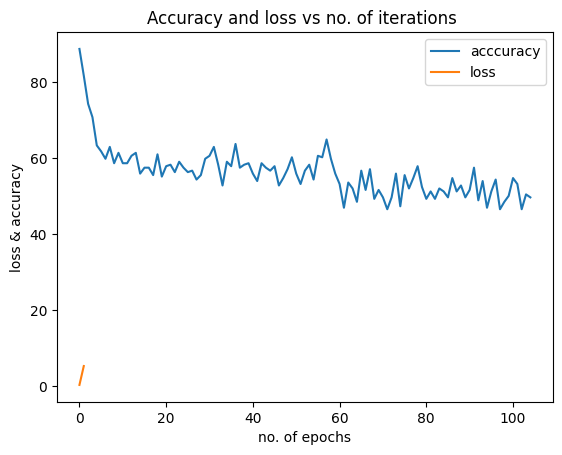

1/1 [==============================] - 0s 26ms/step


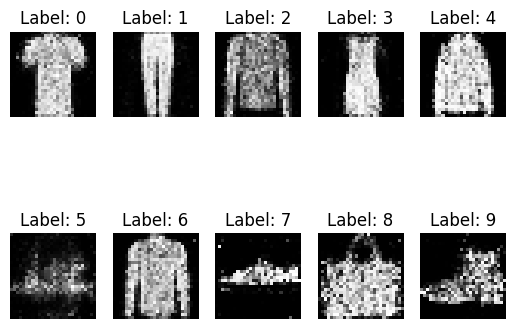

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 10501
4/4 [==============================] - 0s 3ms/step
Iteration : 10502
4/4 [==============================] - 0s 4ms/step
Iteration : 10503
4/4 [==============================] - 0s 3ms/step
Iteration : 10504
4/4 [==============================] - 0s 3ms/step
Iteration : 10505
4/4 [==============================] - 0s 3ms/step
Iteration : 10506
4/4 [==============================] - 0s 3ms/step
Iteration : 10507
4/4 [==============================] - 0s 3ms/step
Iteration : 10508
4/4 [==============================] - 0s 3ms/step
Iteration : 10509
4/4 [==============================] - 0s 3ms/step
Iteration : 10510
4/4 [==============================] - 0s 3ms/step
Iteration : 10511
4/4 [==============================] - 0s 3ms/step
Iteration : 10512
4/4 [==============================] - 0s 3ms/step
Iteration : 10513
4/4 [==============================] - 0s 4ms/step
Iterati

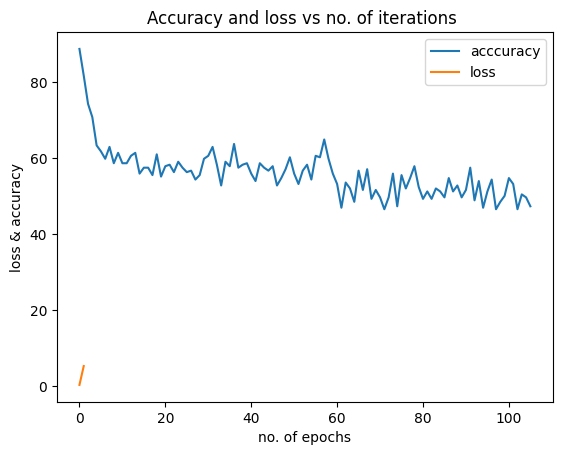

1/1 [==============================] - 0s 31ms/step


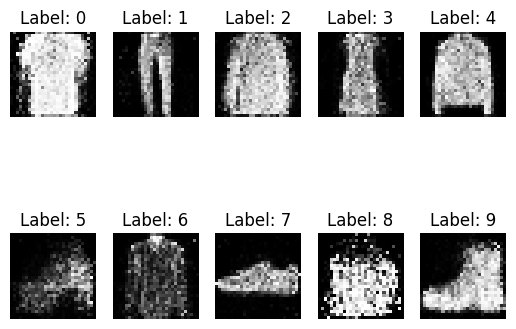

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 10601
4/4 [==============================] - 0s 3ms/step
Iteration : 10602
4/4 [==============================] - 0s 3ms/step
Iteration : 10603
4/4 [==============================] - 0s 4ms/step
Iteration : 10604
4/4 [==============================] - 0s 3ms/step
Iteration : 10605
4/4 [==============================] - 0s 4ms/step
Iteration : 10606
4/4 [==============================] - 0s 3ms/step
Iteration : 10607
4/4 [==============================] - 0s 3ms/step
Iteration : 10608
4/4 [==============================] - 0s 3ms/step
Iteration : 10609
4/4 [==============================] - 0s 4ms/step
Iteration : 10610
4/4 [==============================] - 0s 3ms/step
Iteration : 10611
4/4 [==============================] - 0s 3ms/step
Iteration : 10612
4/4 [==============================] - 0s 3ms/step
Iteration : 10613
4/4 [==============================] - 0s 3ms/step
Iterati

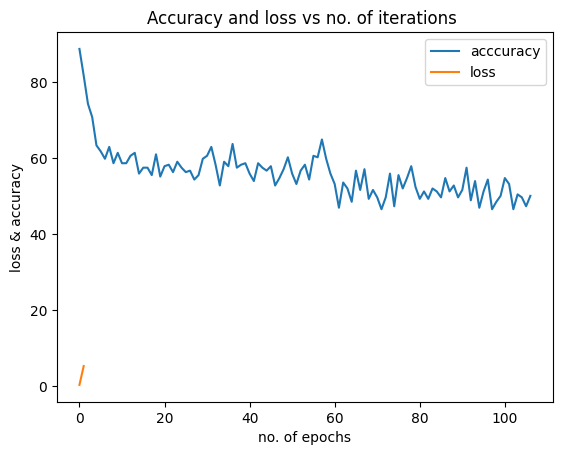

1/1 [==============================] - 0s 35ms/step


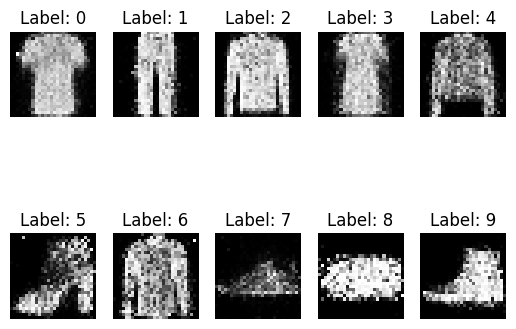

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 10701
4/4 [==============================] - 0s 3ms/step
Iteration : 10702
4/4 [==============================] - 0s 6ms/step
Iteration : 10703
4/4 [==============================] - 0s 4ms/step
Iteration : 10704
4/4 [==============================] - 0s 3ms/step
Iteration : 10705
4/4 [==============================] - 0s 4ms/step
Iteration : 10706
4/4 [==============================] - 0s 3ms/step
Iteration : 10707
4/4 [==============================] - 0s 4ms/step
Iteration : 10708
4/4 [==============================] - 0s 4ms/step
Iteration : 10709
4/4 [==============================] - 0s 5ms/step
Iteration : 10710
4/4 [==============================] - 0s 4ms/step
Iteration : 10711
4/4 [==============================] - 0s 3ms/step
Iteration : 10712
4/4 [==============================] - 0s 3ms/step
Iteration : 10713
4/4 [==============================] - 0s 4ms/step
Iterati

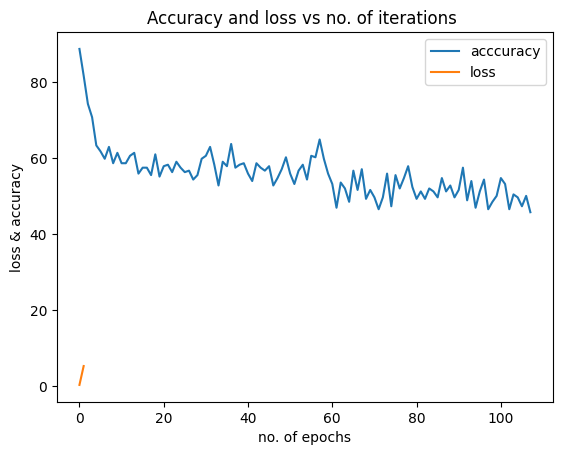

1/1 [==============================] - 0s 26ms/step


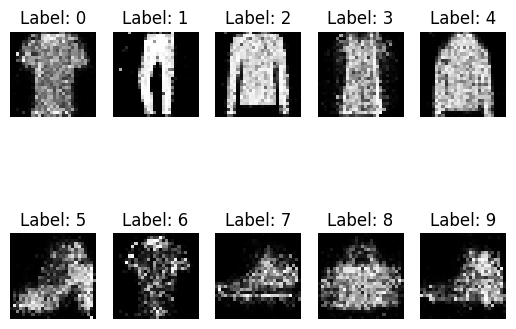

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 10801
4/4 [==============================] - 0s 3ms/step
Iteration : 10802
4/4 [==============================] - 0s 4ms/step
Iteration : 10803
4/4 [==============================] - 0s 3ms/step
Iteration : 10804
4/4 [==============================] - 0s 4ms/step
Iteration : 10805
4/4 [==============================] - 0s 3ms/step
Iteration : 10806
4/4 [==============================] - 0s 3ms/step
Iteration : 10807
4/4 [==============================] - 0s 4ms/step
Iteration : 10808
4/4 [==============================] - 0s 3ms/step
Iteration : 10809
4/4 [==============================] - 0s 3ms/step
Iteration : 10810
4/4 [==============================] - 0s 4ms/step
Iteration : 10811
4/4 [==============================] - 0s 3ms/step
Iteration : 10812
4/4 [==============================] - 0s 3ms/step
Iteration : 10813
4/4 [==============================] - 0s 3ms/step
Iterati

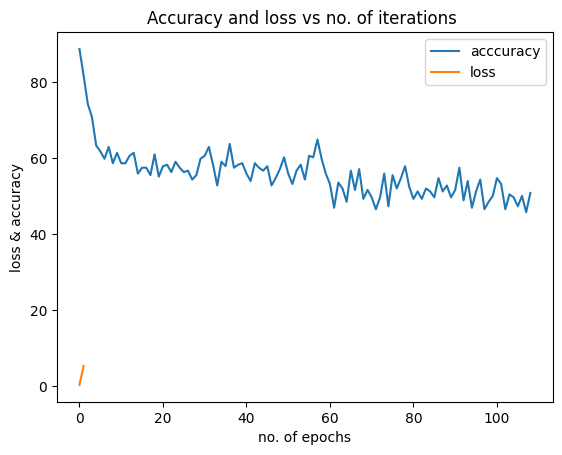

1/1 [==============================] - 0s 30ms/step


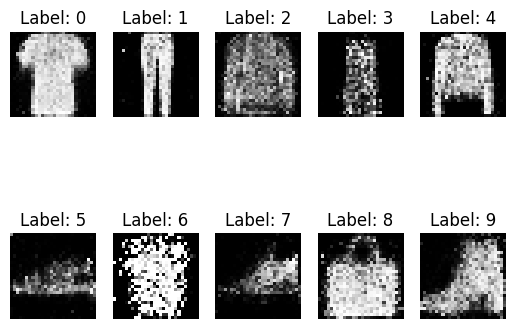

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 10901
4/4 [==============================] - 0s 3ms/step
Iteration : 10902
4/4 [==============================] - 0s 3ms/step
Iteration : 10903
4/4 [==============================] - 0s 4ms/step
Iteration : 10904
4/4 [==============================] - 0s 3ms/step
Iteration : 10905
4/4 [==============================] - 0s 5ms/step
Iteration : 10906
4/4 [==============================] - 0s 4ms/step
Iteration : 10907
4/4 [==============================] - 0s 3ms/step
Iteration : 10908
4/4 [==============================] - 0s 3ms/step
Iteration : 10909
4/4 [==============================] - 0s 3ms/step
Iteration : 10910
4/4 [==============================] - 0s 3ms/step
Iteration : 10911
4/4 [==============================] - 0s 3ms/step
Iteration : 10912
4/4 [==============================] - 0s 4ms/step
Iteration : 10913
4/4 [==============================] - 0s 4ms/step
Iterati

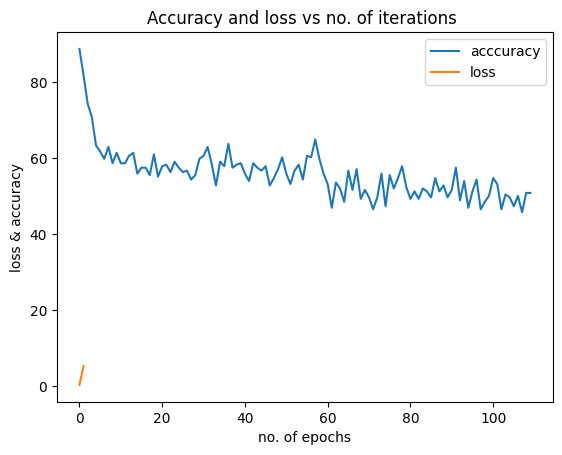

1/1 [==============================] - 0s 31ms/step


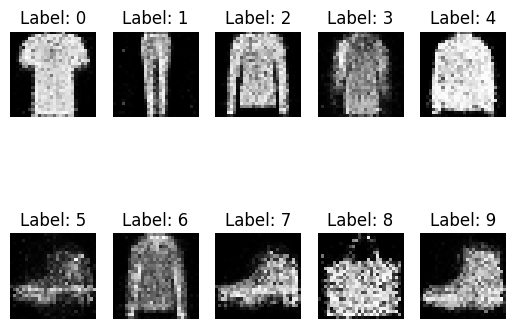

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 11001
4/4 [==============================] - 0s 4ms/step
Iteration : 11002
4/4 [==============================] - 0s 5ms/step
Iteration : 11003
4/4 [==============================] - 0s 4ms/step
Iteration : 11004
4/4 [==============================] - 0s 3ms/step
Iteration : 11005
4/4 [==============================] - 0s 4ms/step
Iteration : 11006
4/4 [==============================] - 0s 5ms/step
Iteration : 11007
4/4 [==============================] - 0s 4ms/step
Iteration : 11008
4/4 [==============================] - 0s 4ms/step
Iteration : 11009
4/4 [==============================] - 0s 5ms/step
Iteration : 11010
4/4 [==============================] - 0s 4ms/step
Iteration : 11011
4/4 [==============================] - 0s 4ms/step
Iteration : 11012
4/4 [==============================] - 0s 4ms/step
Iteration : 11013
4/4 [==============================] - 0s 4ms/step
Iterati

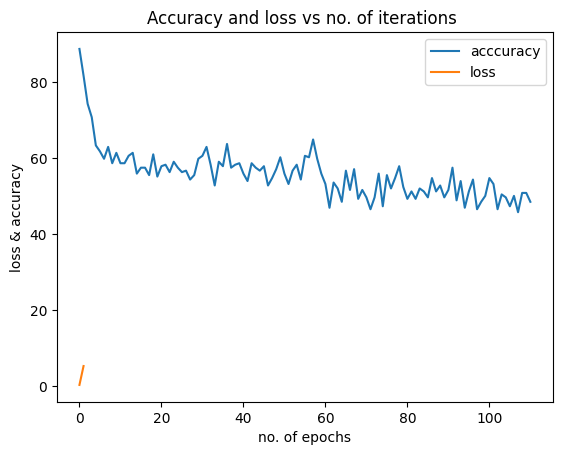

1/1 [==============================] - 0s 26ms/step


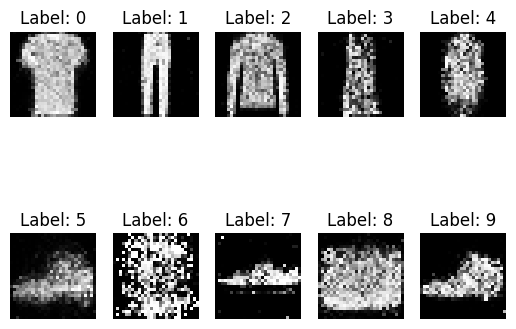

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 11101
4/4 [==============================] - 0s 3ms/step
Iteration : 11102
4/4 [==============================] - 0s 3ms/step
Iteration : 11103
4/4 [==============================] - 0s 3ms/step
Iteration : 11104
4/4 [==============================] - 0s 4ms/step
Iteration : 11105
4/4 [==============================] - 0s 4ms/step
Iteration : 11106
4/4 [==============================] - 0s 4ms/step
Iteration : 11107
4/4 [==============================] - 0s 3ms/step
Iteration : 11108
4/4 [==============================] - 0s 3ms/step
Iteration : 11109
4/4 [==============================] - 0s 3ms/step
Iteration : 11110
4/4 [==============================] - 0s 4ms/step
Iteration : 11111
4/4 [==============================] - 0s 4ms/step
Iteration : 11112
4/4 [==============================] - 0s 3ms/step
Iteration : 11113
4/4 [==============================] - 0s 3ms/step
Iterati

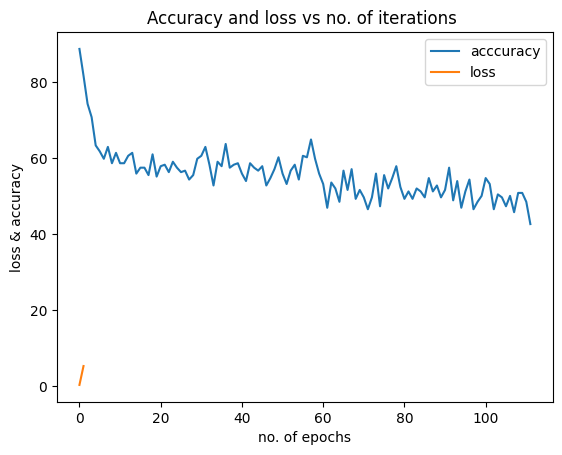

1/1 [==============================] - 0s 29ms/step


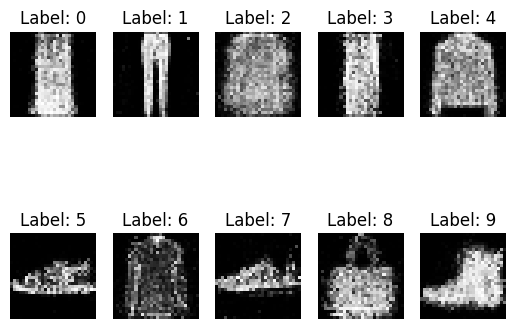

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 11201
4/4 [==============================] - 0s 3ms/step
Iteration : 11202
4/4 [==============================] - 0s 3ms/step
Iteration : 11203
4/4 [==============================] - 0s 3ms/step
Iteration : 11204
4/4 [==============================] - 0s 3ms/step
Iteration : 11205
4/4 [==============================] - 0s 3ms/step
Iteration : 11206
4/4 [==============================] - 0s 4ms/step
Iteration : 11207
4/4 [==============================] - 0s 4ms/step
Iteration : 11208
4/4 [==============================] - 0s 3ms/step
Iteration : 11209
4/4 [==============================] - 0s 3ms/step
Iteration : 11210
4/4 [==============================] - 0s 4ms/step
Iteration : 11211
4/4 [==============================] - 0s 4ms/step
Iteration : 11212
4/4 [==============================] - 0s 3ms/step
Iteration : 11213
4/4 [==============================] - 0s 3ms/step
Iterati

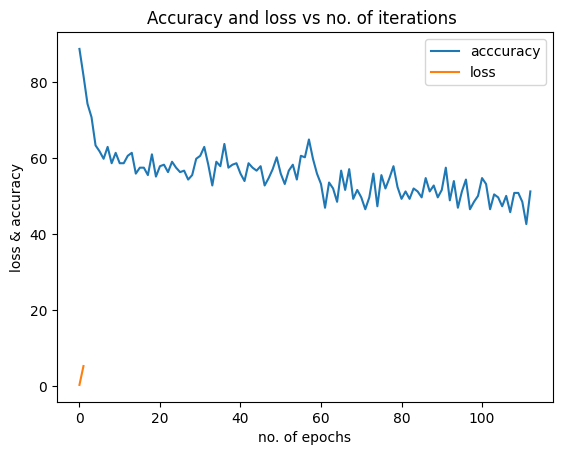

1/1 [==============================] - 0s 38ms/step


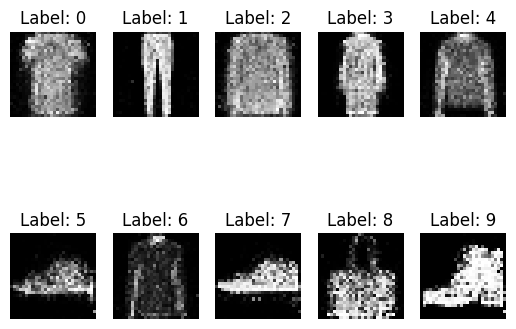

The model structure and weights were saved. 
4/4 [==============================] - 0s 6ms/step
Iteration : 11301
4/4 [==============================] - 0s 3ms/step
Iteration : 11302
4/4 [==============================] - 0s 4ms/step
Iteration : 11303
4/4 [==============================] - 0s 4ms/step
Iteration : 11304
4/4 [==============================] - 0s 4ms/step
Iteration : 11305
4/4 [==============================] - 0s 6ms/step
Iteration : 11306
4/4 [==============================] - 0s 6ms/step
Iteration : 11307
4/4 [==============================] - 0s 4ms/step
Iteration : 11308
4/4 [==============================] - 0s 5ms/step
Iteration : 11309
4/4 [==============================] - 0s 3ms/step
Iteration : 11310
4/4 [==============================] - 0s 3ms/step
Iteration : 11311
4/4 [==============================] - 0s 5ms/step
Iteration : 11312
4/4 [==============================] - 0s 3ms/step
Iteration : 11313
4/4 [==============================] - 0s 4ms/step
Iterati

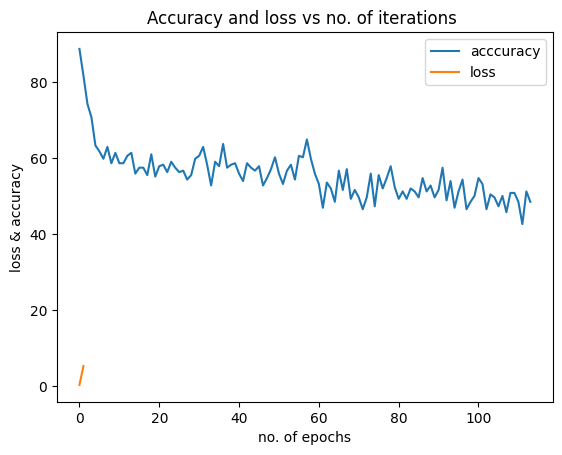

1/1 [==============================] - 0s 49ms/step


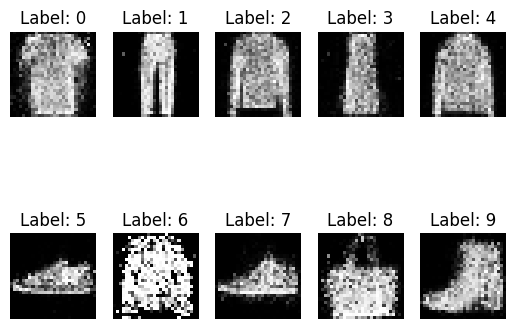

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 11401
4/4 [==============================] - 0s 3ms/step
Iteration : 11402
4/4 [==============================] - 0s 5ms/step
Iteration : 11403
4/4 [==============================] - 0s 3ms/step
Iteration : 11404
4/4 [==============================] - 0s 4ms/step
Iteration : 11405
4/4 [==============================] - 0s 3ms/step
Iteration : 11406
4/4 [==============================] - 0s 3ms/step
Iteration : 11407
4/4 [==============================] - 0s 5ms/step
Iteration : 11408
4/4 [==============================] - 0s 4ms/step
Iteration : 11409
4/4 [==============================] - 0s 3ms/step
Iteration : 11410
4/4 [==============================] - 0s 6ms/step
Iteration : 11411
4/4 [==============================] - 0s 3ms/step
Iteration : 11412
4/4 [==============================] - 0s 3ms/step
Iteration : 11413
4/4 [==============================] - 0s 3ms/step
Iterati

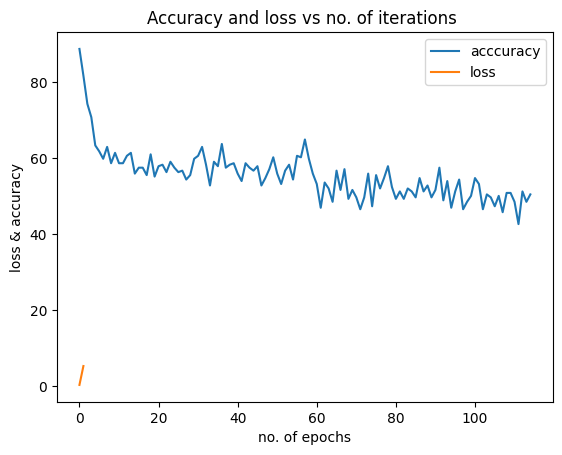

1/1 [==============================] - 0s 27ms/step


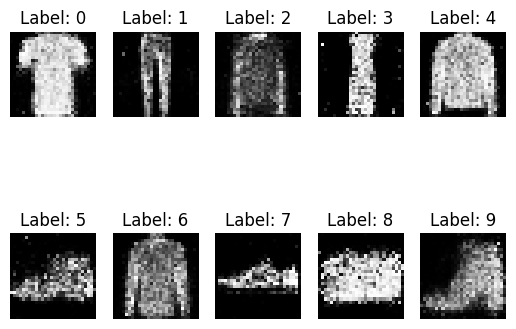

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 11501
4/4 [==============================] - 0s 3ms/step
Iteration : 11502
4/4 [==============================] - 0s 3ms/step
Iteration : 11503
4/4 [==============================] - 0s 4ms/step
Iteration : 11504
4/4 [==============================] - 0s 3ms/step
Iteration : 11505
4/4 [==============================] - 0s 3ms/step
Iteration : 11506
4/4 [==============================] - 0s 3ms/step
Iteration : 11507
4/4 [==============================] - 0s 4ms/step
Iteration : 11508
4/4 [==============================] - 0s 3ms/step
Iteration : 11509
4/4 [==============================] - 0s 3ms/step
Iteration : 11510
4/4 [==============================] - 0s 3ms/step
Iteration : 11511
4/4 [==============================] - 0s 3ms/step
Iteration : 11512
4/4 [==============================] - 0s 3ms/step
Iteration : 11513
4/4 [==============================] - 0s 3ms/step
Iterati

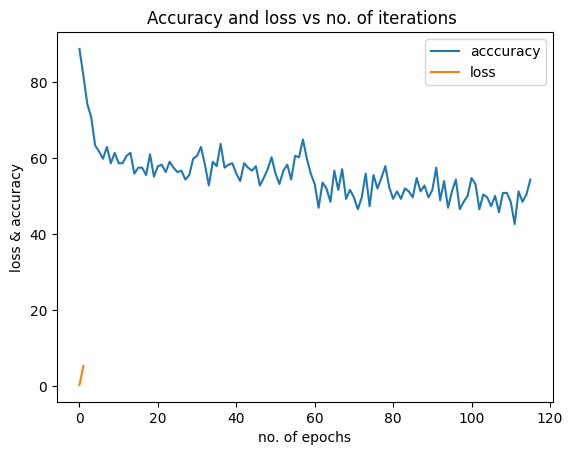

1/1 [==============================] - 0s 41ms/step


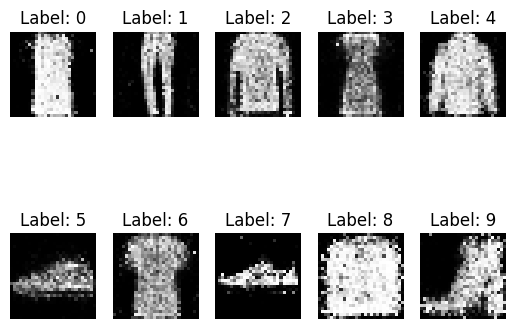

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 11601
4/4 [==============================] - 0s 4ms/step
Iteration : 11602
4/4 [==============================] - 0s 4ms/step
Iteration : 11603
4/4 [==============================] - 0s 3ms/step
Iteration : 11604
4/4 [==============================] - 0s 4ms/step
Iteration : 11605
4/4 [==============================] - 0s 5ms/step
Iteration : 11606
4/4 [==============================] - 0s 4ms/step
Iteration : 11607
4/4 [==============================] - 0s 4ms/step
Iteration : 11608
4/4 [==============================] - 0s 3ms/step
Iteration : 11609
4/4 [==============================] - 0s 4ms/step
Iteration : 11610
4/4 [==============================] - 0s 4ms/step
Iteration : 11611
4/4 [==============================] - 0s 7ms/step
Iteration : 11612
4/4 [==============================] - 0s 4ms/step
Iteration : 11613
4/4 [==============================] - 0s 6ms/step
Iterati

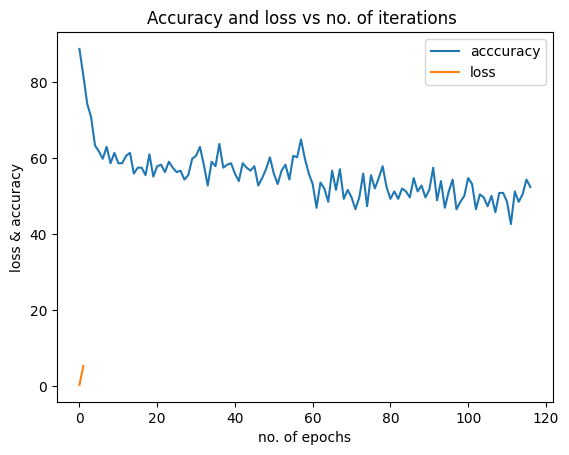

1/1 [==============================] - 0s 29ms/step


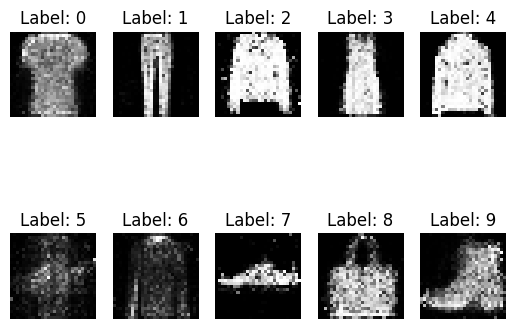

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 11701
4/4 [==============================] - 0s 3ms/step
Iteration : 11702
4/4 [==============================] - 0s 5ms/step
Iteration : 11703
4/4 [==============================] - 0s 3ms/step
Iteration : 11704
4/4 [==============================] - 0s 3ms/step
Iteration : 11705
4/4 [==============================] - 0s 5ms/step
Iteration : 11706
4/4 [==============================] - 0s 3ms/step
Iteration : 11707
4/4 [==============================] - 0s 3ms/step
Iteration : 11708
4/4 [==============================] - 0s 3ms/step
Iteration : 11709
4/4 [==============================] - 0s 3ms/step
Iteration : 11710
4/4 [==============================] - 0s 5ms/step
Iteration : 11711
4/4 [==============================] - 0s 4ms/step
Iteration : 11712
4/4 [==============================] - 0s 5ms/step
Iteration : 11713
4/4 [==============================] - 0s 4ms/step
Iterati

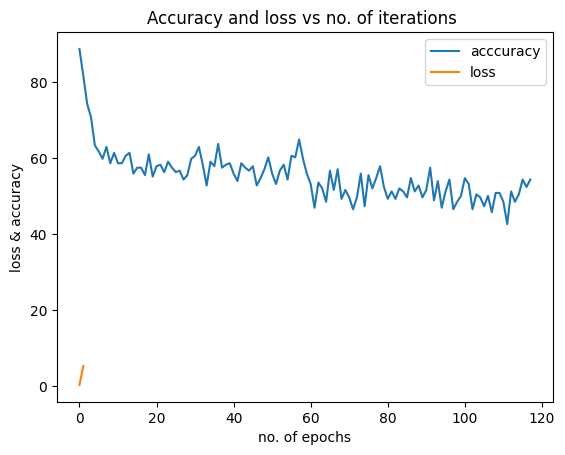

1/1 [==============================] - 0s 27ms/step


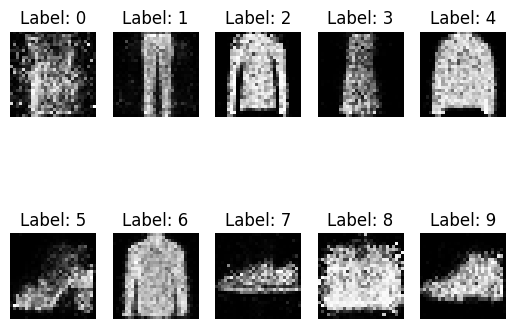

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 11801
4/4 [==============================] - 0s 3ms/step
Iteration : 11802
4/4 [==============================] - 0s 5ms/step
Iteration : 11803
4/4 [==============================] - 0s 3ms/step
Iteration : 11804
4/4 [==============================] - 0s 3ms/step
Iteration : 11805
4/4 [==============================] - 0s 3ms/step
Iteration : 11806
4/4 [==============================] - 0s 3ms/step
Iteration : 11807
4/4 [==============================] - 0s 3ms/step
Iteration : 11808
4/4 [==============================] - 0s 4ms/step
Iteration : 11809
4/4 [==============================] - 0s 3ms/step
Iteration : 11810
4/4 [==============================] - 0s 3ms/step
Iteration : 11811
4/4 [==============================] - 0s 4ms/step
Iteration : 11812
4/4 [==============================] - 0s 3ms/step
Iteration : 11813
4/4 [==============================] - 0s 4ms/step
Iterati

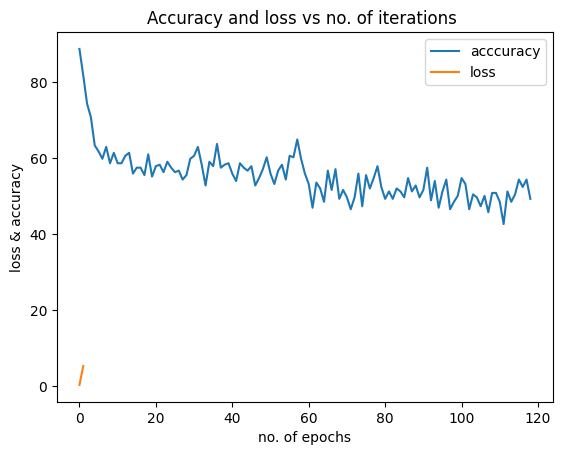

1/1 [==============================] - 0s 29ms/step


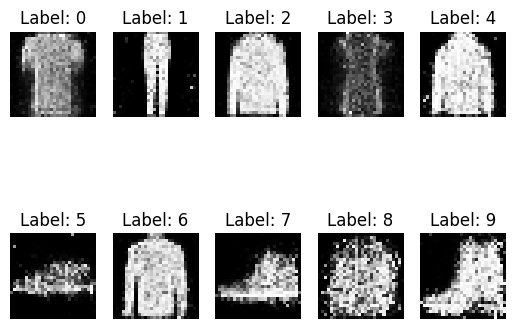

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 11901
4/4 [==============================] - 0s 3ms/step
Iteration : 11902
4/4 [==============================] - 0s 3ms/step
Iteration : 11903
4/4 [==============================] - 0s 3ms/step
Iteration : 11904
4/4 [==============================] - 0s 3ms/step
Iteration : 11905
4/4 [==============================] - 0s 3ms/step
Iteration : 11906
4/4 [==============================] - 0s 3ms/step
Iteration : 11907
4/4 [==============================] - 0s 4ms/step
Iteration : 11908
4/4 [==============================] - 0s 3ms/step
Iteration : 11909
4/4 [==============================] - 0s 4ms/step
Iteration : 11910
4/4 [==============================] - 0s 4ms/step
Iteration : 11911
4/4 [==============================] - 0s 5ms/step
Iteration : 11912
4/4 [==============================] - 0s 5ms/step
Iteration : 11913
4/4 [==============================] - 0s 5ms/step
Iterati

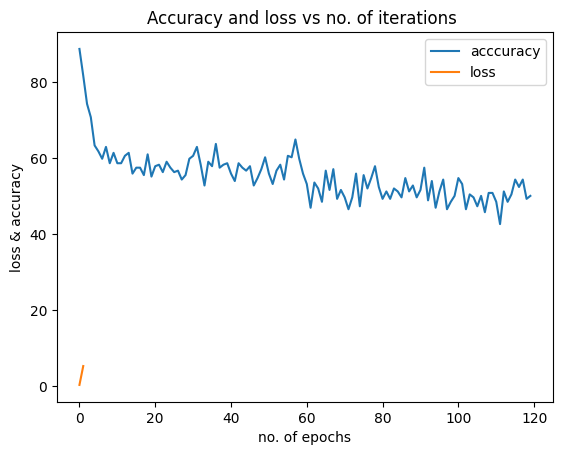

1/1 [==============================] - 0s 32ms/step


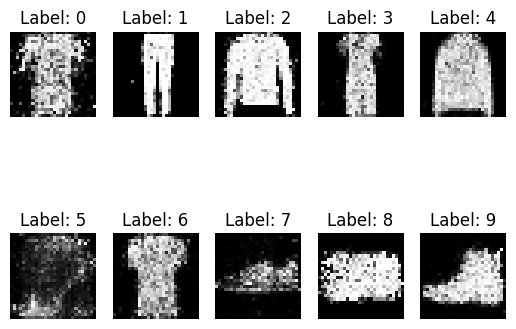

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 12001
4/4 [==============================] - 0s 3ms/step
Iteration : 12002
4/4 [==============================] - 0s 3ms/step
Iteration : 12003
4/4 [==============================] - 0s 3ms/step
Iteration : 12004
4/4 [==============================] - 0s 4ms/step
Iteration : 12005
4/4 [==============================] - 0s 3ms/step
Iteration : 12006
4/4 [==============================] - 0s 3ms/step
Iteration : 12007
4/4 [==============================] - 0s 4ms/step
Iteration : 12008
4/4 [==============================] - 0s 3ms/step
Iteration : 12009
4/4 [==============================] - 0s 3ms/step
Iteration : 12010
4/4 [==============================] - 0s 3ms/step
Iteration : 12011
4/4 [==============================] - 0s 3ms/step
Iteration : 12012
4/4 [==============================] - 0s 3ms/step
Iteration : 12013
4/4 [==============================] - 0s 3ms/step
Iterati

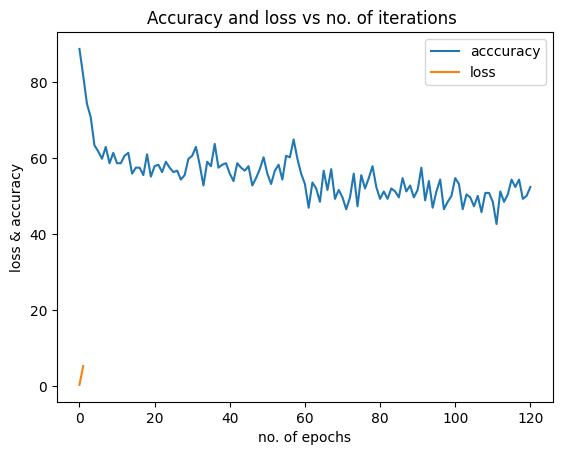

1/1 [==============================] - 0s 27ms/step


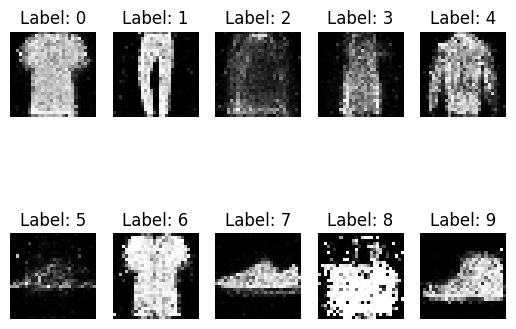

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 12101
4/4 [==============================] - 0s 3ms/step
Iteration : 12102
4/4 [==============================] - 0s 3ms/step
Iteration : 12103
4/4 [==============================] - 0s 4ms/step
Iteration : 12104
4/4 [==============================] - 0s 3ms/step
Iteration : 12105
4/4 [==============================] - 0s 3ms/step
Iteration : 12106
4/4 [==============================] - 0s 4ms/step
Iteration : 12107
4/4 [==============================] - 0s 3ms/step
Iteration : 12108
4/4 [==============================] - 0s 3ms/step
Iteration : 12109
4/4 [==============================] - 0s 7ms/step
Iteration : 12110
4/4 [==============================] - 0s 4ms/step
Iteration : 12111
4/4 [==============================] - 0s 3ms/step
Iteration : 12112
4/4 [==============================] - 0s 3ms/step
Iteration : 12113
4/4 [==============================] - 0s 3ms/step
Iterati

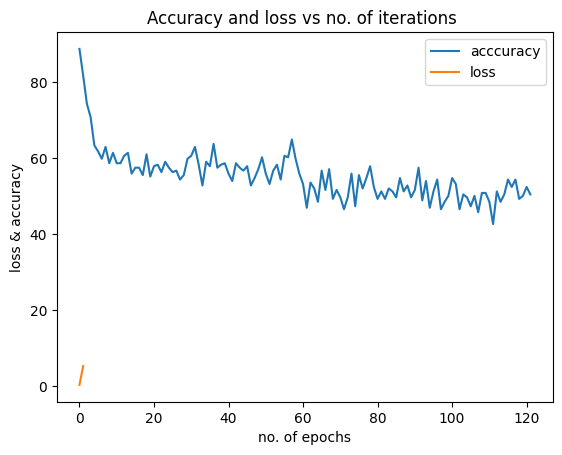

1/1 [==============================] - 0s 30ms/step


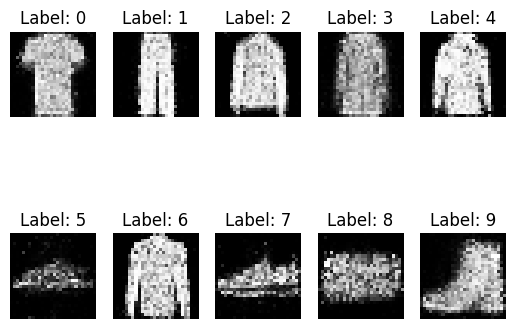

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 12201
4/4 [==============================] - 0s 3ms/step
Iteration : 12202
4/4 [==============================] - 0s 3ms/step
Iteration : 12203
4/4 [==============================] - 0s 4ms/step
Iteration : 12204
4/4 [==============================] - 0s 4ms/step
Iteration : 12205
4/4 [==============================] - 0s 3ms/step
Iteration : 12206
4/4 [==============================] - 0s 3ms/step
Iteration : 12207
4/4 [==============================] - 0s 3ms/step
Iteration : 12208
4/4 [==============================] - 0s 3ms/step
Iteration : 12209
4/4 [==============================] - 0s 5ms/step
Iteration : 12210
4/4 [==============================] - 0s 3ms/step
Iteration : 12211
4/4 [==============================] - 0s 3ms/step
Iteration : 12212
4/4 [==============================] - 0s 4ms/step
Iteration : 12213
4/4 [==============================] - 0s 3ms/step
Iterati

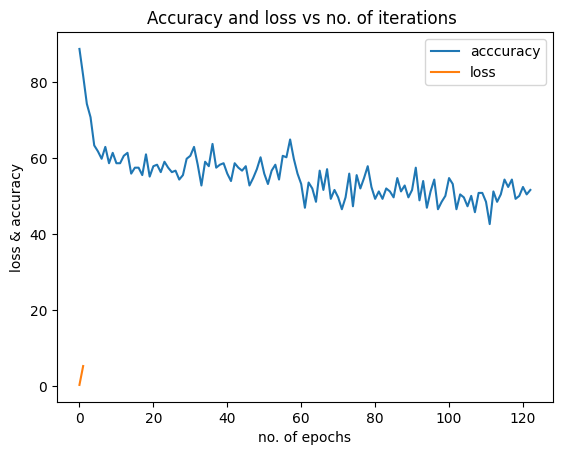

1/1 [==============================] - 0s 26ms/step


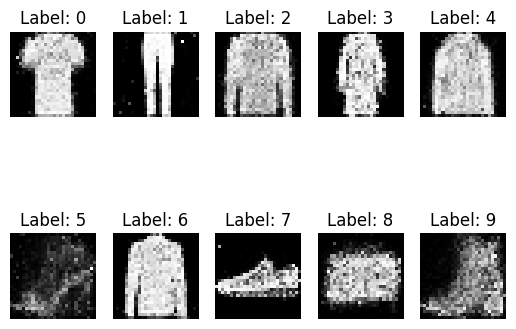

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 12301
4/4 [==============================] - 0s 5ms/step
Iteration : 12302
4/4 [==============================] - 0s 5ms/step
Iteration : 12303
4/4 [==============================] - 0s 4ms/step
Iteration : 12304
4/4 [==============================] - 0s 4ms/step
Iteration : 12305
4/4 [==============================] - 0s 5ms/step
Iteration : 12306
4/4 [==============================] - 0s 3ms/step
Iteration : 12307
4/4 [==============================] - 0s 5ms/step
Iteration : 12308
4/4 [==============================] - 0s 4ms/step
Iteration : 12309
4/4 [==============================] - 0s 4ms/step
Iteration : 12310
4/4 [==============================] - 0s 3ms/step
Iteration : 12311
4/4 [==============================] - 0s 4ms/step
Iteration : 12312
4/4 [==============================] - 0s 5ms/step
Iteration : 12313
4/4 [==============================] - 0s 4ms/step
Iterati

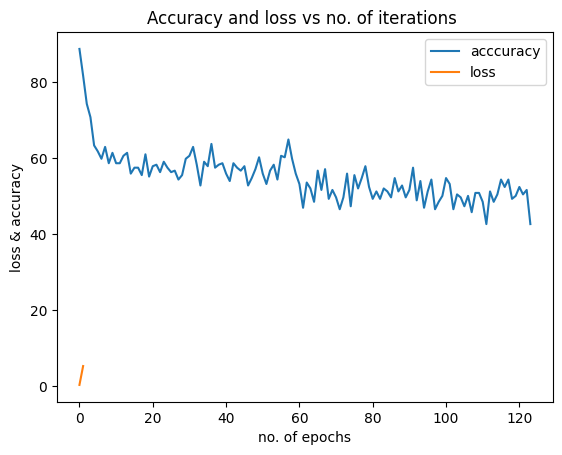

1/1 [==============================] - 0s 38ms/step


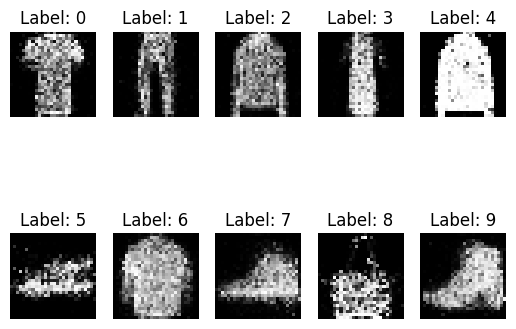

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 12401
4/4 [==============================] - 0s 3ms/step
Iteration : 12402
4/4 [==============================] - 0s 3ms/step
Iteration : 12403
4/4 [==============================] - 0s 3ms/step
Iteration : 12404
4/4 [==============================] - 0s 3ms/step
Iteration : 12405
4/4 [==============================] - 0s 3ms/step
Iteration : 12406
4/4 [==============================] - 0s 4ms/step
Iteration : 12407
4/4 [==============================] - 0s 3ms/step
Iteration : 12408
4/4 [==============================] - 0s 3ms/step
Iteration : 12409
4/4 [==============================] - 0s 3ms/step
Iteration : 12410
4/4 [==============================] - 0s 3ms/step
Iteration : 12411
4/4 [==============================] - 0s 3ms/step
Iteration : 12412
4/4 [==============================] - 0s 3ms/step
Iteration : 12413
4/4 [==============================] - 0s 3ms/step
Iterati

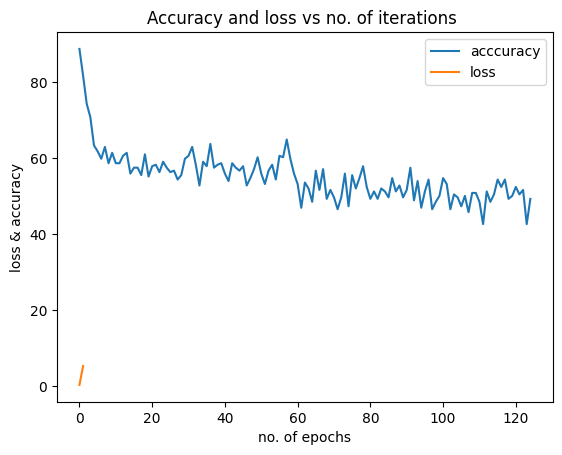

1/1 [==============================] - 0s 28ms/step


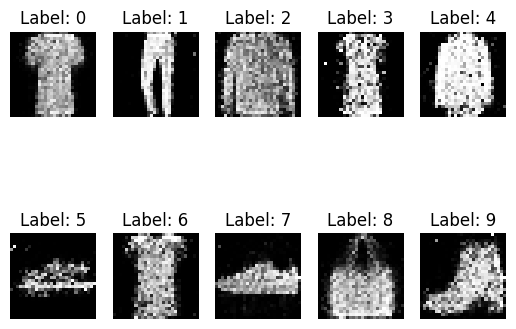

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 12501
4/4 [==============================] - 0s 3ms/step
Iteration : 12502
4/4 [==============================] - 0s 4ms/step
Iteration : 12503
4/4 [==============================] - 0s 4ms/step
Iteration : 12504
4/4 [==============================] - 0s 3ms/step
Iteration : 12505
4/4 [==============================] - 0s 5ms/step
Iteration : 12506
4/4 [==============================] - 0s 3ms/step
Iteration : 12507
4/4 [==============================] - 0s 3ms/step
Iteration : 12508
4/4 [==============================] - 0s 3ms/step
Iteration : 12509
4/4 [==============================] - 0s 3ms/step
Iteration : 12510
4/4 [==============================] - 0s 3ms/step
Iteration : 12511
4/4 [==============================] - 0s 3ms/step
Iteration : 12512
4/4 [==============================] - 0s 3ms/step
Iteration : 12513
4/4 [==============================] - 0s 4ms/step
Iterati

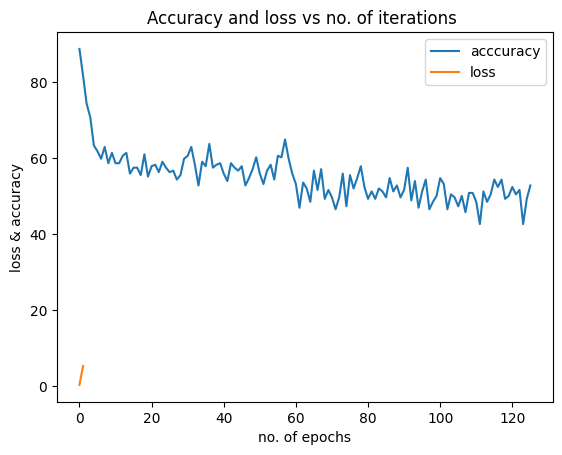

1/1 [==============================] - 0s 26ms/step


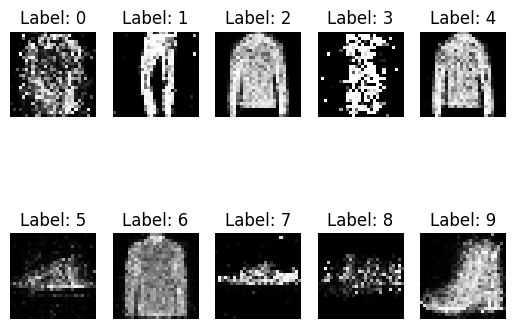

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 12601
4/4 [==============================] - 0s 4ms/step
Iteration : 12602
4/4 [==============================] - 0s 3ms/step
Iteration : 12603
4/4 [==============================] - 0s 3ms/step
Iteration : 12604
4/4 [==============================] - 0s 4ms/step
Iteration : 12605
4/4 [==============================] - 0s 3ms/step
Iteration : 12606
4/4 [==============================] - 0s 3ms/step
Iteration : 12607
4/4 [==============================] - 0s 3ms/step
Iteration : 12608
4/4 [==============================] - 0s 3ms/step
Iteration : 12609
4/4 [==============================] - 0s 3ms/step
Iteration : 12610
4/4 [==============================] - 0s 4ms/step
Iteration : 12611
4/4 [==============================] - 0s 3ms/step
Iteration : 12612
4/4 [==============================] - 0s 3ms/step
Iteration : 12613
4/4 [==============================] - 0s 4ms/step
Iterati

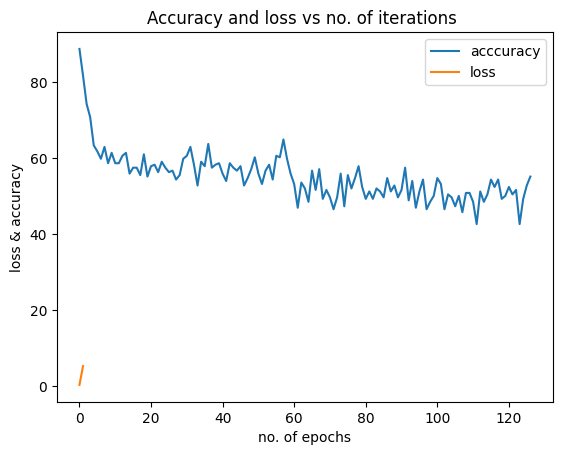

1/1 [==============================] - 0s 45ms/step


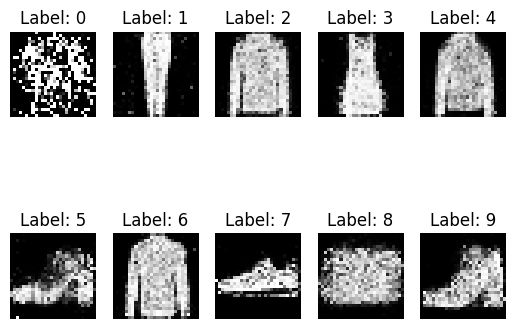

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 12701
4/4 [==============================] - 0s 4ms/step
Iteration : 12702
4/4 [==============================] - 0s 4ms/step
Iteration : 12703
4/4 [==============================] - 0s 3ms/step
Iteration : 12704
4/4 [==============================] - 0s 3ms/step
Iteration : 12705
4/4 [==============================] - 0s 6ms/step
Iteration : 12706
4/4 [==============================] - 0s 4ms/step
Iteration : 12707
4/4 [==============================] - 0s 3ms/step
Iteration : 12708
4/4 [==============================] - 0s 3ms/step
Iteration : 12709
4/4 [==============================] - 0s 4ms/step
Iteration : 12710
4/4 [==============================] - 0s 3ms/step
Iteration : 12711
4/4 [==============================] - 0s 3ms/step
Iteration : 12712
4/4 [==============================] - 0s 3ms/step
Iteration : 12713
4/4 [==============================] - 0s 3ms/step
Iterati

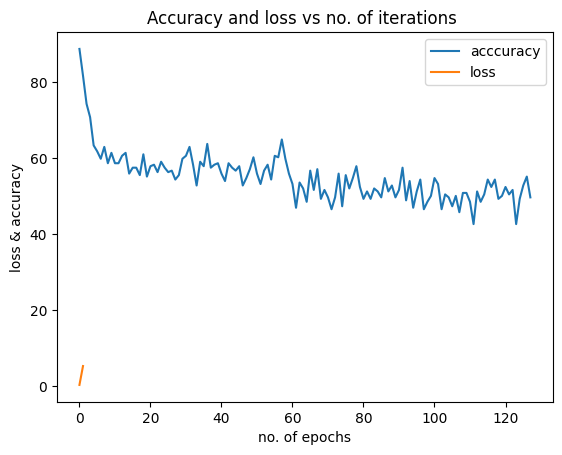

1/1 [==============================] - 0s 28ms/step


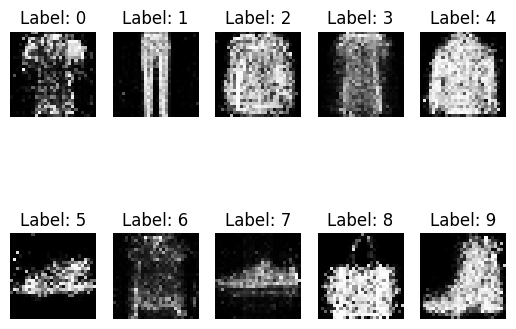

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 12801
4/4 [==============================] - 0s 3ms/step
Iteration : 12802
4/4 [==============================] - 0s 3ms/step
Iteration : 12803
4/4 [==============================] - 0s 3ms/step
Iteration : 12804
4/4 [==============================] - 0s 5ms/step
Iteration : 12805
4/4 [==============================] - 0s 3ms/step
Iteration : 12806
4/4 [==============================] - 0s 3ms/step
Iteration : 12807
4/4 [==============================] - 0s 3ms/step
Iteration : 12808
4/4 [==============================] - 0s 3ms/step
Iteration : 12809
4/4 [==============================] - 0s 3ms/step
Iteration : 12810
4/4 [==============================] - 0s 3ms/step
Iteration : 12811
4/4 [==============================] - 0s 3ms/step
Iteration : 12812
4/4 [==============================] - 0s 4ms/step
Iteration : 12813
4/4 [==============================] - 0s 3ms/step
Iterati

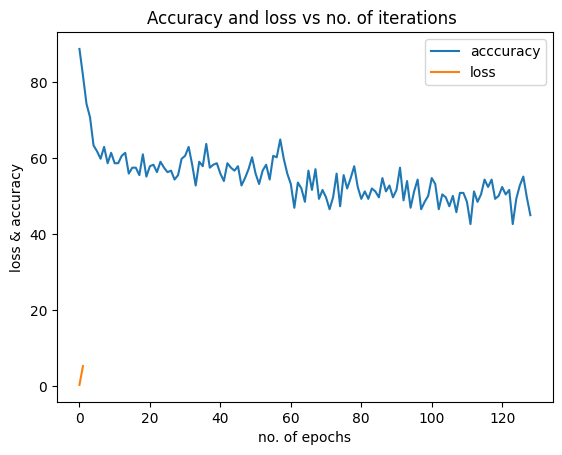

1/1 [==============================] - 0s 29ms/step


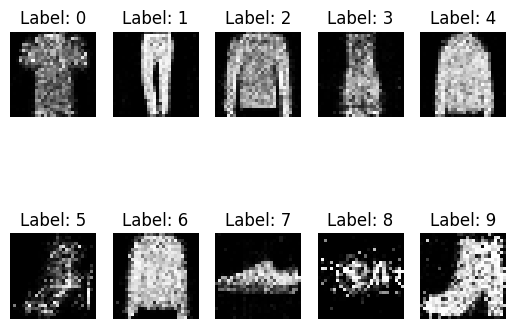

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 12901
4/4 [==============================] - 0s 4ms/step
Iteration : 12902
4/4 [==============================] - 0s 3ms/step
Iteration : 12903
4/4 [==============================] - 0s 3ms/step
Iteration : 12904
4/4 [==============================] - 0s 3ms/step
Iteration : 12905
4/4 [==============================] - 0s 3ms/step
Iteration : 12906
4/4 [==============================] - 0s 3ms/step
Iteration : 12907
4/4 [==============================] - 0s 3ms/step
Iteration : 12908
4/4 [==============================] - 0s 3ms/step
Iteration : 12909
4/4 [==============================] - 0s 3ms/step
Iteration : 12910
4/4 [==============================] - 0s 3ms/step
Iteration : 12911
4/4 [==============================] - 0s 3ms/step
Iteration : 12912
4/4 [==============================] - 0s 3ms/step
Iteration : 12913
4/4 [==============================] - 0s 3ms/step
Iterati

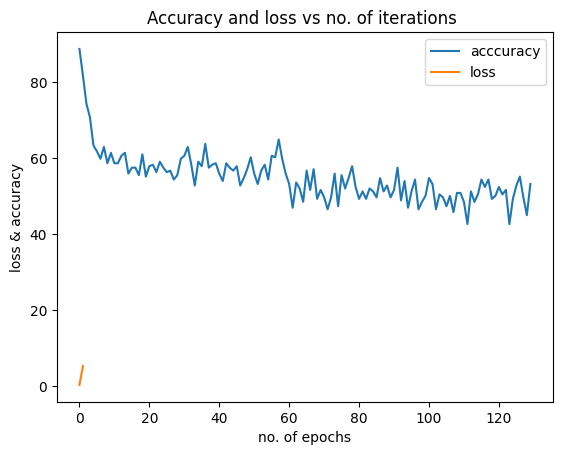

1/1 [==============================] - 0s 26ms/step


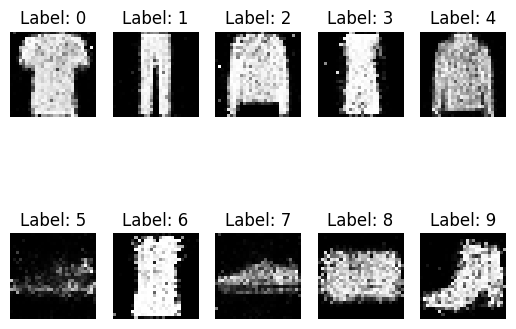

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 13001
4/4 [==============================] - 0s 3ms/step
Iteration : 13002
4/4 [==============================] - 0s 3ms/step
Iteration : 13003
4/4 [==============================] - 0s 3ms/step
Iteration : 13004
4/4 [==============================] - 0s 3ms/step
Iteration : 13005
4/4 [==============================] - 0s 4ms/step
Iteration : 13006
4/4 [==============================] - 0s 3ms/step
Iteration : 13007
4/4 [==============================] - 0s 3ms/step
Iteration : 13008
4/4 [==============================] - 0s 3ms/step
Iteration : 13009
4/4 [==============================] - 0s 3ms/step
Iteration : 13010
4/4 [==============================] - 0s 3ms/step
Iteration : 13011
4/4 [==============================] - 0s 5ms/step
Iteration : 13012
4/4 [==============================] - 0s 4ms/step
Iteration : 13013
4/4 [==============================] - 0s 4ms/step
Iterati

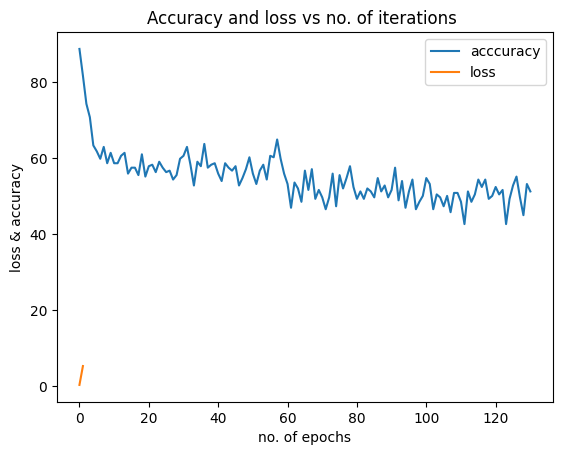

1/1 [==============================] - 0s 62ms/step


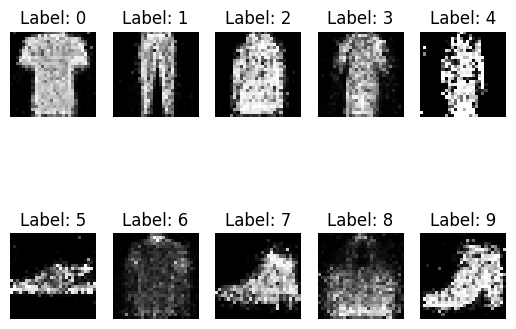

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 13101
4/4 [==============================] - 0s 3ms/step
Iteration : 13102
4/4 [==============================] - 0s 4ms/step
Iteration : 13103
4/4 [==============================] - 0s 3ms/step
Iteration : 13104
4/4 [==============================] - 0s 3ms/step
Iteration : 13105
4/4 [==============================] - 0s 5ms/step
Iteration : 13106
4/4 [==============================] - 0s 3ms/step
Iteration : 13107
4/4 [==============================] - 0s 3ms/step
Iteration : 13108
4/4 [==============================] - 0s 3ms/step
Iteration : 13109
4/4 [==============================] - 0s 3ms/step
Iteration : 13110
4/4 [==============================] - 0s 3ms/step
Iteration : 13111
4/4 [==============================] - 0s 4ms/step
Iteration : 13112
4/4 [==============================] - 0s 4ms/step
Iteration : 13113
4/4 [==============================] - 0s 4ms/step
Iterati

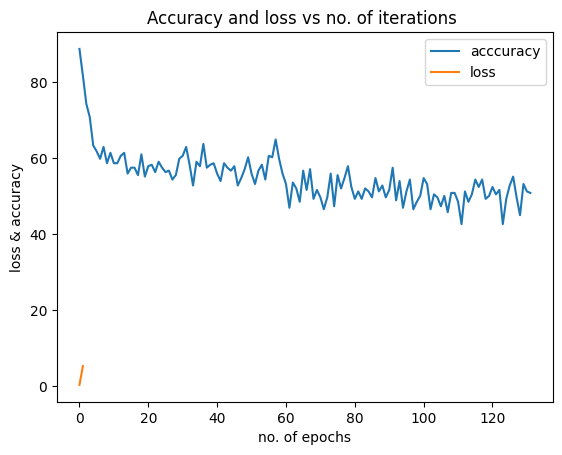

1/1 [==============================] - 0s 29ms/step


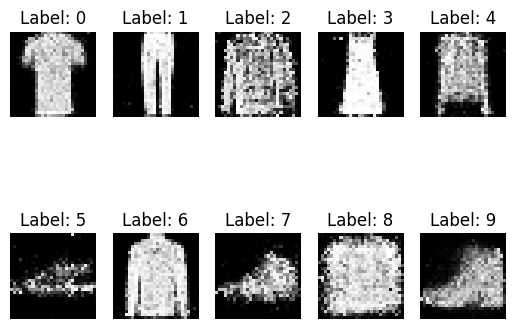

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 13201
4/4 [==============================] - 0s 4ms/step
Iteration : 13202
4/4 [==============================] - 0s 3ms/step
Iteration : 13203
4/4 [==============================] - 0s 3ms/step
Iteration : 13204
4/4 [==============================] - 0s 3ms/step
Iteration : 13205
4/4 [==============================] - 0s 4ms/step
Iteration : 13206
4/4 [==============================] - 0s 3ms/step
Iteration : 13207
4/4 [==============================] - 0s 3ms/step
Iteration : 13208
4/4 [==============================] - 0s 3ms/step
Iteration : 13209
4/4 [==============================] - 0s 3ms/step
Iteration : 13210
4/4 [==============================] - 0s 4ms/step
Iteration : 13211
4/4 [==============================] - 0s 3ms/step
Iteration : 13212
4/4 [==============================] - 0s 3ms/step
Iteration : 13213
4/4 [==============================] - 0s 3ms/step
Iterati

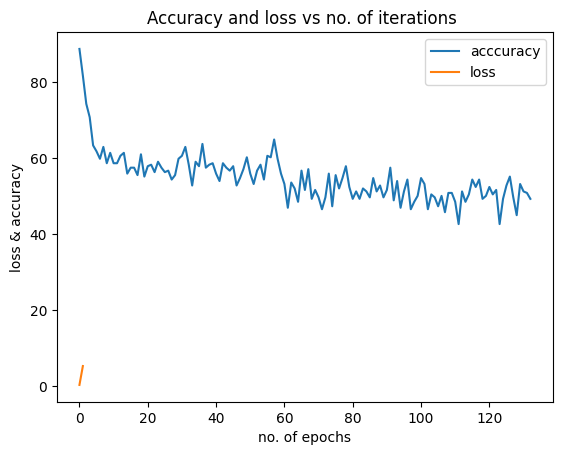

1/1 [==============================] - 0s 25ms/step


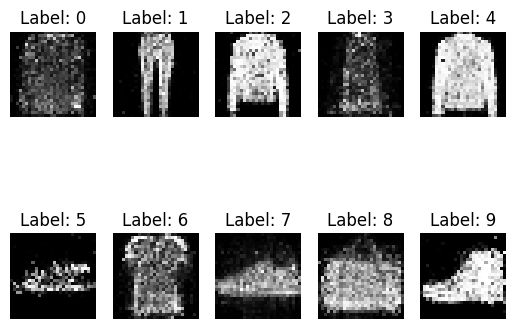

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 13301
4/4 [==============================] - 0s 3ms/step
Iteration : 13302
4/4 [==============================] - 0s 4ms/step
Iteration : 13303
4/4 [==============================] - 0s 3ms/step
Iteration : 13304
4/4 [==============================] - 0s 4ms/step
Iteration : 13305
4/4 [==============================] - 0s 3ms/step
Iteration : 13306
4/4 [==============================] - 0s 4ms/step
Iteration : 13307
4/4 [==============================] - 0s 3ms/step
Iteration : 13308
4/4 [==============================] - 0s 3ms/step
Iteration : 13309
4/4 [==============================] - 0s 3ms/step
Iteration : 13310
4/4 [==============================] - 0s 3ms/step
Iteration : 13311
4/4 [==============================] - 0s 4ms/step
Iteration : 13312
4/4 [==============================] - 0s 3ms/step
Iteration : 13313
4/4 [==============================] - 0s 4ms/step
Iterati

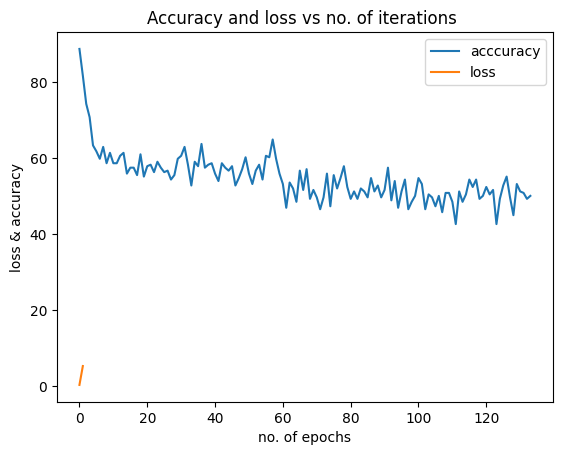

1/1 [==============================] - 0s 36ms/step


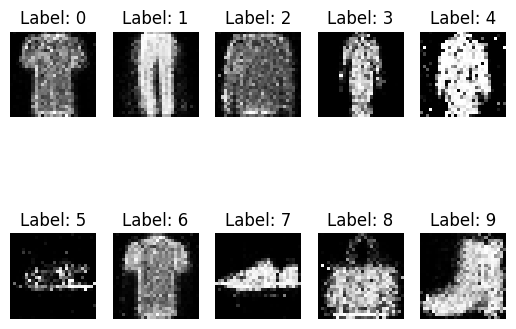

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 13401
4/4 [==============================] - 0s 4ms/step
Iteration : 13402
4/4 [==============================] - 0s 3ms/step
Iteration : 13403
4/4 [==============================] - 0s 3ms/step
Iteration : 13404
4/4 [==============================] - 0s 3ms/step
Iteration : 13405
4/4 [==============================] - 0s 3ms/step
Iteration : 13406
4/4 [==============================] - 0s 5ms/step
Iteration : 13407
4/4 [==============================] - 0s 3ms/step
Iteration : 13408
4/4 [==============================] - 0s 4ms/step
Iteration : 13409
4/4 [==============================] - 0s 4ms/step
Iteration : 13410
4/4 [==============================] - 0s 3ms/step
Iteration : 13411
4/4 [==============================] - 0s 3ms/step
Iteration : 13412
4/4 [==============================] - 0s 4ms/step
Iteration : 13413
4/4 [==============================] - 0s 3ms/step
Iterati

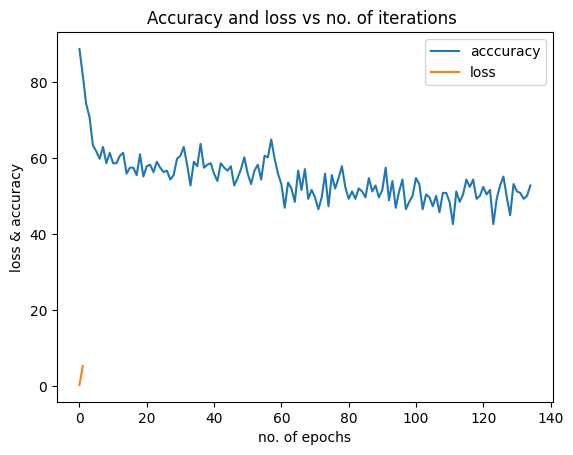

1/1 [==============================] - 0s 26ms/step


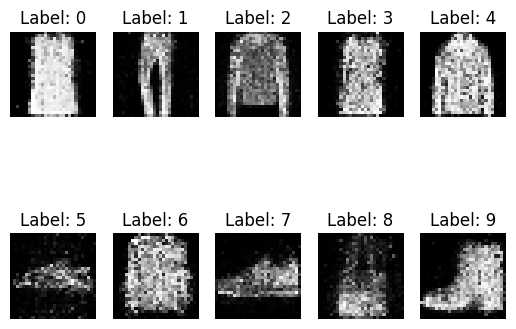

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 13501
4/4 [==============================] - 0s 4ms/step
Iteration : 13502
4/4 [==============================] - 0s 3ms/step
Iteration : 13503
4/4 [==============================] - 0s 3ms/step
Iteration : 13504
4/4 [==============================] - 0s 3ms/step
Iteration : 13505
4/4 [==============================] - 0s 3ms/step
Iteration : 13506
4/4 [==============================] - 0s 3ms/step
Iteration : 13507
4/4 [==============================] - 0s 4ms/step
Iteration : 13508
4/4 [==============================] - 0s 3ms/step
Iteration : 13509
4/4 [==============================] - 0s 3ms/step
Iteration : 13510
4/4 [==============================] - 0s 3ms/step
Iteration : 13511
4/4 [==============================] - 0s 3ms/step
Iteration : 13512
4/4 [==============================] - 0s 4ms/step
Iteration : 13513
4/4 [==============================] - 0s 4ms/step
Iterati

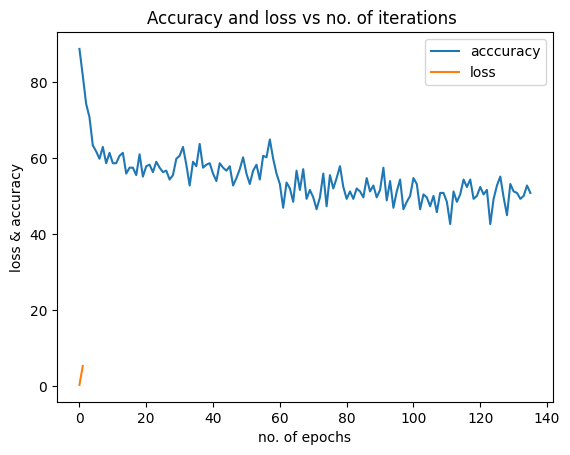

1/1 [==============================] - 0s 26ms/step


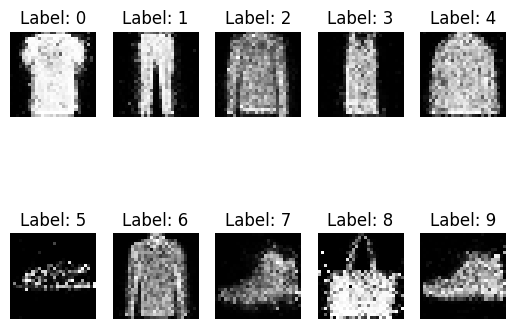

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 13601
4/4 [==============================] - 0s 3ms/step
Iteration : 13602
4/4 [==============================] - 0s 3ms/step
Iteration : 13603
4/4 [==============================] - 0s 4ms/step
Iteration : 13604
4/4 [==============================] - 0s 3ms/step
Iteration : 13605
4/4 [==============================] - 0s 3ms/step
Iteration : 13606
4/4 [==============================] - 0s 3ms/step
Iteration : 13607
4/4 [==============================] - 0s 4ms/step
Iteration : 13608
4/4 [==============================] - 0s 3ms/step
Iteration : 13609
4/4 [==============================] - 0s 3ms/step
Iteration : 13610
4/4 [==============================] - 0s 3ms/step
Iteration : 13611
4/4 [==============================] - 0s 3ms/step
Iteration : 13612
4/4 [==============================] - 0s 4ms/step
Iteration : 13613
4/4 [==============================] - 0s 3ms/step
Iterati

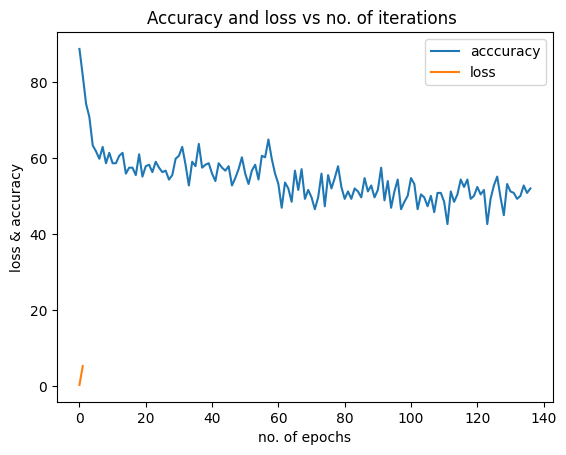

1/1 [==============================] - 0s 34ms/step


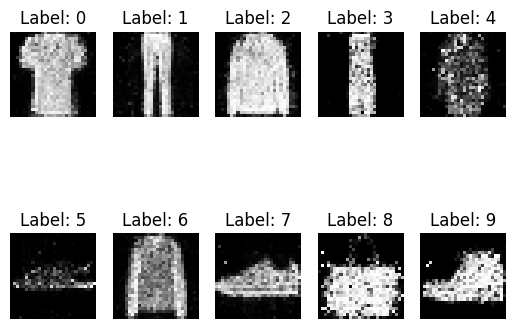

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 13701
4/4 [==============================] - 0s 3ms/step
Iteration : 13702
4/4 [==============================] - 0s 3ms/step
Iteration : 13703
4/4 [==============================] - 0s 3ms/step
Iteration : 13704
4/4 [==============================] - 0s 3ms/step
Iteration : 13705
4/4 [==============================] - 0s 3ms/step
Iteration : 13706
4/4 [==============================] - 0s 3ms/step
Iteration : 13707
4/4 [==============================] - 0s 3ms/step
Iteration : 13708
4/4 [==============================] - 0s 4ms/step
Iteration : 13709
4/4 [==============================] - 0s 3ms/step
Iteration : 13710
4/4 [==============================] - 0s 3ms/step
Iteration : 13711
4/4 [==============================] - 0s 5ms/step
Iteration : 13712
4/4 [==============================] - 0s 5ms/step
Iteration : 13713
4/4 [==============================] - 0s 3ms/step
Iterati

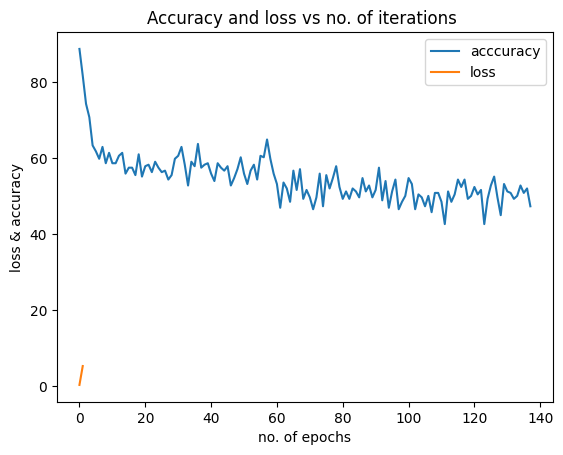

1/1 [==============================] - 0s 42ms/step


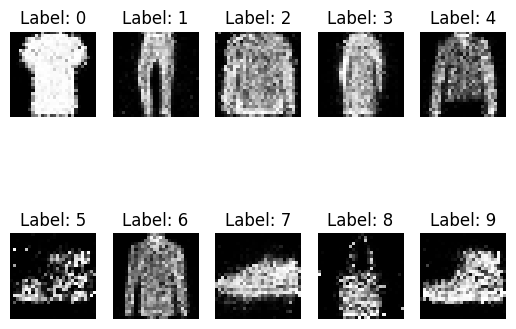

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 13801
4/4 [==============================] - 0s 4ms/step
Iteration : 13802
4/4 [==============================] - 0s 3ms/step
Iteration : 13803
4/4 [==============================] - 0s 3ms/step
Iteration : 13804
4/4 [==============================] - 0s 3ms/step
Iteration : 13805
4/4 [==============================] - 0s 4ms/step
Iteration : 13806
4/4 [==============================] - 0s 3ms/step
Iteration : 13807
4/4 [==============================] - 0s 3ms/step
Iteration : 13808
4/4 [==============================] - 0s 3ms/step
Iteration : 13809
4/4 [==============================] - 0s 3ms/step
Iteration : 13810
4/4 [==============================] - 0s 3ms/step
Iteration : 13811
4/4 [==============================] - 0s 3ms/step
Iteration : 13812
4/4 [==============================] - 0s 4ms/step
Iteration : 13813
4/4 [==============================] - 0s 3ms/step
Iterati

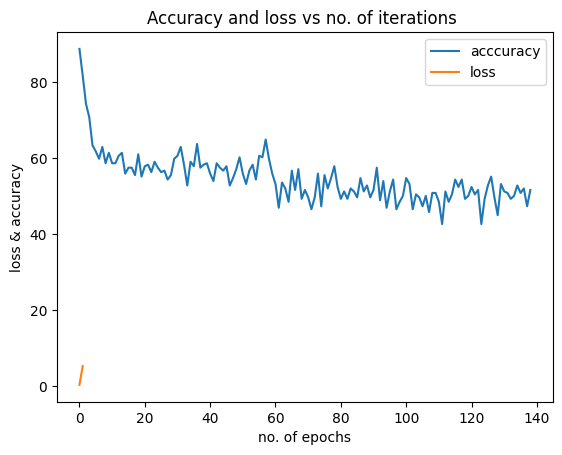

1/1 [==============================] - 0s 34ms/step


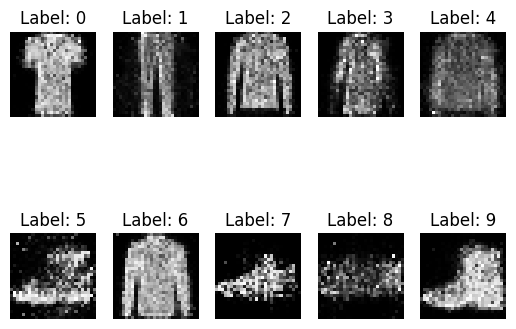

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 13901
4/4 [==============================] - 0s 4ms/step
Iteration : 13902
4/4 [==============================] - 0s 3ms/step
Iteration : 13903
4/4 [==============================] - 0s 4ms/step
Iteration : 13904
4/4 [==============================] - 0s 3ms/step
Iteration : 13905
4/4 [==============================] - 0s 5ms/step
Iteration : 13906
4/4 [==============================] - 0s 3ms/step
Iteration : 13907
4/4 [==============================] - 0s 3ms/step
Iteration : 13908
4/4 [==============================] - 0s 8ms/step
Iteration : 13909
4/4 [==============================] - 0s 3ms/step
Iteration : 13910
4/4 [==============================] - 0s 3ms/step
Iteration : 13911
4/4 [==============================] - 0s 4ms/step
Iteration : 13912
4/4 [==============================] - 0s 3ms/step
Iteration : 13913
4/4 [==============================] - 0s 3ms/step
Iterati

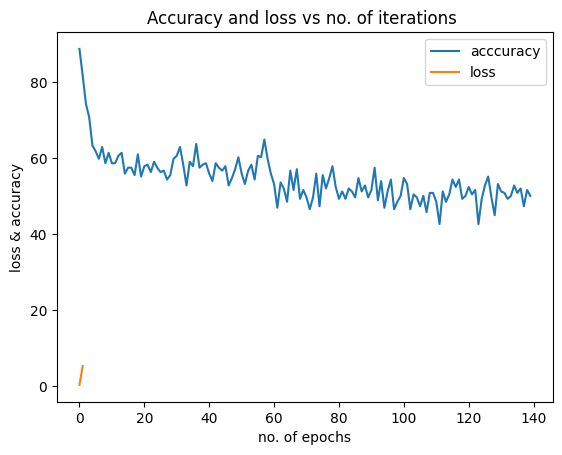

1/1 [==============================] - 0s 25ms/step


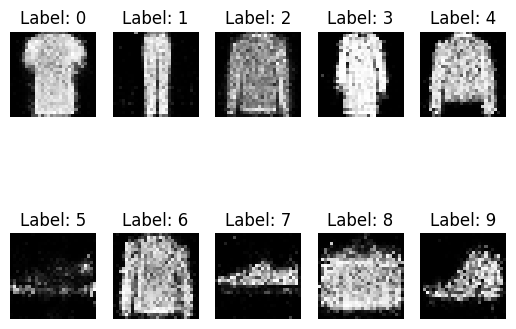

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 14001
4/4 [==============================] - 0s 3ms/step
Iteration : 14002
4/4 [==============================] - 0s 3ms/step
Iteration : 14003
4/4 [==============================] - 0s 3ms/step
Iteration : 14004
4/4 [==============================] - 0s 3ms/step
Iteration : 14005
4/4 [==============================] - 0s 3ms/step
Iteration : 14006
4/4 [==============================] - 0s 3ms/step
Iteration : 14007
4/4 [==============================] - 0s 3ms/step
Iteration : 14008
4/4 [==============================] - 0s 4ms/step
Iteration : 14009
4/4 [==============================] - 0s 3ms/step
Iteration : 14010
4/4 [==============================] - 0s 3ms/step
Iteration : 14011
4/4 [==============================] - 0s 3ms/step
Iteration : 14012
4/4 [==============================] - 0s 4ms/step
Iteration : 14013
4/4 [==============================] - 0s 3ms/step
Iterati

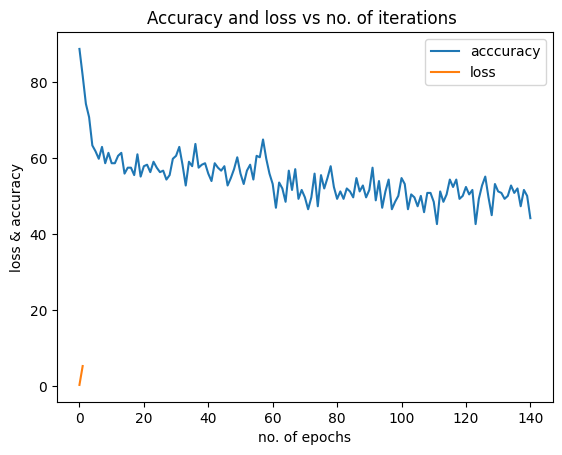

1/1 [==============================] - 0s 43ms/step


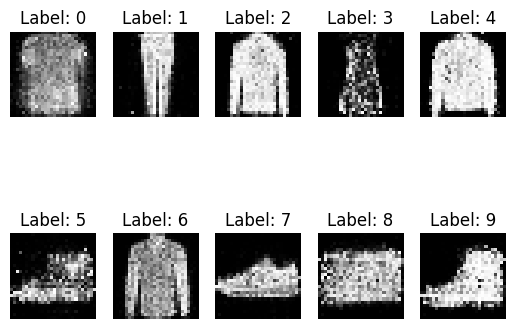

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 14101
4/4 [==============================] - 0s 3ms/step
Iteration : 14102
4/4 [==============================] - 0s 3ms/step
Iteration : 14103
4/4 [==============================] - 0s 3ms/step
Iteration : 14104
4/4 [==============================] - 0s 3ms/step
Iteration : 14105
4/4 [==============================] - 0s 4ms/step
Iteration : 14106
4/4 [==============================] - 0s 3ms/step
Iteration : 14107
4/4 [==============================] - 0s 3ms/step
Iteration : 14108
4/4 [==============================] - 0s 4ms/step
Iteration : 14109
4/4 [==============================] - 0s 3ms/step
Iteration : 14110
4/4 [==============================] - 0s 3ms/step
Iteration : 14111
4/4 [==============================] - 0s 6ms/step
Iteration : 14112
4/4 [==============================] - 0s 3ms/step
Iteration : 14113
4/4 [==============================] - 0s 3ms/step
Iterati

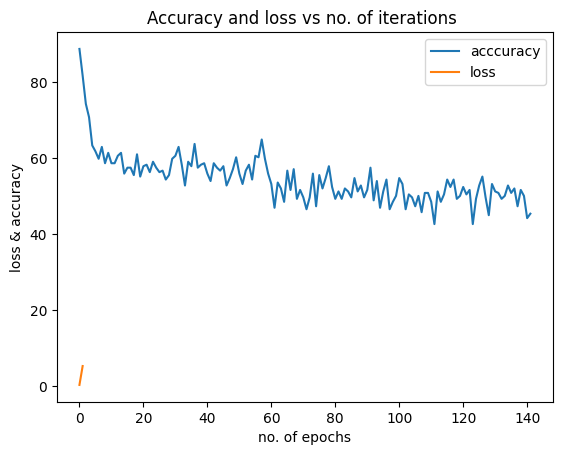

1/1 [==============================] - 0s 28ms/step


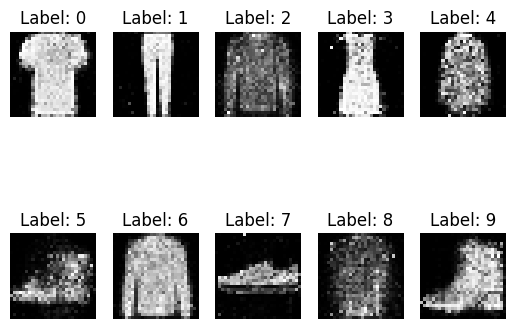

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 14201
4/4 [==============================] - 0s 3ms/step
Iteration : 14202
4/4 [==============================] - 0s 3ms/step
Iteration : 14203
4/4 [==============================] - 0s 3ms/step
Iteration : 14204
4/4 [==============================] - 0s 3ms/step
Iteration : 14205
4/4 [==============================] - 0s 3ms/step
Iteration : 14206
4/4 [==============================] - 0s 5ms/step
Iteration : 14207
4/4 [==============================] - 0s 3ms/step
Iteration : 14208
4/4 [==============================] - 0s 4ms/step
Iteration : 14209
4/4 [==============================] - 0s 3ms/step
Iteration : 14210
4/4 [==============================] - 0s 3ms/step
Iteration : 14211
4/4 [==============================] - 0s 5ms/step
Iteration : 14212
4/4 [==============================] - 0s 3ms/step
Iteration : 14213
4/4 [==============================] - 0s 4ms/step
Iterati

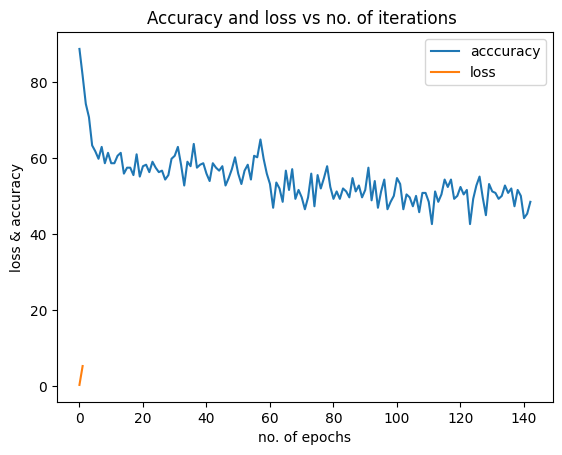

1/1 [==============================] - 0s 26ms/step


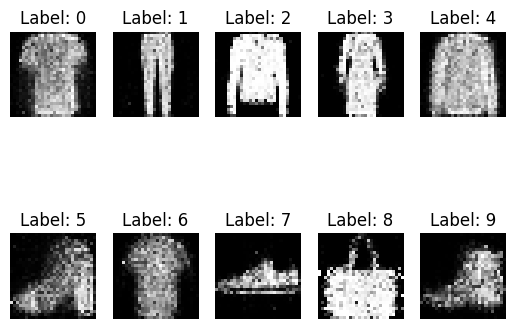

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 14301
4/4 [==============================] - 0s 3ms/step
Iteration : 14302
4/4 [==============================] - 0s 3ms/step
Iteration : 14303
4/4 [==============================] - 0s 3ms/step
Iteration : 14304
4/4 [==============================] - 0s 3ms/step
Iteration : 14305
4/4 [==============================] - 0s 3ms/step
Iteration : 14306
4/4 [==============================] - 0s 3ms/step
Iteration : 14307
4/4 [==============================] - 0s 3ms/step
Iteration : 14308
4/4 [==============================] - 0s 3ms/step
Iteration : 14309
4/4 [==============================] - 0s 3ms/step
Iteration : 14310
4/4 [==============================] - 0s 3ms/step
Iteration : 14311
4/4 [==============================] - 0s 3ms/step
Iteration : 14312
4/4 [==============================] - 0s 4ms/step
Iteration : 14313
4/4 [==============================] - 0s 3ms/step
Iterati

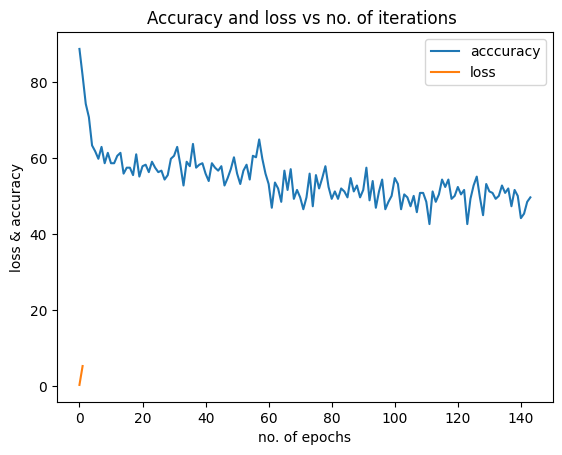

1/1 [==============================] - 0s 28ms/step


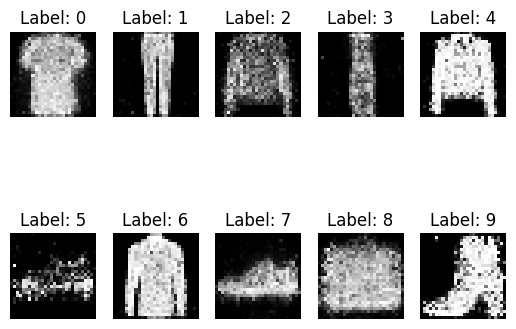

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 14401
4/4 [==============================] - 0s 3ms/step
Iteration : 14402
4/4 [==============================] - 0s 3ms/step
Iteration : 14403
4/4 [==============================] - 0s 3ms/step
Iteration : 14404
4/4 [==============================] - 0s 3ms/step
Iteration : 14405
4/4 [==============================] - 0s 3ms/step
Iteration : 14406
4/4 [==============================] - 0s 3ms/step
Iteration : 14407
4/4 [==============================] - 0s 3ms/step
Iteration : 14408
4/4 [==============================] - 0s 3ms/step
Iteration : 14409
4/4 [==============================] - 0s 3ms/step
Iteration : 14410
4/4 [==============================] - 0s 3ms/step
Iteration : 14411
4/4 [==============================] - 0s 3ms/step
Iteration : 14412
4/4 [==============================] - 0s 4ms/step
Iteration : 14413
4/4 [==============================] - 0s 5ms/step
Iterati

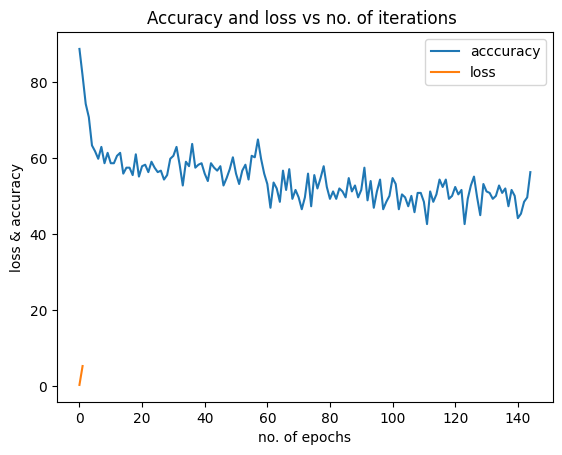

1/1 [==============================] - 0s 31ms/step


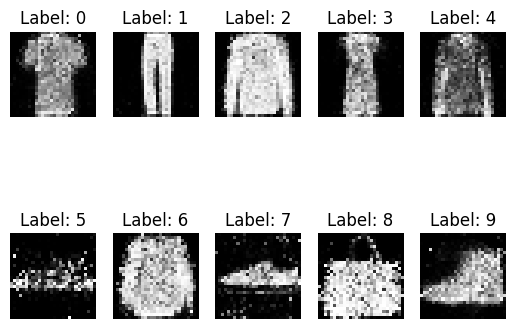

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 14501
4/4 [==============================] - 0s 3ms/step
Iteration : 14502
4/4 [==============================] - 0s 3ms/step
Iteration : 14503
4/4 [==============================] - 0s 4ms/step
Iteration : 14504
4/4 [==============================] - 0s 3ms/step
Iteration : 14505
4/4 [==============================] - 0s 4ms/step
Iteration : 14506
4/4 [==============================] - 0s 3ms/step
Iteration : 14507
4/4 [==============================] - 0s 3ms/step
Iteration : 14508
4/4 [==============================] - 0s 3ms/step
Iteration : 14509
4/4 [==============================] - 0s 3ms/step
Iteration : 14510
4/4 [==============================] - 0s 3ms/step
Iteration : 14511
4/4 [==============================] - 0s 3ms/step
Iteration : 14512
4/4 [==============================] - 0s 3ms/step
Iteration : 14513
4/4 [==============================] - 0s 3ms/step
Iterati

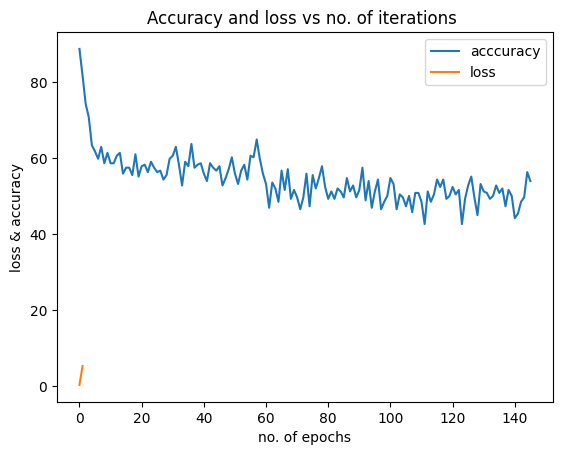

1/1 [==============================] - 0s 44ms/step


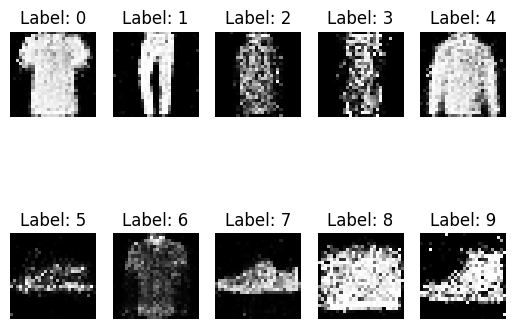

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 14601
4/4 [==============================] - 0s 4ms/step
Iteration : 14602
4/4 [==============================] - 0s 4ms/step
Iteration : 14603
4/4 [==============================] - 0s 3ms/step
Iteration : 14604
4/4 [==============================] - 0s 3ms/step
Iteration : 14605
4/4 [==============================] - 0s 3ms/step
Iteration : 14606
4/4 [==============================] - 0s 3ms/step
Iteration : 14607
4/4 [==============================] - 0s 3ms/step
Iteration : 14608
4/4 [==============================] - 0s 3ms/step
Iteration : 14609
4/4 [==============================] - 0s 4ms/step
Iteration : 14610
4/4 [==============================] - 0s 3ms/step
Iteration : 14611
4/4 [==============================] - 0s 3ms/step
Iteration : 14612
4/4 [==============================] - 0s 3ms/step
Iteration : 14613
4/4 [==============================] - 0s 3ms/step
Iterati

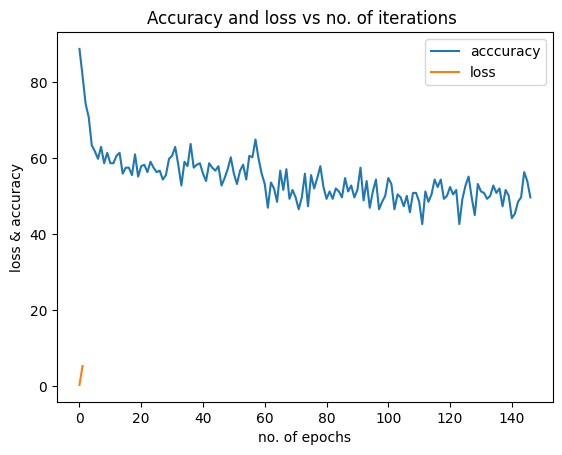

1/1 [==============================] - 0s 25ms/step


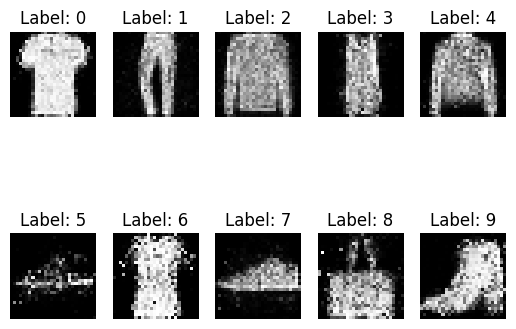

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 14701
4/4 [==============================] - 0s 4ms/step
Iteration : 14702
4/4 [==============================] - 0s 3ms/step
Iteration : 14703
4/4 [==============================] - 0s 3ms/step
Iteration : 14704
4/4 [==============================] - 0s 3ms/step
Iteration : 14705
4/4 [==============================] - 0s 3ms/step
Iteration : 14706
4/4 [==============================] - 0s 3ms/step
Iteration : 14707
4/4 [==============================] - 0s 3ms/step
Iteration : 14708
4/4 [==============================] - 0s 7ms/step
Iteration : 14709
4/4 [==============================] - 0s 3ms/step
Iteration : 14710
4/4 [==============================] - 0s 3ms/step
Iteration : 14711
4/4 [==============================] - 0s 3ms/step
Iteration : 14712
4/4 [==============================] - 0s 3ms/step
Iteration : 14713
4/4 [==============================] - 0s 5ms/step
Iterati

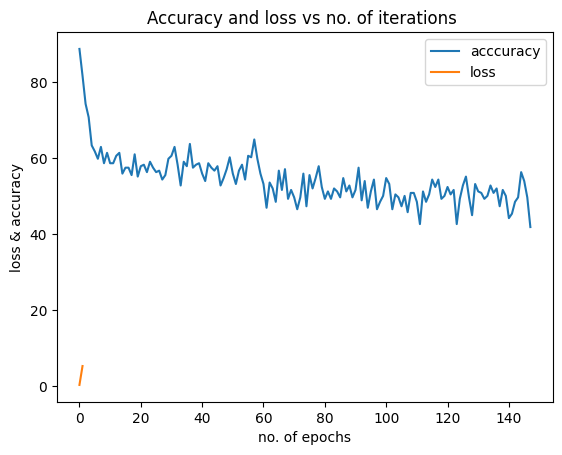

1/1 [==============================] - 0s 30ms/step


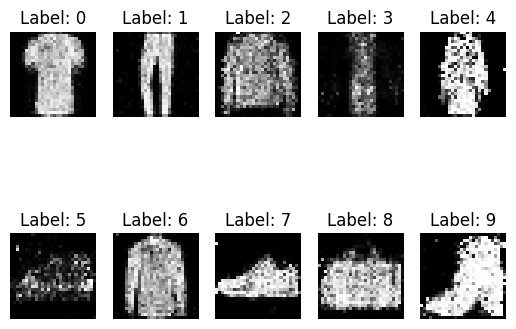

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 14801
4/4 [==============================] - 0s 3ms/step
Iteration : 14802
4/4 [==============================] - 0s 3ms/step
Iteration : 14803
4/4 [==============================] - 0s 3ms/step
Iteration : 14804
4/4 [==============================] - 0s 4ms/step
Iteration : 14805
4/4 [==============================] - 0s 3ms/step
Iteration : 14806
4/4 [==============================] - 0s 4ms/step
Iteration : 14807
4/4 [==============================] - 0s 3ms/step
Iteration : 14808
4/4 [==============================] - 0s 3ms/step
Iteration : 14809
4/4 [==============================] - 0s 3ms/step
Iteration : 14810
4/4 [==============================] - 0s 4ms/step
Iteration : 14811
4/4 [==============================] - 0s 5ms/step
Iteration : 14812
4/4 [==============================] - 0s 3ms/step
Iteration : 14813
4/4 [==============================] - 0s 4ms/step
Iterati

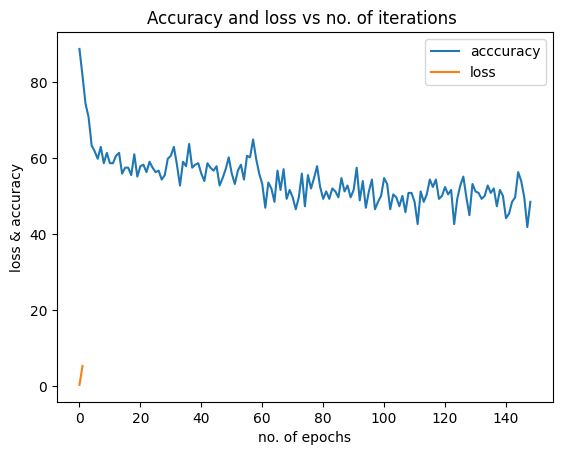

1/1 [==============================] - 0s 66ms/step


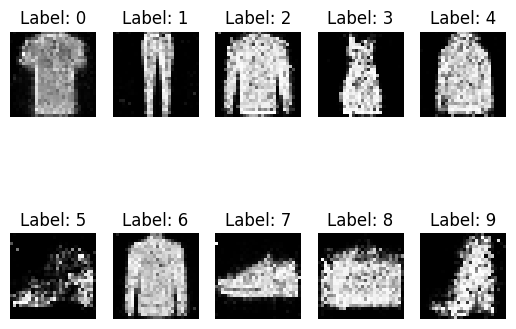

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 14901
4/4 [==============================] - 0s 4ms/step
Iteration : 14902
4/4 [==============================] - 0s 3ms/step
Iteration : 14903
4/4 [==============================] - 0s 3ms/step
Iteration : 14904
4/4 [==============================] - 0s 3ms/step
Iteration : 14905
4/4 [==============================] - 0s 3ms/step
Iteration : 14906
4/4 [==============================] - 0s 3ms/step
Iteration : 14907
4/4 [==============================] - 0s 4ms/step
Iteration : 14908
4/4 [==============================] - 0s 3ms/step
Iteration : 14909
4/4 [==============================] - 0s 3ms/step
Iteration : 14910
4/4 [==============================] - 0s 3ms/step
Iteration : 14911
4/4 [==============================] - 0s 3ms/step
Iteration : 14912
4/4 [==============================] - 0s 3ms/step
Iteration : 14913
4/4 [==============================] - 0s 4ms/step
Iterati

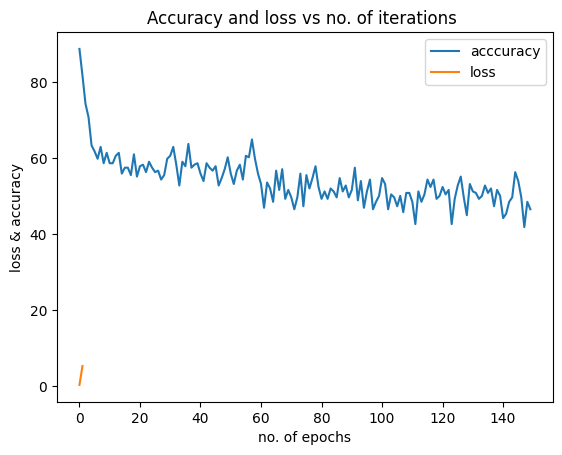

1/1 [==============================] - 0s 26ms/step


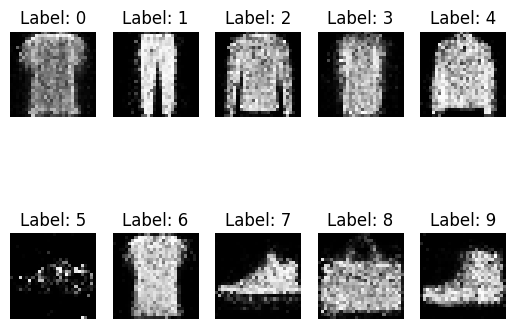

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 15001
4/4 [==============================] - 0s 3ms/step
Iteration : 15002
4/4 [==============================] - 0s 4ms/step
Iteration : 15003
4/4 [==============================] - 0s 3ms/step
Iteration : 15004
4/4 [==============================] - 0s 3ms/step
Iteration : 15005
4/4 [==============================] - 0s 3ms/step
Iteration : 15006
4/4 [==============================] - 0s 3ms/step
Iteration : 15007
4/4 [==============================] - 0s 3ms/step
Iteration : 15008
4/4 [==============================] - 0s 5ms/step
Iteration : 15009
4/4 [==============================] - 0s 3ms/step
Iteration : 15010
4/4 [==============================] - 0s 3ms/step
Iteration : 15011
4/4 [==============================] - 0s 4ms/step
Iteration : 15012
4/4 [==============================] - 0s 3ms/step
Iteration : 15013
4/4 [==============================] - 0s 3ms/step
Iterati

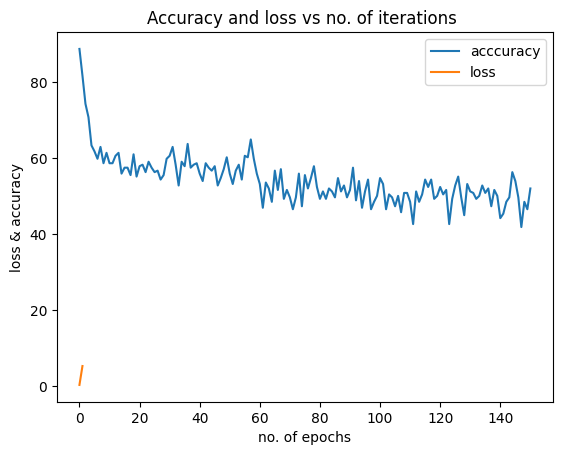

1/1 [==============================] - 0s 30ms/step


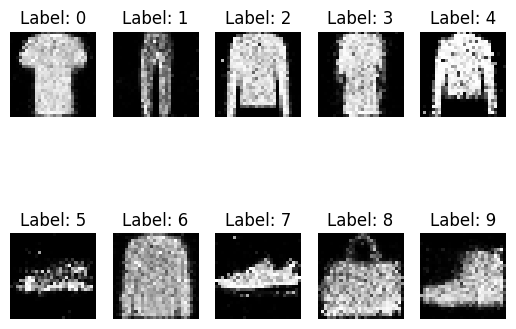

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 15101
4/4 [==============================] - 0s 4ms/step
Iteration : 15102
4/4 [==============================] - 0s 3ms/step
Iteration : 15103
4/4 [==============================] - 0s 3ms/step
Iteration : 15104
4/4 [==============================] - 0s 4ms/step
Iteration : 15105
4/4 [==============================] - 0s 3ms/step
Iteration : 15106
4/4 [==============================] - 0s 3ms/step
Iteration : 15107
4/4 [==============================] - 0s 3ms/step
Iteration : 15108
4/4 [==============================] - 0s 3ms/step
Iteration : 15109
4/4 [==============================] - 0s 4ms/step
Iteration : 15110
4/4 [==============================] - 0s 3ms/step
Iteration : 15111
4/4 [==============================] - 0s 3ms/step
Iteration : 15112
4/4 [==============================] - 0s 3ms/step
Iteration : 15113
4/4 [==============================] - 0s 3ms/step
Iterati

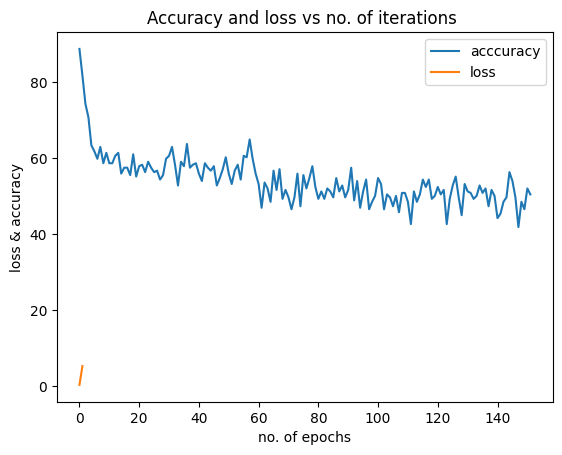

1/1 [==============================] - 0s 31ms/step


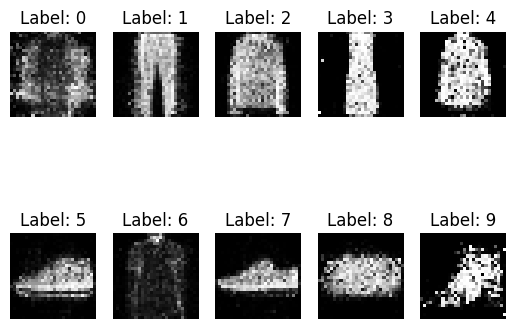

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 15201
4/4 [==============================] - 0s 4ms/step
Iteration : 15202
4/4 [==============================] - 0s 4ms/step
Iteration : 15203
4/4 [==============================] - 0s 4ms/step
Iteration : 15204
4/4 [==============================] - 0s 8ms/step
Iteration : 15205
4/4 [==============================] - 0s 5ms/step
Iteration : 15206
4/4 [==============================] - 0s 4ms/step
Iteration : 15207
4/4 [==============================] - 0s 3ms/step
Iteration : 15208
4/4 [==============================] - 0s 3ms/step
Iteration : 15209
4/4 [==============================] - 0s 4ms/step
Iteration : 15210
4/4 [==============================] - 0s 3ms/step
Iteration : 15211
4/4 [==============================] - 0s 3ms/step
Iteration : 15212
4/4 [==============================] - 0s 3ms/step
Iteration : 15213
4/4 [==============================] - 0s 3ms/step
Iterati

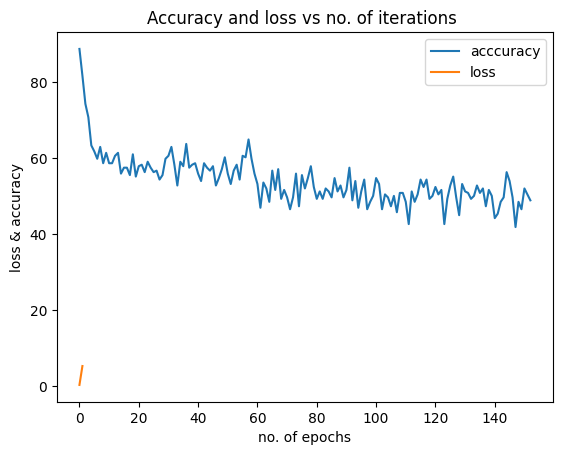

1/1 [==============================] - 0s 26ms/step


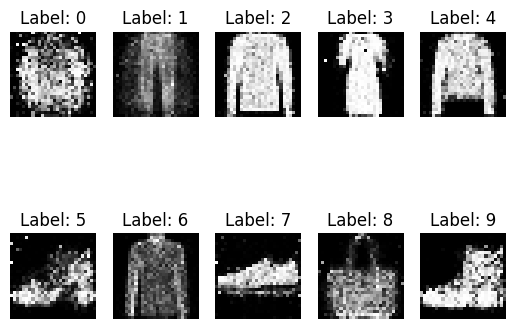

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 15301
4/4 [==============================] - 0s 4ms/step
Iteration : 15302
4/4 [==============================] - 0s 4ms/step
Iteration : 15303
4/4 [==============================] - 0s 3ms/step
Iteration : 15304
4/4 [==============================] - 0s 3ms/step
Iteration : 15305
4/4 [==============================] - 0s 3ms/step
Iteration : 15306
4/4 [==============================] - 0s 3ms/step
Iteration : 15307
4/4 [==============================] - 0s 3ms/step
Iteration : 15308
4/4 [==============================] - 0s 3ms/step
Iteration : 15309
4/4 [==============================] - 0s 3ms/step
Iteration : 15310
4/4 [==============================] - 0s 5ms/step
Iteration : 15311
4/4 [==============================] - 0s 3ms/step
Iteration : 15312
4/4 [==============================] - 0s 3ms/step
Iteration : 15313
4/4 [==============================] - 0s 4ms/step
Iterati

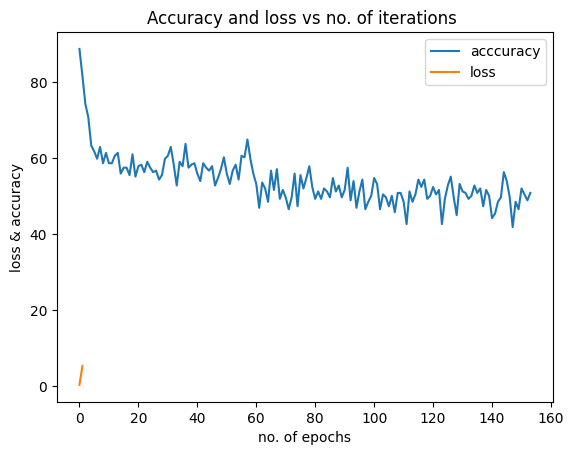

1/1 [==============================] - 0s 25ms/step


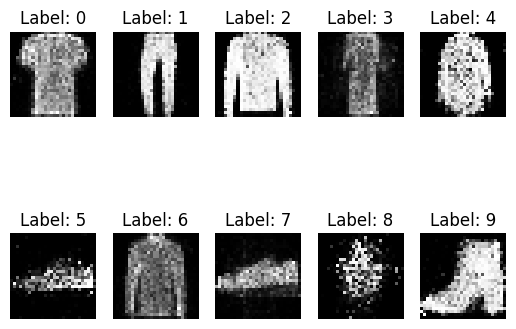

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 15401
4/4 [==============================] - 0s 3ms/step
Iteration : 15402
4/4 [==============================] - 0s 3ms/step
Iteration : 15403
4/4 [==============================] - 0s 3ms/step
Iteration : 15404
4/4 [==============================] - 0s 3ms/step
Iteration : 15405
4/4 [==============================] - 0s 3ms/step
Iteration : 15406
4/4 [==============================] - 0s 3ms/step
Iteration : 15407
4/4 [==============================] - 0s 3ms/step
Iteration : 15408
4/4 [==============================] - 0s 3ms/step
Iteration : 15409
4/4 [==============================] - 0s 3ms/step
Iteration : 15410
4/4 [==============================] - 0s 6ms/step
Iteration : 15411
4/4 [==============================] - 0s 2ms/step
Iteration : 15412
4/4 [==============================] - 0s 5ms/step
Iteration : 15413
4/4 [==============================] - 0s 3ms/step
Iterati

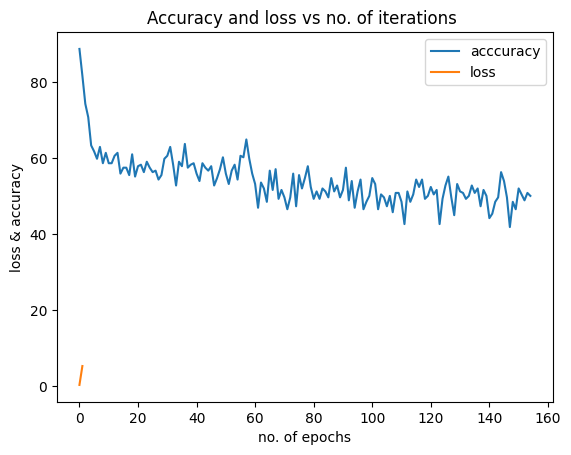

1/1 [==============================] - 0s 28ms/step


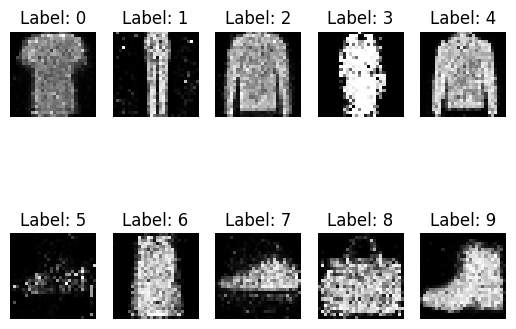

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 15501
4/4 [==============================] - 0s 3ms/step
Iteration : 15502
4/4 [==============================] - 0s 3ms/step
Iteration : 15503
4/4 [==============================] - 0s 3ms/step
Iteration : 15504
4/4 [==============================] - 0s 3ms/step
Iteration : 15505
4/4 [==============================] - 0s 3ms/step
Iteration : 15506
4/4 [==============================] - 0s 3ms/step
Iteration : 15507
4/4 [==============================] - 0s 4ms/step
Iteration : 15508
4/4 [==============================] - 0s 5ms/step
Iteration : 15509
4/4 [==============================] - 0s 4ms/step
Iteration : 15510
4/4 [==============================] - 0s 3ms/step
Iteration : 15511
4/4 [==============================] - 0s 4ms/step
Iteration : 15512
4/4 [==============================] - 0s 5ms/step
Iteration : 15513
4/4 [==============================] - 0s 5ms/step
Iterati

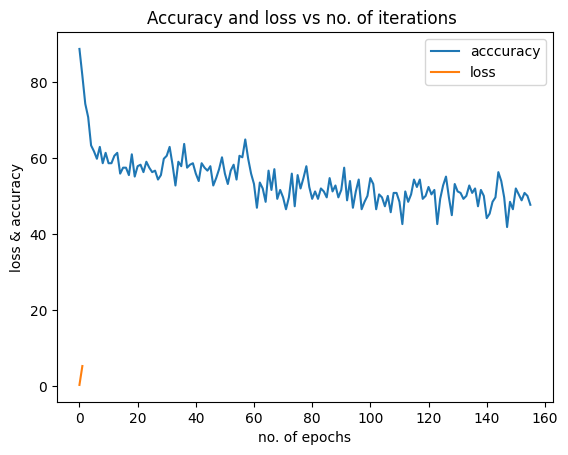

1/1 [==============================] - 0s 32ms/step


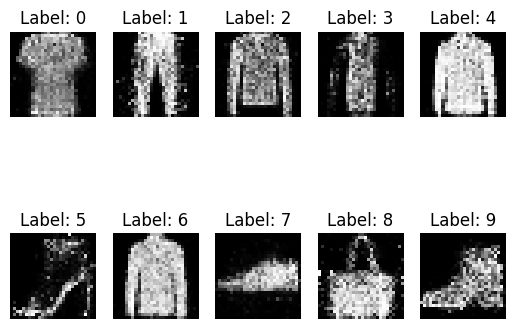

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 15601
4/4 [==============================] - 0s 3ms/step
Iteration : 15602
4/4 [==============================] - 0s 3ms/step
Iteration : 15603
4/4 [==============================] - 0s 3ms/step
Iteration : 15604
4/4 [==============================] - 0s 3ms/step
Iteration : 15605
4/4 [==============================] - 0s 3ms/step
Iteration : 15606
4/4 [==============================] - 0s 4ms/step
Iteration : 15607
4/4 [==============================] - 0s 3ms/step
Iteration : 15608
4/4 [==============================] - 0s 3ms/step
Iteration : 15609
4/4 [==============================] - 0s 4ms/step
Iteration : 15610
4/4 [==============================] - 0s 4ms/step
Iteration : 15611
4/4 [==============================] - 0s 3ms/step
Iteration : 15612
4/4 [==============================] - 0s 3ms/step
Iteration : 15613
4/4 [==============================] - 0s 3ms/step
Iterati

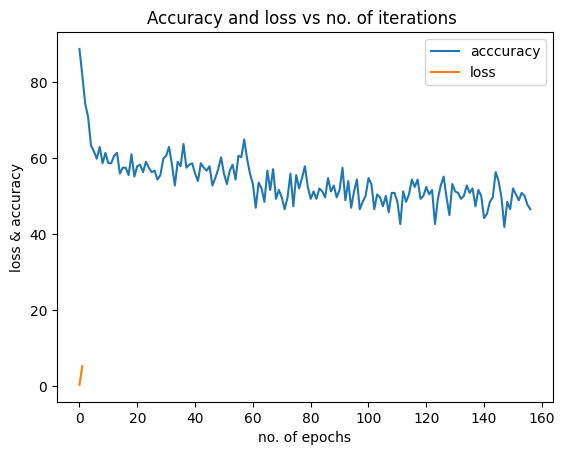

1/1 [==============================] - 0s 27ms/step


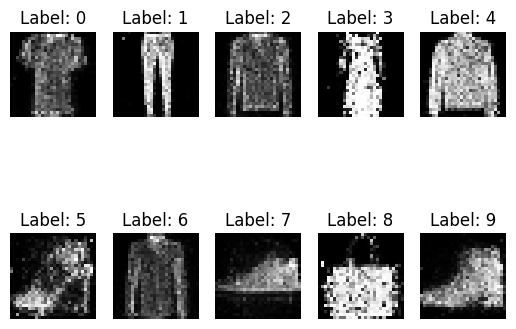

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 15701
4/4 [==============================] - 0s 3ms/step
Iteration : 15702
4/4 [==============================] - 0s 3ms/step
Iteration : 15703
4/4 [==============================] - 0s 4ms/step
Iteration : 15704
4/4 [==============================] - 0s 3ms/step
Iteration : 15705
4/4 [==============================] - 0s 3ms/step
Iteration : 15706
4/4 [==============================] - 0s 4ms/step
Iteration : 15707
4/4 [==============================] - 0s 3ms/step
Iteration : 15708
4/4 [==============================] - 0s 3ms/step
Iteration : 15709
4/4 [==============================] - 0s 3ms/step
Iteration : 15710
4/4 [==============================] - 0s 3ms/step
Iteration : 15711
4/4 [==============================] - 0s 3ms/step
Iteration : 15712
4/4 [==============================] - 0s 3ms/step
Iteration : 15713
4/4 [==============================] - 0s 3ms/step
Iterati

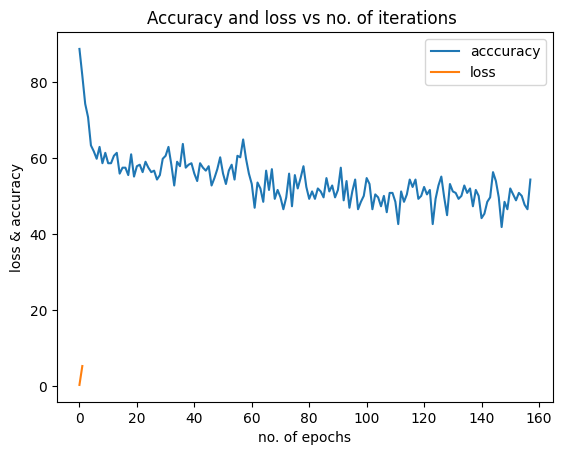

1/1 [==============================] - 0s 27ms/step


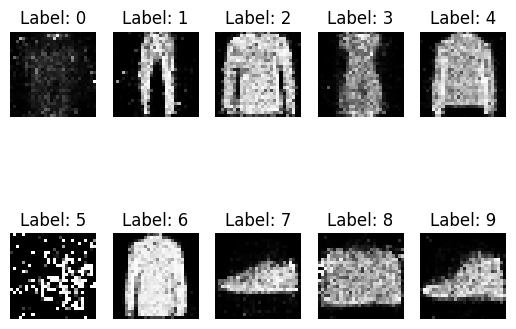

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 15801
4/4 [==============================] - 0s 3ms/step
Iteration : 15802
4/4 [==============================] - 0s 3ms/step
Iteration : 15803
4/4 [==============================] - 0s 4ms/step
Iteration : 15804
4/4 [==============================] - 0s 6ms/step
Iteration : 15805
4/4 [==============================] - 0s 4ms/step
Iteration : 15806
4/4 [==============================] - 0s 3ms/step
Iteration : 15807
4/4 [==============================] - 0s 4ms/step
Iteration : 15808
4/4 [==============================] - 0s 4ms/step
Iteration : 15809
4/4 [==============================] - 0s 3ms/step
Iteration : 15810
4/4 [==============================] - 0s 4ms/step
Iteration : 15811
4/4 [==============================] - 0s 4ms/step
Iteration : 15812
4/4 [==============================] - 0s 4ms/step
Iteration : 15813
4/4 [==============================] - 0s 3ms/step
Iterati

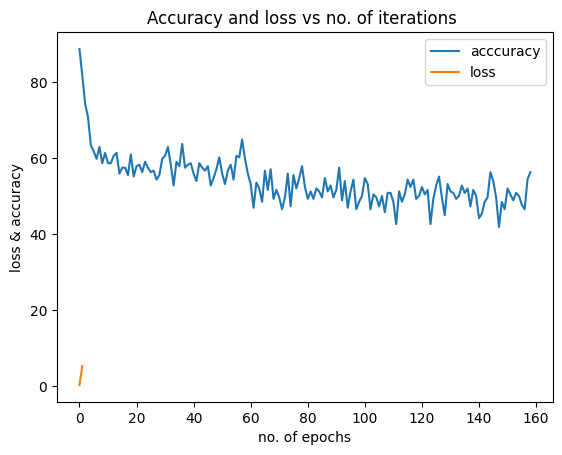

1/1 [==============================] - 0s 44ms/step


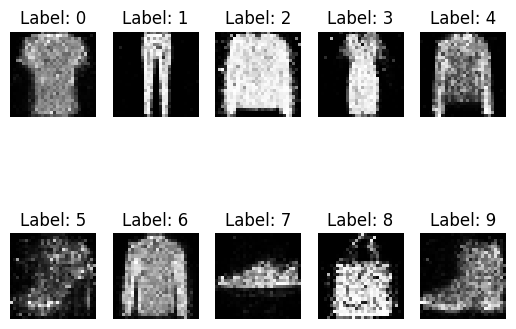

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 15901
4/4 [==============================] - 0s 5ms/step
Iteration : 15902
4/4 [==============================] - 0s 3ms/step
Iteration : 15903
4/4 [==============================] - 0s 3ms/step
Iteration : 15904
4/4 [==============================] - 0s 2ms/step
Iteration : 15905
4/4 [==============================] - 0s 4ms/step
Iteration : 15906
4/4 [==============================] - 0s 6ms/step
Iteration : 15907
4/4 [==============================] - 0s 5ms/step
Iteration : 15908
4/4 [==============================] - 0s 4ms/step
Iteration : 15909
4/4 [==============================] - 0s 5ms/step
Iteration : 15910
4/4 [==============================] - 0s 4ms/step
Iteration : 15911
4/4 [==============================] - 0s 5ms/step
Iteration : 15912
4/4 [==============================] - 0s 3ms/step
Iteration : 15913
4/4 [==============================] - 0s 5ms/step
Iterati

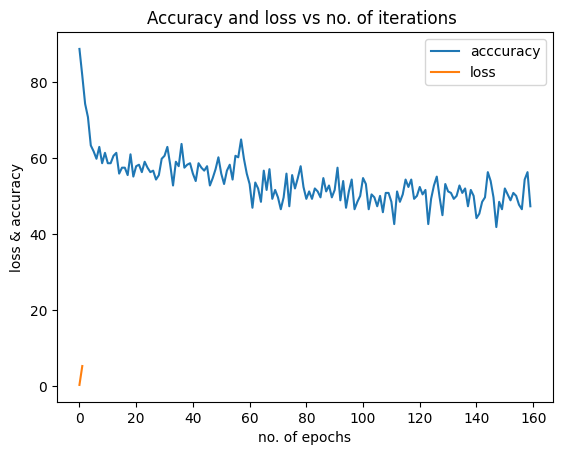

1/1 [==============================] - 0s 33ms/step


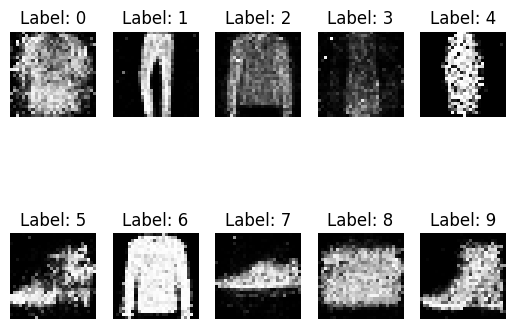

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 16001
4/4 [==============================] - 0s 3ms/step
Iteration : 16002
4/4 [==============================] - 0s 3ms/step
Iteration : 16003
4/4 [==============================] - 0s 3ms/step
Iteration : 16004
4/4 [==============================] - 0s 3ms/step
Iteration : 16005
4/4 [==============================] - 0s 3ms/step
Iteration : 16006
4/4 [==============================] - 0s 3ms/step
Iteration : 16007
4/4 [==============================] - 0s 3ms/step
Iteration : 16008
4/4 [==============================] - 0s 3ms/step
Iteration : 16009
4/4 [==============================] - 0s 4ms/step
Iteration : 16010
4/4 [==============================] - 0s 3ms/step
Iteration : 16011
4/4 [==============================] - 0s 3ms/step
Iteration : 16012
4/4 [==============================] - 0s 4ms/step
Iteration : 16013
4/4 [==============================] - 0s 3ms/step
Iterati

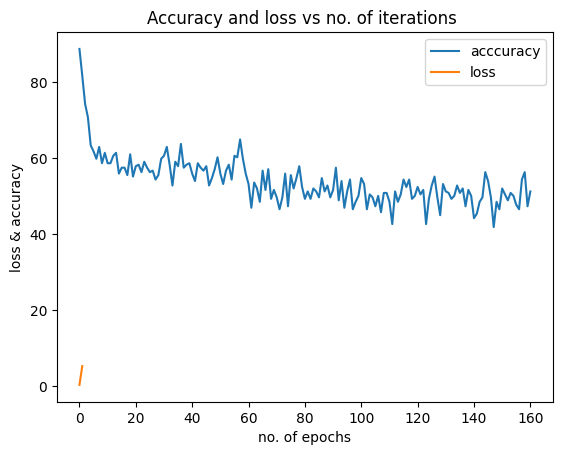

1/1 [==============================] - 0s 26ms/step


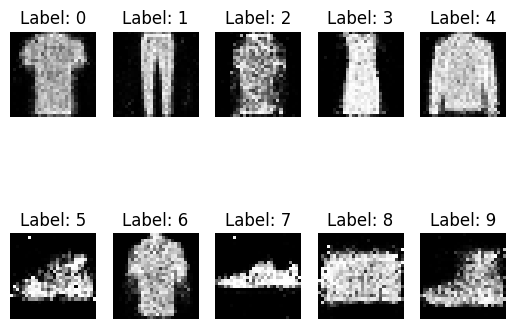

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 16101
4/4 [==============================] - 0s 3ms/step
Iteration : 16102
4/4 [==============================] - 0s 3ms/step
Iteration : 16103
4/4 [==============================] - 0s 3ms/step
Iteration : 16104
4/4 [==============================] - 0s 3ms/step
Iteration : 16105
4/4 [==============================] - 0s 3ms/step
Iteration : 16106
4/4 [==============================] - 0s 4ms/step
Iteration : 16107
4/4 [==============================] - 0s 3ms/step
Iteration : 16108
4/4 [==============================] - 0s 3ms/step
Iteration : 16109
4/4 [==============================] - 0s 4ms/step
Iteration : 16110
4/4 [==============================] - 0s 3ms/step
Iteration : 16111
4/4 [==============================] - 0s 3ms/step
Iteration : 16112
4/4 [==============================] - 0s 3ms/step
Iteration : 16113
4/4 [==============================] - 0s 4ms/step
Iterati

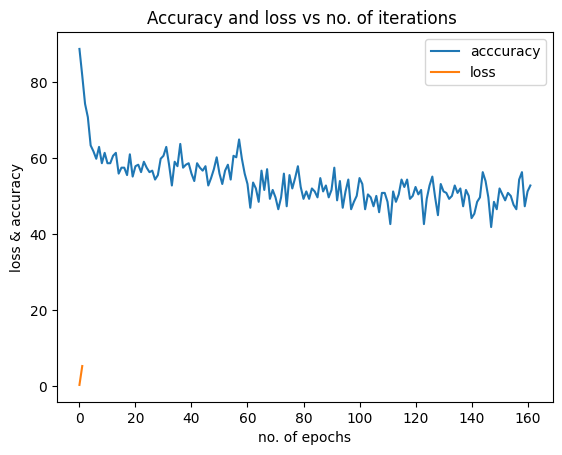

1/1 [==============================] - 0s 26ms/step


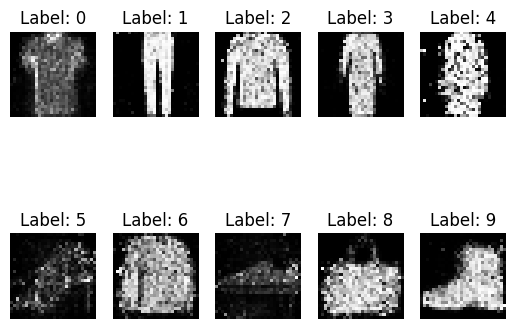

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 16201
4/4 [==============================] - 0s 4ms/step
Iteration : 16202
4/4 [==============================] - 0s 4ms/step
Iteration : 16203
4/4 [==============================] - 0s 3ms/step
Iteration : 16204
4/4 [==============================] - 0s 3ms/step
Iteration : 16205
4/4 [==============================] - 0s 3ms/step
Iteration : 16206
4/4 [==============================] - 0s 3ms/step
Iteration : 16207
4/4 [==============================] - 0s 6ms/step
Iteration : 16208
4/4 [==============================] - 0s 3ms/step
Iteration : 16209
4/4 [==============================] - 0s 5ms/step
Iteration : 16210
4/4 [==============================] - 0s 4ms/step
Iteration : 16211
4/4 [==============================] - 0s 4ms/step
Iteration : 16212
4/4 [==============================] - 0s 3ms/step
Iteration : 16213
4/4 [==============================] - 0s 3ms/step
Iterati

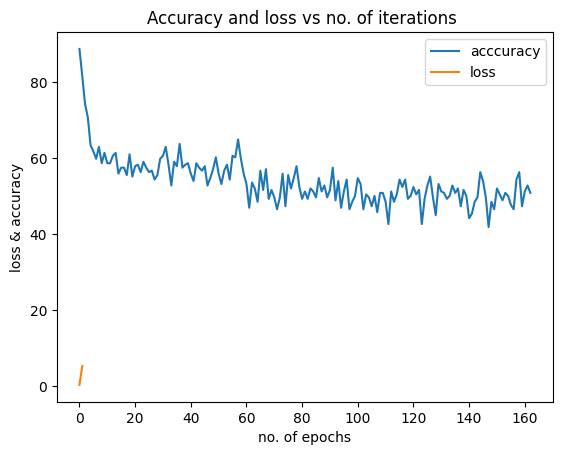

1/1 [==============================] - 0s 54ms/step


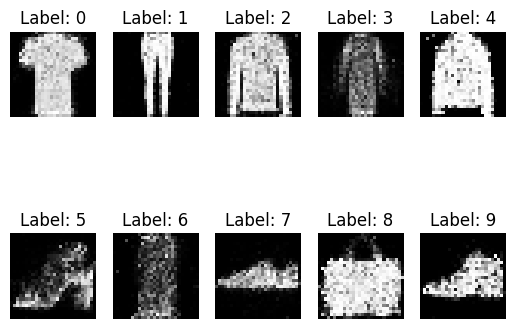

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 16301
4/4 [==============================] - 0s 3ms/step
Iteration : 16302
4/4 [==============================] - 0s 3ms/step
Iteration : 16303
4/4 [==============================] - 0s 4ms/step
Iteration : 16304
4/4 [==============================] - 0s 3ms/step
Iteration : 16305
4/4 [==============================] - 0s 3ms/step
Iteration : 16306
4/4 [==============================] - 0s 3ms/step
Iteration : 16307
4/4 [==============================] - 0s 3ms/step
Iteration : 16308
4/4 [==============================] - 0s 5ms/step
Iteration : 16309
4/4 [==============================] - 0s 3ms/step
Iteration : 16310
4/4 [==============================] - 0s 5ms/step
Iteration : 16311
4/4 [==============================] - 0s 3ms/step
Iteration : 16312
4/4 [==============================] - 0s 3ms/step
Iteration : 16313
4/4 [==============================] - 0s 3ms/step
Iterati

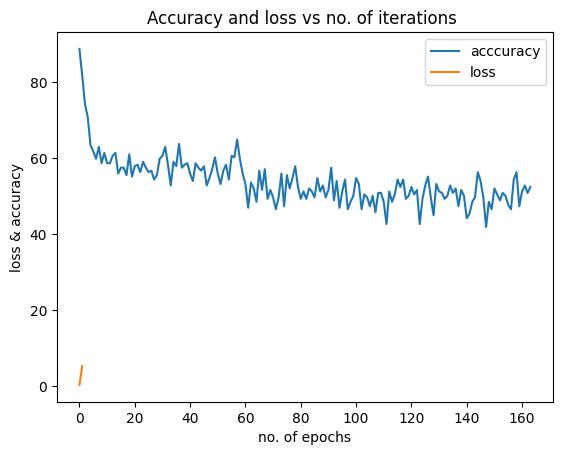

1/1 [==============================] - 0s 27ms/step


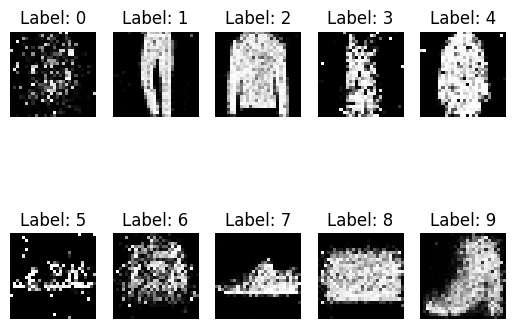

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 16401
4/4 [==============================] - 0s 3ms/step
Iteration : 16402
4/4 [==============================] - 0s 3ms/step
Iteration : 16403
4/4 [==============================] - 0s 3ms/step
Iteration : 16404
4/4 [==============================] - 0s 3ms/step
Iteration : 16405
4/4 [==============================] - 0s 3ms/step
Iteration : 16406
4/4 [==============================] - 0s 3ms/step
Iteration : 16407
4/4 [==============================] - 0s 4ms/step
Iteration : 16408
4/4 [==============================] - 0s 5ms/step
Iteration : 16409
4/4 [==============================] - 0s 3ms/step
Iteration : 16410
4/4 [==============================] - 0s 3ms/step
Iteration : 16411
4/4 [==============================] - 0s 3ms/step
Iteration : 16412
4/4 [==============================] - 0s 3ms/step
Iteration : 16413
4/4 [==============================] - 0s 3ms/step
Iterati

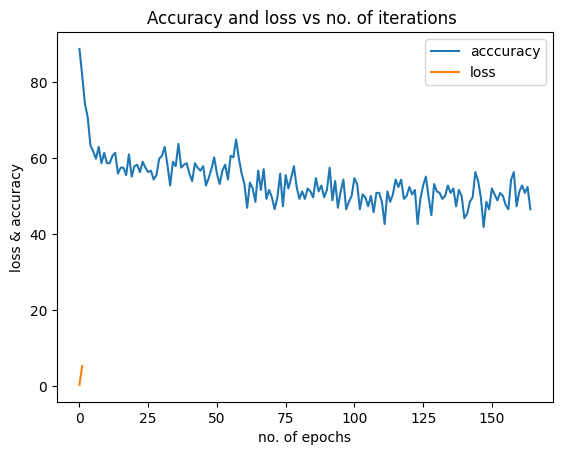

1/1 [==============================] - 0s 30ms/step


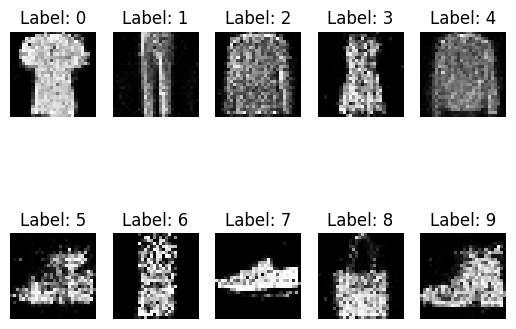

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 16501
4/4 [==============================] - 0s 4ms/step
Iteration : 16502
4/4 [==============================] - 0s 3ms/step
Iteration : 16503
4/4 [==============================] - 0s 3ms/step
Iteration : 16504
4/4 [==============================] - 0s 4ms/step
Iteration : 16505
4/4 [==============================] - 0s 3ms/step
Iteration : 16506
4/4 [==============================] - 0s 3ms/step
Iteration : 16507
4/4 [==============================] - 0s 3ms/step
Iteration : 16508
4/4 [==============================] - 0s 4ms/step
Iteration : 16509
4/4 [==============================] - 0s 4ms/step
Iteration : 16510
4/4 [==============================] - 0s 3ms/step
Iteration : 16511
4/4 [==============================] - 0s 3ms/step
Iteration : 16512
4/4 [==============================] - 0s 5ms/step
Iteration : 16513
4/4 [==============================] - 0s 7ms/step
Iterati

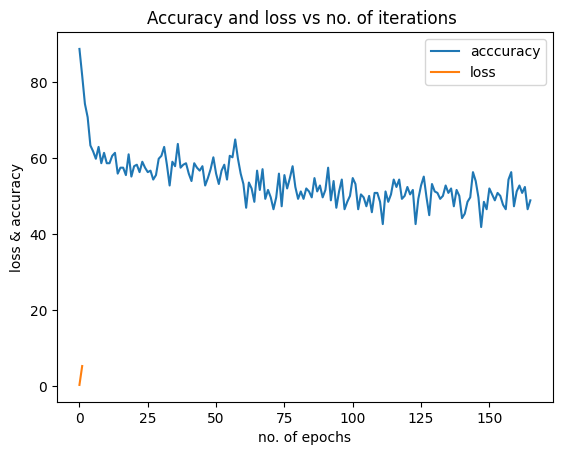

1/1 [==============================] - 0s 34ms/step


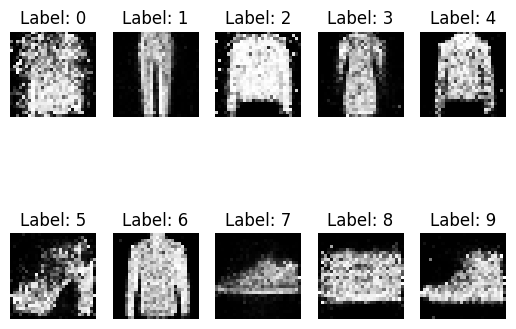

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 16601
4/4 [==============================] - 0s 4ms/step
Iteration : 16602
4/4 [==============================] - 0s 6ms/step
Iteration : 16603
4/4 [==============================] - 0s 3ms/step
Iteration : 16604
4/4 [==============================] - 0s 3ms/step
Iteration : 16605
4/4 [==============================] - 0s 3ms/step
Iteration : 16606
4/4 [==============================] - 0s 3ms/step
Iteration : 16607
4/4 [==============================] - 0s 4ms/step
Iteration : 16608
4/4 [==============================] - 0s 5ms/step
Iteration : 16609
4/4 [==============================] - 0s 4ms/step
Iteration : 16610
4/4 [==============================] - 0s 4ms/step
Iteration : 16611
4/4 [==============================] - 0s 3ms/step
Iteration : 16612
4/4 [==============================] - 0s 4ms/step
Iteration : 16613
4/4 [==============================] - 0s 4ms/step
Iterati

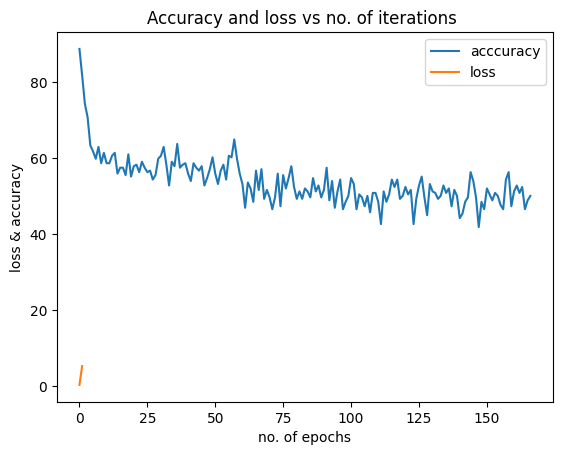

1/1 [==============================] - 0s 30ms/step


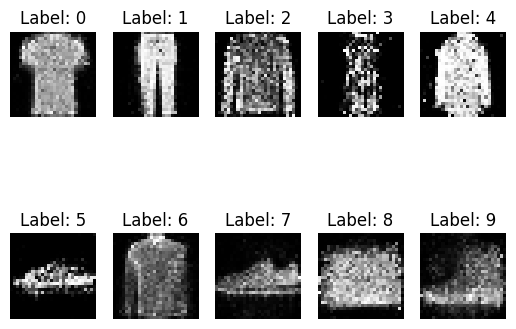

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 16701
4/4 [==============================] - 0s 4ms/step
Iteration : 16702
4/4 [==============================] - 0s 6ms/step
Iteration : 16703
4/4 [==============================] - 0s 3ms/step
Iteration : 16704
4/4 [==============================] - 0s 3ms/step
Iteration : 16705
4/4 [==============================] - 0s 4ms/step
Iteration : 16706
4/4 [==============================] - 0s 3ms/step
Iteration : 16707
4/4 [==============================] - 0s 4ms/step
Iteration : 16708
4/4 [==============================] - 0s 3ms/step
Iteration : 16709
4/4 [==============================] - 0s 3ms/step
Iteration : 16710
4/4 [==============================] - 0s 3ms/step
Iteration : 16711
4/4 [==============================] - 0s 3ms/step
Iteration : 16712
4/4 [==============================] - 0s 3ms/step
Iteration : 16713
4/4 [==============================] - 0s 3ms/step
Iterati

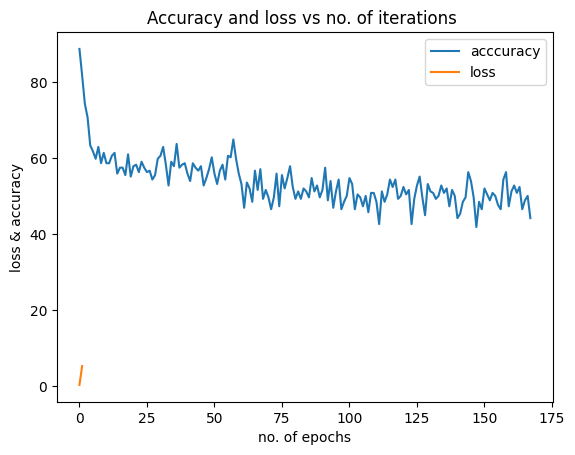

1/1 [==============================] - 0s 29ms/step


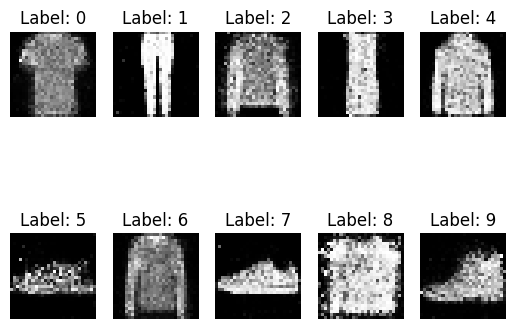

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 16801
4/4 [==============================] - 0s 3ms/step
Iteration : 16802
4/4 [==============================] - 0s 3ms/step
Iteration : 16803
4/4 [==============================] - 0s 3ms/step
Iteration : 16804
4/4 [==============================] - 0s 3ms/step
Iteration : 16805
4/4 [==============================] - 0s 3ms/step
Iteration : 16806
4/4 [==============================] - 0s 3ms/step
Iteration : 16807
4/4 [==============================] - 0s 3ms/step
Iteration : 16808
4/4 [==============================] - 0s 4ms/step
Iteration : 16809
4/4 [==============================] - 0s 3ms/step
Iteration : 16810
4/4 [==============================] - 0s 3ms/step
Iteration : 16811
4/4 [==============================] - 0s 3ms/step
Iteration : 16812
4/4 [==============================] - 0s 4ms/step
Iteration : 16813
4/4 [==============================] - 0s 3ms/step
Iterati

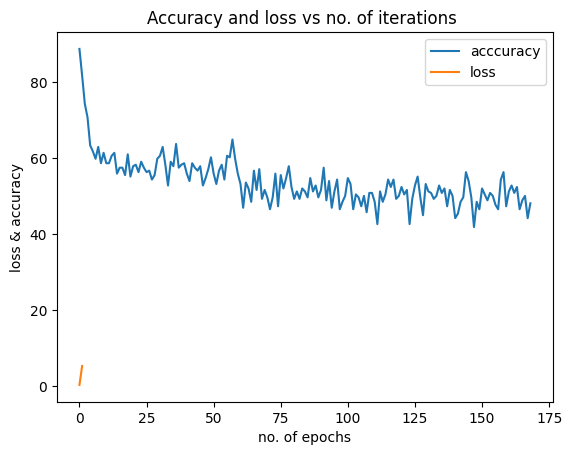

1/1 [==============================] - 0s 63ms/step


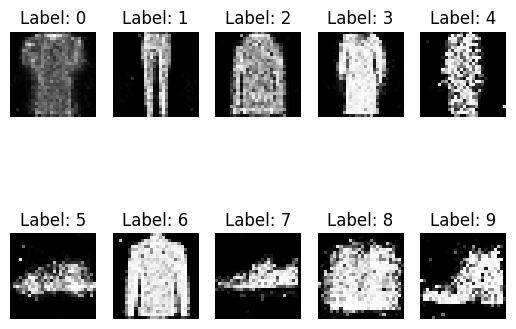

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 16901
4/4 [==============================] - 0s 3ms/step
Iteration : 16902
4/4 [==============================] - 0s 4ms/step
Iteration : 16903
4/4 [==============================] - 0s 4ms/step
Iteration : 16904
4/4 [==============================] - 0s 3ms/step
Iteration : 16905
4/4 [==============================] - 0s 3ms/step
Iteration : 16906
4/4 [==============================] - 0s 5ms/step
Iteration : 16907
4/4 [==============================] - 0s 3ms/step
Iteration : 16908
4/4 [==============================] - 0s 4ms/step
Iteration : 16909
4/4 [==============================] - 0s 3ms/step
Iteration : 16910
4/4 [==============================] - 0s 3ms/step
Iteration : 16911
4/4 [==============================] - 0s 3ms/step
Iteration : 16912
4/4 [==============================] - 0s 4ms/step
Iteration : 16913
4/4 [==============================] - 0s 4ms/step
Iterati

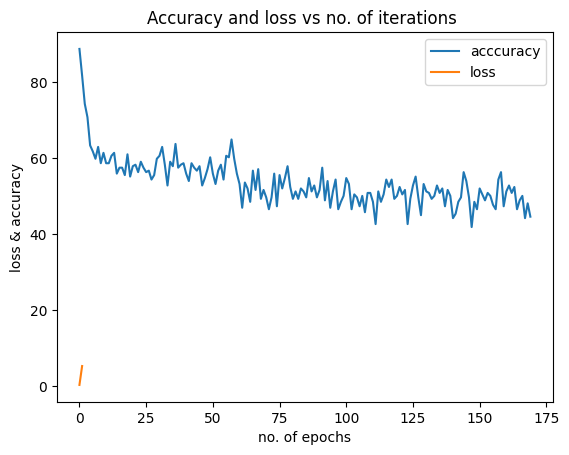

1/1 [==============================] - 0s 30ms/step


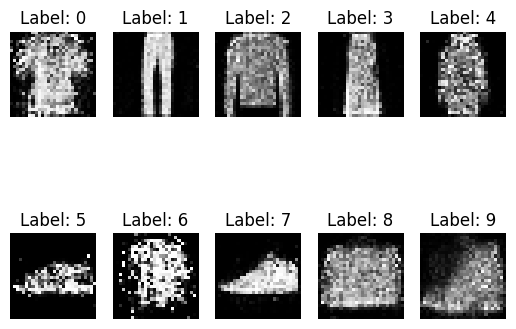

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 17001
4/4 [==============================] - 0s 3ms/step
Iteration : 17002
4/4 [==============================] - 0s 3ms/step
Iteration : 17003
4/4 [==============================] - 0s 5ms/step
Iteration : 17004
4/4 [==============================] - 0s 3ms/step
Iteration : 17005
4/4 [==============================] - 0s 3ms/step
Iteration : 17006
4/4 [==============================] - 0s 3ms/step
Iteration : 17007
4/4 [==============================] - 0s 4ms/step
Iteration : 17008
4/4 [==============================] - 0s 3ms/step
Iteration : 17009
4/4 [==============================] - 0s 3ms/step
Iteration : 17010
4/4 [==============================] - 0s 3ms/step
Iteration : 17011
4/4 [==============================] - 0s 3ms/step
Iteration : 17012
4/4 [==============================] - 0s 3ms/step
Iteration : 17013
4/4 [==============================] - 0s 3ms/step
Iterati

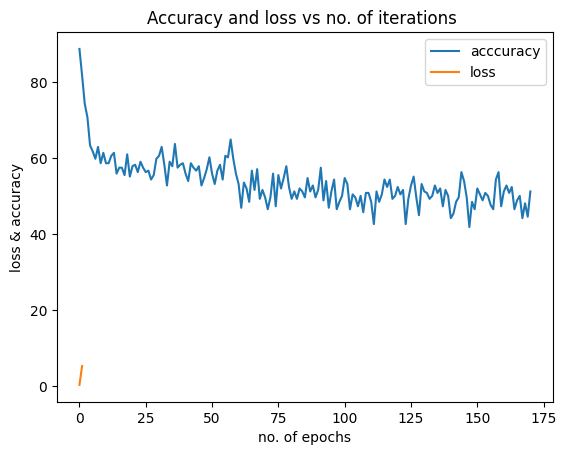

1/1 [==============================] - 0s 26ms/step


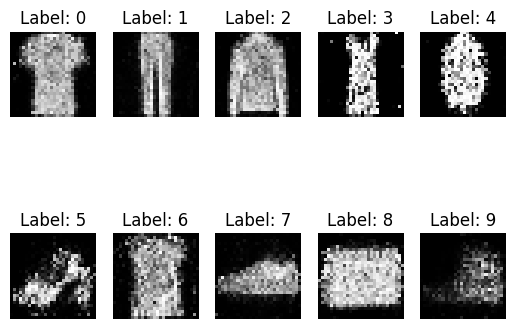

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 17101
4/4 [==============================] - 0s 3ms/step
Iteration : 17102
4/4 [==============================] - 0s 4ms/step
Iteration : 17103
4/4 [==============================] - 0s 4ms/step
Iteration : 17104
4/4 [==============================] - 0s 3ms/step
Iteration : 17105
4/4 [==============================] - 0s 3ms/step
Iteration : 17106
4/4 [==============================] - 0s 3ms/step
Iteration : 17107
4/4 [==============================] - 0s 3ms/step
Iteration : 17108
4/4 [==============================] - 0s 3ms/step
Iteration : 17109
4/4 [==============================] - 0s 3ms/step
Iteration : 17110
4/4 [==============================] - 0s 5ms/step
Iteration : 17111
4/4 [==============================] - 0s 4ms/step
Iteration : 17112
4/4 [==============================] - 0s 3ms/step
Iteration : 17113
4/4 [==============================] - 0s 4ms/step
Iterati

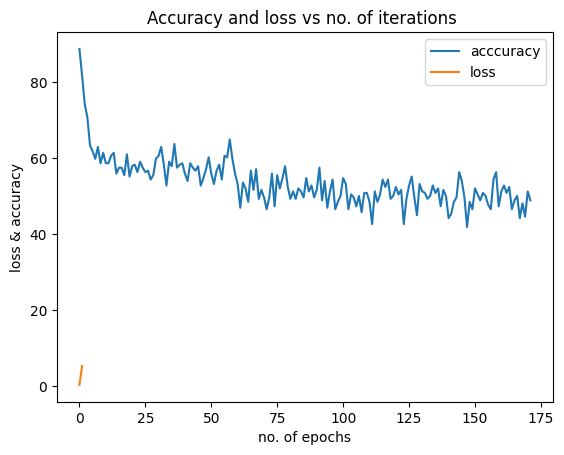

1/1 [==============================] - 0s 28ms/step


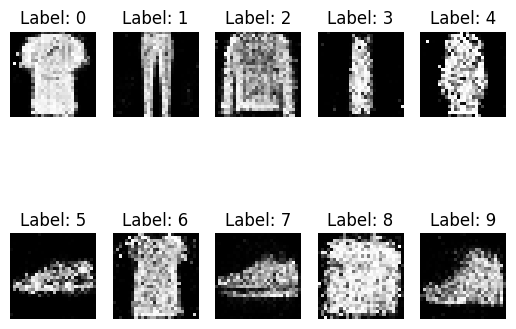

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 17201
4/4 [==============================] - 0s 3ms/step
Iteration : 17202
4/4 [==============================] - 0s 3ms/step
Iteration : 17203
4/4 [==============================] - 0s 3ms/step
Iteration : 17204
4/4 [==============================] - 0s 3ms/step
Iteration : 17205
4/4 [==============================] - 0s 3ms/step
Iteration : 17206
4/4 [==============================] - 0s 3ms/step
Iteration : 17207
4/4 [==============================] - 0s 3ms/step
Iteration : 17208
4/4 [==============================] - 0s 3ms/step
Iteration : 17209
4/4 [==============================] - 0s 4ms/step
Iteration : 17210
4/4 [==============================] - 0s 4ms/step
Iteration : 17211
4/4 [==============================] - 0s 4ms/step
Iteration : 17212
4/4 [==============================] - 0s 3ms/step
Iteration : 17213
4/4 [==============================] - 0s 3ms/step
Iterati

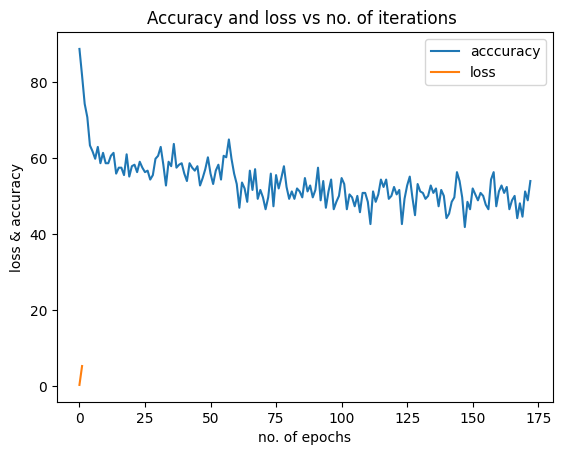

1/1 [==============================] - 0s 30ms/step


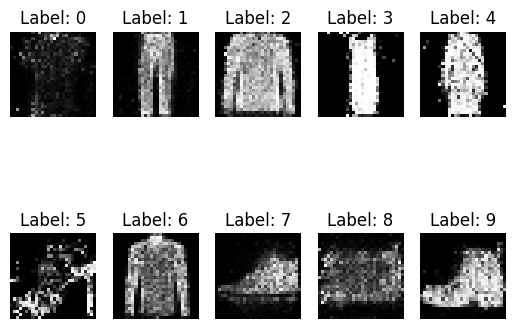

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 17301
4/4 [==============================] - 0s 4ms/step
Iteration : 17302
4/4 [==============================] - 0s 3ms/step
Iteration : 17303
4/4 [==============================] - 0s 4ms/step
Iteration : 17304
4/4 [==============================] - 0s 4ms/step
Iteration : 17305
4/4 [==============================] - 0s 3ms/step
Iteration : 17306
4/4 [==============================] - 0s 5ms/step
Iteration : 17307
4/4 [==============================] - 0s 5ms/step
Iteration : 17308
4/4 [==============================] - 0s 4ms/step
Iteration : 17309
4/4 [==============================] - 0s 4ms/step
Iteration : 17310
4/4 [==============================] - 0s 4ms/step
Iteration : 17311
4/4 [==============================] - 0s 5ms/step
Iteration : 17312
4/4 [==============================] - 0s 3ms/step
Iteration : 17313
4/4 [==============================] - 0s 2ms/step
Iterati

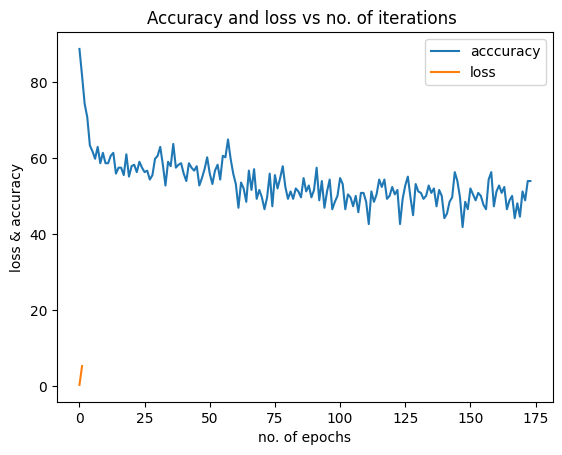

1/1 [==============================] - 0s 32ms/step


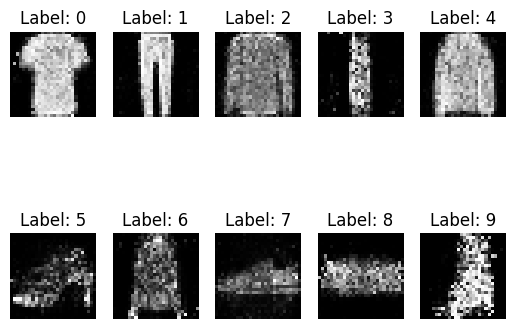

The model structure and weights were saved. 
4/4 [==============================] - 0s 5ms/step
Iteration : 17401
4/4 [==============================] - 0s 4ms/step
Iteration : 17402
4/4 [==============================] - 0s 3ms/step
Iteration : 17403
4/4 [==============================] - 0s 3ms/step
Iteration : 17404
4/4 [==============================] - 0s 3ms/step
Iteration : 17405
4/4 [==============================] - 0s 3ms/step
Iteration : 17406
4/4 [==============================] - 0s 3ms/step
Iteration : 17407
4/4 [==============================] - 0s 3ms/step
Iteration : 17408
4/4 [==============================] - 0s 3ms/step
Iteration : 17409
4/4 [==============================] - 0s 3ms/step
Iteration : 17410
4/4 [==============================] - 0s 3ms/step
Iteration : 17411
4/4 [==============================] - 0s 3ms/step
Iteration : 17412
4/4 [==============================] - 0s 3ms/step
Iteration : 17413
4/4 [==============================] - 0s 4ms/step
Iterati

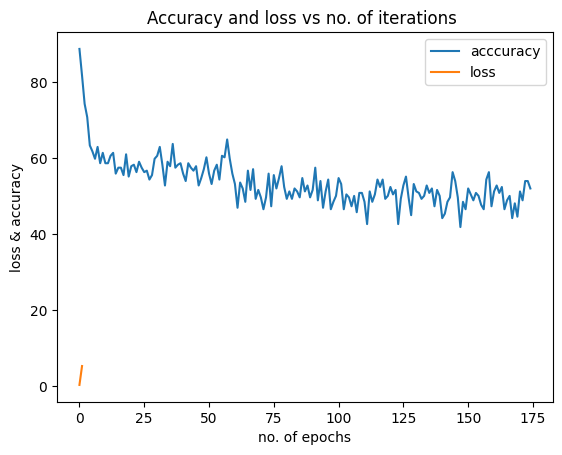

1/1 [==============================] - 0s 30ms/step


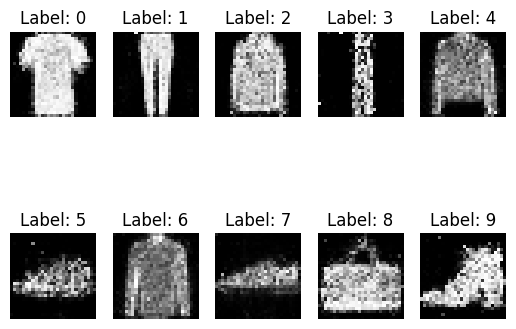

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 17501
4/4 [==============================] - 0s 3ms/step
Iteration : 17502
4/4 [==============================] - 0s 4ms/step
Iteration : 17503
4/4 [==============================] - 0s 3ms/step
Iteration : 17504
4/4 [==============================] - 0s 3ms/step
Iteration : 17505
4/4 [==============================] - 0s 3ms/step
Iteration : 17506
4/4 [==============================] - 0s 4ms/step
Iteration : 17507
4/4 [==============================] - 0s 3ms/step
Iteration : 17508
4/4 [==============================] - 0s 4ms/step
Iteration : 17509
4/4 [==============================] - 0s 3ms/step
Iteration : 17510
4/4 [==============================] - 0s 3ms/step
Iteration : 17511
4/4 [==============================] - 0s 3ms/step
Iteration : 17512
4/4 [==============================] - 0s 3ms/step
Iteration : 17513
4/4 [==============================] - 0s 3ms/step
Iterati

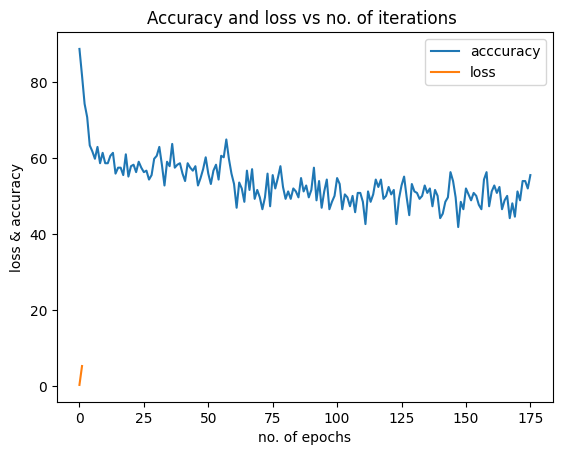

1/1 [==============================] - 0s 28ms/step


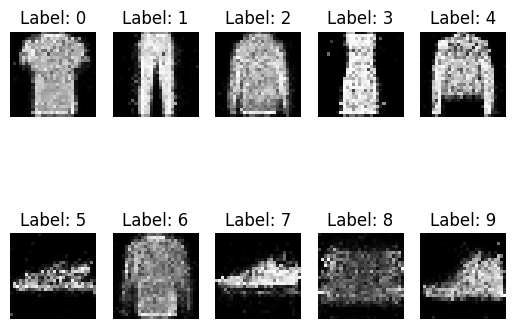

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 17601
4/4 [==============================] - 0s 5ms/step
Iteration : 17602
4/4 [==============================] - 0s 5ms/step
Iteration : 17603
4/4 [==============================] - 0s 4ms/step
Iteration : 17604
4/4 [==============================] - 0s 5ms/step
Iteration : 17605
4/4 [==============================] - 0s 2ms/step
Iteration : 17606
4/4 [==============================] - 0s 3ms/step
Iteration : 17607
4/4 [==============================] - 0s 6ms/step
Iteration : 17608
4/4 [==============================] - 0s 5ms/step
Iteration : 17609
4/4 [==============================] - 0s 5ms/step
Iteration : 17610
4/4 [==============================] - 0s 3ms/step
Iteration : 17611
4/4 [==============================] - 0s 4ms/step
Iteration : 17612
4/4 [==============================] - 0s 3ms/step
Iteration : 17613
4/4 [==============================] - 0s 3ms/step
Iterati

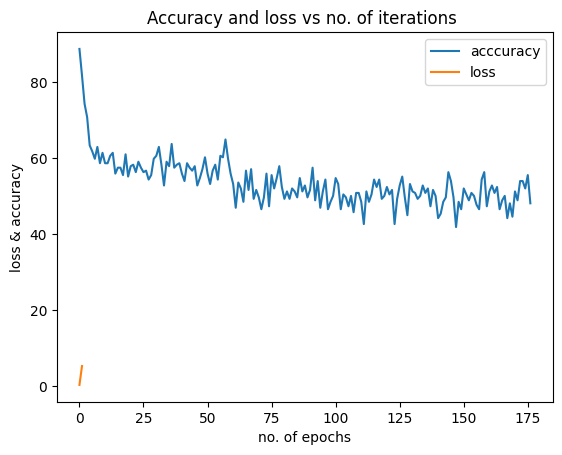

1/1 [==============================] - 0s 26ms/step


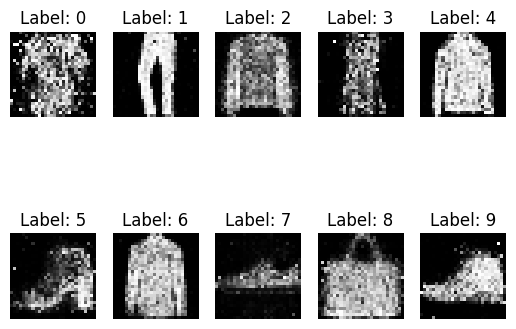

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 17701
4/4 [==============================] - 0s 3ms/step
Iteration : 17702
4/4 [==============================] - 0s 4ms/step
Iteration : 17703
4/4 [==============================] - 0s 4ms/step
Iteration : 17704
4/4 [==============================] - 0s 3ms/step
Iteration : 17705
4/4 [==============================] - 0s 3ms/step
Iteration : 17706
4/4 [==============================] - 0s 3ms/step
Iteration : 17707
4/4 [==============================] - 0s 3ms/step
Iteration : 17708
4/4 [==============================] - 0s 3ms/step
Iteration : 17709
4/4 [==============================] - 0s 3ms/step
Iteration : 17710
4/4 [==============================] - 0s 3ms/step
Iteration : 17711
4/4 [==============================] - 0s 3ms/step
Iteration : 17712
4/4 [==============================] - 0s 3ms/step
Iteration : 17713
4/4 [==============================] - 0s 4ms/step
Iterati

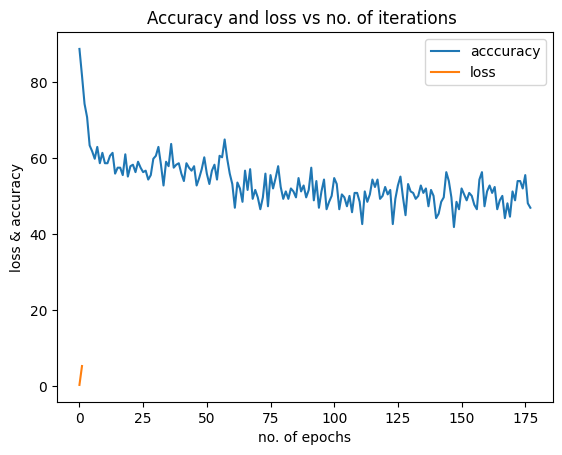

1/1 [==============================] - 0s 26ms/step


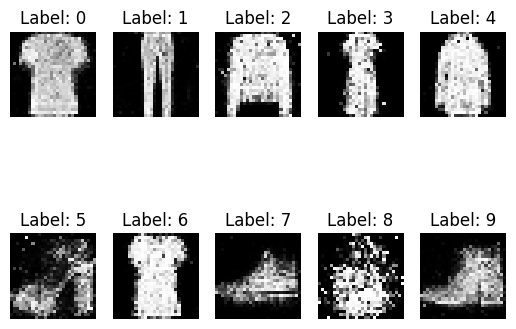

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 17801
4/4 [==============================] - 0s 3ms/step
Iteration : 17802
4/4 [==============================] - 0s 3ms/step
Iteration : 17803
4/4 [==============================] - 0s 3ms/step
Iteration : 17804
4/4 [==============================] - 0s 3ms/step
Iteration : 17805
4/4 [==============================] - 0s 3ms/step
Iteration : 17806
4/4 [==============================] - 0s 4ms/step
Iteration : 17807
4/4 [==============================] - 0s 3ms/step
Iteration : 17808
4/4 [==============================] - 0s 3ms/step
Iteration : 17809
4/4 [==============================] - 0s 4ms/step
Iteration : 17810
4/4 [==============================] - 0s 3ms/step
Iteration : 17811
4/4 [==============================] - 0s 3ms/step
Iteration : 17812
4/4 [==============================] - 0s 3ms/step
Iteration : 17813
4/4 [==============================] - 0s 3ms/step
Iterati

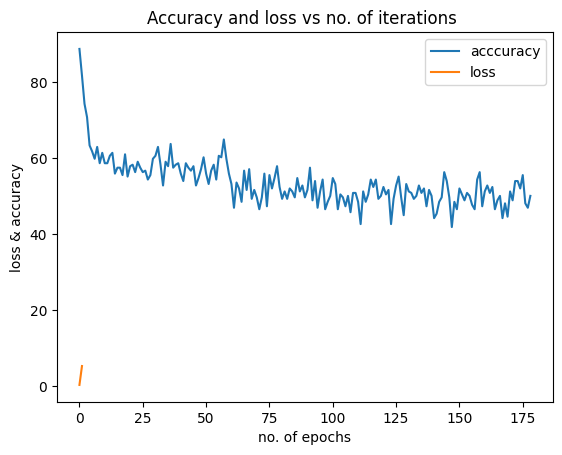

1/1 [==============================] - 0s 26ms/step


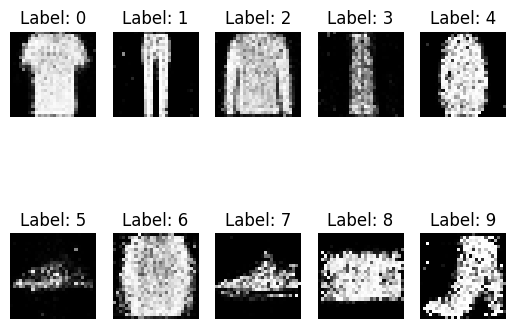

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 17901
4/4 [==============================] - 0s 3ms/step
Iteration : 17902
4/4 [==============================] - 0s 3ms/step
Iteration : 17903
4/4 [==============================] - 0s 3ms/step
Iteration : 17904
4/4 [==============================] - 0s 4ms/step
Iteration : 17905
4/4 [==============================] - 0s 4ms/step
Iteration : 17906
4/4 [==============================] - 0s 4ms/step
Iteration : 17907
4/4 [==============================] - 0s 7ms/step
Iteration : 17908
4/4 [==============================] - 0s 5ms/step
Iteration : 17909
4/4 [==============================] - 0s 3ms/step
Iteration : 17910
4/4 [==============================] - 0s 4ms/step
Iteration : 17911
4/4 [==============================] - 0s 3ms/step
Iteration : 17912
4/4 [==============================] - 0s 4ms/step
Iteration : 17913
4/4 [==============================] - 0s 4ms/step
Iterati

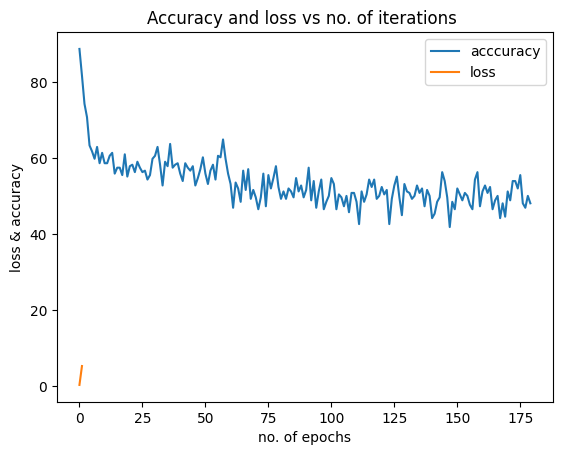

1/1 [==============================] - 0s 34ms/step


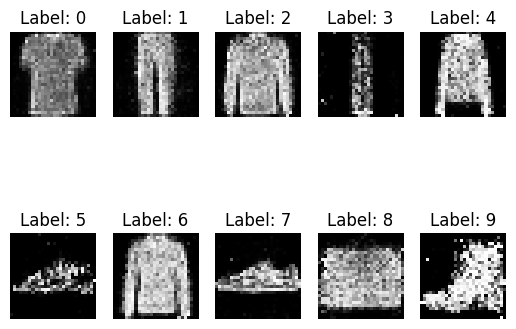

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 18001
4/4 [==============================] - 0s 4ms/step
Iteration : 18002
4/4 [==============================] - 0s 4ms/step
Iteration : 18003
4/4 [==============================] - 0s 4ms/step
Iteration : 18004
4/4 [==============================] - 0s 4ms/step
Iteration : 18005
4/4 [==============================] - 0s 4ms/step
Iteration : 18006
4/4 [==============================] - 0s 3ms/step
Iteration : 18007
4/4 [==============================] - 0s 3ms/step
Iteration : 18008
4/4 [==============================] - 0s 4ms/step
Iteration : 18009
4/4 [==============================] - 0s 4ms/step
Iteration : 18010
4/4 [==============================] - 0s 4ms/step
Iteration : 18011
4/4 [==============================] - 0s 3ms/step
Iteration : 18012
4/4 [==============================] - 0s 4ms/step
Iteration : 18013
4/4 [==============================] - 0s 3ms/step
Iterati

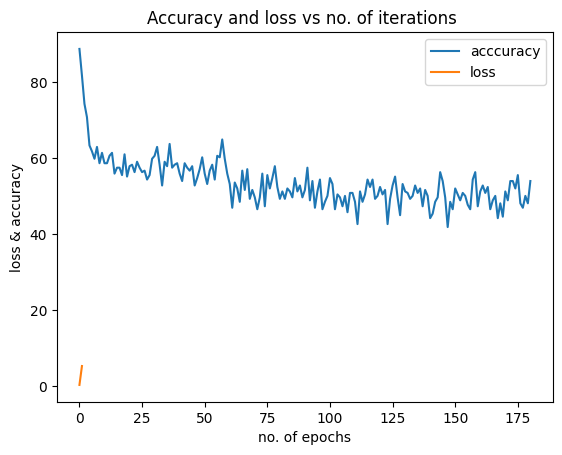

1/1 [==============================] - 0s 26ms/step


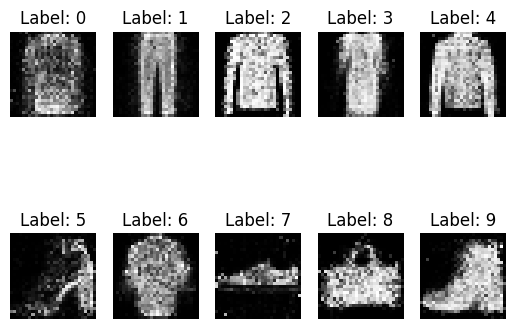

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 18101
4/4 [==============================] - 0s 5ms/step
Iteration : 18102
4/4 [==============================] - 0s 3ms/step
Iteration : 18103
4/4 [==============================] - 0s 3ms/step
Iteration : 18104
4/4 [==============================] - 0s 3ms/step
Iteration : 18105
4/4 [==============================] - 0s 4ms/step
Iteration : 18106
4/4 [==============================] - 0s 3ms/step
Iteration : 18107
4/4 [==============================] - 0s 3ms/step
Iteration : 18108
4/4 [==============================] - 0s 3ms/step
Iteration : 18109
4/4 [==============================] - 0s 4ms/step
Iteration : 18110
4/4 [==============================] - 0s 3ms/step
Iteration : 18111
4/4 [==============================] - 0s 3ms/step
Iteration : 18112
4/4 [==============================] - 0s 4ms/step
Iteration : 18113
4/4 [==============================] - 0s 3ms/step
Iterati

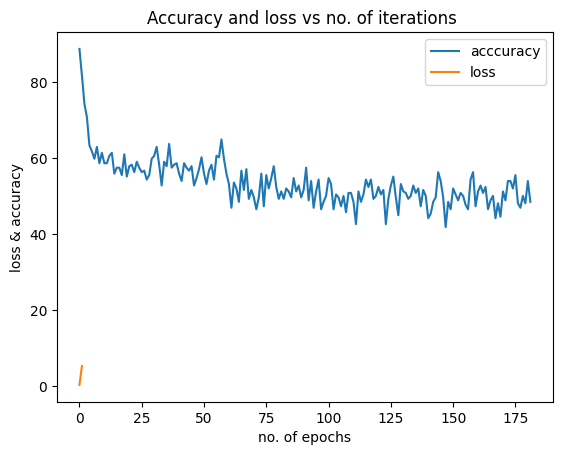

1/1 [==============================] - 0s 27ms/step


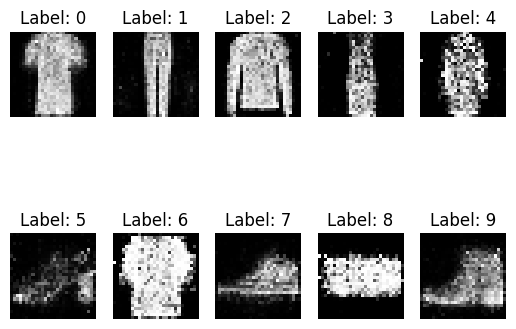

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 18201
4/4 [==============================] - 0s 4ms/step
Iteration : 18202
4/4 [==============================] - 0s 3ms/step
Iteration : 18203
4/4 [==============================] - 0s 3ms/step
Iteration : 18204
4/4 [==============================] - 0s 3ms/step
Iteration : 18205
4/4 [==============================] - 0s 3ms/step
Iteration : 18206
4/4 [==============================] - 0s 3ms/step
Iteration : 18207
4/4 [==============================] - 0s 3ms/step
Iteration : 18208
4/4 [==============================] - 0s 4ms/step
Iteration : 18209
4/4 [==============================] - 0s 3ms/step
Iteration : 18210
4/4 [==============================] - 0s 3ms/step
Iteration : 18211
4/4 [==============================] - 0s 4ms/step
Iteration : 18212
4/4 [==============================] - 0s 3ms/step
Iteration : 18213
4/4 [==============================] - 0s 4ms/step
Iterati

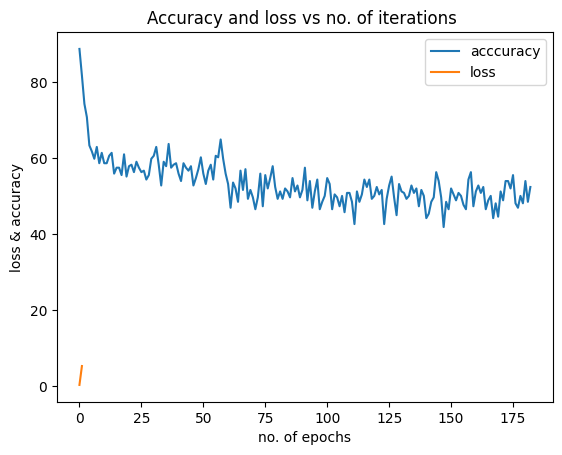

1/1 [==============================] - 0s 26ms/step


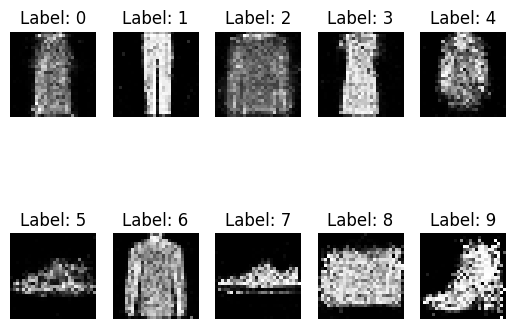

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 18301
4/4 [==============================] - 0s 5ms/step
Iteration : 18302
4/4 [==============================] - 0s 2ms/step
Iteration : 18303
4/4 [==============================] - 0s 3ms/step
Iteration : 18304
4/4 [==============================] - 0s 4ms/step
Iteration : 18305
4/4 [==============================] - 0s 3ms/step
Iteration : 18306
4/4 [==============================] - 0s 5ms/step
Iteration : 18307
4/4 [==============================] - 0s 5ms/step
Iteration : 18308
4/4 [==============================] - 0s 5ms/step
Iteration : 18309
4/4 [==============================] - 0s 4ms/step
Iteration : 18310
4/4 [==============================] - 0s 5ms/step
Iteration : 18311
4/4 [==============================] - 0s 5ms/step
Iteration : 18312
4/4 [==============================] - 0s 4ms/step
Iteration : 18313
4/4 [==============================] - 0s 4ms/step
Iterati

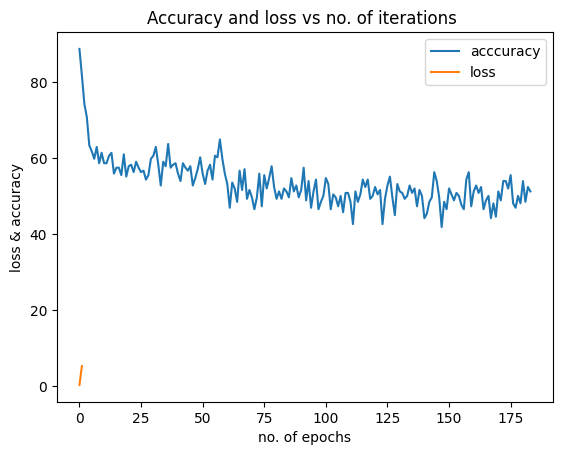

1/1 [==============================] - 0s 28ms/step


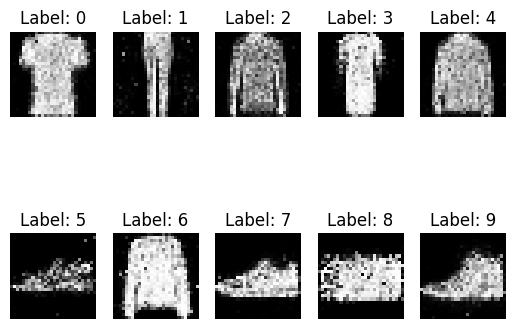

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 18401
4/4 [==============================] - 0s 3ms/step
Iteration : 18402
4/4 [==============================] - 0s 3ms/step
Iteration : 18403
4/4 [==============================] - 0s 3ms/step
Iteration : 18404
4/4 [==============================] - 0s 3ms/step
Iteration : 18405
4/4 [==============================] - 0s 3ms/step
Iteration : 18406
4/4 [==============================] - 0s 3ms/step
Iteration : 18407
4/4 [==============================] - 0s 4ms/step
Iteration : 18408
4/4 [==============================] - 0s 4ms/step
Iteration : 18409
4/4 [==============================] - 0s 3ms/step
Iteration : 18410
4/4 [==============================] - 0s 4ms/step
Iteration : 18411
4/4 [==============================] - 0s 3ms/step
Iteration : 18412
4/4 [==============================] - 0s 3ms/step
Iteration : 18413
4/4 [==============================] - 0s 3ms/step
Iterati

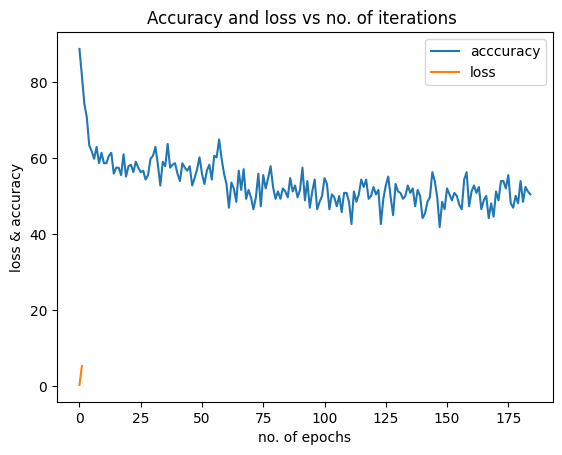

1/1 [==============================] - 0s 27ms/step


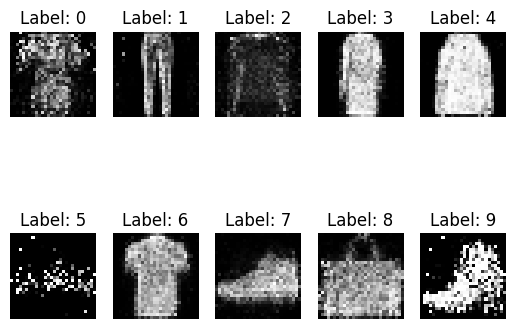

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 18501
4/4 [==============================] - 0s 4ms/step
Iteration : 18502
4/4 [==============================] - 0s 3ms/step
Iteration : 18503
4/4 [==============================] - 0s 3ms/step
Iteration : 18504
4/4 [==============================] - 0s 3ms/step
Iteration : 18505
4/4 [==============================] - 0s 3ms/step
Iteration : 18506
4/4 [==============================] - 0s 2ms/step
Iteration : 18507
4/4 [==============================] - 0s 3ms/step
Iteration : 18508
4/4 [==============================] - 0s 4ms/step
Iteration : 18509
4/4 [==============================] - 0s 3ms/step
Iteration : 18510
4/4 [==============================] - 0s 4ms/step
Iteration : 18511
4/4 [==============================] - 0s 3ms/step
Iteration : 18512
4/4 [==============================] - 0s 3ms/step
Iteration : 18513
4/4 [==============================] - 0s 3ms/step
Iterati

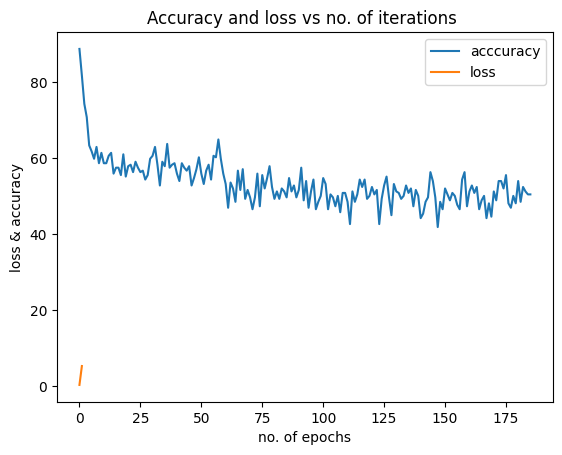

1/1 [==============================] - 0s 26ms/step


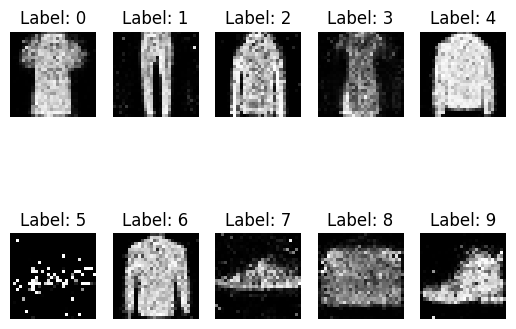

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 18601
4/4 [==============================] - 0s 3ms/step
Iteration : 18602
4/4 [==============================] - 0s 4ms/step
Iteration : 18603
4/4 [==============================] - 0s 3ms/step
Iteration : 18604
4/4 [==============================] - 0s 4ms/step
Iteration : 18605
4/4 [==============================] - 0s 3ms/step
Iteration : 18606
4/4 [==============================] - 0s 3ms/step
Iteration : 18607
4/4 [==============================] - 0s 3ms/step
Iteration : 18608
4/4 [==============================] - 0s 3ms/step
Iteration : 18609
4/4 [==============================] - 0s 4ms/step
Iteration : 18610
4/4 [==============================] - 0s 3ms/step
Iteration : 18611
4/4 [==============================] - 0s 3ms/step
Iteration : 18612
4/4 [==============================] - 0s 3ms/step
Iteration : 18613
4/4 [==============================] - 0s 3ms/step
Iterati

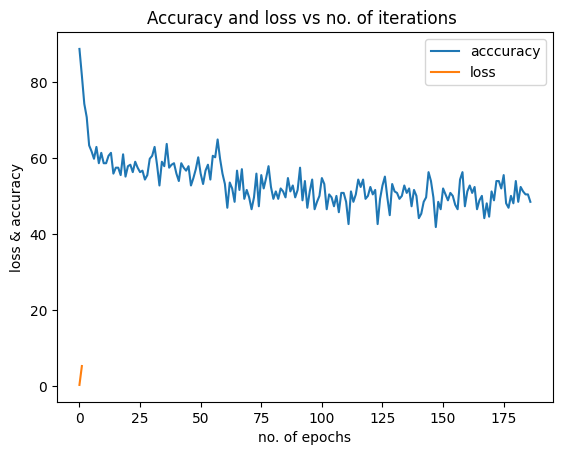

1/1 [==============================] - 0s 32ms/step


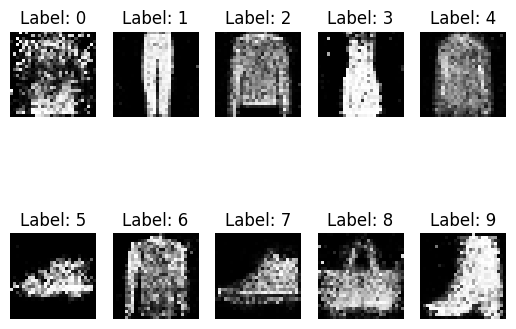

The model structure and weights were saved. 
4/4 [==============================] - 0s 4ms/step
Iteration : 18701
4/4 [==============================] - 0s 5ms/step
Iteration : 18702
4/4 [==============================] - 0s 3ms/step
Iteration : 18703
4/4 [==============================] - 0s 4ms/step
Iteration : 18704
4/4 [==============================] - 0s 5ms/step
Iteration : 18705
4/4 [==============================] - 0s 5ms/step
Iteration : 18706
4/4 [==============================] - 0s 3ms/step
Iteration : 18707
4/4 [==============================] - 0s 3ms/step
Iteration : 18708
4/4 [==============================] - 0s 4ms/step
Iteration : 18709
4/4 [==============================] - 0s 4ms/step
Iteration : 18710
4/4 [==============================] - 0s 3ms/step
Iteration : 18711
4/4 [==============================] - 0s 4ms/step
Iteration : 18712
4/4 [==============================] - 0s 3ms/step
Iteration : 18713
4/4 [==============================] - 0s 3ms/step
Iterati

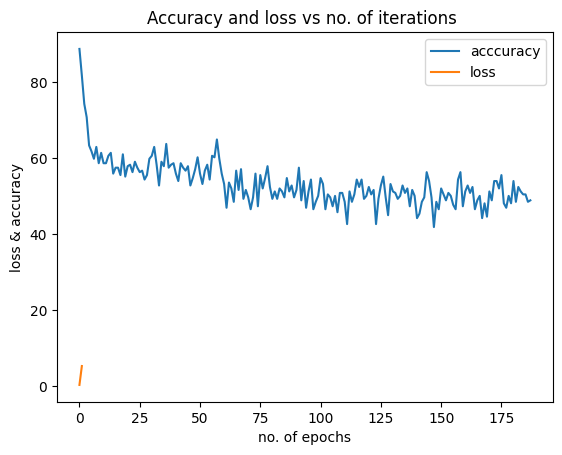

1/1 [==============================] - 0s 30ms/step


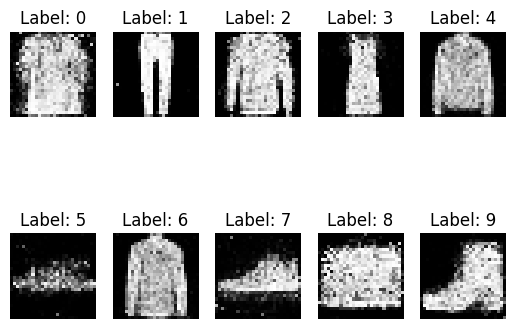

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 18801
4/4 [==============================] - 0s 3ms/step
Iteration : 18802
4/4 [==============================] - 0s 5ms/step
Iteration : 18803
4/4 [==============================] - 0s 3ms/step
Iteration : 18804
4/4 [==============================] - 0s 3ms/step
Iteration : 18805
4/4 [==============================] - 0s 4ms/step
Iteration : 18806
4/4 [==============================] - 0s 4ms/step
Iteration : 18807
4/4 [==============================] - 0s 3ms/step
Iteration : 18808
4/4 [==============================] - 0s 5ms/step
Iteration : 18809
4/4 [==============================] - 0s 3ms/step
Iteration : 18810
4/4 [==============================] - 0s 3ms/step
Iteration : 18811
4/4 [==============================] - 0s 3ms/step
Iteration : 18812
4/4 [==============================] - 0s 3ms/step
Iteration : 18813
4/4 [==============================] - 0s 3ms/step
Iterati

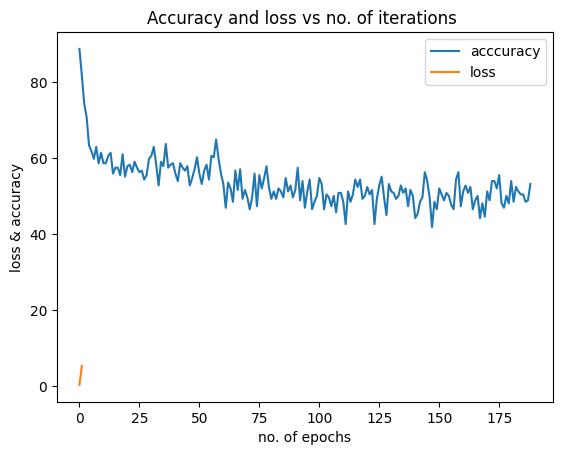

1/1 [==============================] - 0s 25ms/step


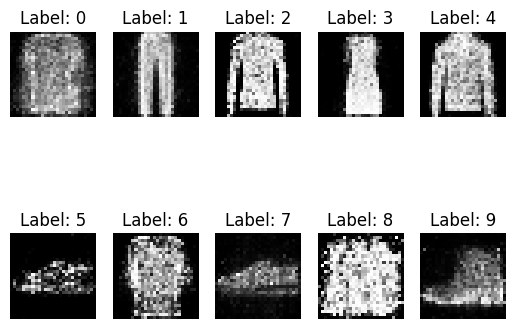

The model structure and weights were saved. 
4/4 [==============================] - 0s 3ms/step
Iteration : 18901
4/4 [==============================] - 0s 3ms/step
Iteration : 18902
4/4 [==============================] - 0s 4ms/step
Iteration : 18903
4/4 [==============================] - 0s 3ms/step
Iteration : 18904
4/4 [==============================] - 0s 3ms/step
Iteration : 18905
4/4 [==============================] - 0s 3ms/step
Iteration : 18906
4/4 [==============================] - 0s 3ms/step
Iteration : 18907
4/4 [==============================] - 0s 3ms/step
Iteration : 18908
4/4 [==============================] - 0s 3ms/step
Iteration : 18909
4/4 [==============================] - 0s 3ms/step
Iteration : 18910
4/4 [==============================] - 0s 3ms/step
Iteration : 18911
4/4 [==============================] - 0s 7ms/step
Iteration : 18912
4/4 [==============================] - 0s 3ms/step
Iteration : 18913
4/4 [==============================] - 0s 3ms/step
Iterati

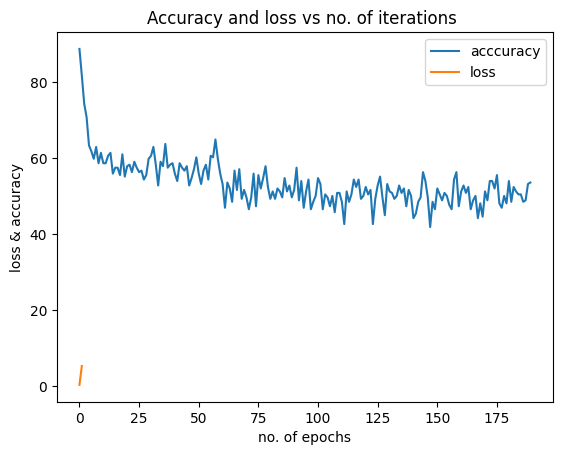

1/1 [==============================] - 0s 29ms/step


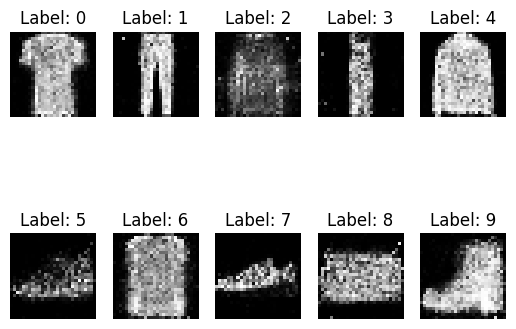

The model structure and weights were saved. 


In [17]:
train_cgan()

# training of discriminator with real image and real image label is done

# Training the combined GAN model with fake images

# USING THE GENERATED MODEL

In [18]:
# generating images from the random noise using pre-trained model(gan generator)

In [19]:
from keras.models import model_from_json

# load the json file
model_json_file = open("saved_models/cgan_fashion_model.json","r")
loaded_model_json = model_json_file.read()
model_json_file.close()

#create the model from json
loaded_cgan_model = model_from_json(loaded_model_json)

#load the weights into the model
loaded_cgan_model.load_weights("saved_models/cgan_fashion_model_weights.h5")

print("The model and weights were loaded successfully")



The model and weights were loaded successfully


1/1 [==============================] - 0s 113ms/step


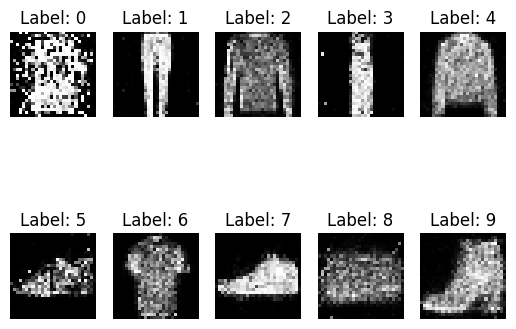

In [20]:
sample_images(loaded_cgan_model)